In [1]:
from tensorflow.keras.layers import Flatten, Dense, Input, Lambda, Conv2D, MaxPooling2D
from tensorflow.keras.applications.resnet_v2 import ResNet50V2, preprocess_input
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import load_img,ImageDataGenerator, img_to_array
import tensorflow as tf

import numpy as np
from glob import glob
import os
import matplotlib.pyplot as plt 

In [2]:
train_augmentation = ImageDataGenerator(
    rescale = 1./255,
    shear_range = 0.2,
    horizontal_flip = True,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
)

test_rescale = ImageDataGenerator(
    rescale = 1./255
)

train_path = '../data/shonal/train'
valid_path = '../data/shonal/test'
training = train_augmentation.flow_from_directory(train_path,
                                                 target_size = (64,64),
                                                 batch_size = 8,
                                                 class_mode = 'binary')
testing = test_rescale.flow_from_directory(valid_path,
                                               target_size = (64,64),
                                               batch_size = 8,
                                               class_mode = 'binary')

Found 1406 images belonging to 2 classes.
Found 352 images belonging to 2 classes.


In [3]:
IMAGE_SIZE = [64,64]

resnet50v2 = tf.keras.applications.ResNet50V2(weights='imagenet',
                                              include_top = False,
                                              classes = 2
                                              #input_shape=(64,64,3)
                                             )

for layer in resnet50v2.layers:
    layer.trainable = False
    
resnet50v2.summary()

output = resnet50v2.output
output2 = tf.keras.layers.GlobalAveragePooling2D()(output)
output3 = tf.keras.layers.Dense(128,activation='relu')(output2)
y = tf.keras.layers.Dense(1,activation='sigmoid')(output3)
resnet50v2model = tf.keras.Model(inputs=resnet50v2.input, outputs=y)
resnet50v2model.compile(loss='binary_crossentropy', 
                        optimizer='adam',
                        metrics=['accuracy',tf.keras.metrics.Precision(),tf.keras.metrics.Recall()])

hist = resnet50v2model.fit(training,
                validation_data = testing,
                epochs = 20,
                steps_per_epoch=len(training),
                validation_steps=len(testing))

Model: "resnet50v2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, None, None,   0           ['input_1[0][0]']                
                                3)                                                                
                                                                                                  
 conv1_conv (Conv2D)            (None, None, None,   9472        ['conv1_pad[0][0]']              
                                64)                                                      

                                                                                                  
 conv2_block2_out (Add)         (None, None, None,   0           ['conv2_block1_out[0][0]',       
                                256)                              'conv2_block2_3_conv[0][0]']    
                                                                                                  
 conv2_block3_preact_bn (BatchN  (None, None, None,   1024       ['conv2_block2_out[0][0]']       
 ormalization)                  256)                                                              
                                                                                                  
 conv2_block3_preact_relu (Acti  (None, None, None,   0          ['conv2_block3_preact_bn[0][0]'] 
 vation)                        256)                                                              
                                                                                                  
 conv2_blo

                                128)                             ]                                
                                                                                                  
 conv3_block2_1_bn (BatchNormal  (None, None, None,   512        ['conv3_block2_1_conv[0][0]']    
 ization)                       128)                                                              
                                                                                                  
 conv3_block2_1_relu (Activatio  (None, None, None,   0          ['conv3_block2_1_bn[0][0]']      
 n)                             128)                                                              
                                                                                                  
 conv3_block2_2_pad (ZeroPaddin  (None, None, None,   0          ['conv3_block2_1_relu[0][0]']    
 g2D)                           128)                                                              
          

 conv3_block4_2_relu (Activatio  (None, None, None,   0          ['conv3_block4_2_bn[0][0]']      
 n)                             128)                                                              
                                                                                                  
 max_pooling2d_1 (MaxPooling2D)  (None, None, None,   0          ['conv3_block3_out[0][0]']       
                                512)                                                              
                                                                                                  
 conv3_block4_3_conv (Conv2D)   (None, None, None,   66048       ['conv3_block4_2_relu[0][0]']    
                                512)                                                              
                                                                                                  
 conv3_block4_out (Add)         (None, None, None,   0           ['max_pooling2d_1[0][0]',        
          

                                                                                                  
 conv4_block3_preact_relu (Acti  (None, None, None,   0          ['conv4_block3_preact_bn[0][0]'] 
 vation)                        1024)                                                             
                                                                                                  
 conv4_block3_1_conv (Conv2D)   (None, None, None,   262144      ['conv4_block3_preact_relu[0][0]'
                                256)                             ]                                
                                                                                                  
 conv4_block3_1_bn (BatchNormal  (None, None, None,   1024       ['conv4_block3_1_conv[0][0]']    
 ization)                       256)                                                              
                                                                                                  
 conv4_blo

                                256)                                                              
                                                                                                  
 conv4_block5_2_bn (BatchNormal  (None, None, None,   1024       ['conv4_block5_2_conv[0][0]']    
 ization)                       256)                                                              
                                                                                                  
 conv4_block5_2_relu (Activatio  (None, None, None,   0          ['conv4_block5_2_bn[0][0]']      
 n)                             256)                                                              
                                                                                                  
 conv4_block5_3_conv (Conv2D)   (None, None, None,   263168      ['conv4_block5_2_relu[0][0]']    
                                1024)                                                             
          

 conv5_block1_out (Add)         (None, None, None,   0           ['conv5_block1_0_conv[0][0]',    
                                2048)                             'conv5_block1_3_conv[0][0]']    
                                                                                                  
 conv5_block2_preact_bn (BatchN  (None, None, None,   8192       ['conv5_block1_out[0][0]']       
 ormalization)                  2048)                                                             
                                                                                                  
 conv5_block2_preact_relu (Acti  (None, None, None,   0          ['conv5_block2_preact_bn[0][0]'] 
 vation)                        2048)                                                             
                                                                                                  
 conv5_block2_1_conv (Conv2D)   (None, None, None,   1048576     ['conv5_block2_preact_relu[0][0]'
          

176/176 [==============================] - 5s 30ms/step - loss: 0.0520 - accuracy: 0.9780 - precision: 0.9447 - recall: 0.9336 - val_loss: 0.0783 - val_accuracy: 0.9773 - val_precision: 0.9000 - val_recall: 0.9844
Epoch 4/20
176/176 [==============================] - 5s 29ms/step - loss: 0.0680 - accuracy: 0.9801 - precision: 0.9453 - recall: 0.9453 - val_loss: 0.0665 - val_accuracy: 0.9830 - val_precision: 0.9265 - val_recall: 0.9844
Epoch 5/20
176/176 [==============================] - 5s 30ms/step - loss: 0.0450 - accuracy: 0.9879 - precision: 0.9614 - recall: 0.9727 - val_loss: 0.0565 - val_accuracy: 0.9886 - val_precision: 0.9545 - val_recall: 0.9844
Epoch 6/20
176/176 [==============================] - 5s 29ms/step - loss: 0.0424 - accuracy: 0.9865 - precision: 0.9611 - recall: 0.9648 - val_loss: 0.0510 - val_accuracy: 0.9858 - val_precision: 0.9538 - val_recall: 0.9688
Epoch 7/20
176/176 [==============================] - 5s 29ms/step - loss: 0.0462 - accuracy: 0.9787 - precisio

In [4]:
train_score = resnet50v2model.evaluate(training)
test_score = resnet50v2model.evaluate(testing)
print("train accuracy:",train_score[1]*100,"%")
print("test accuracy:", test_score[1]*100,"%")

44/44 [==============================] - 1s 20ms/step - loss: 0.0536 - accuracy: 0.9886 - precision: 0.9545 - recall: 0.9844
train accuracy: 98.36415648460388 %
test accuracy: 98.86363744735718 %


In [5]:
unlabeled_path = "../data/shonal_unlabeled/unlabeled"

----------------------------------------------------------------------16 is a predicted river
----------------------------------------------------------------------17 is a predicted river
----------------------------------------------------------------------54 is a predicted river
----------------------------------------------------------------------89 is a predicted river
----------------------------------------------------------------------99 is a predicted river
----------------------------------------------------------------------107 is a predicted river
----------------------------------------------------------------------114 is a predicted river
----------------------------------------------------------------------140 is a predicted river
----------------------------------------------------------------------151 is a predicted river
----------------------------------------------------------------------175 is a predicted river
-------------------------------------------------------

----------------------------------------------------------------------1376 is a predicted river
----------------------------------------------------------------------1401 is a predicted river
----------------------------------------------------------------------1405 is a predicted river
----------------------------------------------------------------------1408 is a predicted river
----------------------------------------------------------------------1419 is a predicted river
----------------------------------------------------------------------1420 is a predicted river
----------------------------------------------------------------------1455 is a predicted river
----------------------------------------------------------------------1479 is a predicted river
----------------------------------------------------------------------1483 is a predicted river
----------------------------------------------------------------------1522 is a predicted river
----------------------------------------

----------------------------------------------------------------------3415 is a predicted river
----------------------------------------------------------------------3444 is a predicted river
----------------------------------------------------------------------3470 is a predicted river
----------------------------------------------------------------------3526 is a predicted river
----------------------------------------------------------------------3540 is a predicted river
----------------------------------------------------------------------3577 is a predicted river
----------------------------------------------------------------------3636 is a predicted river
----------------------------------------------------------------------3637 is a predicted river
----------------------------------------------------------------------3638 is a predicted river
----------------------------------------------------------------------3641 is a predicted river
----------------------------------------

----------------------------------------------------------------------4880 is a predicted river
----------------------------------------------------------------------4906 is a predicted river
----------------------------------------------------------------------4923 is a predicted river
----------------------------------------------------------------------4933 is a predicted river
----------------------------------------------------------------------5018 is a predicted river
----------------------------------------------------------------------5026 is a predicted river
----------------------------------------------------------------------5082 is a predicted river
----------------------------------------------------------------------5121 is a predicted river
----------------------------------------------------------------------5124 is a predicted river
----------------------------------------------------------------------5127 is a predicted river
----------------------------------------

----------------------------------------------------------------------6642 is a predicted river
----------------------------------------------------------------------6648 is a predicted river
----------------------------------------------------------------------6653 is a predicted river
----------------------------------------------------------------------6677 is a predicted river
----------------------------------------------------------------------6683 is a predicted river
----------------------------------------------------------------------6691 is a predicted river
----------------------------------------------------------------------6703 is a predicted river
----------------------------------------------------------------------6710 is a predicted river
----------------------------------------------------------------------6715 is a predicted river
----------------------------------------------------------------------6741 is a predicted river
----------------------------------------

----------------------------------------------------------------------8223 is a predicted river
----------------------------------------------------------------------8224 is a predicted river
----------------------------------------------------------------------8229 is a predicted river
----------------------------------------------------------------------8235 is a predicted river
----------------------------------------------------------------------8265 is a predicted river
----------------------------------------------------------------------8266 is a predicted river
----------------------------------------------------------------------8297 is a predicted river
----------------------------------------------------------------------8312 is a predicted river
----------------------------------------------------------------------8317 is a predicted river
----------------------------------------------------------------------8336 is a predicted river
----------------------------------------

----------------------------------------------------------------------9448 is a predicted river
----------------------------------------------------------------------9465 is a predicted river
----------------------------------------------------------------------9482 is a predicted river
----------------------------------------------------------------------9484 is a predicted river
----------------------------------------------------------------------9493 is a predicted river
----------------------------------------------------------------------9494 is a predicted river
----------------------------------------------------------------------9500 is a predicted river
----------------------------------------------------------------------9515 is a predicted river
----------------------------------------------------------------------9522 is a predicted river
----------------------------------------------------------------------9531 is a predicted river
----------------------------------------

----------------------------------------------------------------------10969 is a predicted river
----------------------------------------------------------------------10992 is a predicted river
----------------------------------------------------------------------11013 is a predicted river
----------------------------------------------------------------------11041 is a predicted river
----------------------------------------------------------------------11042 is a predicted river
----------------------------------------------------------------------11050 is a predicted river
----------------------------------------------------------------------11065 is a predicted river
----------------------------------------------------------------------11074 is a predicted river
----------------------------------------------------------------------11096 is a predicted river
----------------------------------------------------------------------11103 is a predicted river
------------------------------

----------------------------------------------------------------------12519 is a predicted river
----------------------------------------------------------------------12580 is a predicted river
----------------------------------------------------------------------12595 is a predicted river
----------------------------------------------------------------------12673 is a predicted river
----------------------------------------------------------------------12745 is a predicted river
----------------------------------------------------------------------12772 is a predicted river
----------------------------------------------------------------------12788 is a predicted river
----------------------------------------------------------------------12789 is a predicted river
----------------------------------------------------------------------12797 is a predicted river
----------------------------------------------------------------------12812 is a predicted river
------------------------------

----------------------------------------------------------------------13772 is a predicted river
----------------------------------------------------------------------13773 is a predicted river
----------------------------------------------------------------------13781 is a predicted river
----------------------------------------------------------------------13804 is a predicted river
----------------------------------------------------------------------13809 is a predicted river
----------------------------------------------------------------------13810 is a predicted river
----------------------------------------------------------------------13837 is a predicted river
----------------------------------------------------------------------13838 is a predicted river
----------------------------------------------------------------------13847 is a predicted river
----------------------------------------------------------------------13851 is a predicted river
------------------------------

----------------------------------------------------------------------14820 is a predicted river
----------------------------------------------------------------------14823 is a predicted river
----------------------------------------------------------------------14831 is a predicted river
----------------------------------------------------------------------14834 is a predicted river
----------------------------------------------------------------------14854 is a predicted river
----------------------------------------------------------------------14859 is a predicted river
----------------------------------------------------------------------14863 is a predicted river
----------------------------------------------------------------------14864 is a predicted river
----------------------------------------------------------------------14876 is a predicted river
----------------------------------------------------------------------14883 is a predicted river
------------------------------

----------------------------------------------------------------------15291 is a predicted river
----------------------------------------------------------------------15301 is a predicted river
----------------------------------------------------------------------15304 is a predicted river
----------------------------------------------------------------------15355 is a predicted river
----------------------------------------------------------------------15360 is a predicted river
----------------------------------------------------------------------15384 is a predicted river
----------------------------------------------------------------------15389 is a predicted river
----------------------------------------------------------------------15394 is a predicted river
----------------------------------------------------------------------15396 is a predicted river
----------------------------------------------------------------------15404 is a predicted river
------------------------------

----------------------------------------------------------------------15970 is a predicted river
----------------------------------------------------------------------15980 is a predicted river
----------------------------------------------------------------------15984 is a predicted river
----------------------------------------------------------------------15986 is a predicted river
----------------------------------------------------------------------16017 is a predicted river
----------------------------------------------------------------------16034 is a predicted river
----------------------------------------------------------------------16038 is a predicted river
----------------------------------------------------------------------16042 is a predicted river
----------------------------------------------------------------------16052 is a predicted river
----------------------------------------------------------------------16054 is a predicted river
------------------------------

----------------------------------------------------------------------16988 is a predicted river
----------------------------------------------------------------------16996 is a predicted river
----------------------------------------------------------------------17003 is a predicted river
----------------------------------------------------------------------17008 is a predicted river
----------------------------------------------------------------------17010 is a predicted river
----------------------------------------------------------------------17012 is a predicted river
----------------------------------------------------------------------17016 is a predicted river
----------------------------------------------------------------------17033 is a predicted river
----------------------------------------------------------------------17051 is a predicted river
----------------------------------------------------------------------17056 is a predicted river
------------------------------

----------------------------------------------------------------------17580 is a predicted river
----------------------------------------------------------------------17595 is a predicted river
----------------------------------------------------------------------17596 is a predicted river
----------------------------------------------------------------------17598 is a predicted river
----------------------------------------------------------------------17617 is a predicted river
----------------------------------------------------------------------17618 is a predicted river
----------------------------------------------------------------------17623 is a predicted river
----------------------------------------------------------------------17642 is a predicted river
----------------------------------------------------------------------17647 is a predicted river
----------------------------------------------------------------------17651 is a predicted river
------------------------------

----------------------------------------------------------------------18425 is a predicted river
----------------------------------------------------------------------18429 is a predicted river
----------------------------------------------------------------------18446 is a predicted river
----------------------------------------------------------------------18466 is a predicted river
----------------------------------------------------------------------18471 is a predicted river
----------------------------------------------------------------------18474 is a predicted river
----------------------------------------------------------------------18554 is a predicted river
----------------------------------------------------------------------18583 is a predicted river
----------------------------------------------------------------------18586 is a predicted river
----------------------------------------------------------------------18598 is a predicted river
------------------------------

----------------------------------------------------------------------19329 is a predicted river
----------------------------------------------------------------------19361 is a predicted river
----------------------------------------------------------------------19414 is a predicted river
----------------------------------------------------------------------19428 is a predicted river
----------------------------------------------------------------------19431 is a predicted river
----------------------------------------------------------------------19458 is a predicted river
----------------------------------------------------------------------19463 is a predicted river
----------------------------------------------------------------------19507 is a predicted river
----------------------------------------------------------------------19546 is a predicted river
----------------------------------------------------------------------19548 is a predicted river
------------------------------

----------------------------------------------------------------------20524 is a predicted river
----------------------------------------------------------------------20531 is a predicted river
----------------------------------------------------------------------20535 is a predicted river
----------------------------------------------------------------------20610 is a predicted river
----------------------------------------------------------------------20624 is a predicted river
----------------------------------------------------------------------20628 is a predicted river
----------------------------------------------------------------------20630 is a predicted river
----------------------------------------------------------------------20645 is a predicted river
----------------------------------------------------------------------20651 is a predicted river
----------------------------------------------------------------------20658 is a predicted river
------------------------------

----------------------------------------------------------------------21212 is a predicted river
----------------------------------------------------------------------21221 is a predicted river
----------------------------------------------------------------------21225 is a predicted river
----------------------------------------------------------------------21233 is a predicted river
----------------------------------------------------------------------21246 is a predicted river
----------------------------------------------------------------------21255 is a predicted river
----------------------------------------------------------------------21256 is a predicted river
----------------------------------------------------------------------21257 is a predicted river
----------------------------------------------------------------------21258 is a predicted river
----------------------------------------------------------------------21267 is a predicted river
------------------------------

----------------------------------------------------------------------22089 is a predicted river
----------------------------------------------------------------------22108 is a predicted river
----------------------------------------------------------------------22119 is a predicted river
----------------------------------------------------------------------22122 is a predicted river
----------------------------------------------------------------------22128 is a predicted river
----------------------------------------------------------------------22149 is a predicted river
----------------------------------------------------------------------22156 is a predicted river
----------------------------------------------------------------------22157 is a predicted river
----------------------------------------------------------------------22158 is a predicted river
----------------------------------------------------------------------22160 is a predicted river
------------------------------

----------------------------------------------------------------------23006 is a predicted river
----------------------------------------------------------------------23007 is a predicted river
----------------------------------------------------------------------23031 is a predicted river
----------------------------------------------------------------------23044 is a predicted river
----------------------------------------------------------------------23045 is a predicted river
----------------------------------------------------------------------23049 is a predicted river
----------------------------------------------------------------------23064 is a predicted river
----------------------------------------------------------------------23086 is a predicted river
----------------------------------------------------------------------23102 is a predicted river
----------------------------------------------------------------------23113 is a predicted river
------------------------------

----------------------------------------------------------------------23748 is a predicted river
----------------------------------------------------------------------23749 is a predicted river
----------------------------------------------------------------------23767 is a predicted river
----------------------------------------------------------------------23770 is a predicted river
----------------------------------------------------------------------23773 is a predicted river
----------------------------------------------------------------------23775 is a predicted river
----------------------------------------------------------------------23803 is a predicted river
----------------------------------------------------------------------23813 is a predicted river
----------------------------------------------------------------------23869 is a predicted river
----------------------------------------------------------------------23874 is a predicted river
------------------------------

----------------------------------------------------------------------24492 is a predicted river
----------------------------------------------------------------------24493 is a predicted river
----------------------------------------------------------------------24494 is a predicted river
----------------------------------------------------------------------24497 is a predicted river
----------------------------------------------------------------------24530 is a predicted river
----------------------------------------------------------------------24565 is a predicted river
----------------------------------------------------------------------24566 is a predicted river
----------------------------------------------------------------------24579 is a predicted river
----------------------------------------------------------------------24580 is a predicted river
----------------------------------------------------------------------24593 is a predicted river
------------------------------

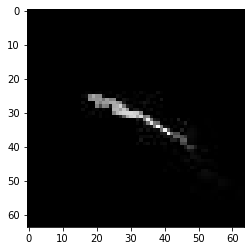

FileNotFoundError: [Errno 2] No such file or directory: '../data/resnet50v2_predicted_threshold90.0/river/16-99.jpeg'

In [6]:
from tensorflow.keras.applications.resnet_v2 import ResNet50V2, preprocess_input, decode_predictions

results = []
rivers = []
other = []
threshold = 0.90
model = resnet50v2model

for i in range(25000):
    img_path = '../data/shonal_unlabeled/unlabeled/'+str(i)+'.jpeg'
    img = image.load_img(img_path, target_size=(64,64))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    # print(model.predict(x))
    results.append(model.predict(x,verbose=0))
    if (model.predict(x,verbose=0) > threshold):
        print("----------------------------------------------------------------------"+str(i)+" is a predicted river")
        
for i in range(len(results)):
    if (results[i][0] >= threshold):
        rivers.append([i,results[i][0]])
    else:
        other.append([i,results[i][0]])
        
print("number of rivers:",len(rivers))
print("number of other:",len(other))



confidence for 16 is 0.99970907


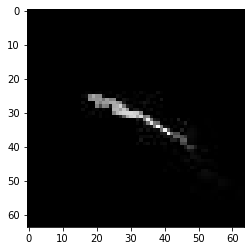

confidence for 17 is 0.9617219


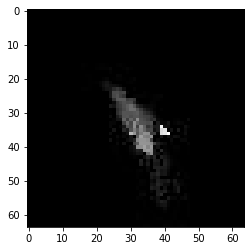

confidence for 54 is 0.999998


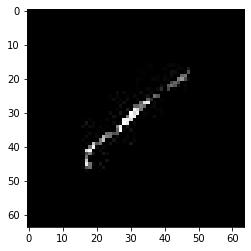

confidence for 89 is 0.9994851


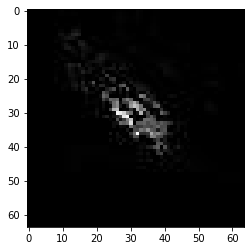

confidence for 99 is 0.9918705


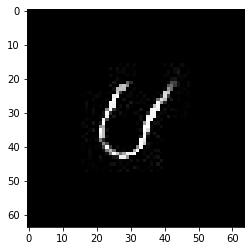

confidence for 107 is 0.9732903


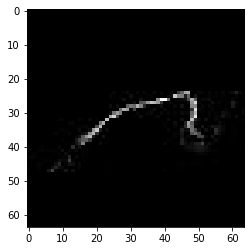

confidence for 114 is 0.99670845


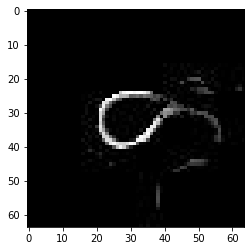

confidence for 140 is 0.9999999


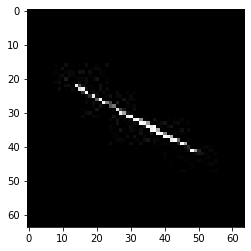

confidence for 151 is 0.94908303


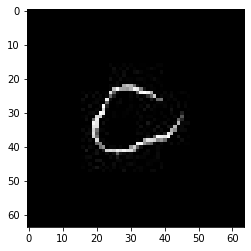

confidence for 175 is 0.99999255


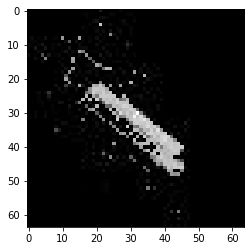

confidence for 209 is 0.9948288


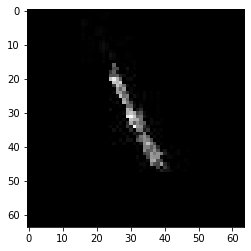

confidence for 211 is 0.983354


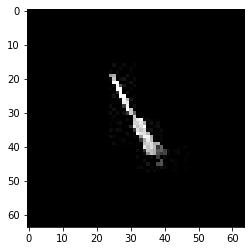

confidence for 219 is 0.9999096


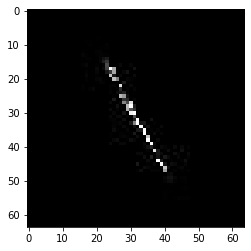

confidence for 296 is 0.999842


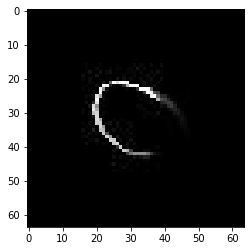

confidence for 334 is 0.99914736


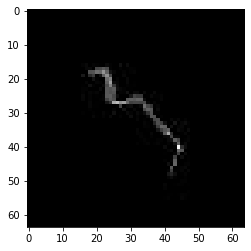

confidence for 336 is 0.9920668


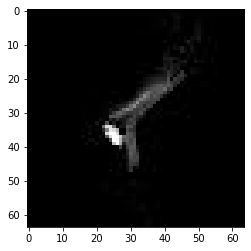

confidence for 343 is 0.9998554


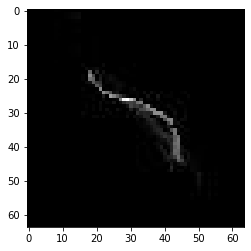

confidence for 357 is 0.97194916


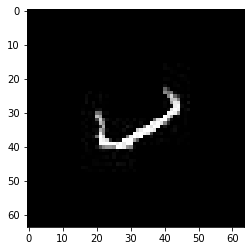

confidence for 368 is 0.99818784


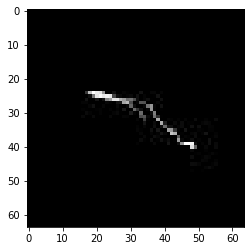

confidence for 379 is 0.9998772


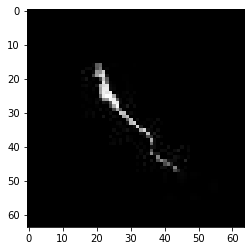

confidence for 449 is 0.9951316


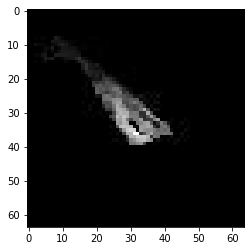

confidence for 484 is 0.9740874


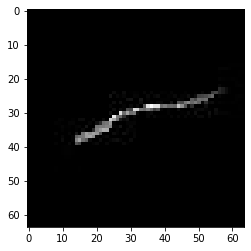

confidence for 594 is 0.90899974


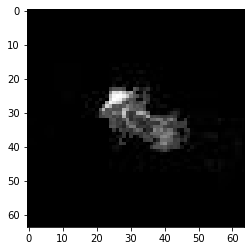

confidence for 618 is 0.97716963


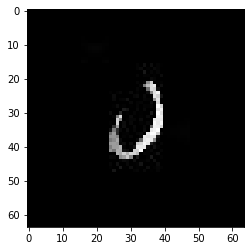

confidence for 621 is 0.9753288


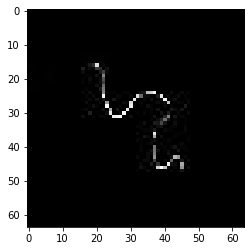

confidence for 639 is 0.9997045


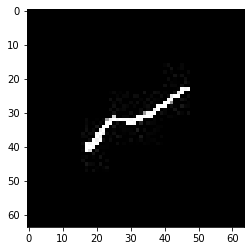

confidence for 644 is 0.991202


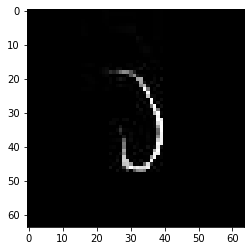

confidence for 648 is 0.99912775


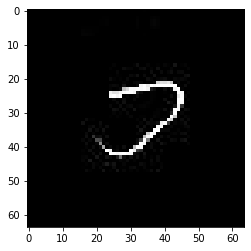

confidence for 676 is 0.9503161


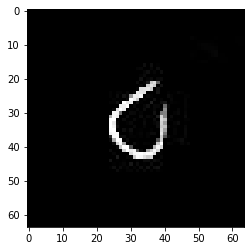

confidence for 688 is 0.9603689


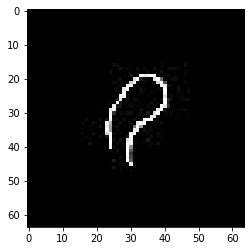

confidence for 702 is 0.9436734


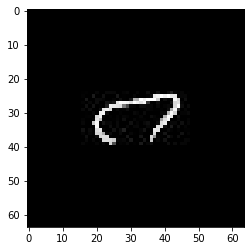

confidence for 707 is 0.9965686


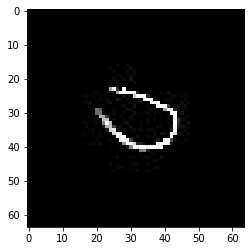

confidence for 741 is 0.9951751


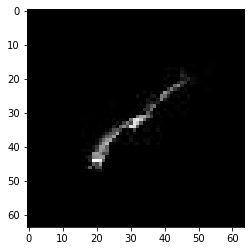

confidence for 746 is 0.97750705


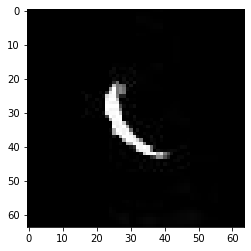

confidence for 770 is 0.98766506


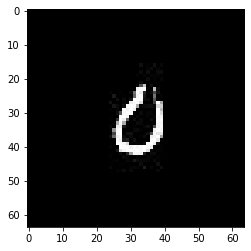

confidence for 797 is 0.9960363


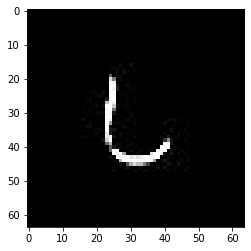

confidence for 798 is 0.9667805


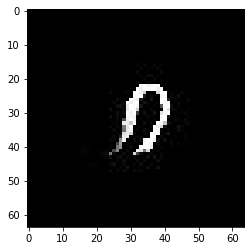

confidence for 816 is 0.9482007


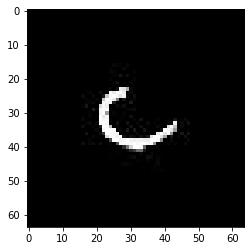

confidence for 818 is 0.9237325


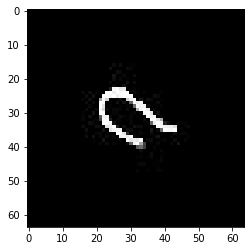

confidence for 827 is 0.93667686


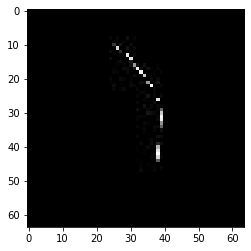

confidence for 839 is 0.96661705


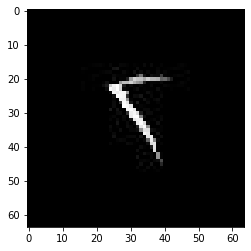

confidence for 841 is 0.99693835


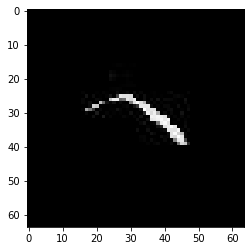

confidence for 873 is 0.94833595


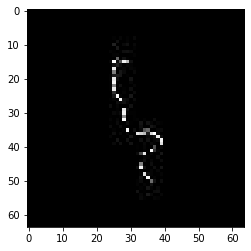

confidence for 876 is 0.9515161


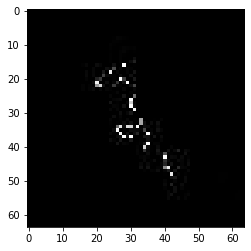

confidence for 879 is 0.9999987


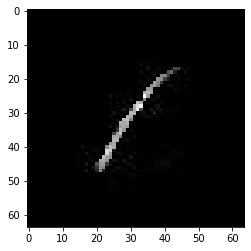

confidence for 894 is 0.999998


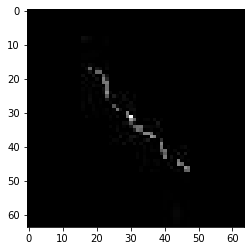

confidence for 910 is 0.95903695


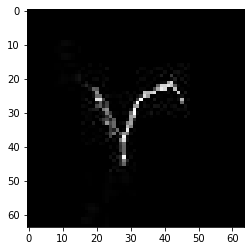

confidence for 944 is 0.9013161


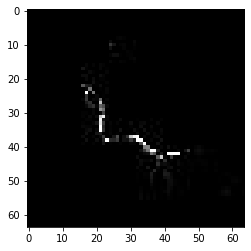

confidence for 946 is 0.9999961


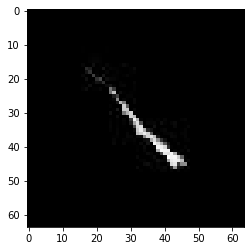

confidence for 947 is 0.9996046


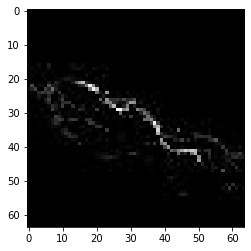

confidence for 972 is 0.99757135


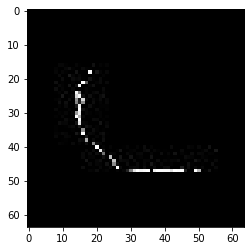

confidence for 976 is 0.9975771


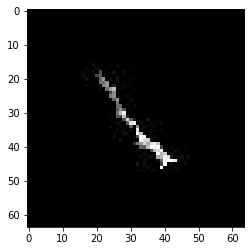

confidence for 982 is 0.9862366


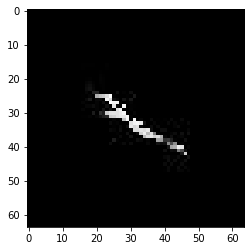

confidence for 994 is 0.9997614


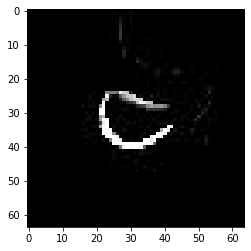

confidence for 995 is 1.0


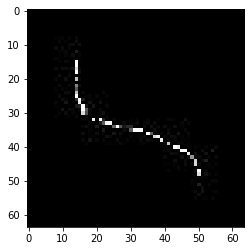

confidence for 1017 is 0.92364025


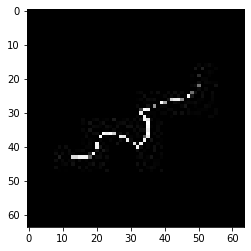

confidence for 1021 is 0.9887141


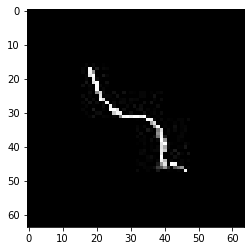

confidence for 1043 is 0.99962234


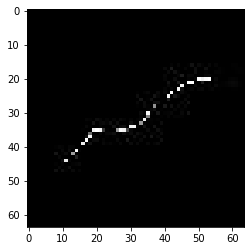

confidence for 1055 is 0.98773474


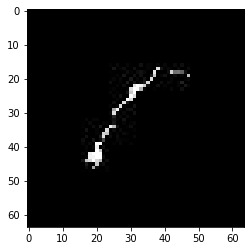

confidence for 1084 is 0.98773706


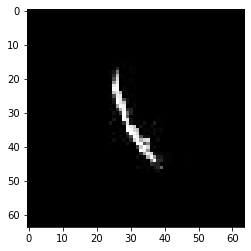

confidence for 1086 is 0.9149613


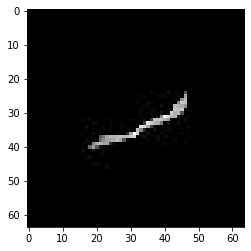

confidence for 1137 is 0.9679041


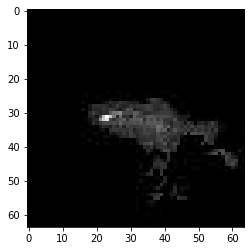

confidence for 1150 is 0.99999994


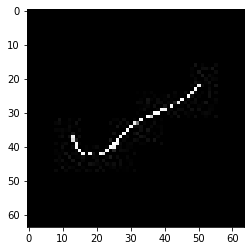

confidence for 1174 is 0.98644155


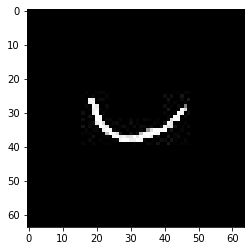

confidence for 1180 is 0.99616325


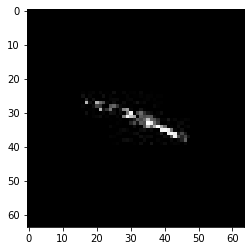

confidence for 1198 is 0.9664283


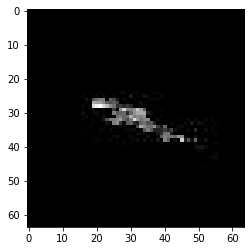

confidence for 1208 is 0.9999673


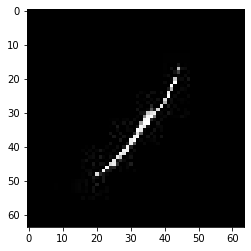

confidence for 1209 is 0.99871916


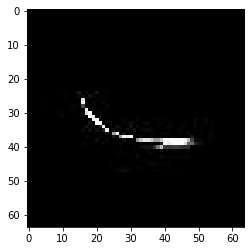

confidence for 1216 is 0.9483071


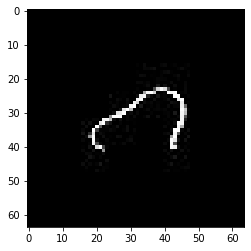

confidence for 1217 is 0.9999891


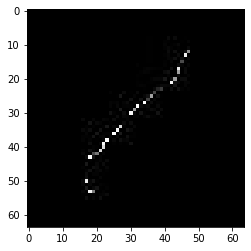

confidence for 1228 is 0.9974484


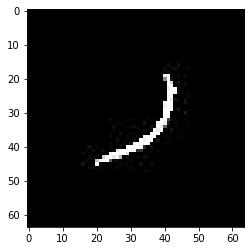

confidence for 1242 is 0.9165286


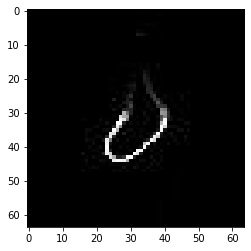

confidence for 1255 is 0.9829229


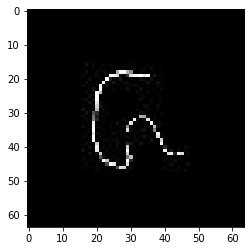

confidence for 1262 is 0.9999987


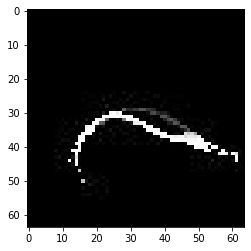

confidence for 1273 is 0.9787857


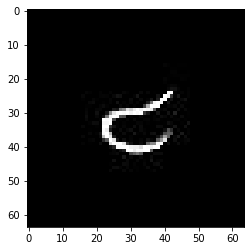

confidence for 1274 is 0.99997324


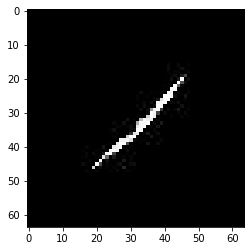

confidence for 1277 is 0.9895165


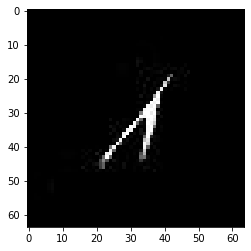

confidence for 1283 is 0.9794127


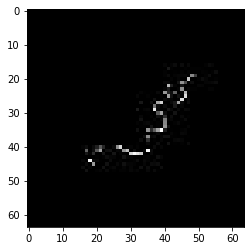

confidence for 1298 is 0.97195286


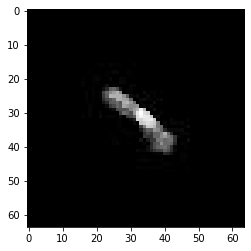

confidence for 1319 is 0.9997692


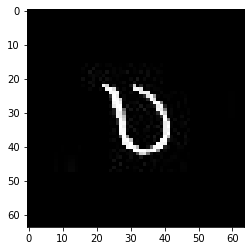

confidence for 1324 is 0.9122606


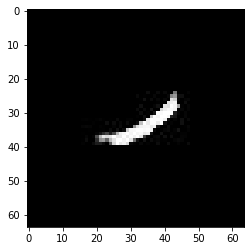

confidence for 1334 is 0.9998928


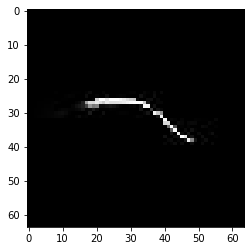

confidence for 1342 is 0.96904796


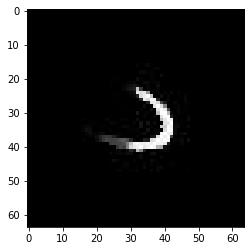

confidence for 1345 is 0.9957944


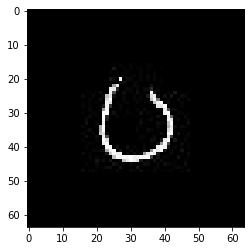

confidence for 1355 is 0.99002165


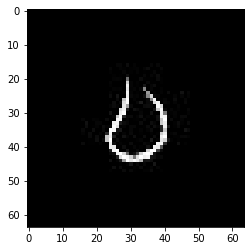

confidence for 1367 is 0.9999833


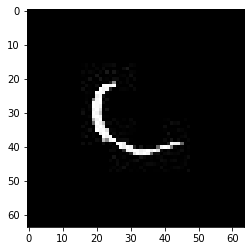

confidence for 1376 is 0.99797094


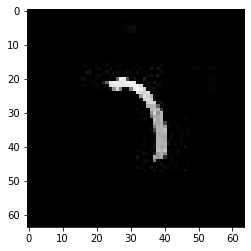

confidence for 1401 is 0.99999976


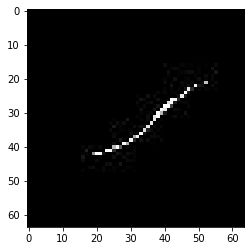

confidence for 1405 is 0.9978193


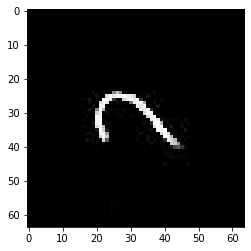

confidence for 1408 is 0.99934083


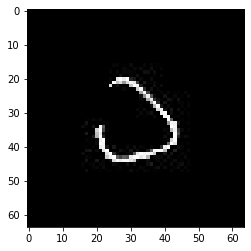

confidence for 1419 is 0.99996245


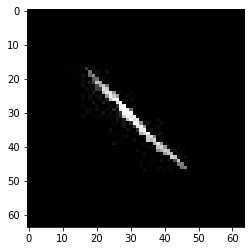

confidence for 1420 is 0.9918934


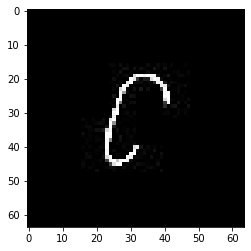

confidence for 1455 is 0.9999794


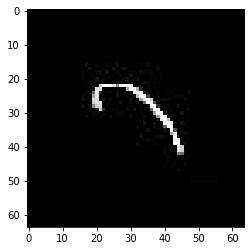

confidence for 1479 is 0.9979188


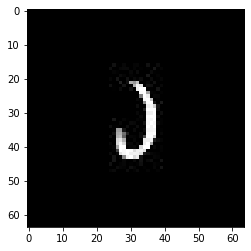

confidence for 1483 is 0.94347185


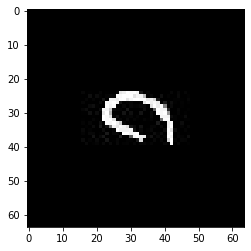

confidence for 1522 is 0.99114954


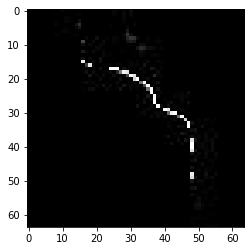

confidence for 1586 is 0.999836


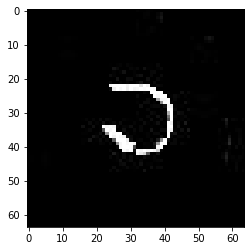

confidence for 1598 is 0.9999913


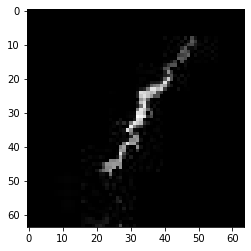

confidence for 1601 is 0.9645506


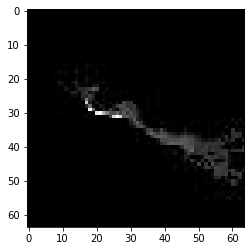

confidence for 1602 is 0.9333651


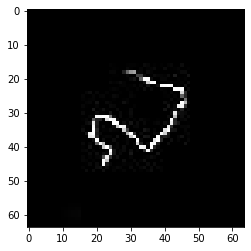

confidence for 1659 is 0.99992234


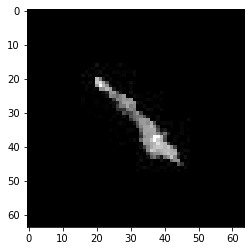

confidence for 1685 is 0.9472019


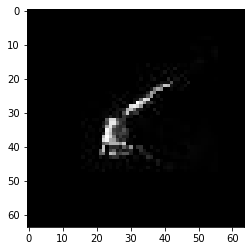

confidence for 1686 is 0.90411174


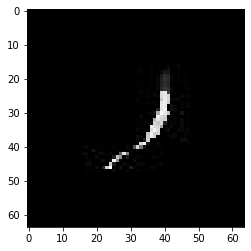

confidence for 1697 is 0.9935168


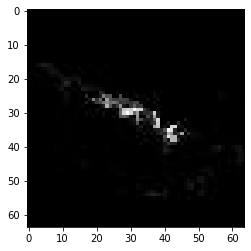

confidence for 1700 is 0.99999917


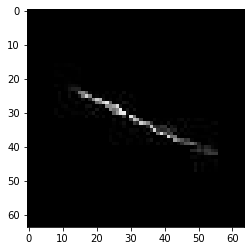

confidence for 1713 is 0.98438513


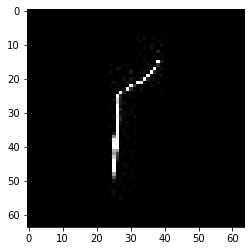

confidence for 1758 is 0.99464935


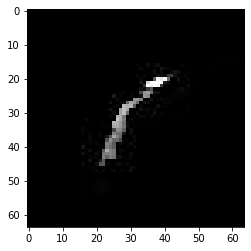

confidence for 1768 is 0.9556527


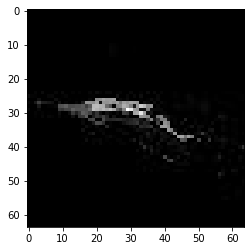

confidence for 1777 is 0.9749035


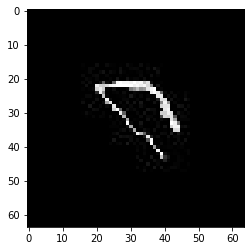

confidence for 1779 is 0.9974661


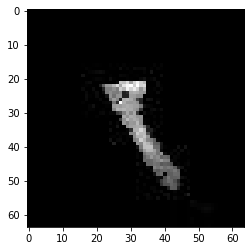

confidence for 1789 is 0.96153873


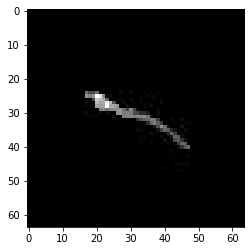

confidence for 1837 is 0.9999992


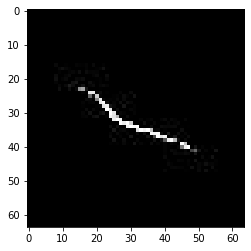

confidence for 1850 is 0.99794024


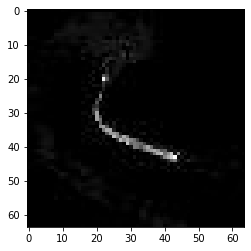

confidence for 1965 is 0.9733902


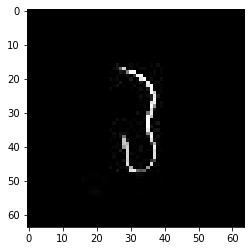

confidence for 1971 is 0.99781513


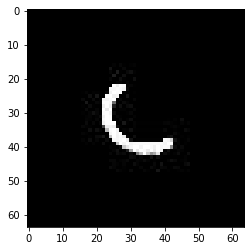

confidence for 1979 is 0.99413925


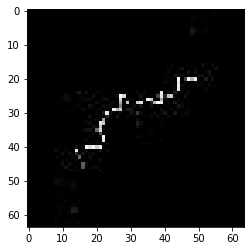

confidence for 1999 is 0.9591046


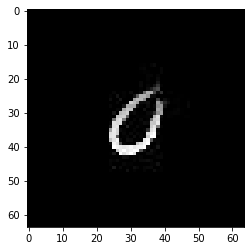

confidence for 2035 is 0.92554885


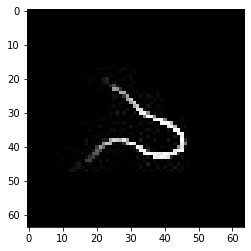

confidence for 2043 is 0.9959358


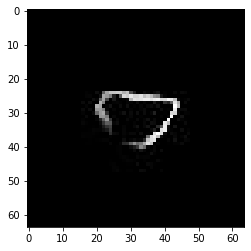

confidence for 2054 is 0.9882121


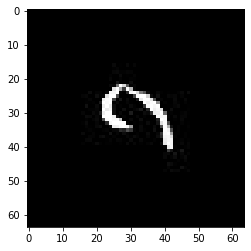

confidence for 2111 is 0.99478304


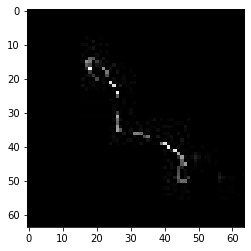

confidence for 2131 is 0.99566287


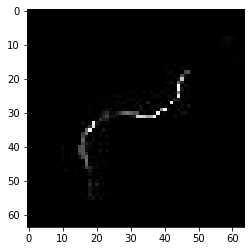

confidence for 2163 is 0.92950946


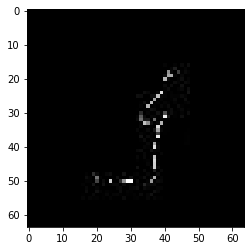

confidence for 2191 is 0.9999972


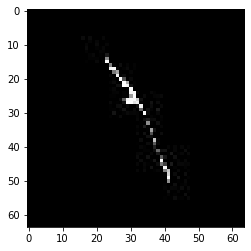

confidence for 2208 is 0.9963735


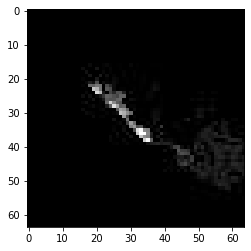

confidence for 2211 is 0.9675899


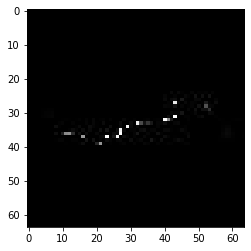

confidence for 2278 is 0.98628944


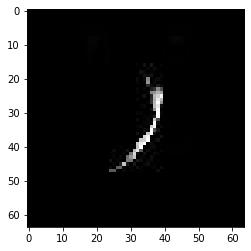

confidence for 2283 is 0.9998189


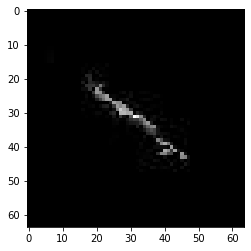

confidence for 2301 is 0.93873066


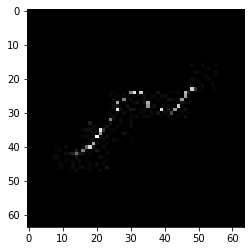

confidence for 2302 is 0.95814896


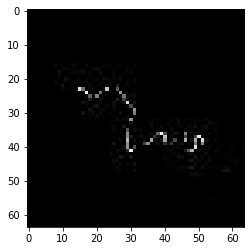

confidence for 2344 is 0.98620206


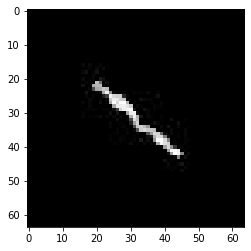

confidence for 2409 is 0.9854393


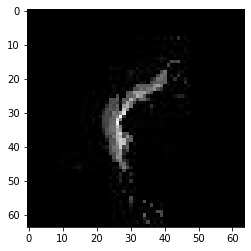

confidence for 2452 is 0.9930187


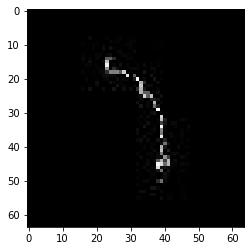

confidence for 2483 is 0.9988477


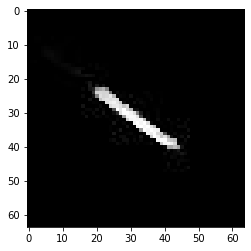

confidence for 2486 is 0.99616796


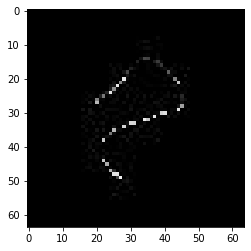

confidence for 2490 is 0.9663448


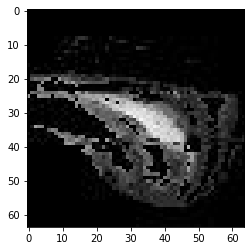

confidence for 2491 is 0.965669


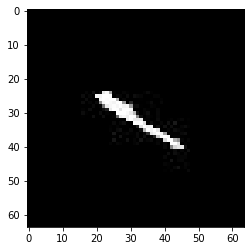

confidence for 2544 is 0.9931866


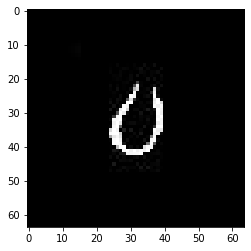

confidence for 2559 is 0.99753195


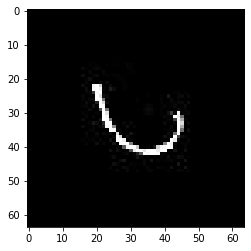

confidence for 2616 is 0.96755016


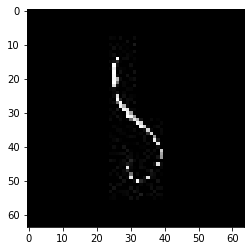

confidence for 2644 is 0.9995772


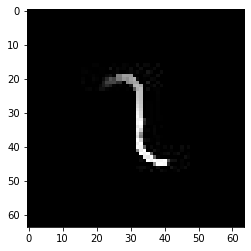

confidence for 2672 is 0.9999939


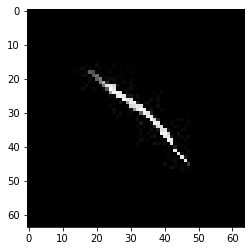

confidence for 2680 is 0.99998605


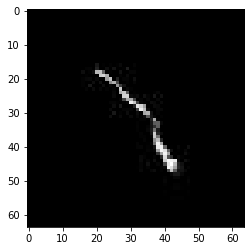

confidence for 2706 is 0.9562378


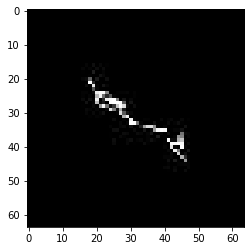

confidence for 2712 is 0.9894493


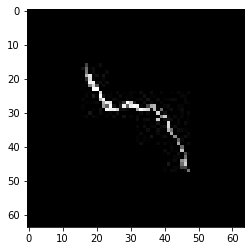

confidence for 2744 is 0.9987612


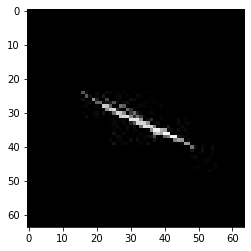

confidence for 2753 is 0.95784587


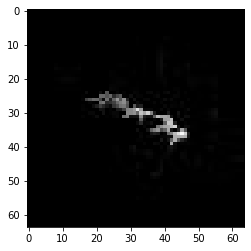

confidence for 2779 is 0.92838854


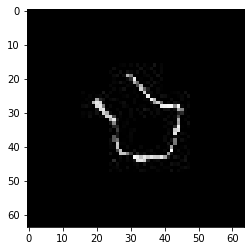

confidence for 2799 is 0.9998628


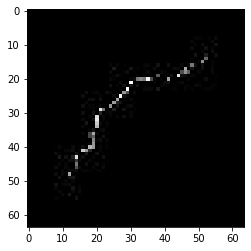

confidence for 2823 is 0.99987614


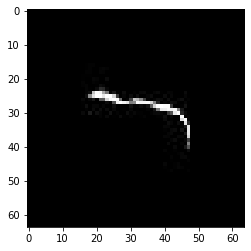

confidence for 2824 is 0.9938238


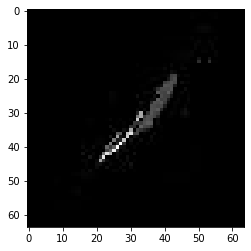

confidence for 2862 is 0.9999952


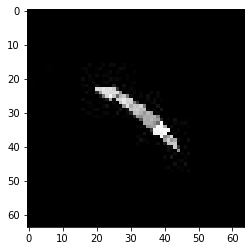

confidence for 2928 is 0.998858


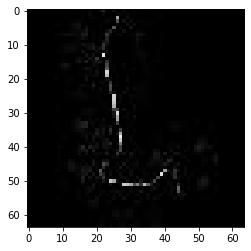

confidence for 3044 is 0.95050293


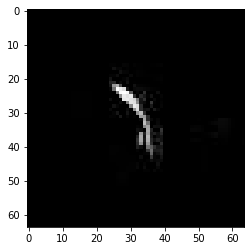

confidence for 3063 is 0.95799345


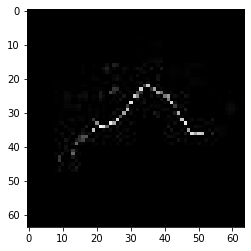

confidence for 3066 is 0.98190284


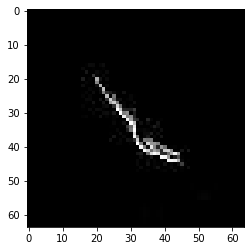

confidence for 3074 is 0.9626002


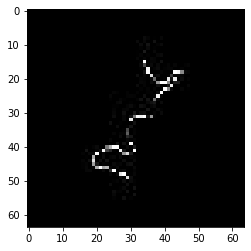

confidence for 3090 is 0.99574286


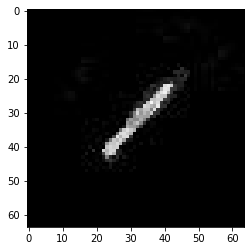

confidence for 3095 is 0.99868566


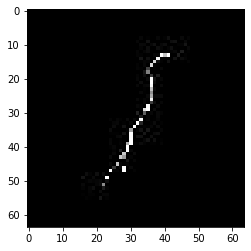

confidence for 3126 is 0.9674925


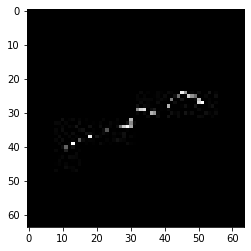

confidence for 3136 is 0.98517954


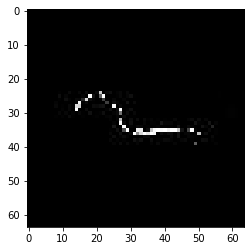

confidence for 3168 is 0.97157186


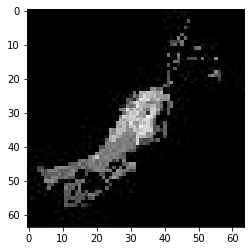

confidence for 3211 is 0.95212114


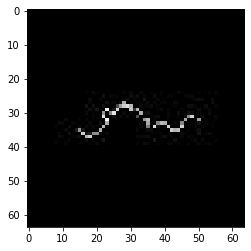

confidence for 3259 is 0.9966015


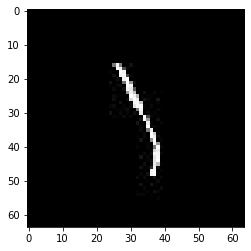

confidence for 3268 is 0.9258929


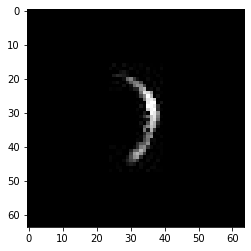

confidence for 3271 is 0.99291176


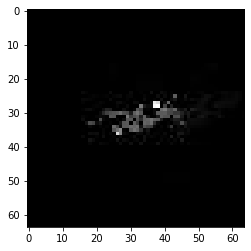

confidence for 3299 is 0.9204241


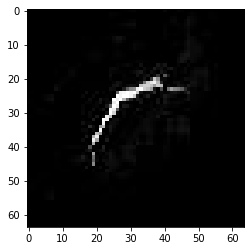

confidence for 3306 is 0.99883056


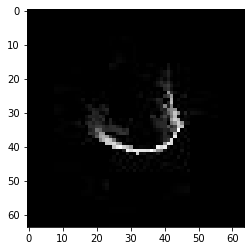

confidence for 3344 is 0.99824494


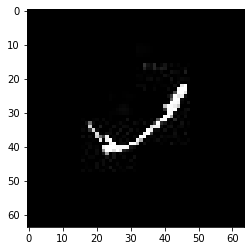

confidence for 3353 is 0.9450923


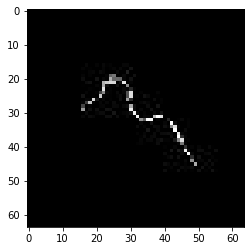

confidence for 3369 is 0.9765512


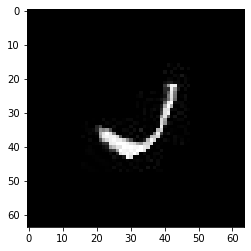

confidence for 3381 is 0.9839167


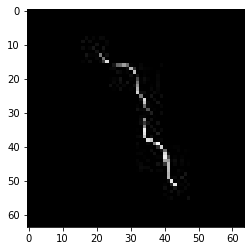

confidence for 3415 is 0.97749835


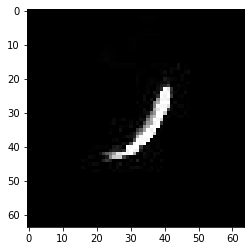

confidence for 3444 is 0.9537569


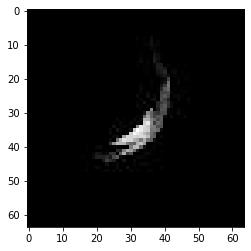

confidence for 3470 is 0.995565


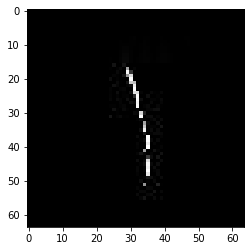

confidence for 3526 is 1.0


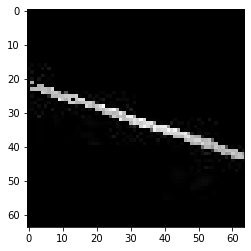

confidence for 3540 is 0.98795563


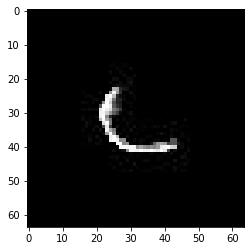

confidence for 3577 is 0.9969329


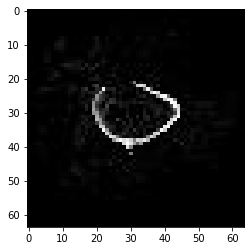

confidence for 3636 is 0.9961849


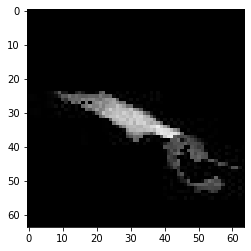

confidence for 3637 is 0.99711275


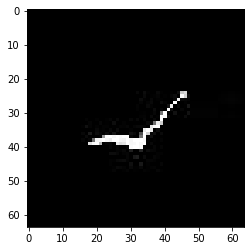

confidence for 3638 is 0.99998695


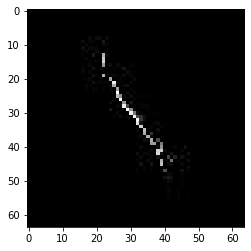

confidence for 3641 is 0.97729963


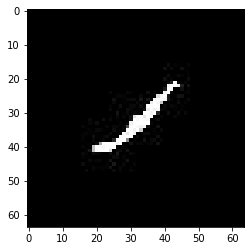

confidence for 3656 is 0.9940097


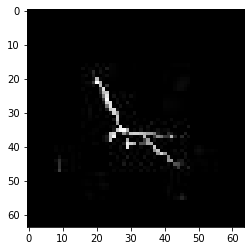

confidence for 3709 is 0.97157013


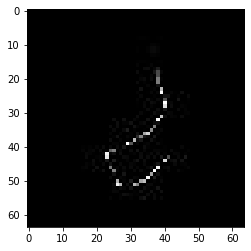

confidence for 3710 is 0.94714046


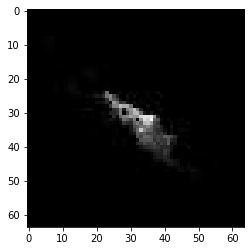

confidence for 3722 is 0.99986327


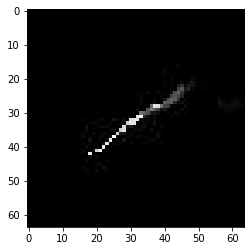

confidence for 3734 is 0.937434


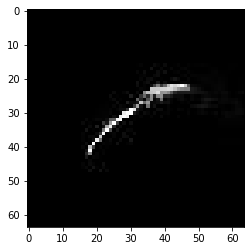

confidence for 3806 is 0.99968684


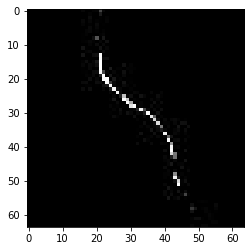

confidence for 3813 is 0.94846934


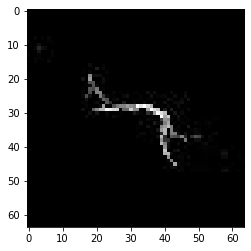

confidence for 3826 is 0.9998579


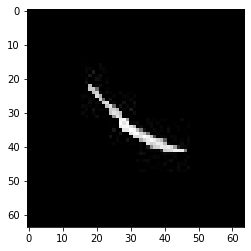

confidence for 3844 is 0.99987304


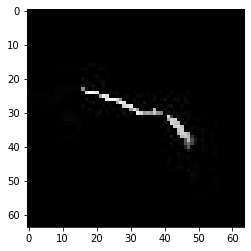

confidence for 3850 is 0.91226393


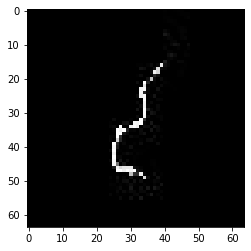

confidence for 3876 is 0.9673449


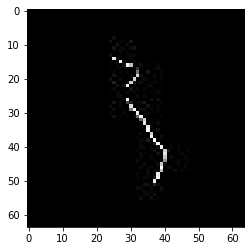

confidence for 3892 is 0.99867624


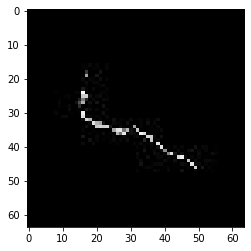

confidence for 3900 is 0.95496696


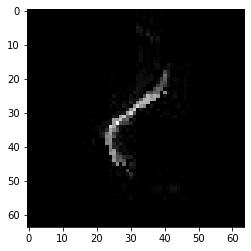

confidence for 3916 is 0.9879124


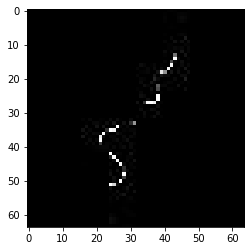

confidence for 3918 is 1.0


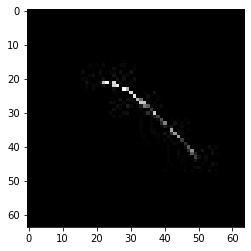

confidence for 3926 is 0.99965376


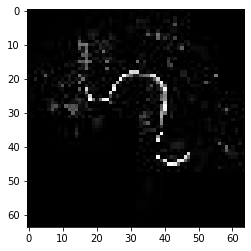

confidence for 3953 is 0.9368827


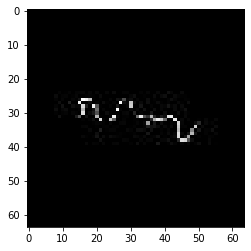

confidence for 3961 is 1.0


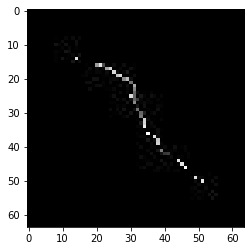

confidence for 3973 is 0.9999984


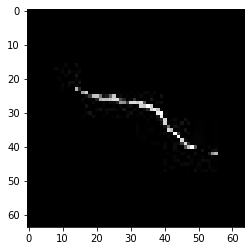

confidence for 4005 is 0.9943573


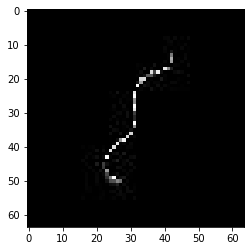

confidence for 4007 is 0.9055429


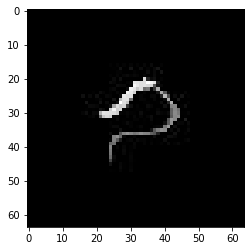

confidence for 4011 is 0.99000674


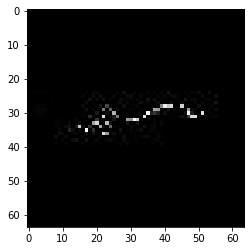

confidence for 4012 is 0.92010915


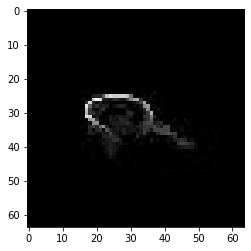

confidence for 4027 is 0.9375654


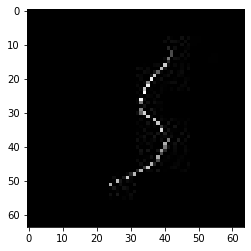

confidence for 4028 is 0.97279304


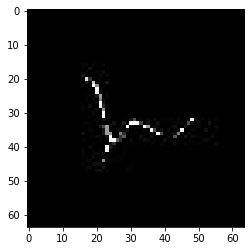

confidence for 4050 is 0.9921891


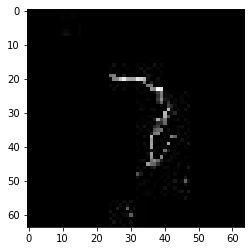

confidence for 4056 is 0.9116571


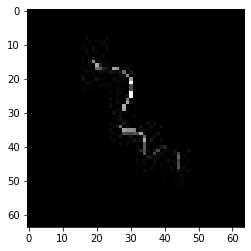

confidence for 4058 is 0.9992937


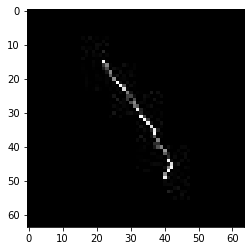

confidence for 4074 is 0.99308294


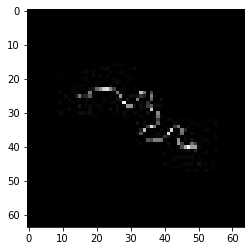

confidence for 4084 is 0.9995285


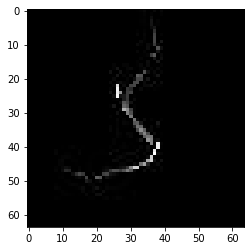

confidence for 4151 is 0.99999994


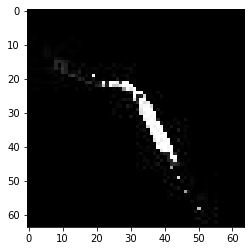

confidence for 4161 is 0.99846846


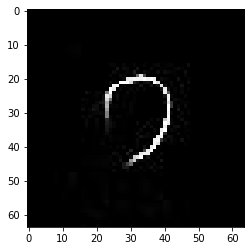

confidence for 4190 is 0.9633552


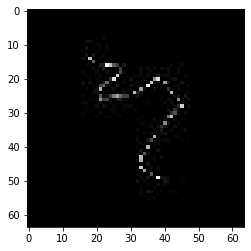

confidence for 4232 is 0.97858053


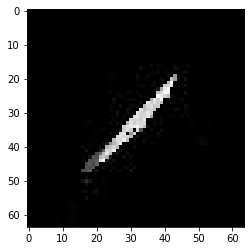

confidence for 4240 is 0.9999984


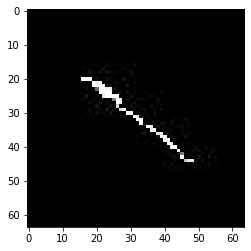

confidence for 4249 is 0.98963803


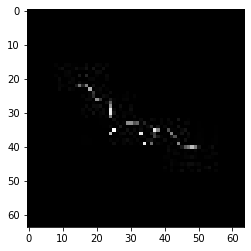

confidence for 4295 is 0.9109779


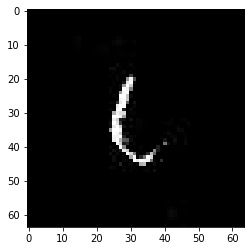

confidence for 4296 is 0.91651726


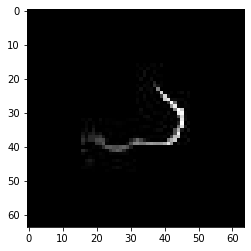

confidence for 4302 is 0.9999998


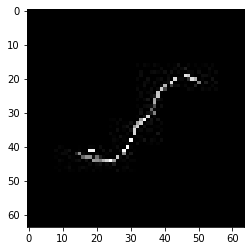

confidence for 4314 is 0.9926549


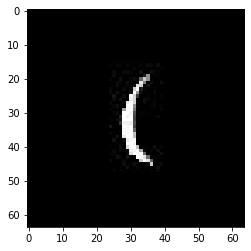

confidence for 4352 is 0.98045385


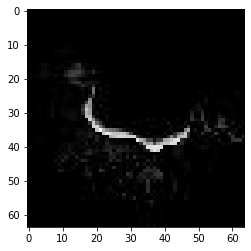

confidence for 4370 is 0.9860516


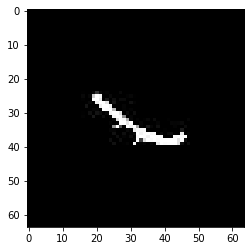

confidence for 4374 is 0.9949414


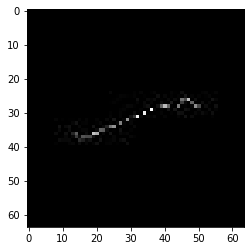

confidence for 4381 is 0.90071136


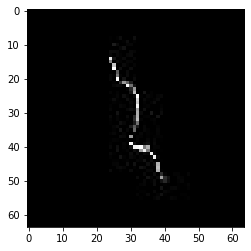

confidence for 4382 is 0.9999444


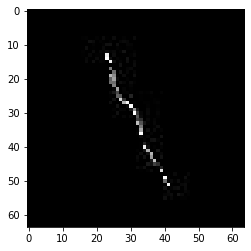

confidence for 4425 is 0.99996734


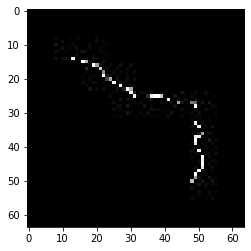

confidence for 4493 is 0.995909


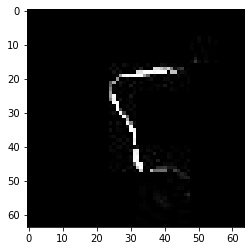

confidence for 4508 is 0.9341492


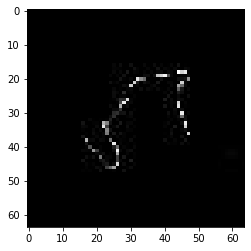

confidence for 4538 is 0.95125014


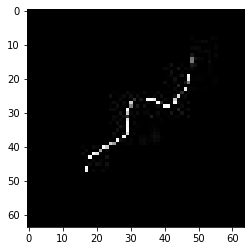

confidence for 4544 is 0.99795055


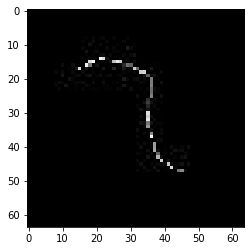

confidence for 4556 is 0.9743401


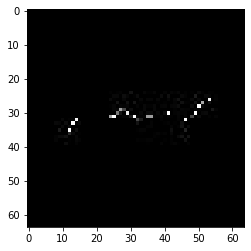

confidence for 4557 is 0.9935534


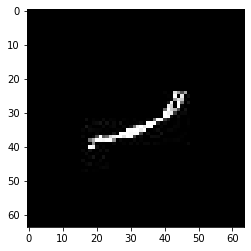

confidence for 4563 is 0.9292149


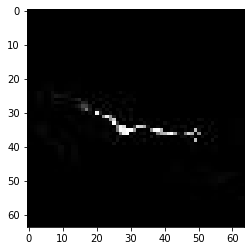

confidence for 4584 is 0.99999934


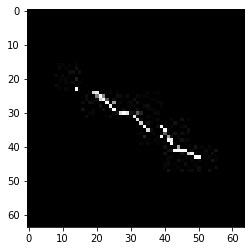

confidence for 4599 is 0.9999331


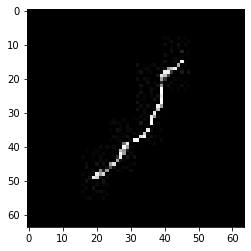

confidence for 4607 is 0.9861836


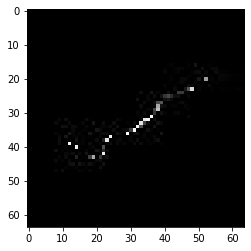

confidence for 4624 is 0.993406


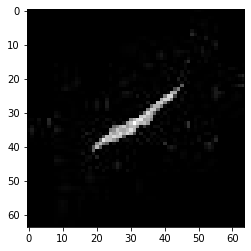

confidence for 4625 is 0.9150735


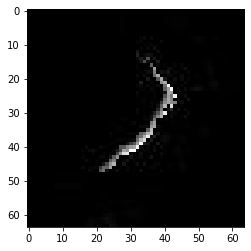

confidence for 4634 is 0.99999934


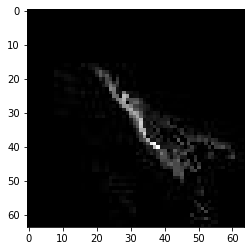

confidence for 4643 is 0.99854094


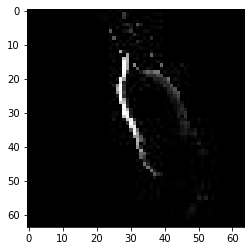

confidence for 4646 is 0.9849596


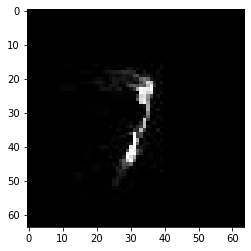

confidence for 4658 is 0.9881856


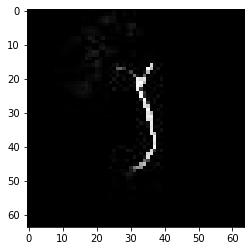

confidence for 4677 is 0.96604943


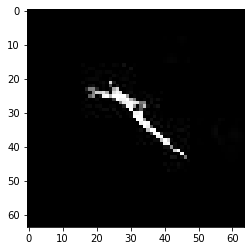

confidence for 4691 is 0.98905534


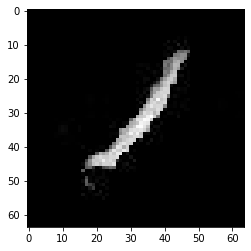

confidence for 4746 is 0.99651986


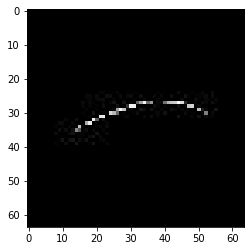

confidence for 4757 is 0.99988663


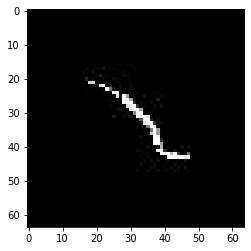

confidence for 4763 is 0.98910195


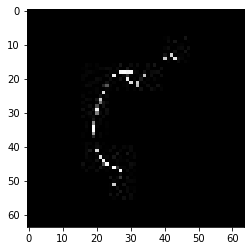

confidence for 4782 is 0.93738973


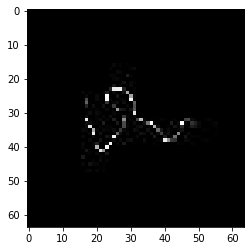

confidence for 4791 is 0.98807126


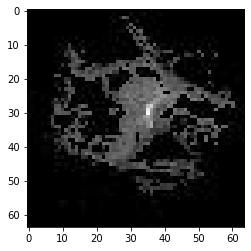

confidence for 4821 is 0.9200631


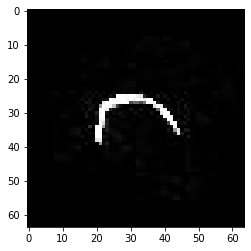

confidence for 4823 is 0.99995905


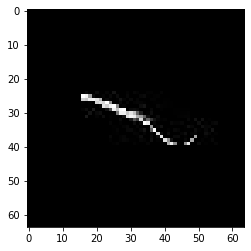

confidence for 4826 is 0.9698091


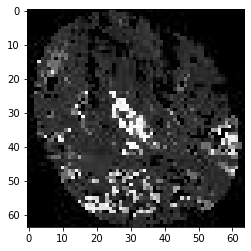

confidence for 4832 is 0.9984367


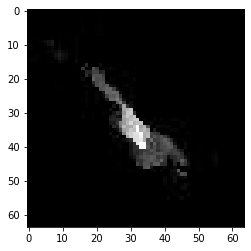

confidence for 4839 is 0.9968375


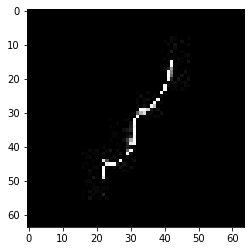

confidence for 4856 is 0.99965423


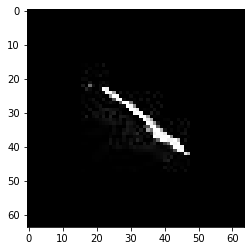

confidence for 4865 is 0.93237966


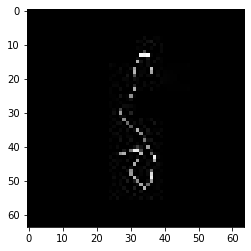

confidence for 4880 is 0.9344019


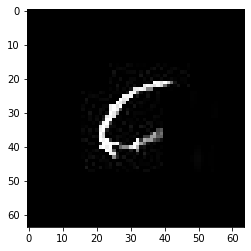

confidence for 4906 is 0.9824513


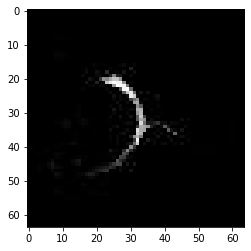

confidence for 4923 is 0.9815396


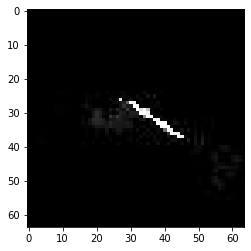

confidence for 4933 is 0.99953026


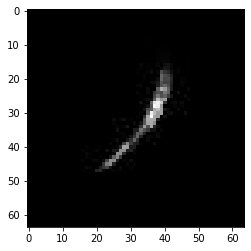

confidence for 5018 is 0.999872


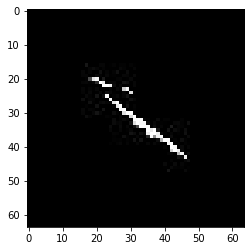

confidence for 5026 is 0.9999856


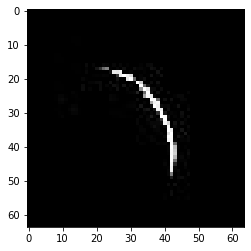

confidence for 5082 is 0.9689942


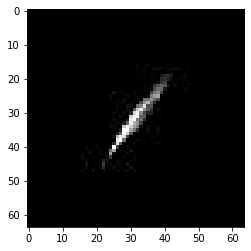

confidence for 5121 is 0.99995345


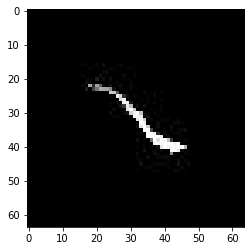

confidence for 5124 is 0.97797865


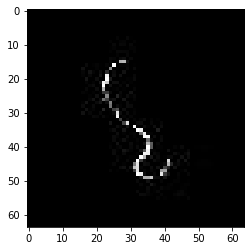

confidence for 5127 is 0.99988925


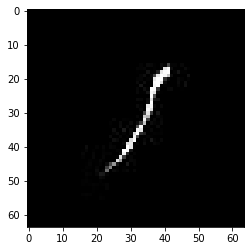

confidence for 5262 is 0.9996235


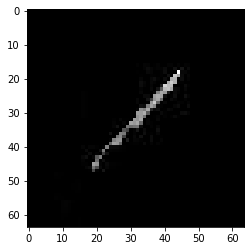

confidence for 5326 is 0.9954414


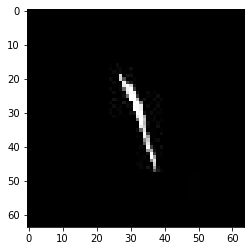

confidence for 5346 is 0.99951583


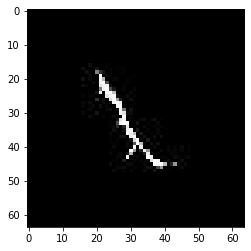

confidence for 5365 is 0.9745849


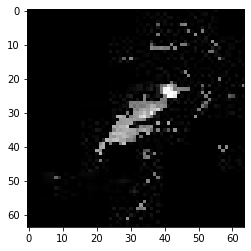

confidence for 5383 is 0.93557316


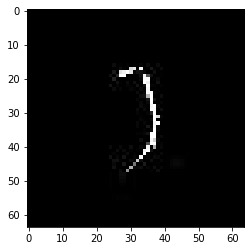

confidence for 5456 is 0.9991353


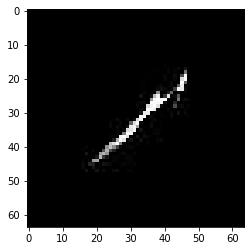

confidence for 5460 is 0.9514768


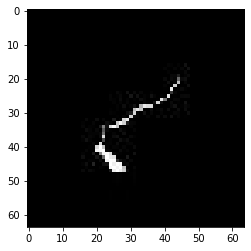

confidence for 5517 is 0.99589026


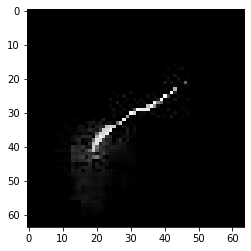

confidence for 5542 is 0.9646205


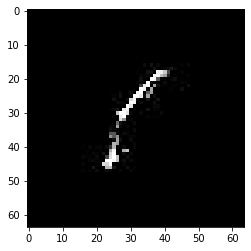

confidence for 5591 is 0.99899703


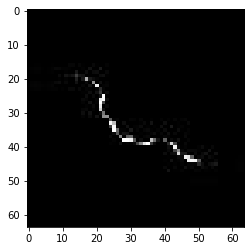

confidence for 5654 is 0.9999984


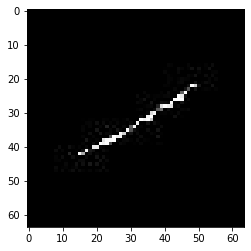

confidence for 5679 is 0.9969311


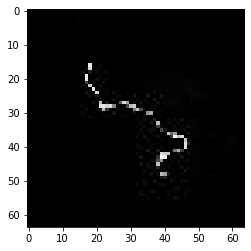

confidence for 5689 is 0.9860084


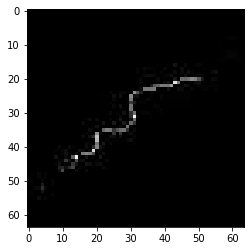

confidence for 5696 is 0.9107381


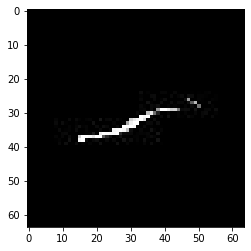

confidence for 5712 is 0.9897706


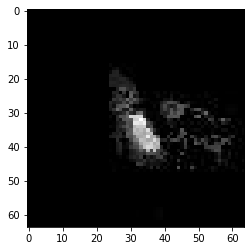

confidence for 5729 is 0.99999857


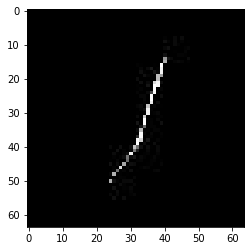

confidence for 5745 is 0.99998814


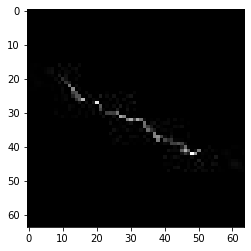

confidence for 5751 is 0.9423415


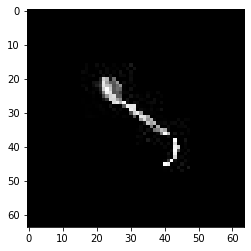

confidence for 5755 is 0.988623


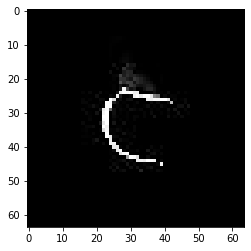

confidence for 5772 is 0.9123607


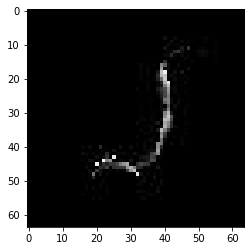

confidence for 5793 is 0.9992836


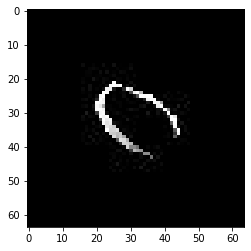

confidence for 5798 is 0.9621212


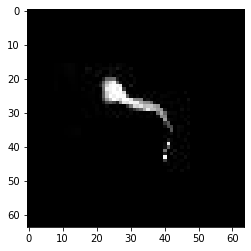

confidence for 5803 is 0.99986345


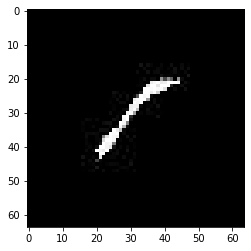

confidence for 5824 is 0.9873318


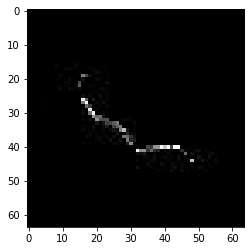

confidence for 5863 is 0.9998288


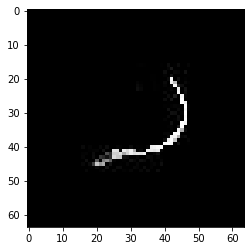

confidence for 5884 is 0.95711076


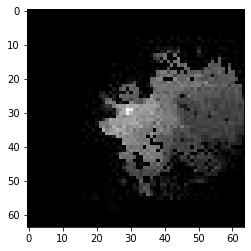

confidence for 5930 is 0.99998933


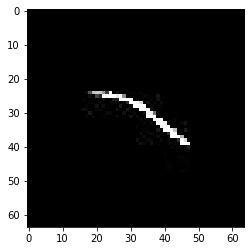

confidence for 5941 is 0.9408362


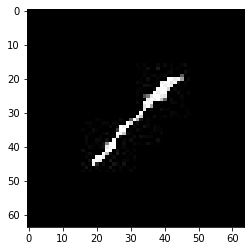

confidence for 5946 is 0.9975338


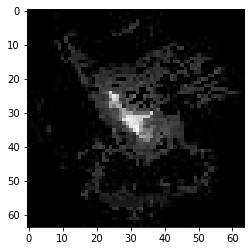

confidence for 5961 is 0.9999787


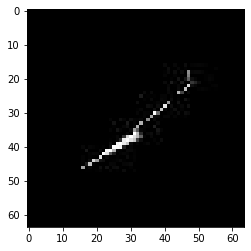

confidence for 5992 is 0.9533422


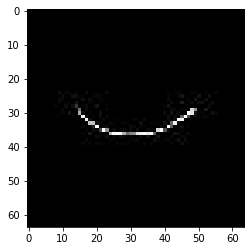

confidence for 6002 is 0.9997147


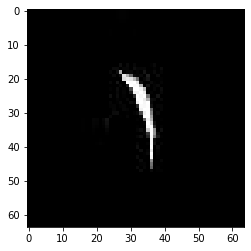

confidence for 6013 is 0.99997514


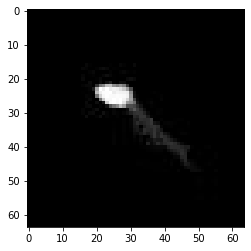

confidence for 6015 is 0.99999744


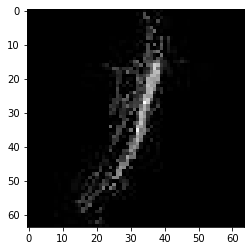

confidence for 6027 is 0.9998673


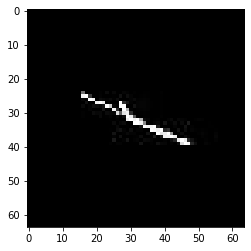

confidence for 6035 is 0.9705534


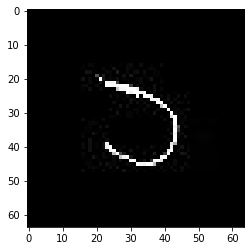

confidence for 6036 is 0.9998033


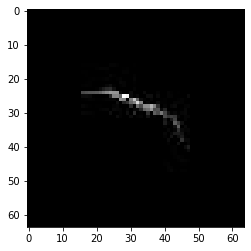

confidence for 6038 is 0.9512494


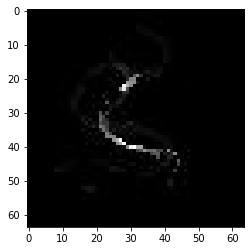

confidence for 6043 is 0.99999946


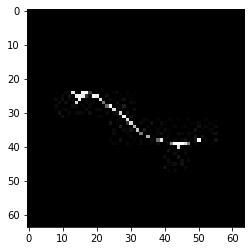

confidence for 6056 is 0.9747114


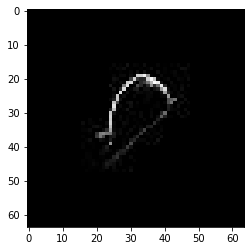

confidence for 6059 is 0.9784884


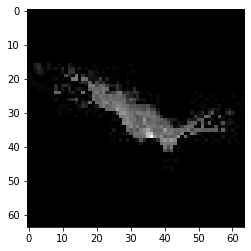

confidence for 6068 is 0.99196887


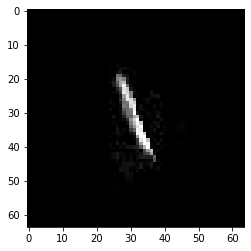

confidence for 6073 is 0.902557


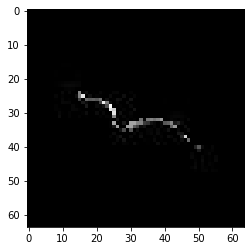

confidence for 6079 is 0.9991272


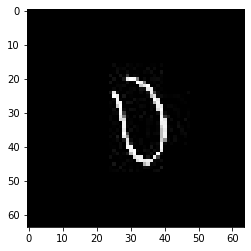

confidence for 6084 is 0.99836344


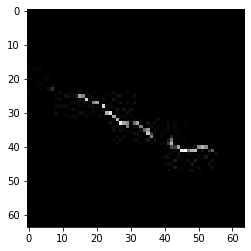

confidence for 6085 is 0.95069367


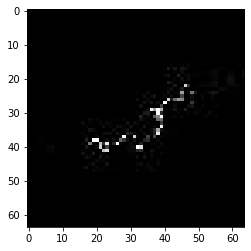

confidence for 6123 is 0.96739095


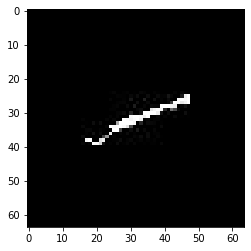

confidence for 6124 is 0.99999034


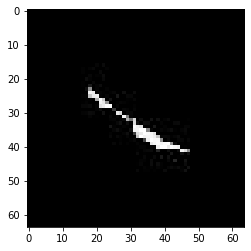

confidence for 6126 is 0.9677181


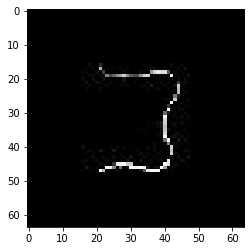

confidence for 6159 is 0.9321247


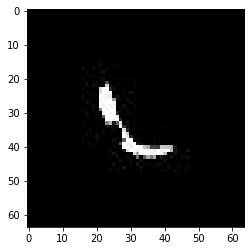

confidence for 6167 is 0.99999493


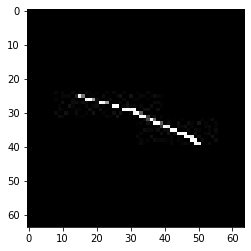

confidence for 6173 is 0.9777073


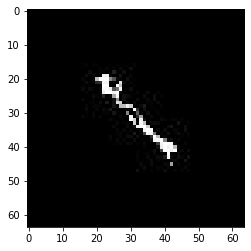

confidence for 6179 is 0.9201486


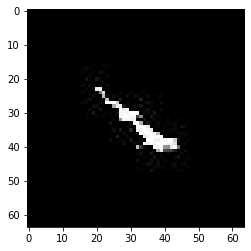

confidence for 6180 is 0.9882993


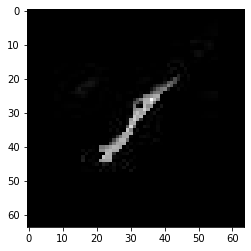

confidence for 6189 is 0.9996675


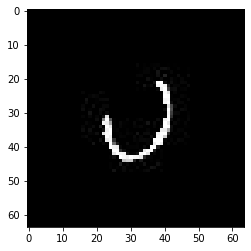

confidence for 6251 is 0.94779277


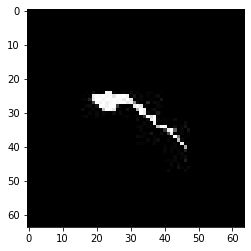

confidence for 6258 is 0.9972025


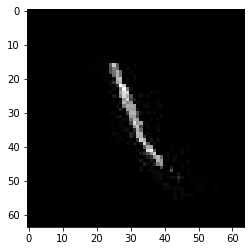

confidence for 6262 is 0.9659479


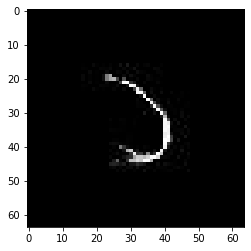

confidence for 6294 is 0.9998891


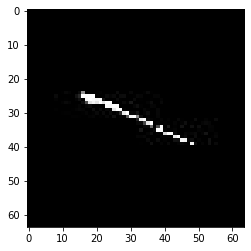

confidence for 6304 is 0.9809351


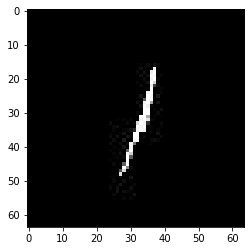

confidence for 6313 is 0.972308


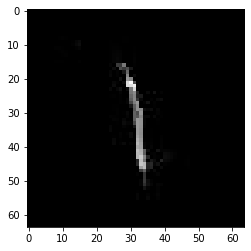

confidence for 6349 is 0.9970831


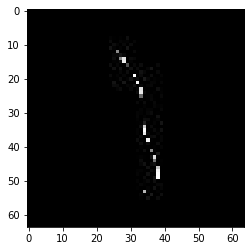

confidence for 6401 is 0.97150254


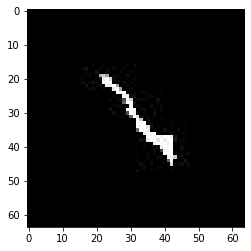

confidence for 6454 is 0.9999831


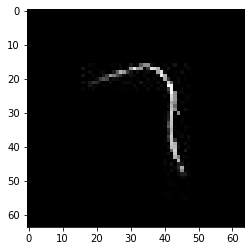

confidence for 6474 is 0.9444763


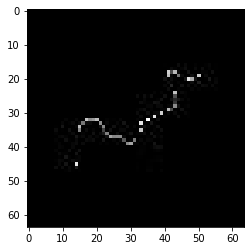

confidence for 6497 is 0.97533685


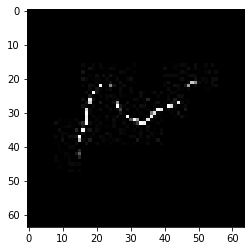

confidence for 6504 is 0.9990123


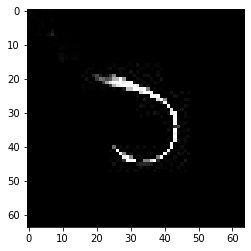

confidence for 6523 is 0.9999999


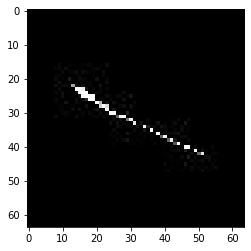

confidence for 6526 is 0.9704951


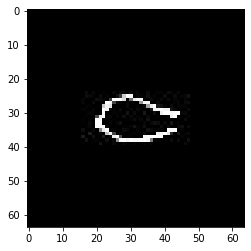

confidence for 6529 is 0.9799671


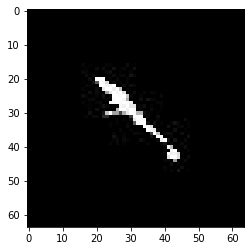

confidence for 6562 is 0.997592


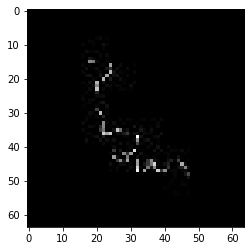

confidence for 6564 is 0.9986582


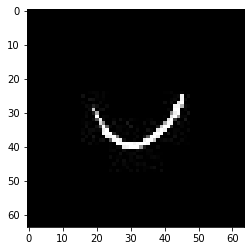

confidence for 6568 is 0.9752529


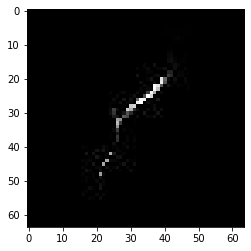

confidence for 6596 is 0.99123466


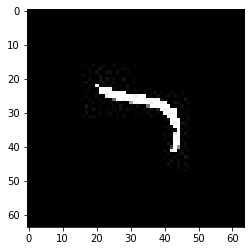

confidence for 6602 is 0.9935443


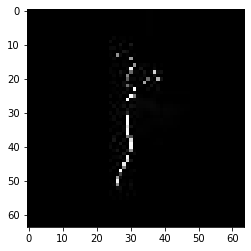

confidence for 6613 is 0.9807369


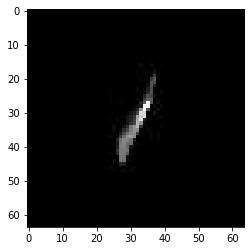

confidence for 6615 is 0.9631334


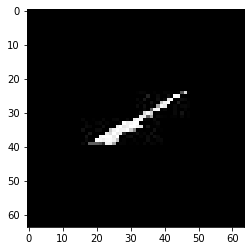

confidence for 6642 is 0.9991322


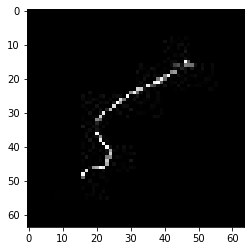

confidence for 6648 is 0.9469232


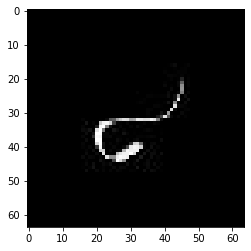

confidence for 6653 is 0.99395627


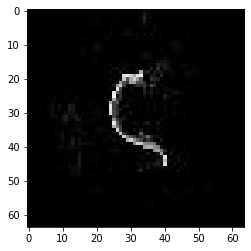

confidence for 6677 is 0.99977


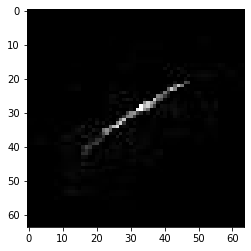

confidence for 6683 is 0.9909726


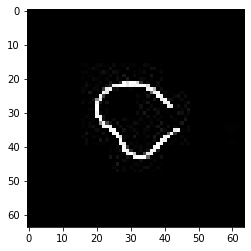

confidence for 6691 is 0.9938188


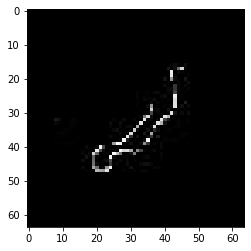

confidence for 6703 is 0.97053665


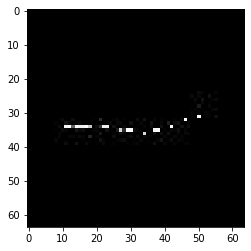

confidence for 6710 is 0.90246433


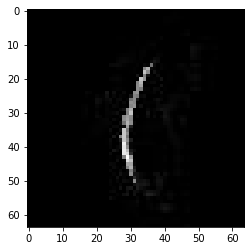

confidence for 6715 is 0.91406286


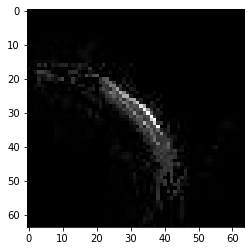

confidence for 6741 is 0.98617965


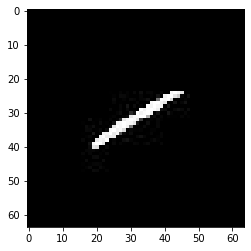

confidence for 6750 is 0.99703306


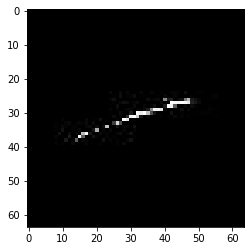

confidence for 6756 is 0.99999964


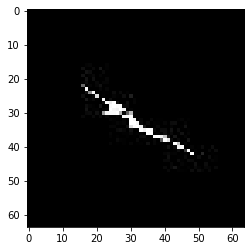

confidence for 6781 is 0.979998


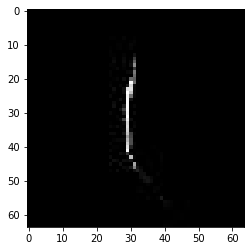

confidence for 6796 is 0.99992555


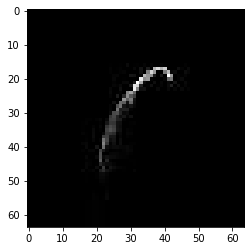

confidence for 6799 is 0.99999994


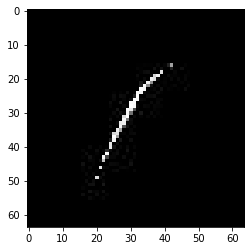

confidence for 6805 is 0.94062257


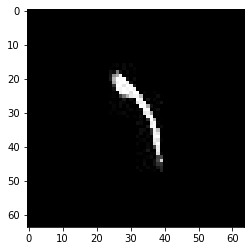

confidence for 6807 is 0.99979687


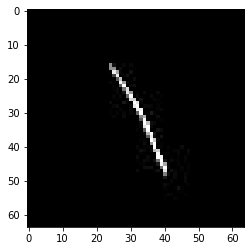

confidence for 6825 is 0.97755307


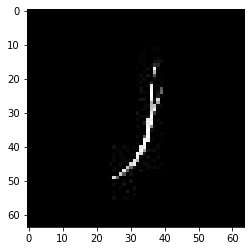

confidence for 6827 is 0.9999996


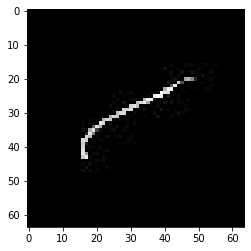

confidence for 6832 is 0.9999941


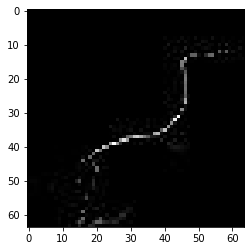

confidence for 6834 is 0.99206185


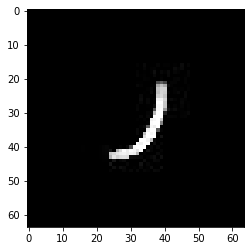

confidence for 6838 is 0.9993246


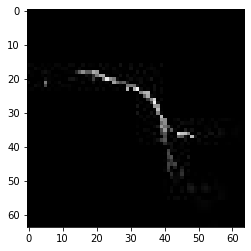

confidence for 6870 is 0.9999638


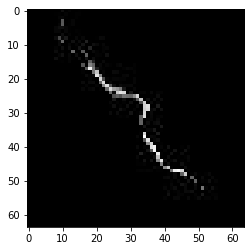

confidence for 6894 is 0.99992114


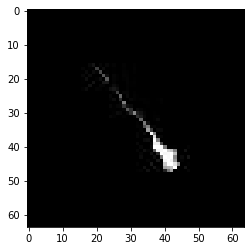

confidence for 6900 is 0.9872443


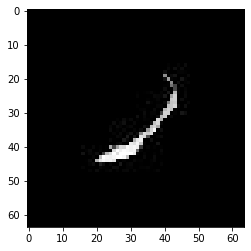

confidence for 6903 is 0.99967784


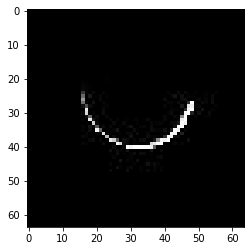

confidence for 6939 is 0.99996465


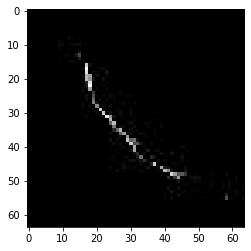

confidence for 6945 is 0.9993378


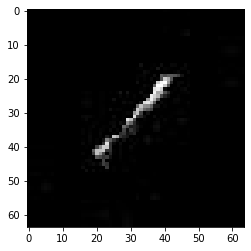

confidence for 6946 is 0.99132454


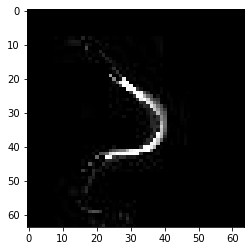

confidence for 6962 is 0.9564822


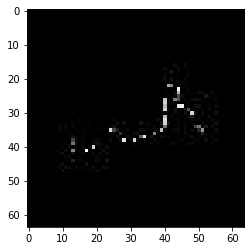

confidence for 7060 is 0.9994329


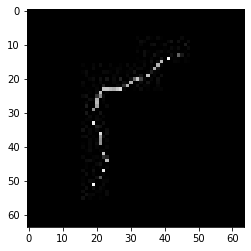

confidence for 7074 is 0.92071265


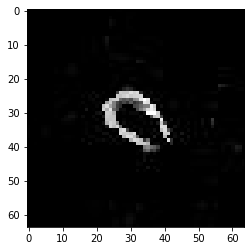

confidence for 7118 is 0.9881007


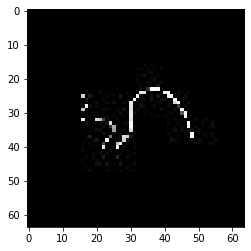

confidence for 7181 is 0.94126374


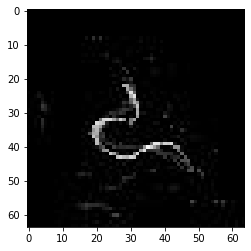

confidence for 7187 is 0.9643553


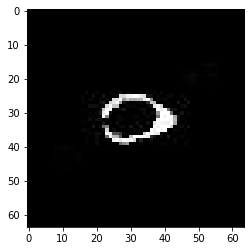

confidence for 7220 is 0.90792274


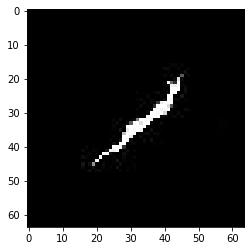

confidence for 7235 is 0.9950431


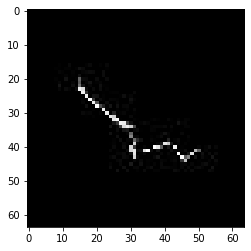

confidence for 7238 is 0.983574


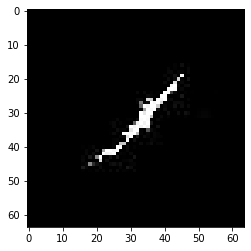

confidence for 7378 is 0.9408108


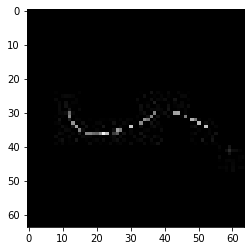

confidence for 7415 is 0.99999976


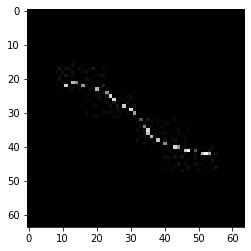

confidence for 7424 is 0.9712876


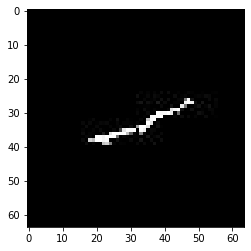

confidence for 7431 is 0.9991005


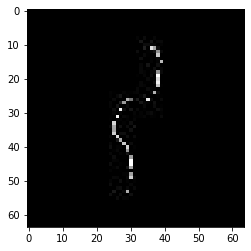

confidence for 7437 is 0.94627666


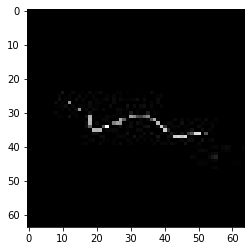

confidence for 7448 is 0.9757149


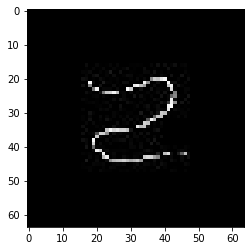

confidence for 7461 is 0.9994994


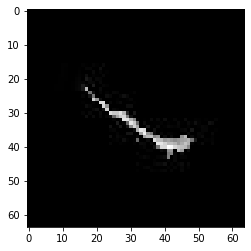

confidence for 7503 is 0.99610656


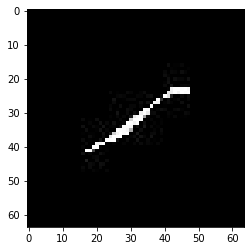

confidence for 7518 is 0.9545684


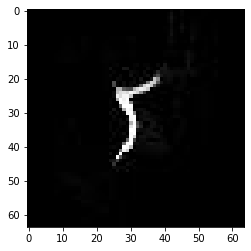

confidence for 7527 is 0.9962615


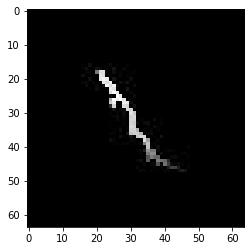

confidence for 7531 is 0.9999974


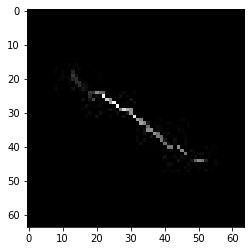

confidence for 7589 is 0.9803048


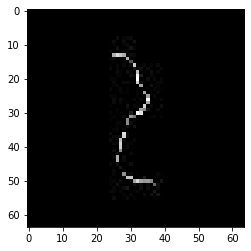

confidence for 7605 is 0.99995303


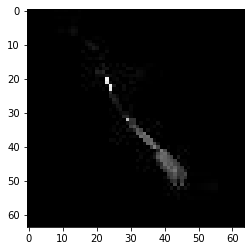

confidence for 7610 is 0.9930507


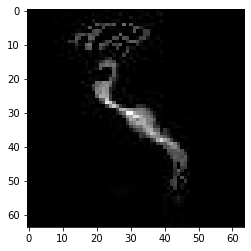

confidence for 7615 is 0.99963075


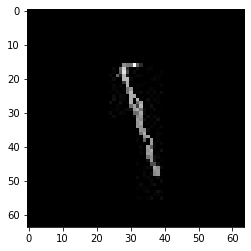

confidence for 7640 is 0.9682106


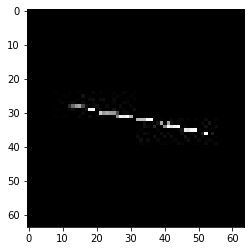

confidence for 7646 is 0.91424495


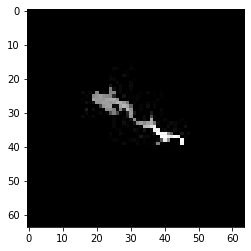

confidence for 7648 is 0.9986452


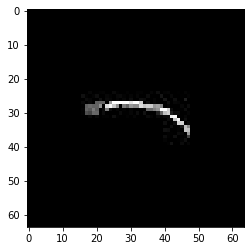

confidence for 7724 is 0.9892207


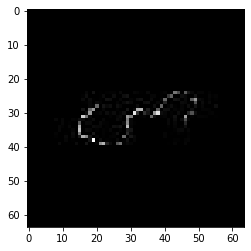

confidence for 7744 is 0.9919692


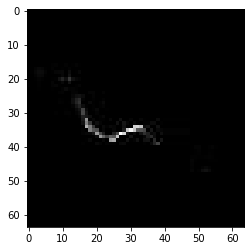

confidence for 7756 is 0.9672067


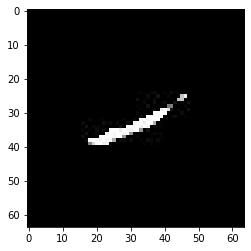

confidence for 7807 is 0.99999756


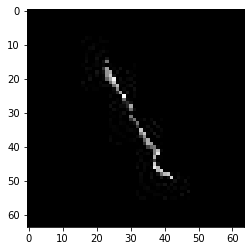

confidence for 7833 is 0.96151394


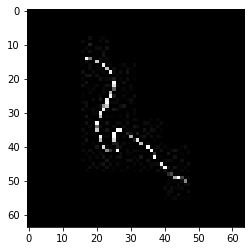

confidence for 7865 is 0.99991196


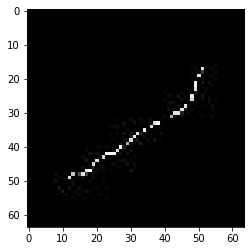

confidence for 7872 is 0.9356915


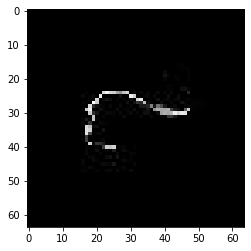

confidence for 7933 is 0.9959134


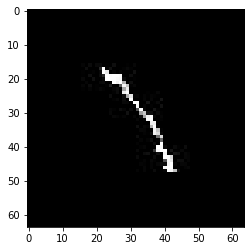

confidence for 7970 is 0.99879616


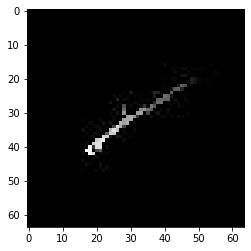

confidence for 7972 is 0.9743949


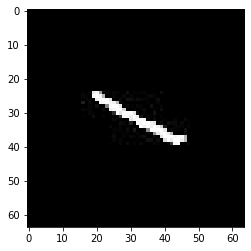

confidence for 7982 is 0.9332894


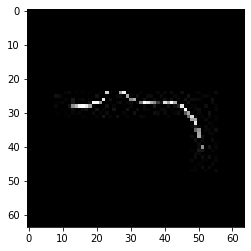

confidence for 8003 is 0.9924432


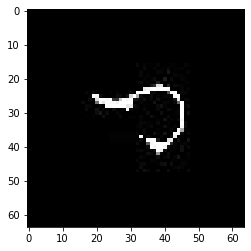

confidence for 8028 is 0.9951233


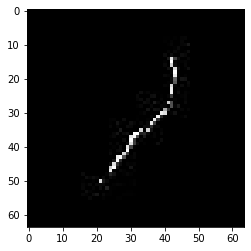

confidence for 8033 is 0.93994945


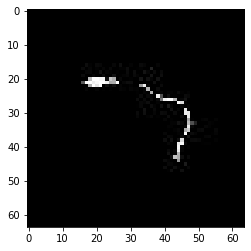

confidence for 8044 is 0.9999702


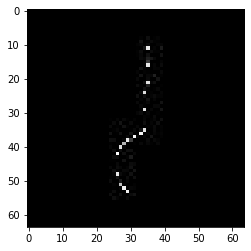

confidence for 8065 is 0.9999973


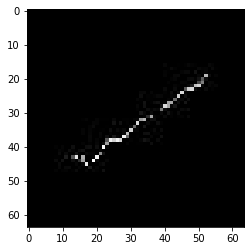

confidence for 8070 is 0.9596782


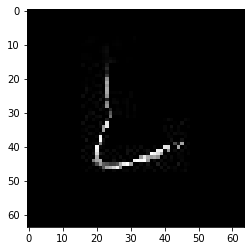

confidence for 8071 is 0.99999833


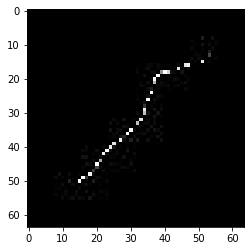

confidence for 8074 is 0.9964309


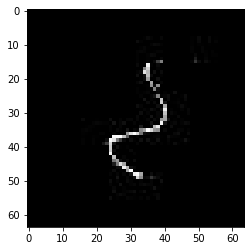

confidence for 8077 is 0.9878464


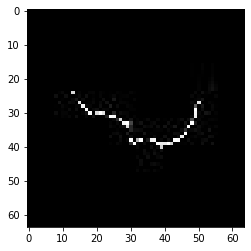

confidence for 8088 is 0.9999341


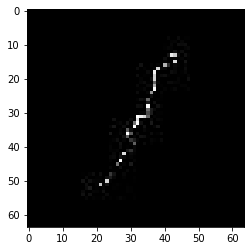

confidence for 8105 is 0.99285036


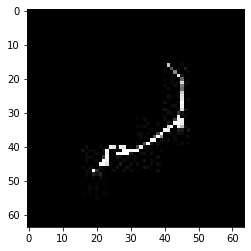

confidence for 8128 is 0.9118214


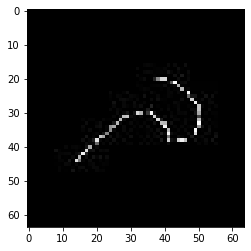

confidence for 8140 is 0.9575448


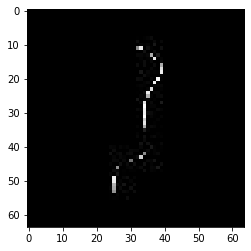

confidence for 8141 is 0.956883


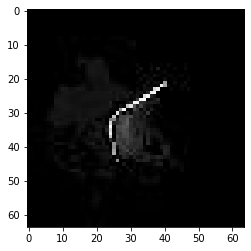

confidence for 8154 is 0.99888384


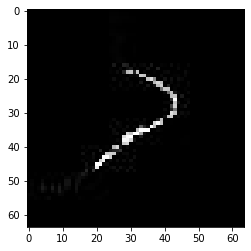

confidence for 8162 is 0.96615463


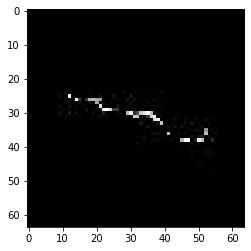

confidence for 8181 is 0.9991685


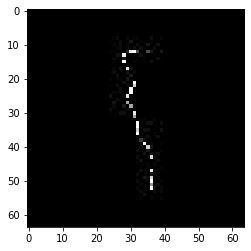

confidence for 8185 is 0.9934091


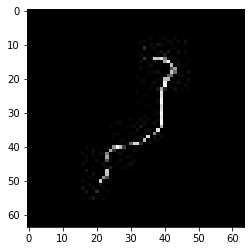

confidence for 8194 is 0.98644525


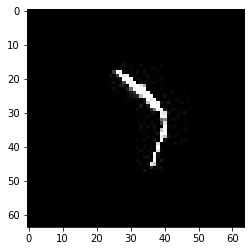

confidence for 8223 is 0.9251466


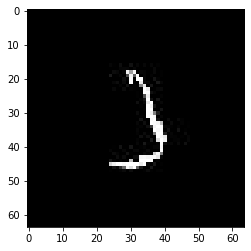

confidence for 8224 is 0.9957569


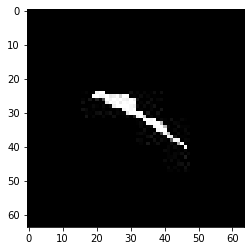

confidence for 8229 is 0.96221054


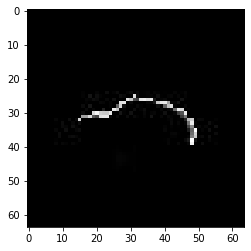

confidence for 8235 is 0.9999999


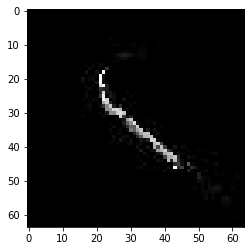

confidence for 8265 is 0.91774267


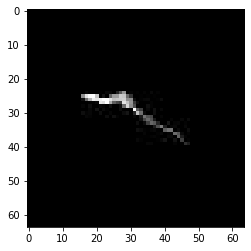

confidence for 8266 is 0.9703172


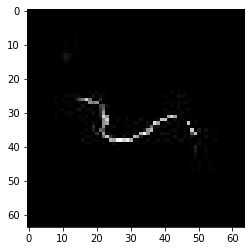

confidence for 8297 is 0.99979323


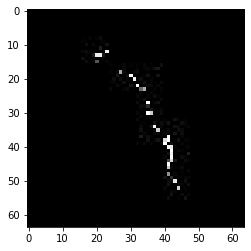

confidence for 8312 is 0.99999213


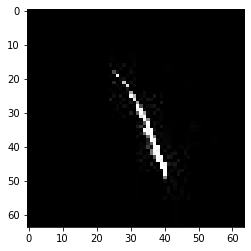

confidence for 8317 is 0.9874155


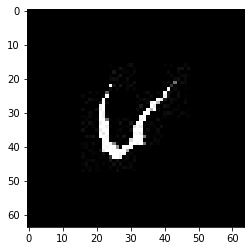

confidence for 8336 is 0.99930483


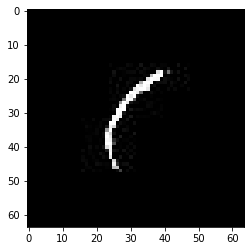

confidence for 8379 is 0.9987772


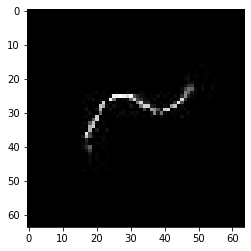

confidence for 8421 is 0.99624413


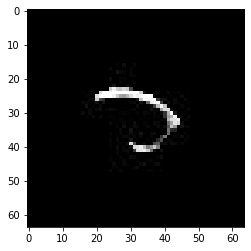

confidence for 8429 is 0.993895


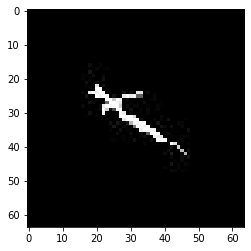

confidence for 8438 is 0.9557669


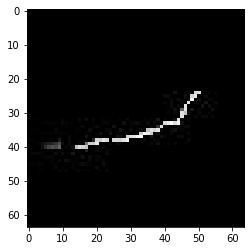

confidence for 8444 is 0.9321531


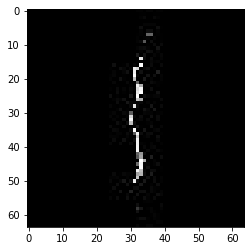

confidence for 8447 is 0.9860899


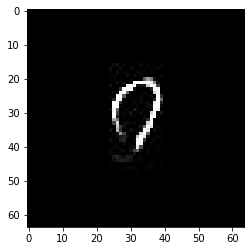

confidence for 8457 is 0.9868766


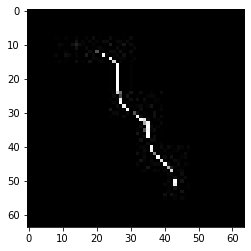

confidence for 8535 is 0.99945647


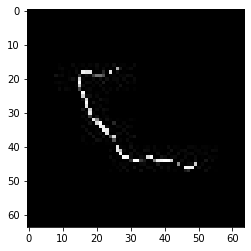

confidence for 8537 is 0.99999964


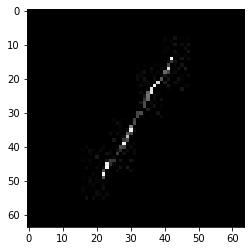

confidence for 8546 is 0.9555903


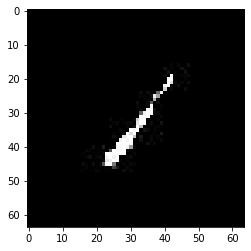

confidence for 8574 is 0.99999416


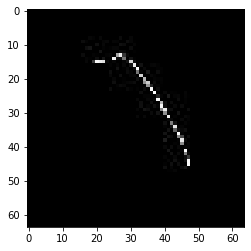

confidence for 8577 is 0.9999991


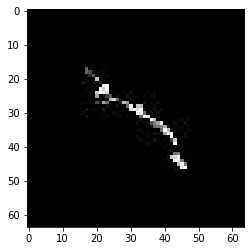

confidence for 8580 is 0.99636686


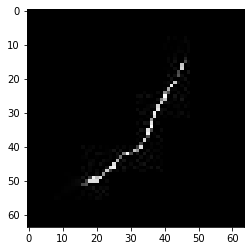

confidence for 8581 is 0.99980885


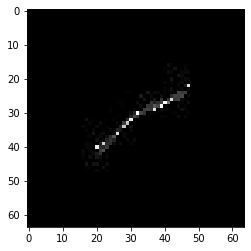

confidence for 8585 is 0.99999803


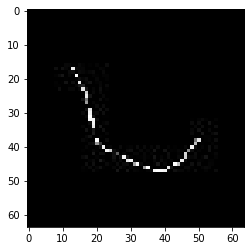

confidence for 8601 is 0.98704416


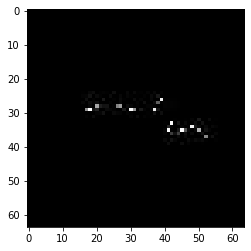

confidence for 8602 is 0.9892172


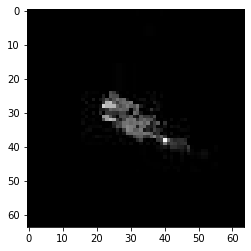

confidence for 8608 is 0.960351


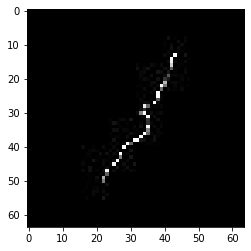

confidence for 8610 is 0.99798465


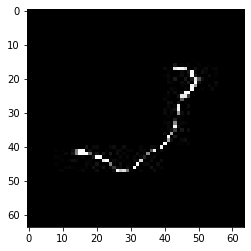

confidence for 8613 is 0.9988775


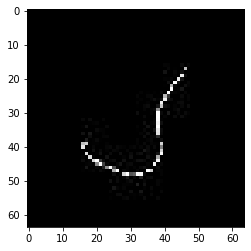

confidence for 8660 is 0.9964849


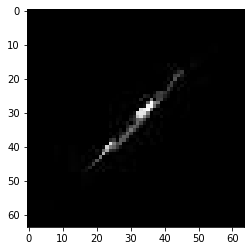

confidence for 8674 is 0.96491814


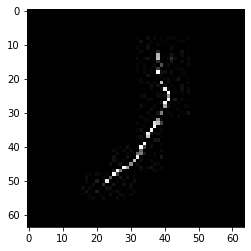

confidence for 8682 is 0.9999987


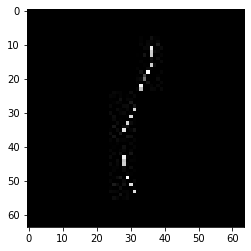

confidence for 8712 is 0.99978954


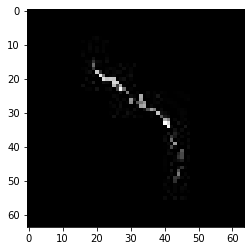

confidence for 8722 is 0.9999994


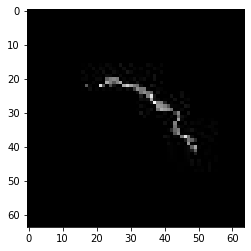

confidence for 8723 is 0.91700524


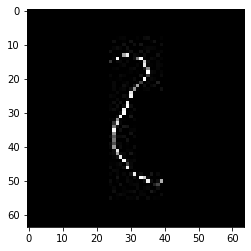

confidence for 8732 is 0.9446643


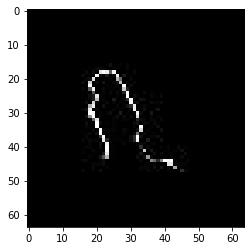

confidence for 8733 is 0.99832624


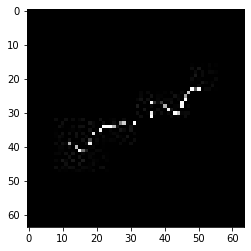

confidence for 8735 is 0.9939435


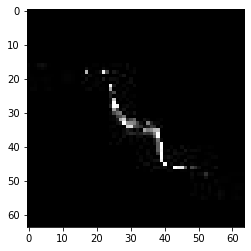

confidence for 8784 is 0.99423426


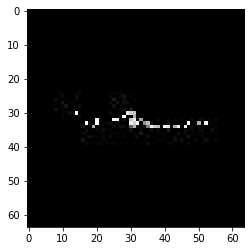

confidence for 8789 is 0.9668958


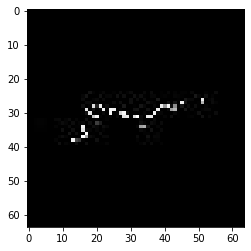

confidence for 8818 is 0.99973136


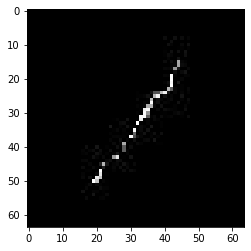

confidence for 8826 is 0.9318913


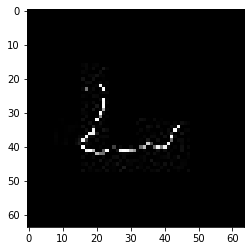

confidence for 8834 is 0.9837379


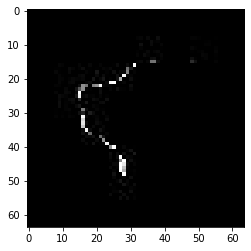

confidence for 8841 is 0.99999744


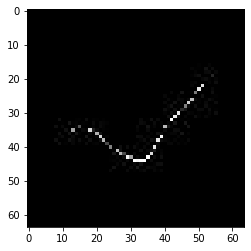

confidence for 8850 is 0.99873364


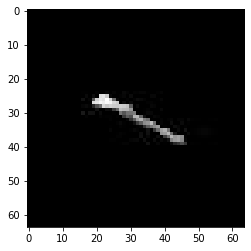

confidence for 8856 is 0.9586353


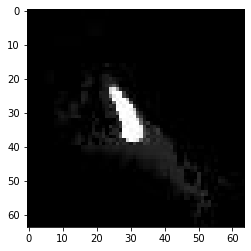

confidence for 8861 is 0.9905258


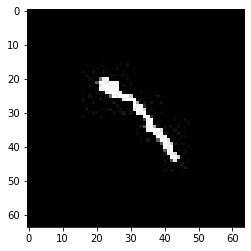

confidence for 8863 is 0.9988122


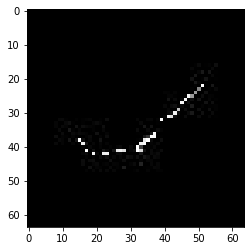

confidence for 8877 is 0.9932244


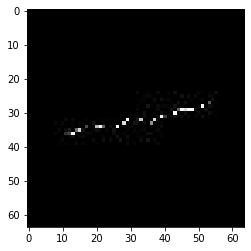

confidence for 8900 is 0.9999941


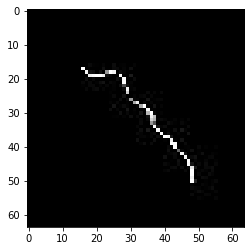

confidence for 8935 is 0.9973812


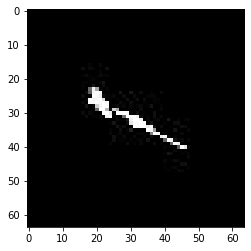

confidence for 8937 is 0.9956293


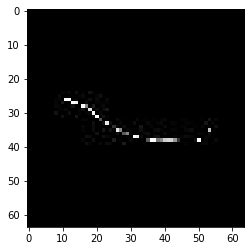

confidence for 8969 is 0.9783783


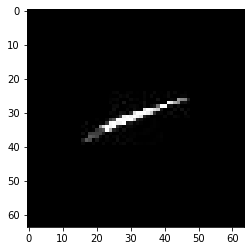

confidence for 8996 is 0.9636893


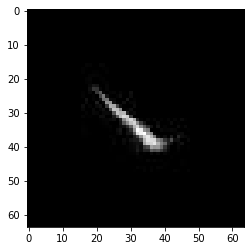

confidence for 9003 is 0.99999547


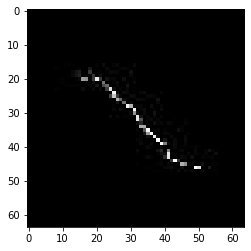

confidence for 9008 is 0.99992937


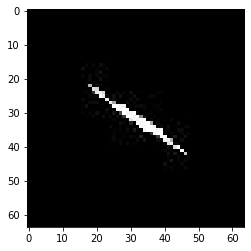

confidence for 9018 is 0.99998957


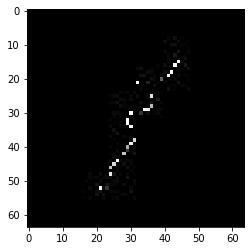

confidence for 9043 is 0.9476915


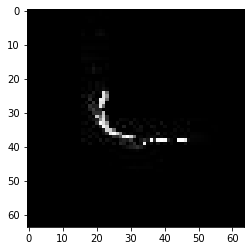

confidence for 9045 is 0.9434115


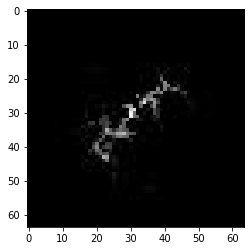

confidence for 9050 is 0.9980166


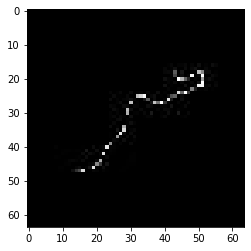

confidence for 9060 is 0.9961509


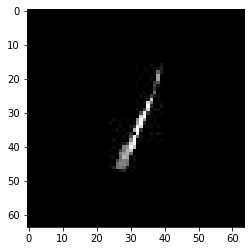

confidence for 9073 is 0.9564678


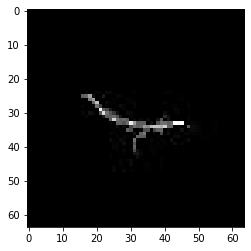

confidence for 9081 is 0.9999999


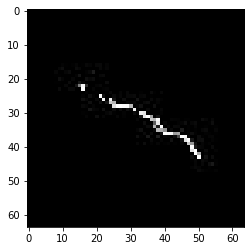

confidence for 9087 is 1.0


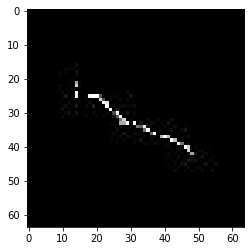

confidence for 9106 is 0.9814133


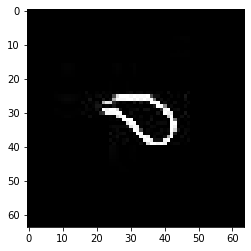

confidence for 9114 is 0.9999976


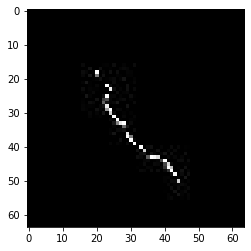

confidence for 9139 is 0.9192906


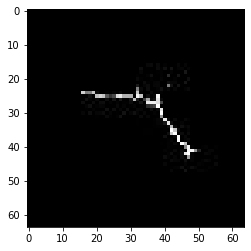

confidence for 9162 is 0.99999785


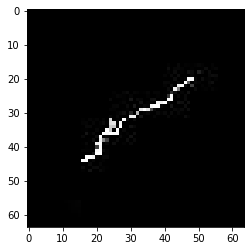

confidence for 9165 is 0.91568065


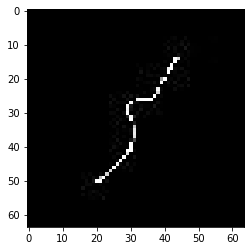

confidence for 9195 is 0.98979694


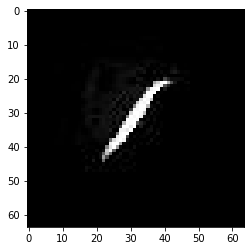

confidence for 9208 is 0.9999962


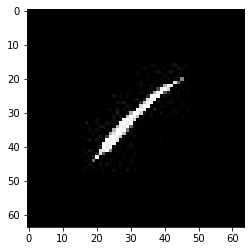

confidence for 9217 is 0.99851817


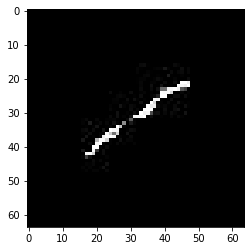

confidence for 9232 is 0.95994586


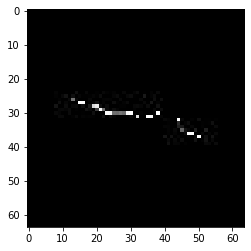

confidence for 9242 is 0.9034303


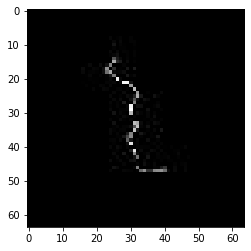

confidence for 9294 is 0.9887341


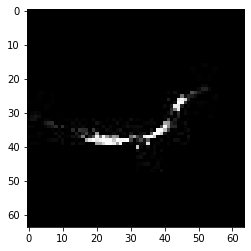

confidence for 9313 is 0.961241


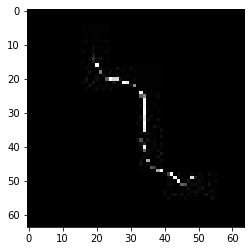

confidence for 9331 is 0.99533445


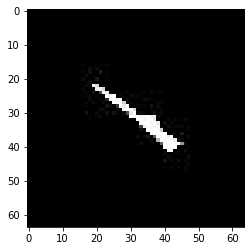

confidence for 9338 is 0.909089


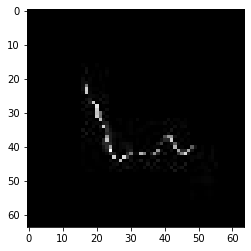

confidence for 9358 is 0.96799916


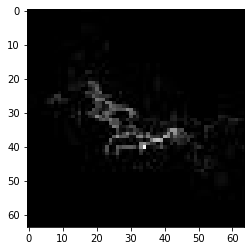

confidence for 9379 is 0.9692797


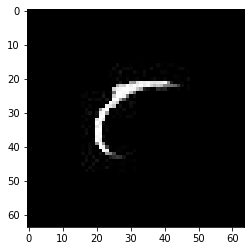

confidence for 9380 is 0.966022


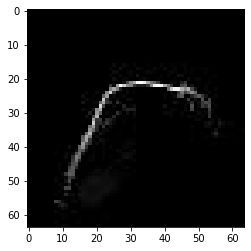

confidence for 9426 is 0.94011277


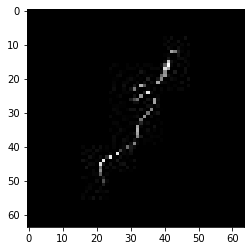

confidence for 9430 is 1.0


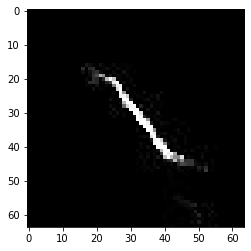

confidence for 9438 is 0.9594241


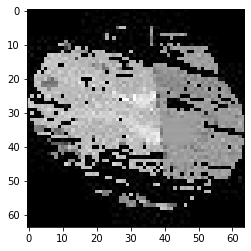

confidence for 9446 is 1.0


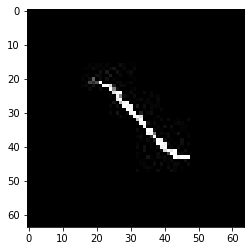

confidence for 9448 is 0.9976101


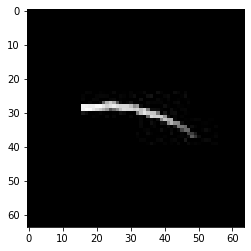

confidence for 9465 is 1.0


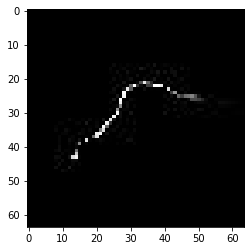

confidence for 9482 is 0.999989


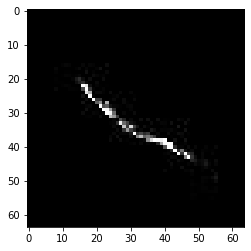

confidence for 9484 is 0.9919375


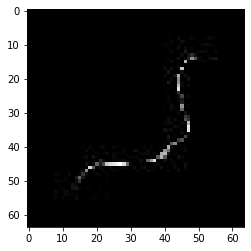

confidence for 9493 is 0.99902946


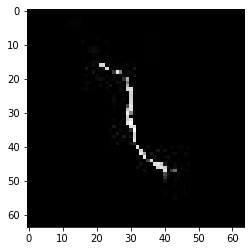

confidence for 9494 is 0.99999994


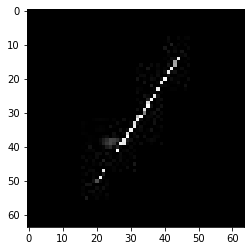

confidence for 9500 is 0.9749322


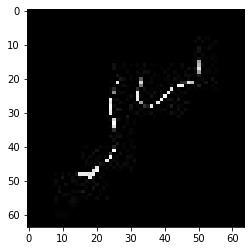

confidence for 9515 is 0.9535987


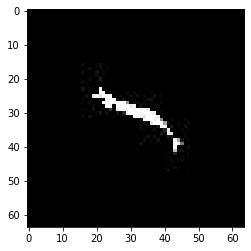

confidence for 9522 is 0.9662365


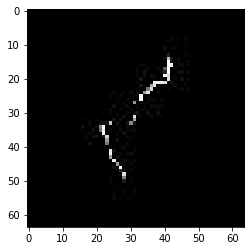

confidence for 9531 is 0.9461277


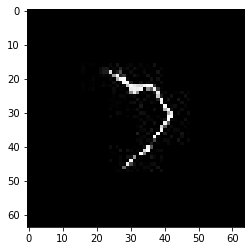

confidence for 9577 is 0.98442525


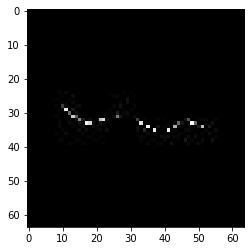

confidence for 9582 is 0.98871857


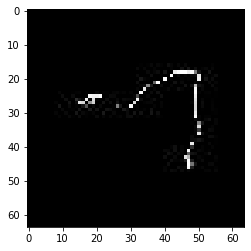

confidence for 9590 is 0.99994904


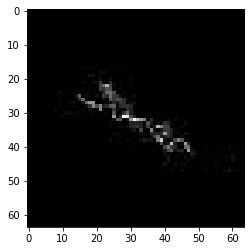

confidence for 9605 is 0.99999243


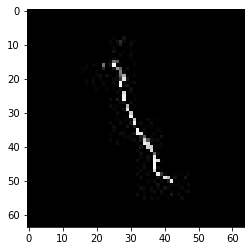

confidence for 9613 is 0.95259726


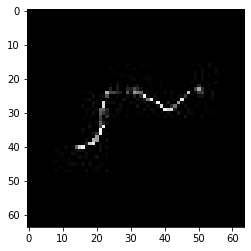

confidence for 9661 is 0.9772128


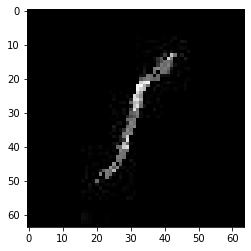

confidence for 9683 is 0.9980156


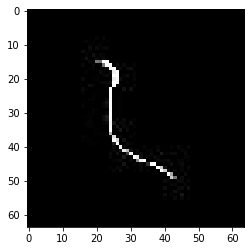

confidence for 9690 is 0.9999544


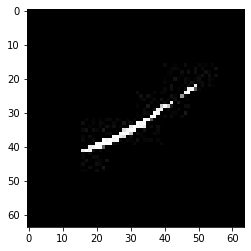

confidence for 9698 is 0.9968933


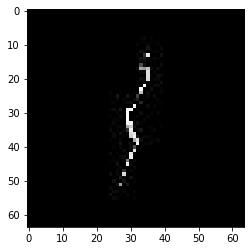

confidence for 9718 is 0.9569658


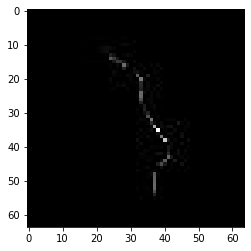

confidence for 9785 is 0.9630248


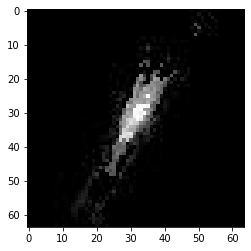

confidence for 9798 is 0.964861


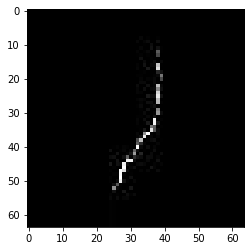

confidence for 9801 is 1.0


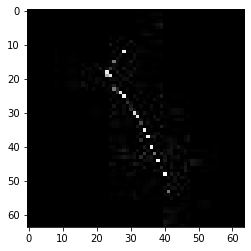

confidence for 9806 is 0.9210323


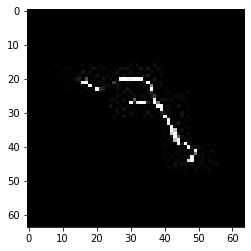

confidence for 9847 is 0.915211


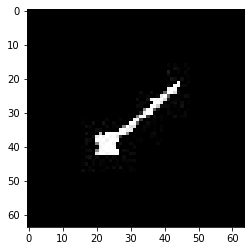

confidence for 9855 is 0.9857728


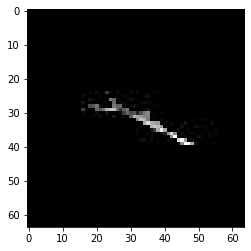

confidence for 9868 is 0.94351923


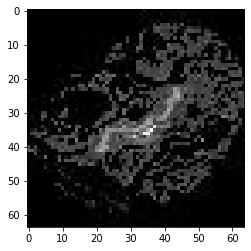

confidence for 9882 is 0.9618338


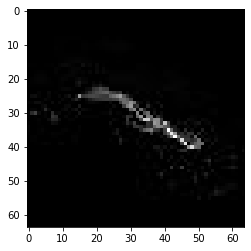

confidence for 9956 is 0.980116


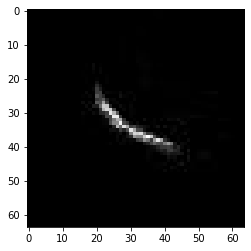

confidence for 9970 is 0.98013824


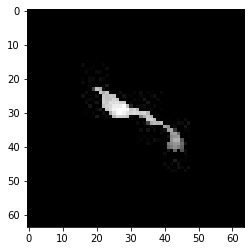

confidence for 10018 is 0.99124926


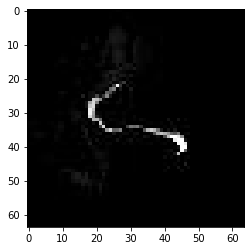

confidence for 10061 is 0.93097913


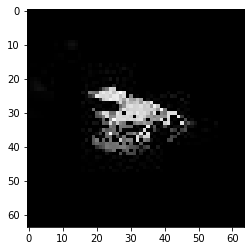

confidence for 10067 is 0.98543733


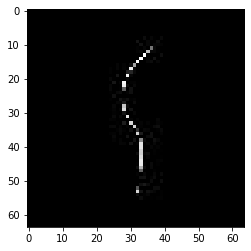

confidence for 10074 is 0.9999427


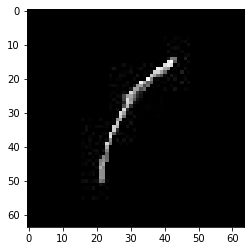

confidence for 10080 is 0.9936795


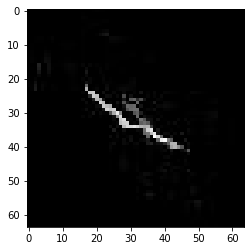

confidence for 10106 is 0.99645644


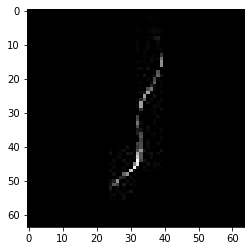

confidence for 10124 is 0.920683


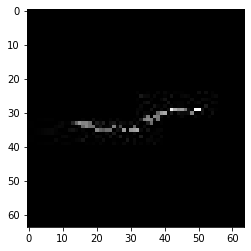

confidence for 10160 is 0.96033067


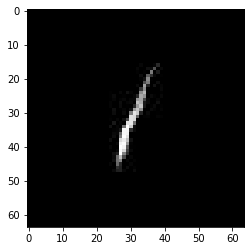

confidence for 10161 is 0.9528423


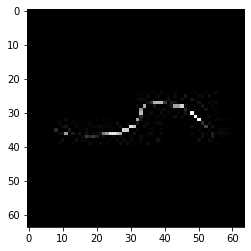

confidence for 10166 is 0.9303618


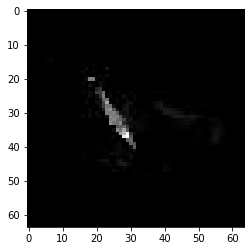

confidence for 10181 is 0.9999902


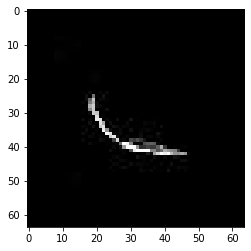

confidence for 10221 is 0.9540943


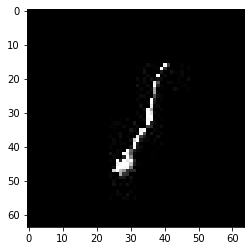

confidence for 10251 is 0.9999332


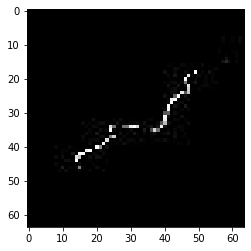

confidence for 10267 is 0.90232986


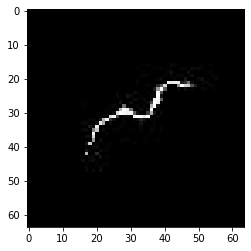

confidence for 10336 is 0.99767673


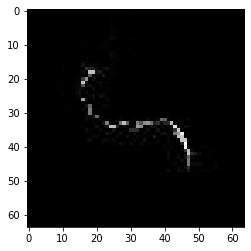

confidence for 10353 is 0.9542659


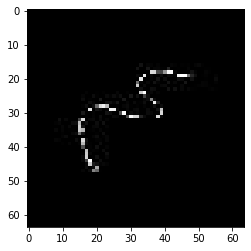

confidence for 10371 is 0.99998367


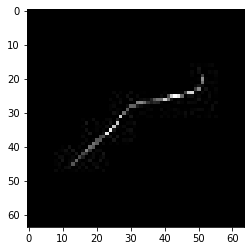

confidence for 10420 is 0.99997157


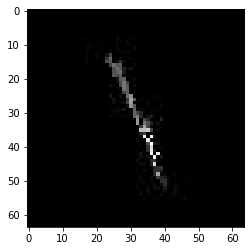

confidence for 10422 is 0.9718218


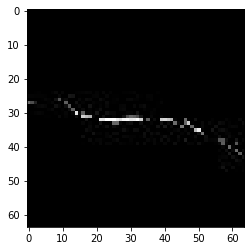

confidence for 10425 is 1.0


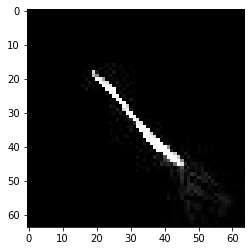

confidence for 10430 is 0.9999855


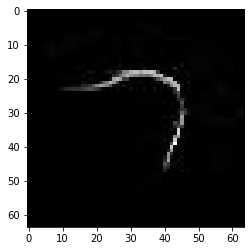

confidence for 10441 is 0.9958692


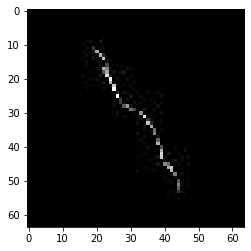

confidence for 10462 is 0.99822944


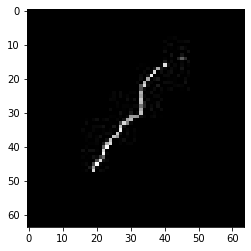

confidence for 10490 is 0.9999827


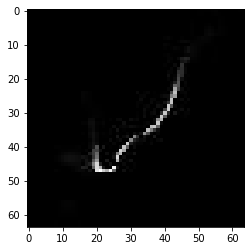

confidence for 10520 is 0.9505454


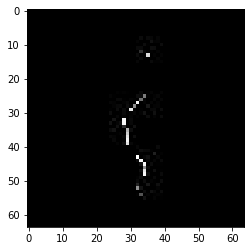

confidence for 10522 is 0.9266534


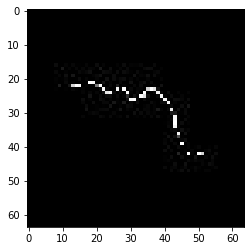

confidence for 10527 is 0.90152276


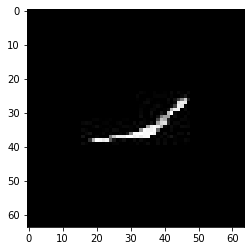

confidence for 10535 is 0.99573755


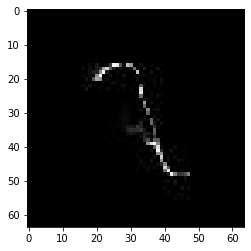

confidence for 10545 is 0.99999136


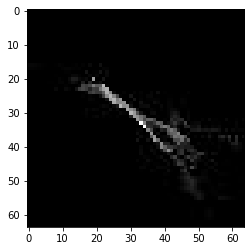

confidence for 10573 is 0.99566305


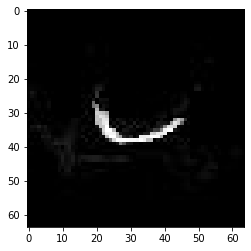

confidence for 10594 is 0.9933849


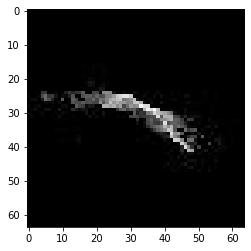

confidence for 10642 is 0.9999999


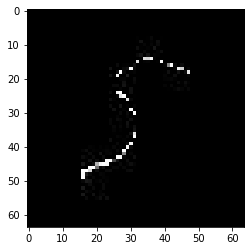

confidence for 10649 is 0.9999922


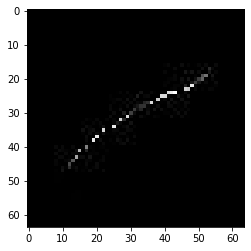

confidence for 10716 is 0.9994798


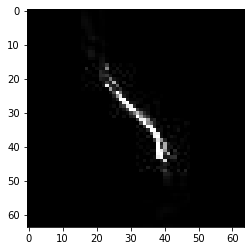

confidence for 10724 is 0.94763076


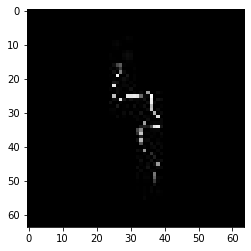

confidence for 10732 is 0.940125


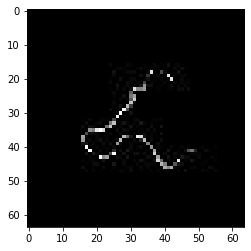

confidence for 10742 is 0.9991514


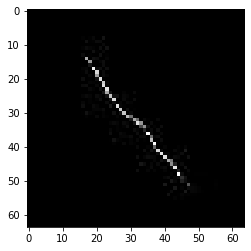

confidence for 10777 is 0.9986823


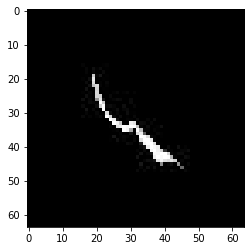

confidence for 10780 is 0.9992474


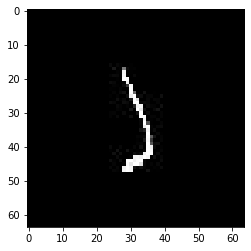

confidence for 10782 is 0.9999803


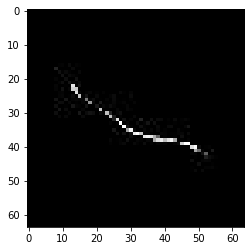

confidence for 10789 is 0.98150194


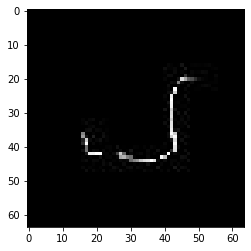

confidence for 10794 is 0.9874141


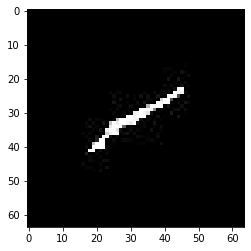

confidence for 10811 is 0.9999985


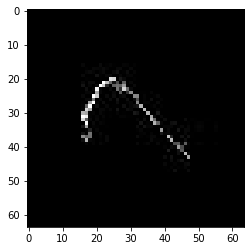

confidence for 10820 is 0.934979


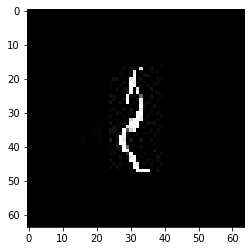

confidence for 10823 is 0.93750286


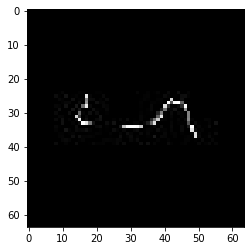

confidence for 10827 is 0.9999964


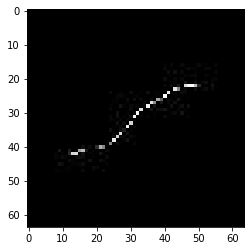

confidence for 10840 is 1.0


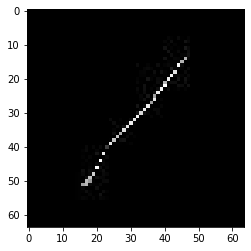

confidence for 10849 is 0.9918458


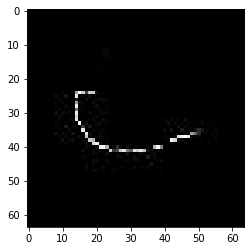

confidence for 10867 is 0.99015784


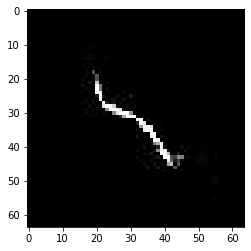

confidence for 10886 is 0.99561274


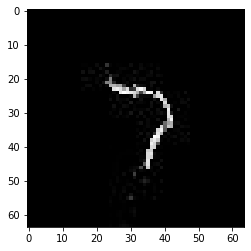

confidence for 10898 is 1.0


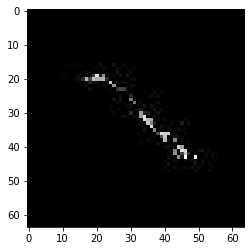

confidence for 10907 is 0.9997221


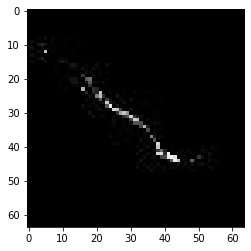

confidence for 10943 is 0.96412313


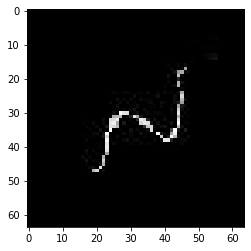

confidence for 10964 is 0.91722494


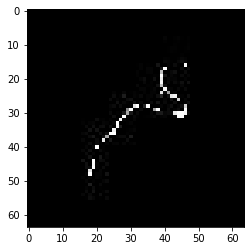

confidence for 10966 is 0.958644


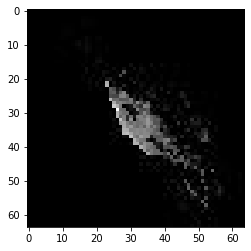

confidence for 10969 is 0.9912926


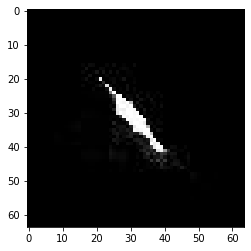

confidence for 10992 is 0.9992913


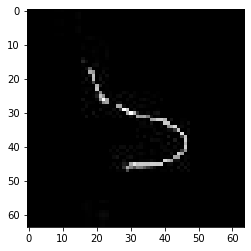

confidence for 11013 is 0.9999687


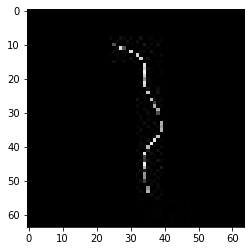

confidence for 11041 is 0.95915514


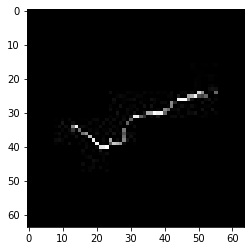

confidence for 11042 is 0.98024076


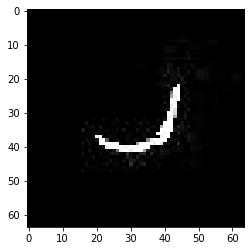

confidence for 11050 is 0.93603766


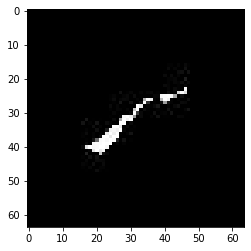

confidence for 11065 is 0.9999946


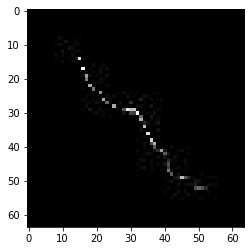

confidence for 11074 is 0.9944293


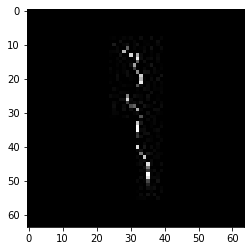

confidence for 11096 is 0.9700582


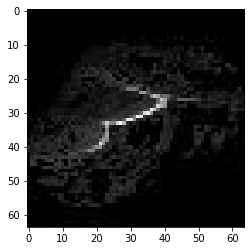

confidence for 11103 is 0.99997574


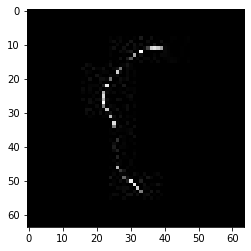

confidence for 11142 is 0.9393874


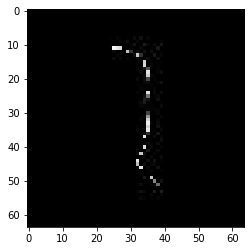

confidence for 11150 is 0.945352


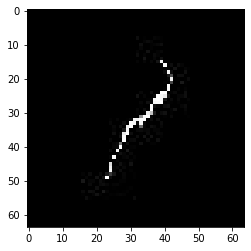

confidence for 11169 is 1.0


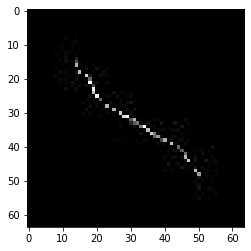

confidence for 11173 is 0.9555513


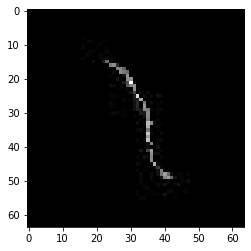

confidence for 11287 is 0.9872989


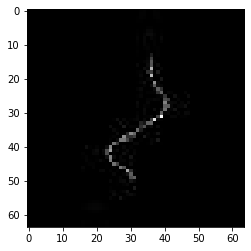

confidence for 11288 is 0.9956473


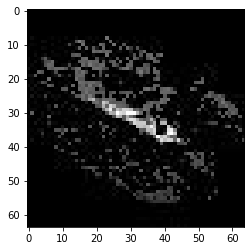

confidence for 11289 is 0.9994508


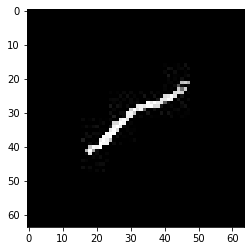

confidence for 11316 is 0.95741814


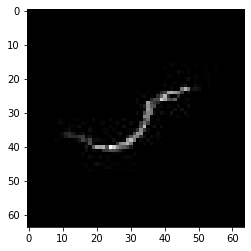

confidence for 11339 is 1.0


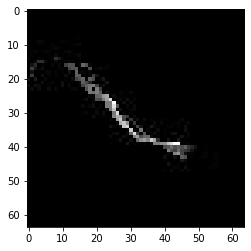

confidence for 11352 is 0.9989172


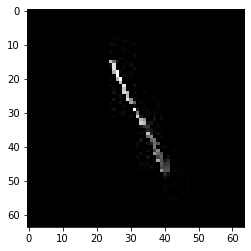

confidence for 11374 is 0.99998915


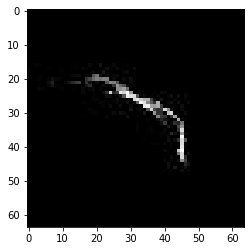

confidence for 11467 is 0.9997254


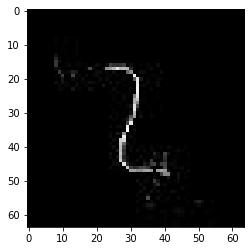

confidence for 11490 is 0.99794984


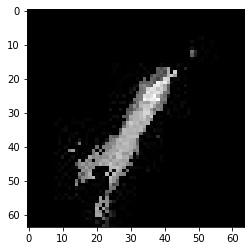

confidence for 11522 is 1.0


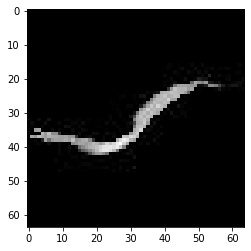

confidence for 11542 is 0.99999976


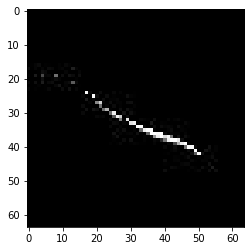

confidence for 11559 is 0.98843503


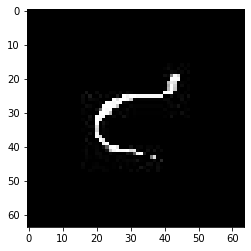

confidence for 11575 is 0.9005491


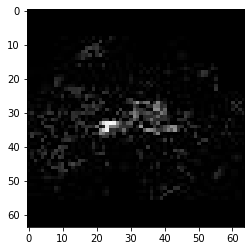

confidence for 11599 is 0.9999993


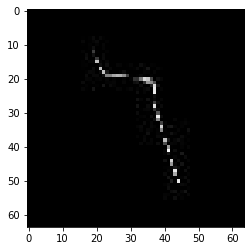

confidence for 11625 is 0.999957


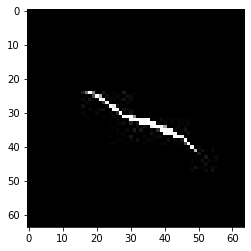

confidence for 11637 is 0.99968684


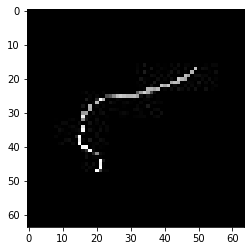

confidence for 11638 is 0.92507726


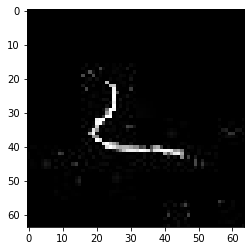

confidence for 11675 is 0.9960224


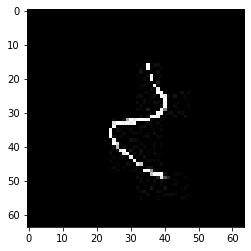

confidence for 11715 is 0.99996734


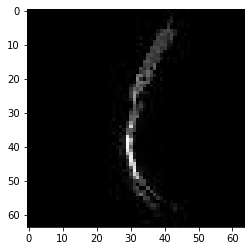

confidence for 11737 is 0.9984916


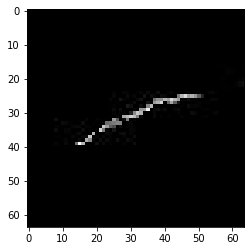

confidence for 11741 is 0.95312613


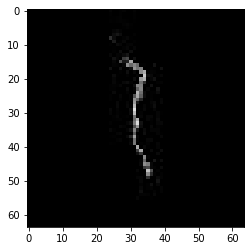

confidence for 11744 is 0.9992814


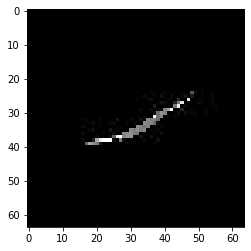

confidence for 11752 is 0.99999994


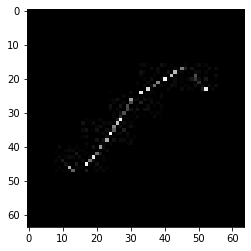

confidence for 11774 is 0.99878997


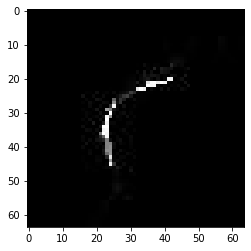

confidence for 11799 is 0.9997378


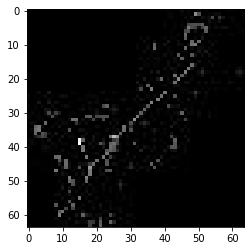

confidence for 11823 is 0.99999946


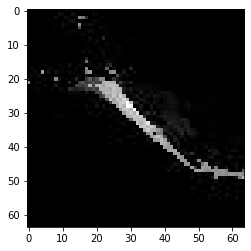

confidence for 11846 is 0.9149323


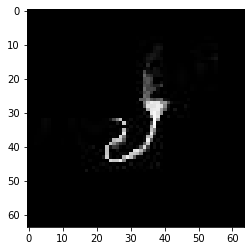

confidence for 11856 is 0.99426


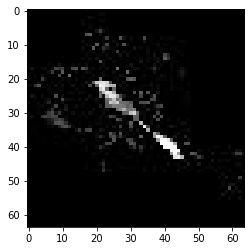

confidence for 11911 is 0.99976003


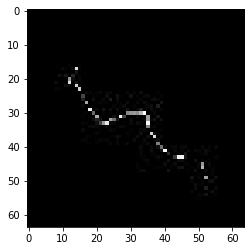

confidence for 11923 is 0.92600864


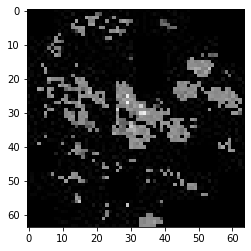

confidence for 11948 is 1.0


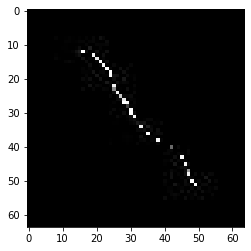

confidence for 11975 is 0.99985594


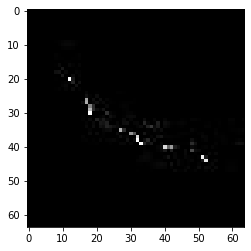

confidence for 11980 is 0.98960525


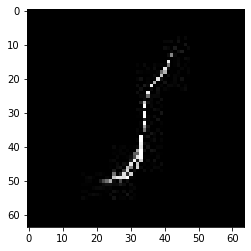

confidence for 11988 is 0.9870816


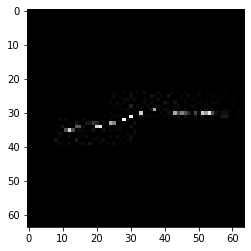

confidence for 11998 is 0.9079908


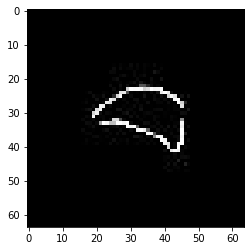

confidence for 12021 is 0.9998409


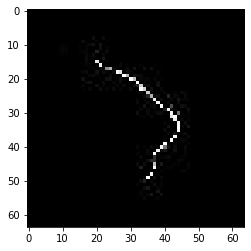

confidence for 12036 is 0.9990052


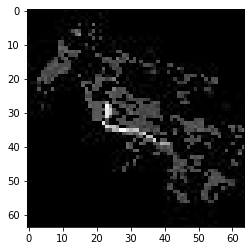

confidence for 12041 is 0.9999547


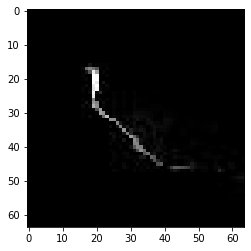

confidence for 12053 is 0.9999973


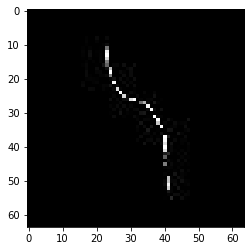

confidence for 12057 is 0.9997524


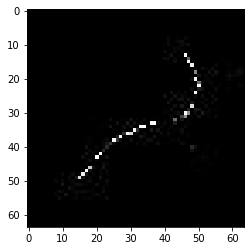

confidence for 12092 is 0.99999946


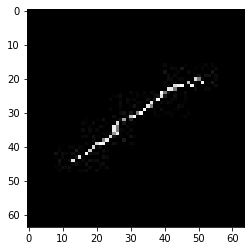

confidence for 12101 is 1.0


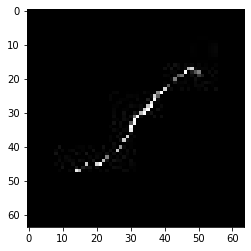

confidence for 12117 is 0.99999833


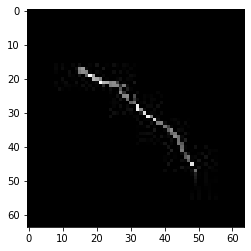

confidence for 12120 is 0.9992352


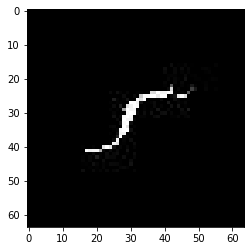

confidence for 12123 is 0.99295247


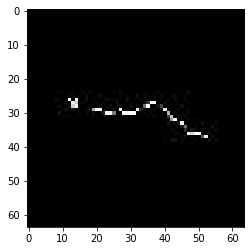

confidence for 12130 is 0.9999829


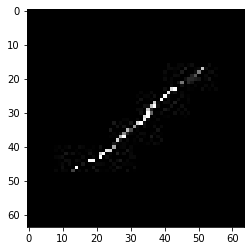

confidence for 12133 is 0.9985905


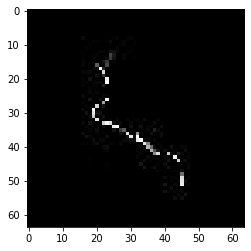

confidence for 12165 is 1.0


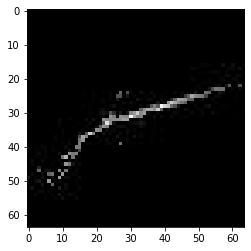

confidence for 12194 is 0.99378324


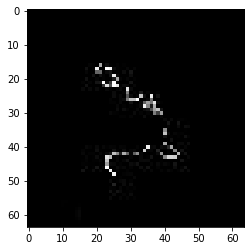

confidence for 12204 is 0.9999101


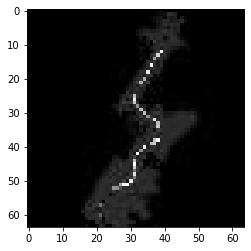

confidence for 12207 is 0.9935517


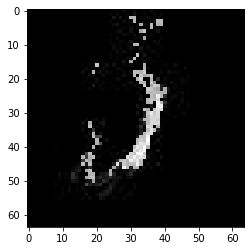

confidence for 12234 is 0.9999559


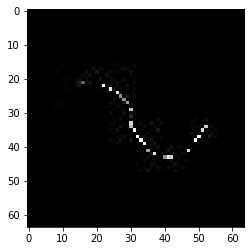

confidence for 12237 is 0.99800104


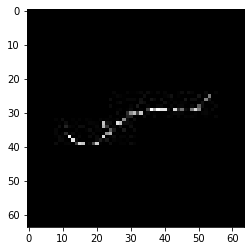

confidence for 12256 is 0.97322166


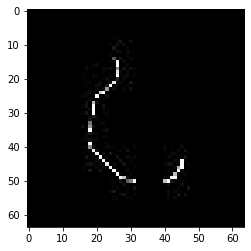

confidence for 12261 is 0.9663622


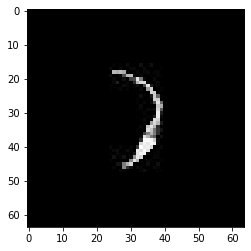

confidence for 12278 is 0.99999267


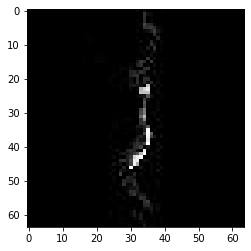

confidence for 12295 is 0.9999998


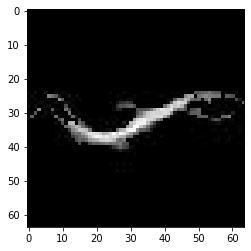

confidence for 12310 is 0.9998568


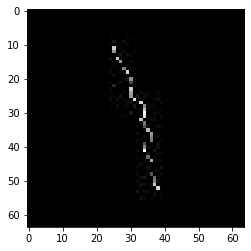

confidence for 12322 is 0.9899855


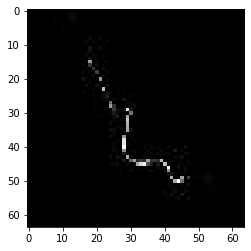

confidence for 12332 is 0.9658354


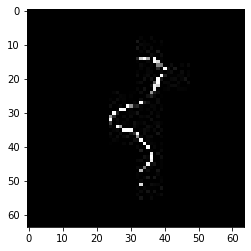

confidence for 12346 is 0.9999942


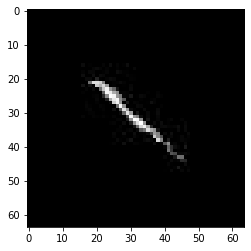

confidence for 12410 is 0.99729717


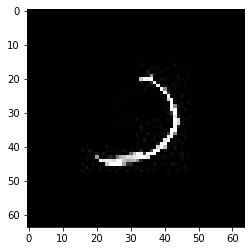

confidence for 12418 is 0.9076162


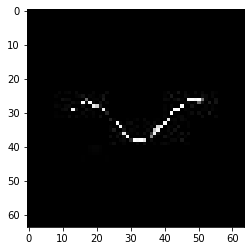

confidence for 12422 is 0.9994991


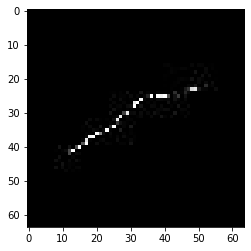

confidence for 12424 is 0.999995


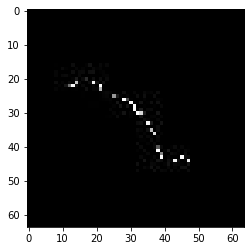

confidence for 12427 is 0.99950844


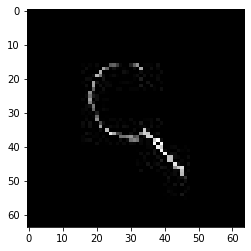

confidence for 12449 is 0.9999923


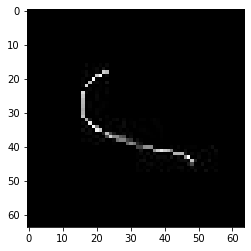

confidence for 12465 is 0.9998052


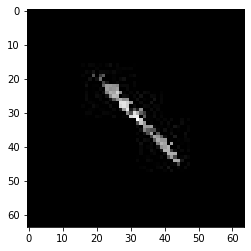

confidence for 12477 is 0.9952586


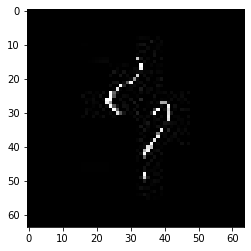

confidence for 12504 is 0.920488


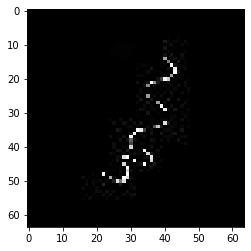

confidence for 12512 is 0.9668697


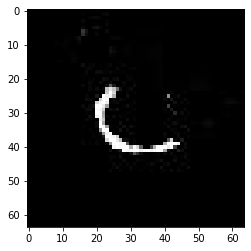

confidence for 12519 is 0.99999255


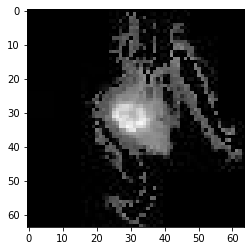

confidence for 12580 is 0.9466951


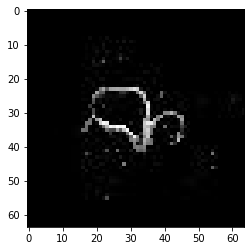

confidence for 12595 is 1.0


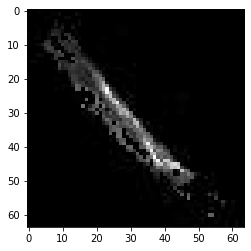

confidence for 12673 is 0.93537045


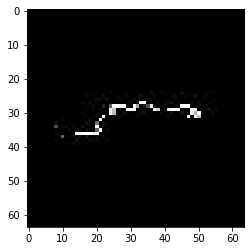

confidence for 12745 is 0.9160549


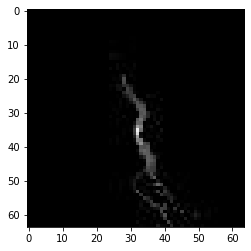

confidence for 12772 is 0.9998553


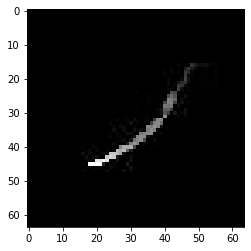

confidence for 12788 is 0.91982865


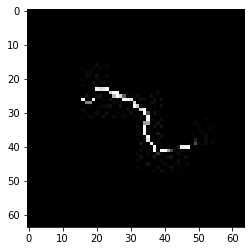

confidence for 12789 is 0.9850488


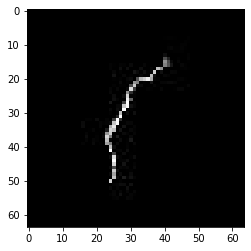

confidence for 12797 is 0.99153525


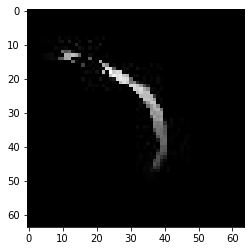

confidence for 12812 is 0.9981808


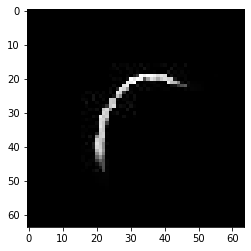

confidence for 12815 is 0.999864


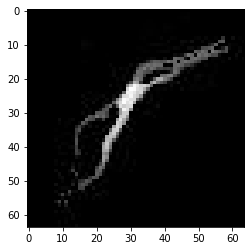

confidence for 12852 is 0.99954355


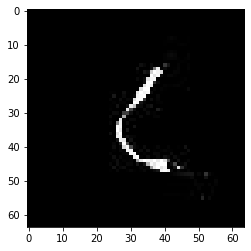

confidence for 12870 is 0.98045874


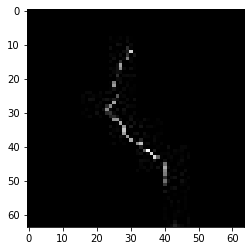

confidence for 12879 is 0.99929786


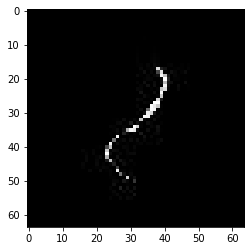

confidence for 12881 is 0.99964905


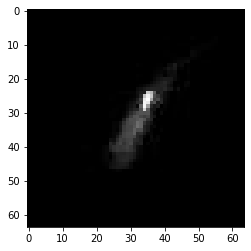

confidence for 12895 is 0.9734197


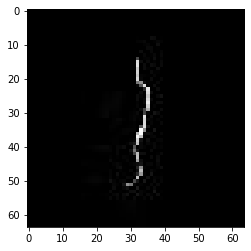

confidence for 12898 is 0.9757502


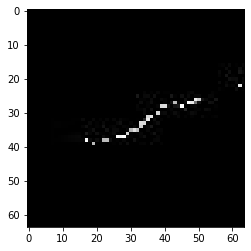

confidence for 12900 is 0.9965634


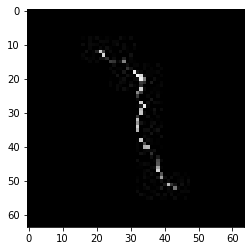

confidence for 12928 is 0.9950946


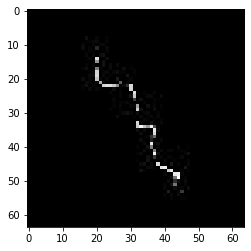

confidence for 12938 is 0.97612613


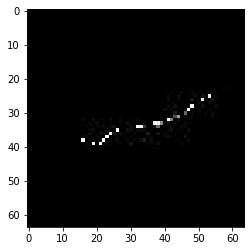

confidence for 12940 is 0.927654


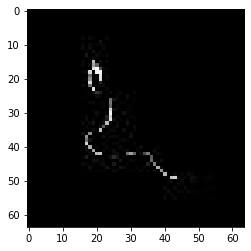

confidence for 12974 is 0.99998313


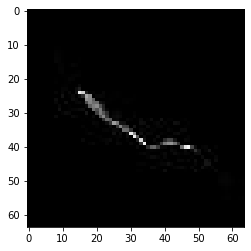

confidence for 12994 is 0.9999397


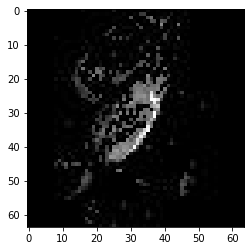

confidence for 13006 is 0.9999644


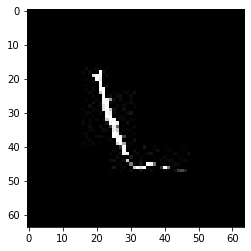

confidence for 13008 is 0.9986401


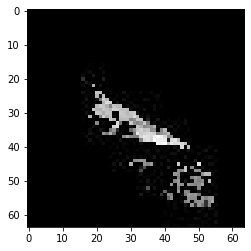

confidence for 13025 is 0.9999254


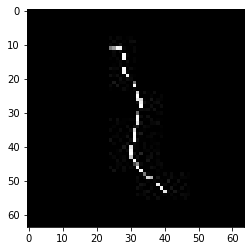

confidence for 13036 is 0.99291474


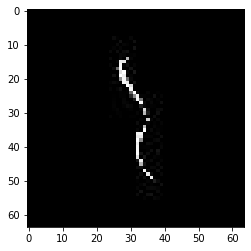

confidence for 13050 is 0.9986977


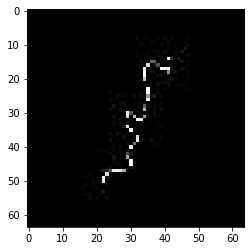

confidence for 13058 is 0.9999557


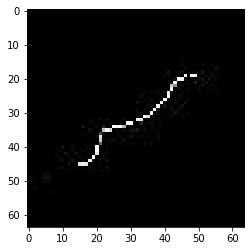

confidence for 13060 is 0.97260934


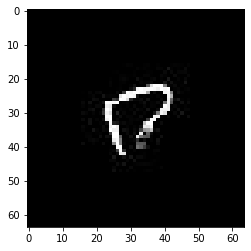

confidence for 13064 is 0.97535425


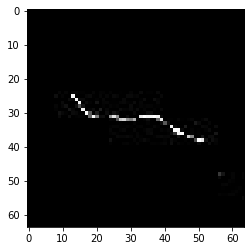

confidence for 13085 is 0.9932836


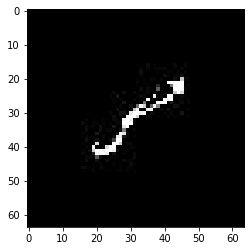

confidence for 13100 is 0.998536


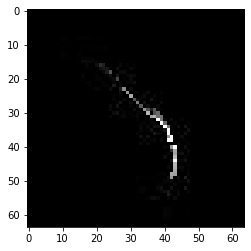

confidence for 13122 is 0.9176933


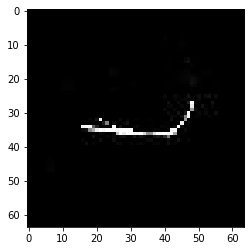

confidence for 13124 is 0.99960095


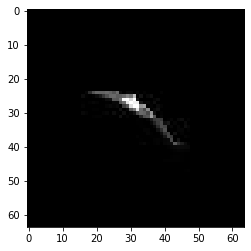

confidence for 13127 is 0.99929297


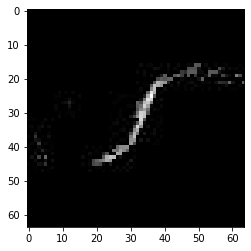

confidence for 13129 is 0.9663427


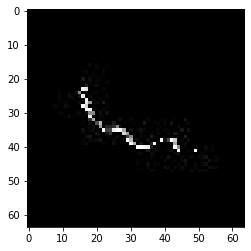

confidence for 13133 is 0.98289806


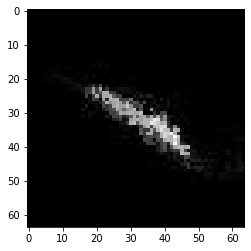

confidence for 13153 is 0.961462


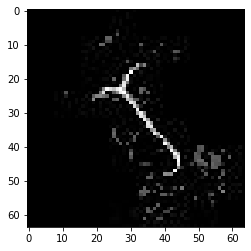

confidence for 13169 is 0.9991304


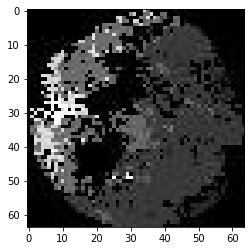

confidence for 13205 is 0.9996736


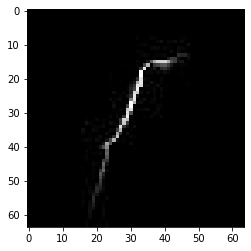

confidence for 13207 is 0.99981385


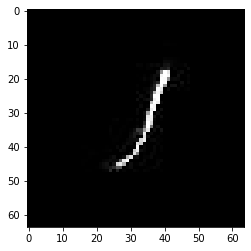

confidence for 13211 is 1.0


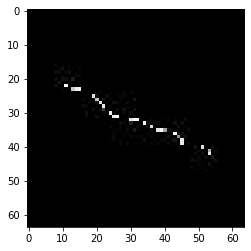

confidence for 13218 is 0.9099045


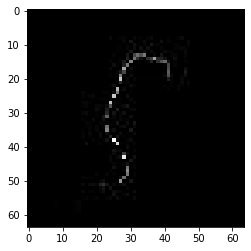

confidence for 13220 is 0.9938327


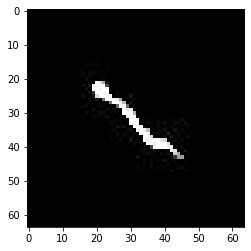

confidence for 13221 is 0.96814406


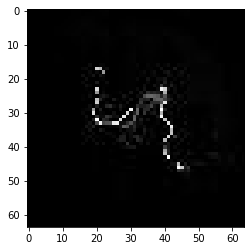

confidence for 13228 is 0.9999609


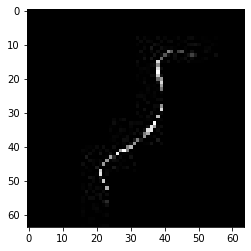

confidence for 13237 is 0.9343884


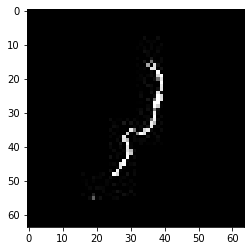

confidence for 13240 is 0.9358634


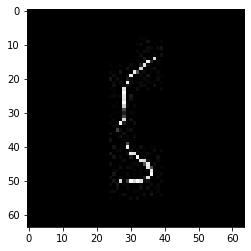

confidence for 13244 is 0.9996556


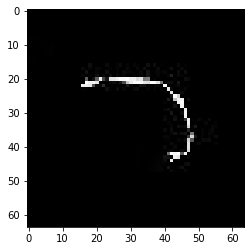

confidence for 13247 is 0.9999791


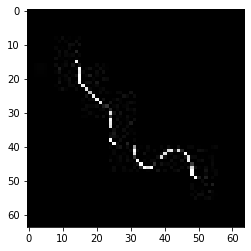

confidence for 13251 is 0.960776


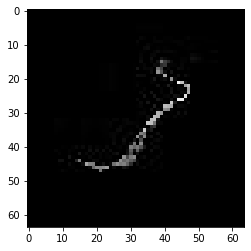

confidence for 13255 is 0.99408096


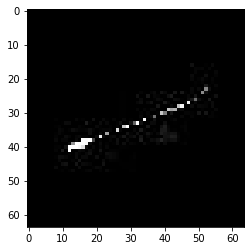

confidence for 13266 is 0.960655


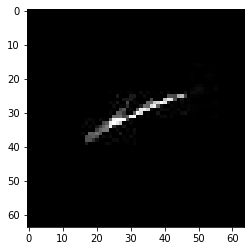

confidence for 13294 is 0.9993288


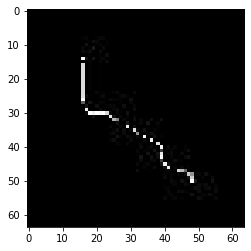

confidence for 13308 is 0.9099161


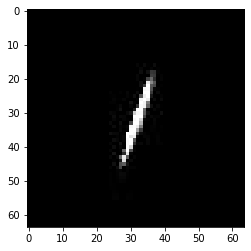

confidence for 13313 is 0.99390465


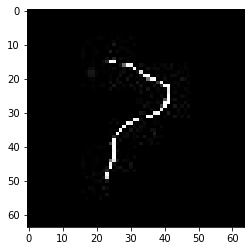

confidence for 13334 is 0.999804


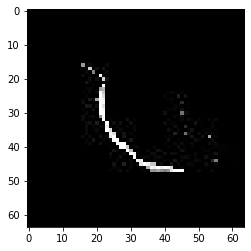

confidence for 13370 is 0.97194415


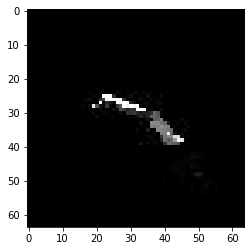

confidence for 13374 is 0.9099592


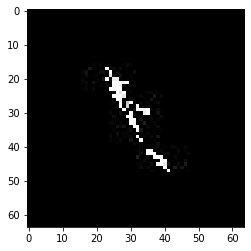

confidence for 13380 is 0.99995303


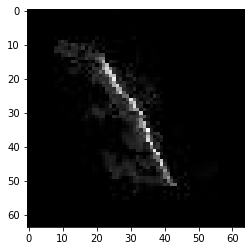

confidence for 13384 is 1.0


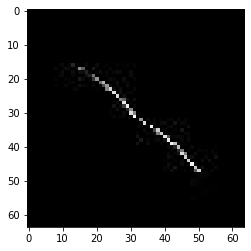

confidence for 13416 is 0.9842585


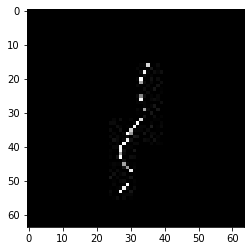

confidence for 13420 is 0.99900025


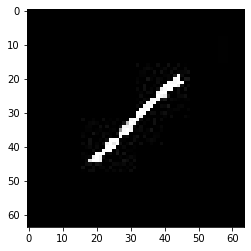

confidence for 13433 is 1.0


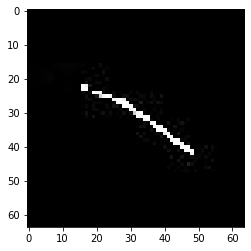

confidence for 13446 is 1.0


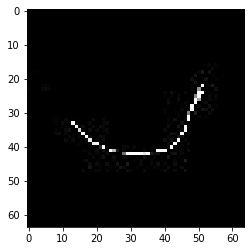

confidence for 13467 is 0.98224634


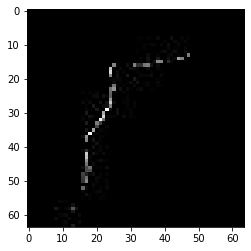

confidence for 13471 is 0.9115387


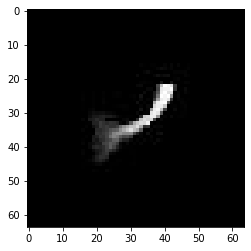

confidence for 13503 is 0.99748623


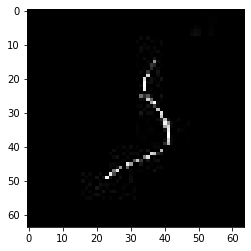

confidence for 13513 is 0.9168942


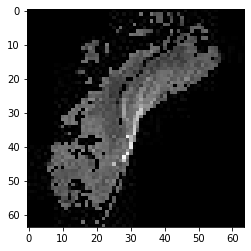

confidence for 13530 is 0.9994478


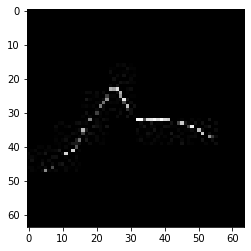

confidence for 13545 is 0.99722797


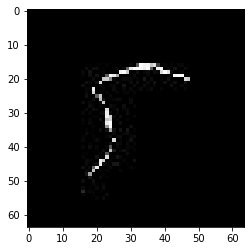

confidence for 13554 is 0.99932104


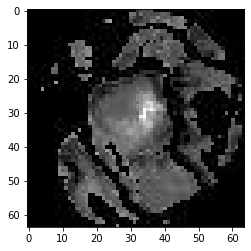

confidence for 13556 is 0.99545693


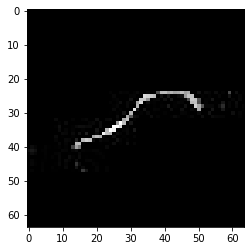

confidence for 13563 is 0.9712572


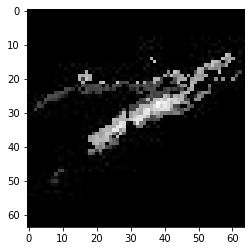

confidence for 13580 is 0.9601803


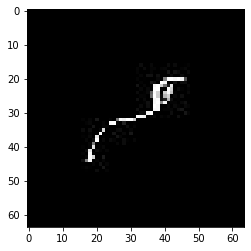

confidence for 13627 is 0.99568474


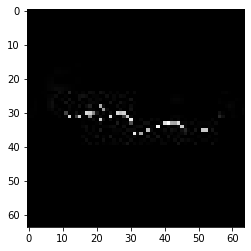

confidence for 13642 is 0.9999665


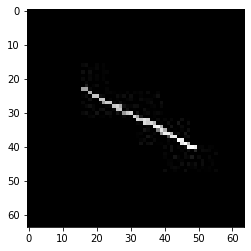

confidence for 13676 is 0.99882555


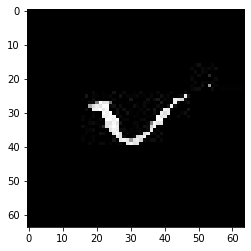

confidence for 13685 is 0.9999987


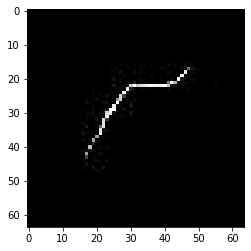

confidence for 13695 is 0.9276574


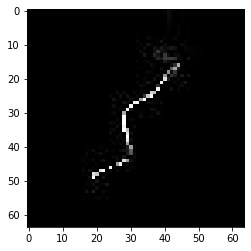

confidence for 13735 is 0.9945826


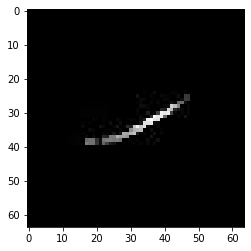

confidence for 13743 is 0.99760836


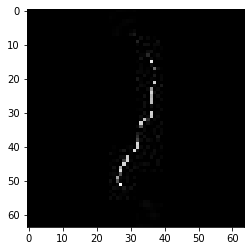

confidence for 13749 is 0.957351


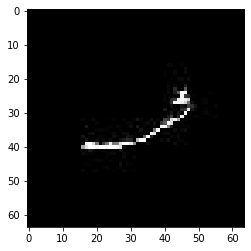

confidence for 13753 is 0.9413773


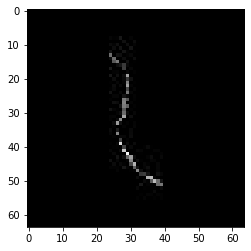

confidence for 13754 is 0.99888664


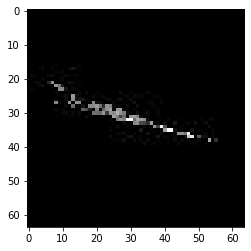

confidence for 13772 is 0.99918336


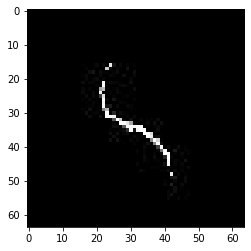

confidence for 13773 is 0.99788487


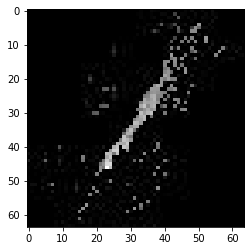

confidence for 13781 is 0.99754316


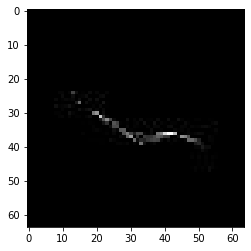

confidence for 13804 is 0.99998194


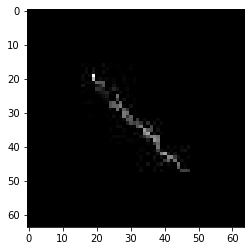

confidence for 13809 is 0.9914708


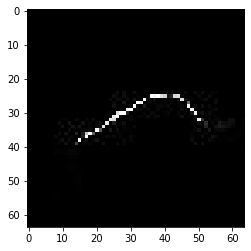

confidence for 13810 is 0.9982346


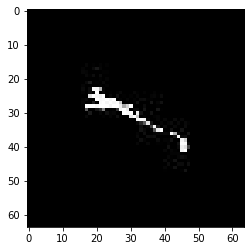

confidence for 13837 is 0.99065846


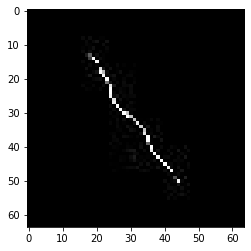

confidence for 13838 is 0.99991196


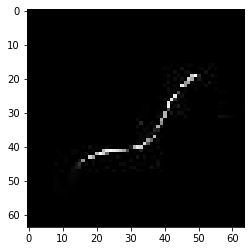

confidence for 13847 is 0.9729891


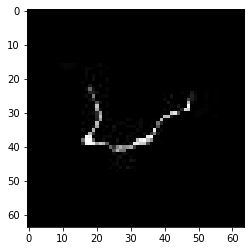

confidence for 13851 is 0.9963296


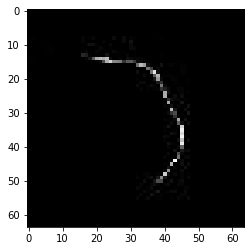

confidence for 13855 is 0.99838585


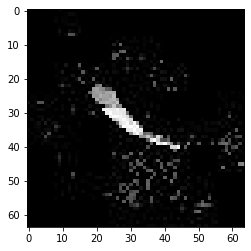

confidence for 13874 is 0.999851


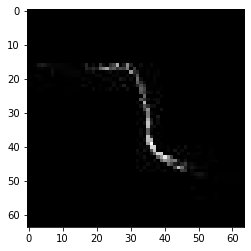

confidence for 13883 is 0.94942075


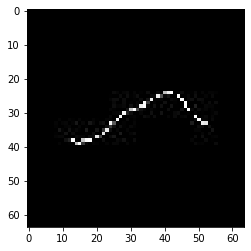

confidence for 13895 is 0.9999629


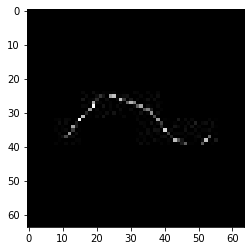

confidence for 13920 is 0.98468995


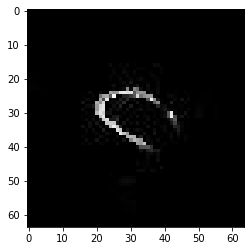

confidence for 13957 is 1.0


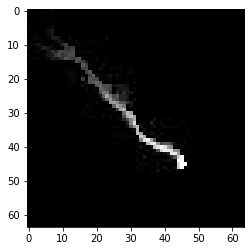

confidence for 13985 is 0.99947155


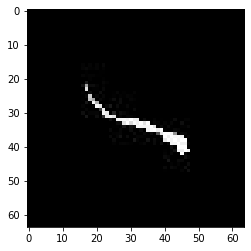

confidence for 14027 is 0.91268003


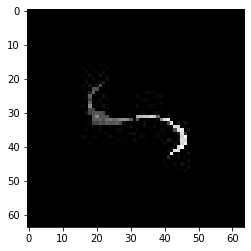

confidence for 14029 is 0.94919205


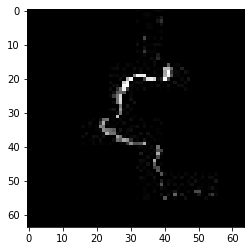

confidence for 14042 is 0.99856323


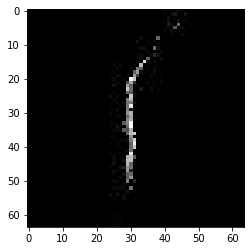

confidence for 14046 is 0.9999572


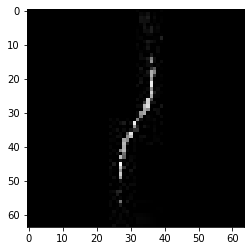

confidence for 14074 is 0.98681337


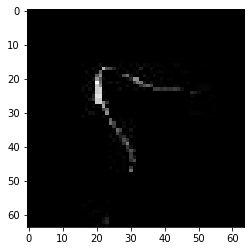

confidence for 14091 is 0.9719496


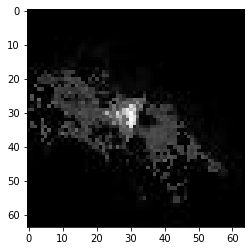

confidence for 14092 is 0.9817177


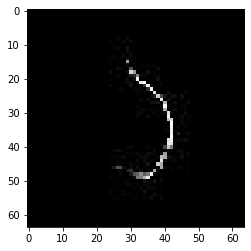

confidence for 14142 is 0.98950523


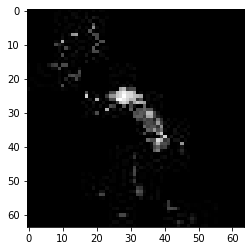

confidence for 14145 is 0.92581904


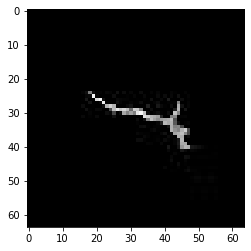

confidence for 14152 is 0.9723446


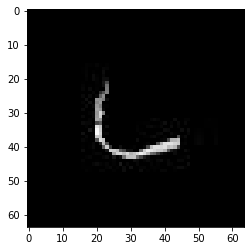

confidence for 14172 is 0.9999036


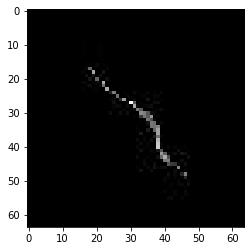

confidence for 14201 is 0.99995774


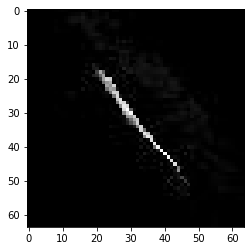

confidence for 14207 is 0.9997435


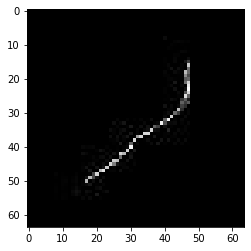

confidence for 14237 is 0.99978036


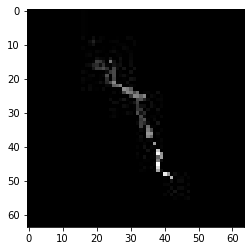

confidence for 14280 is 0.99999565


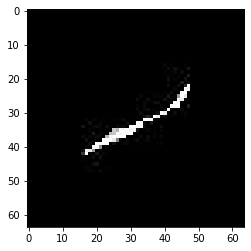

confidence for 14290 is 0.99130946


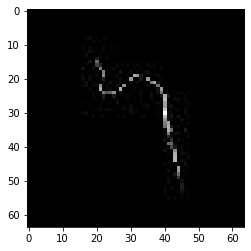

confidence for 14303 is 0.9999771


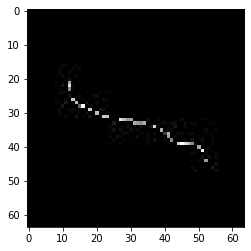

confidence for 14312 is 0.9998862


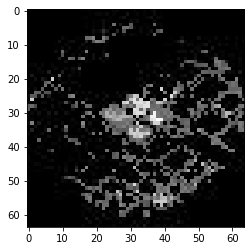

confidence for 14329 is 0.9706555


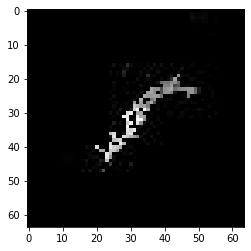

confidence for 14337 is 0.9398242


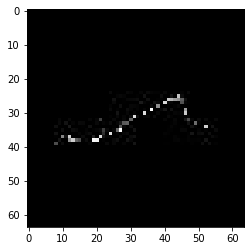

confidence for 14358 is 0.9883066


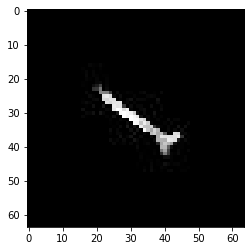

confidence for 14370 is 0.99927545


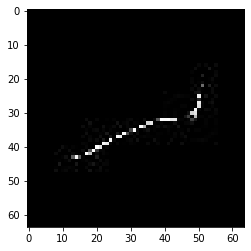

confidence for 14376 is 0.9161977


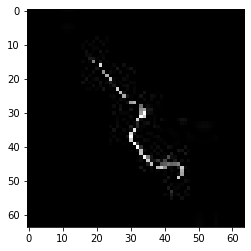

confidence for 14385 is 0.9996484


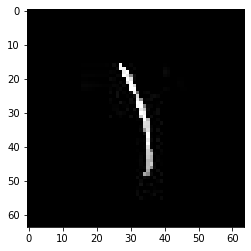

confidence for 14399 is 0.9501576


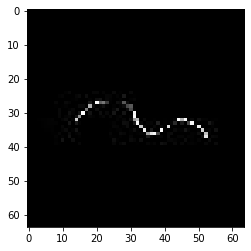

confidence for 14404 is 0.99730223


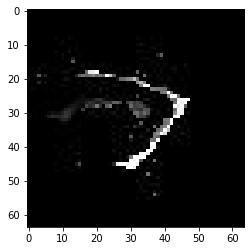

confidence for 14410 is 0.93311393


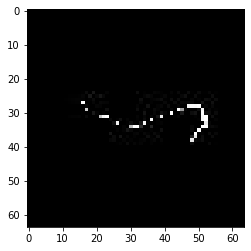

confidence for 14413 is 0.97789836


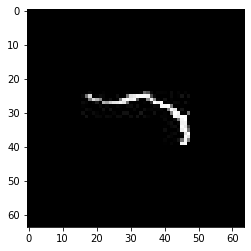

confidence for 14426 is 0.9999906


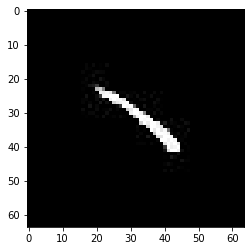

confidence for 14439 is 0.99999976


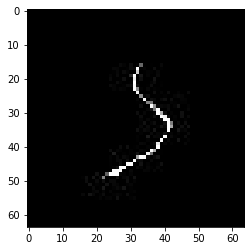

confidence for 14442 is 0.99981344


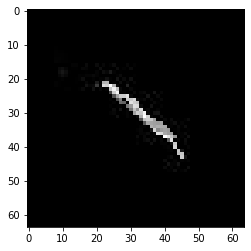

confidence for 14460 is 0.9999973


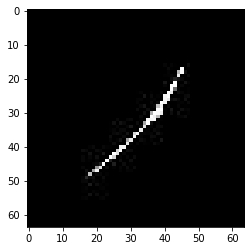

confidence for 14470 is 0.99999607


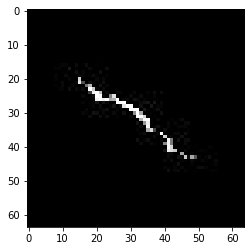

confidence for 14500 is 0.999999


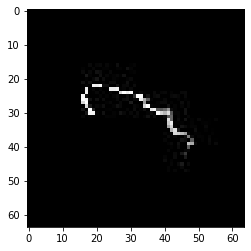

confidence for 14513 is 0.9175304


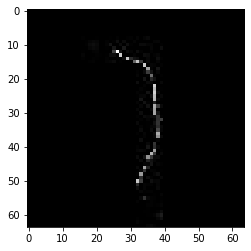

confidence for 14519 is 0.9952981


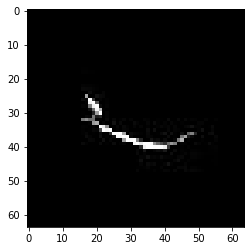

confidence for 14528 is 0.95023084


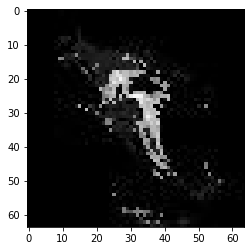

confidence for 14538 is 0.95407325


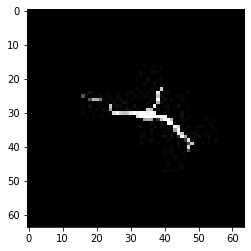

confidence for 14542 is 0.982495


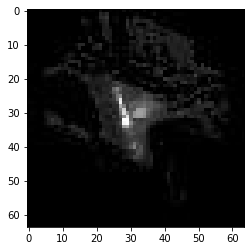

confidence for 14545 is 0.97043085


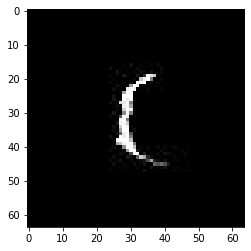

confidence for 14551 is 0.9995548


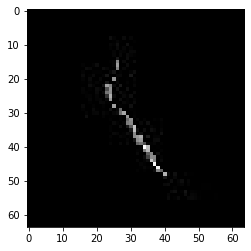

confidence for 14579 is 0.96130127


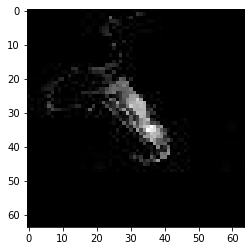

confidence for 14586 is 0.9978477


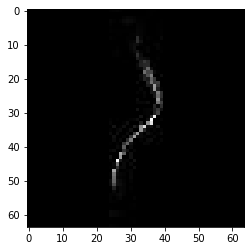

confidence for 14599 is 0.9777924


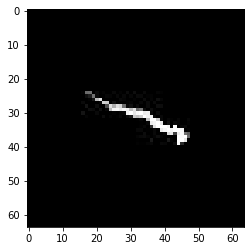

confidence for 14601 is 0.9993822


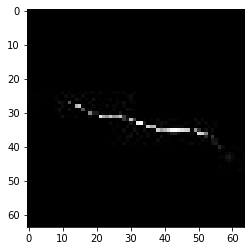

confidence for 14607 is 0.99975884


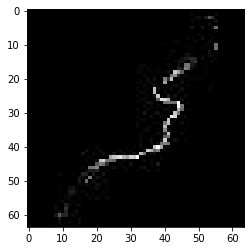

confidence for 14610 is 0.9906941


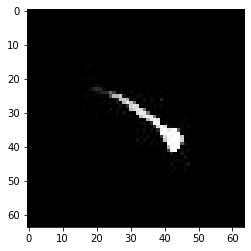

confidence for 14620 is 0.9994756


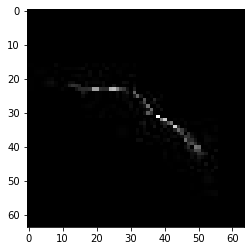

confidence for 14624 is 0.961329


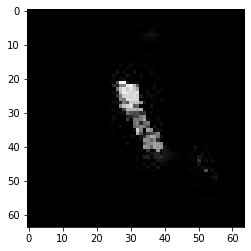

confidence for 14653 is 0.99785686


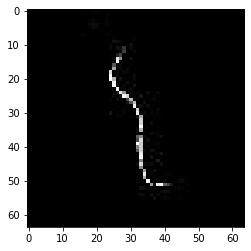

confidence for 14661 is 0.9437592


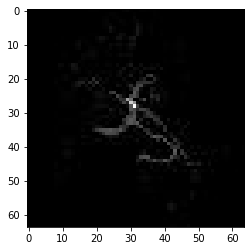

confidence for 14674 is 0.98354477


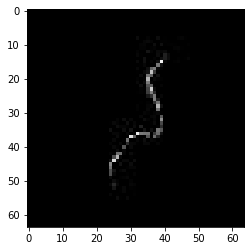

confidence for 14680 is 0.9998224


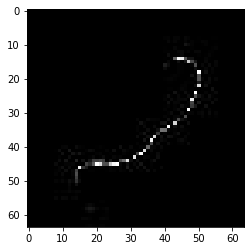

confidence for 14709 is 0.9999788


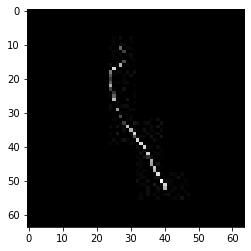

confidence for 14721 is 0.9901041


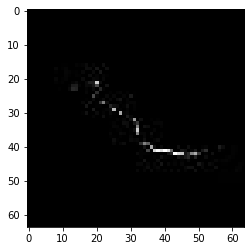

confidence for 14728 is 0.99783957


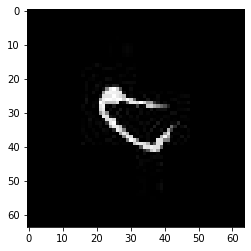

confidence for 14732 is 0.9997618


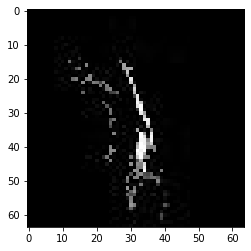

confidence for 14755 is 0.9552995


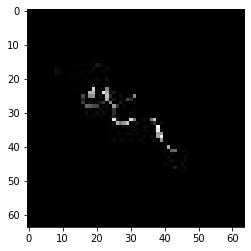

confidence for 14765 is 0.9291042


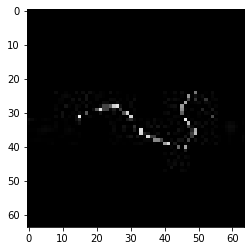

confidence for 14782 is 0.99842364


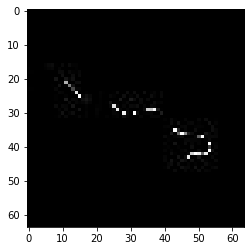

confidence for 14790 is 0.99999946


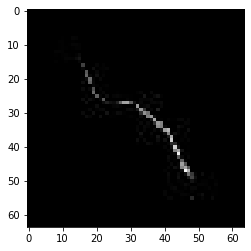

confidence for 14793 is 0.9356948


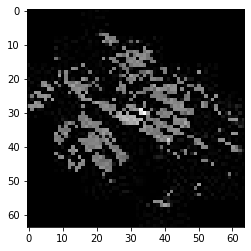

confidence for 14794 is 0.9995915


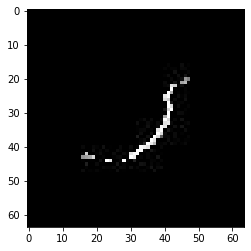

confidence for 14796 is 0.9836418


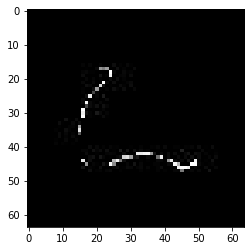

confidence for 14799 is 0.99995875


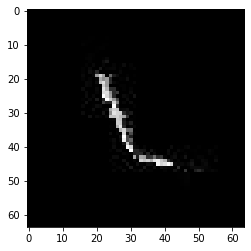

confidence for 14802 is 0.9952519


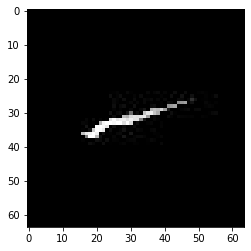

confidence for 14803 is 0.9661626


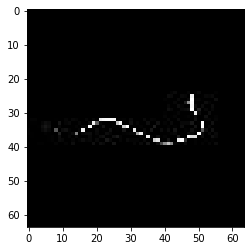

confidence for 14815 is 0.99705464


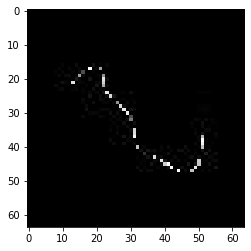

confidence for 14816 is 0.99988645


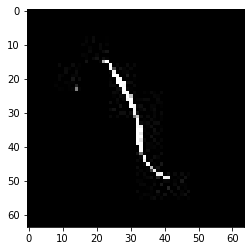

confidence for 14820 is 0.9920799


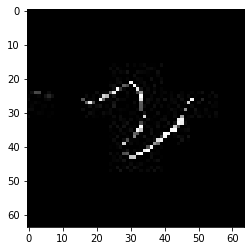

confidence for 14823 is 0.999356


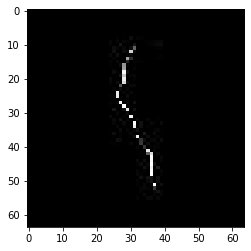

confidence for 14831 is 0.9998868


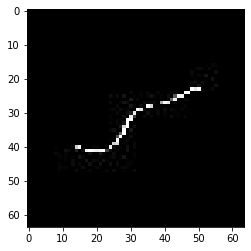

confidence for 14834 is 0.9975545


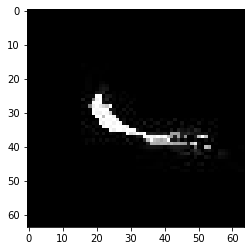

confidence for 14854 is 0.92792624


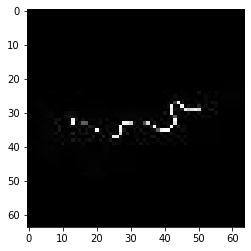

confidence for 14859 is 0.9995108


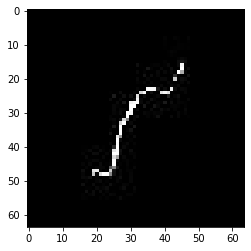

confidence for 14863 is 0.9855239


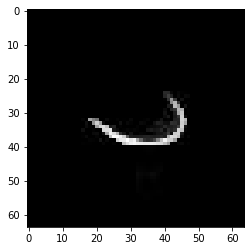

confidence for 14864 is 0.92476445


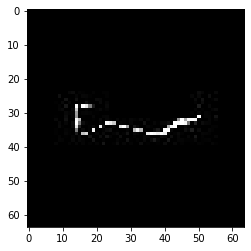

confidence for 14876 is 0.99814725


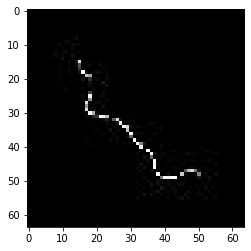

confidence for 14883 is 0.92658794


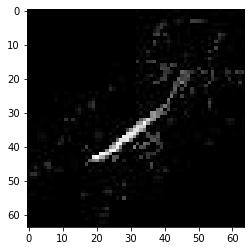

confidence for 14886 is 0.92532045


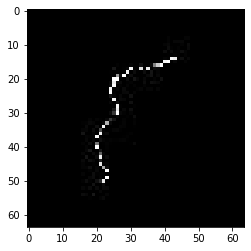

confidence for 14892 is 0.9971661


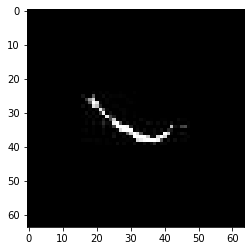

confidence for 14896 is 0.9441946


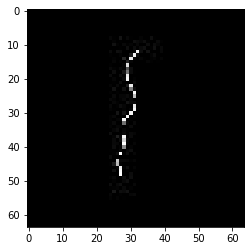

confidence for 14901 is 0.9916146


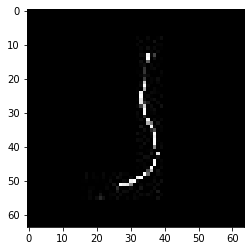

confidence for 14905 is 0.98911476


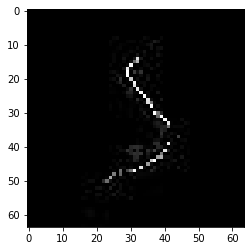

confidence for 14916 is 0.96939456


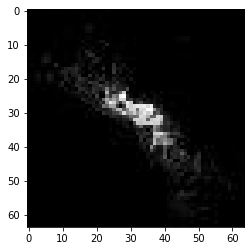

confidence for 14921 is 0.99999774


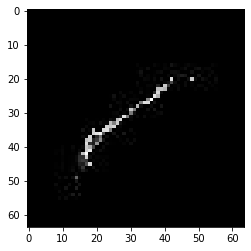

confidence for 14922 is 0.99999744


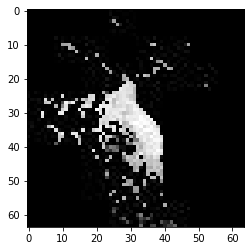

confidence for 14928 is 0.98688227


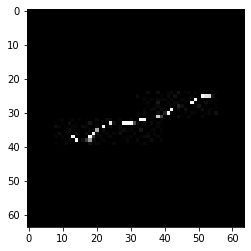

confidence for 14929 is 0.9719802


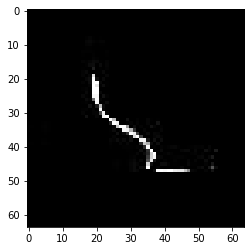

confidence for 14933 is 0.96604335


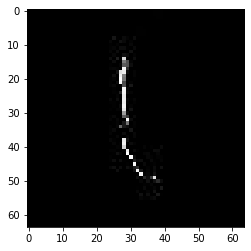

confidence for 14935 is 0.99661916


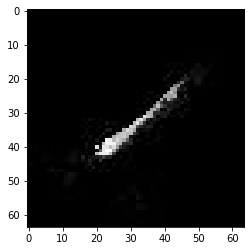

confidence for 14951 is 0.9280395


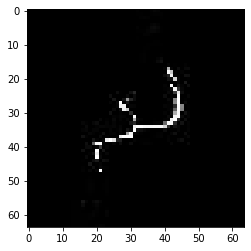

confidence for 14959 is 0.9759064


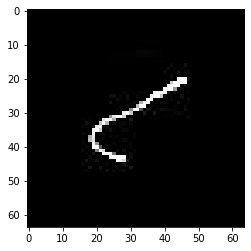

confidence for 14963 is 1.0


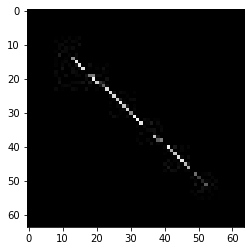

confidence for 14965 is 0.99950343


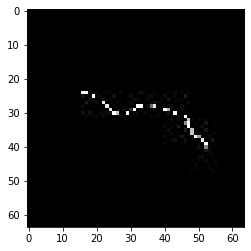

confidence for 14967 is 0.95816326


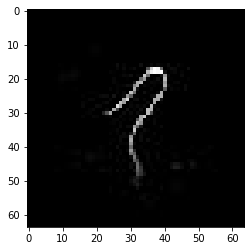

confidence for 14968 is 0.99778605


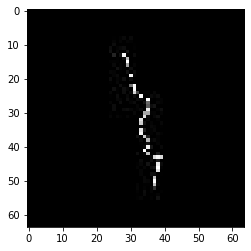

confidence for 14970 is 0.93170017


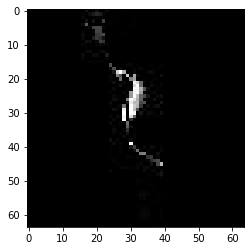

confidence for 14973 is 0.98909396


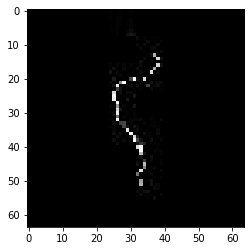

confidence for 14975 is 0.9715969


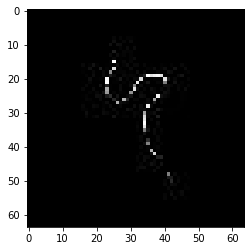

confidence for 14981 is 0.9999742


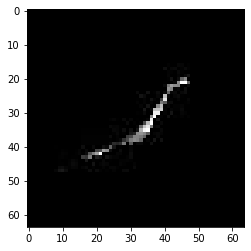

confidence for 14982 is 0.913558


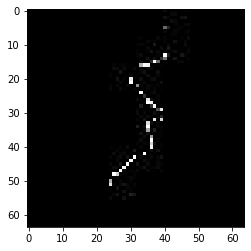

confidence for 14983 is 0.99580777


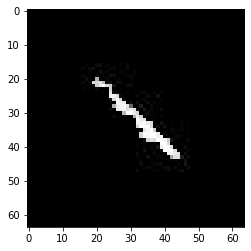

confidence for 14985 is 0.9842255


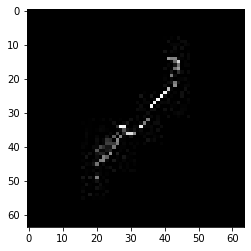

confidence for 14999 is 0.99984276


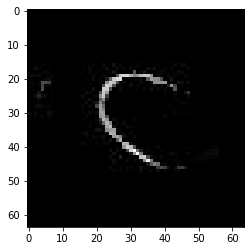

confidence for 15003 is 0.9912215


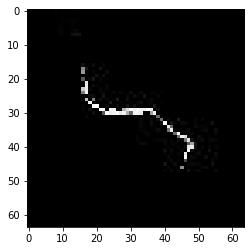

confidence for 15004 is 1.0


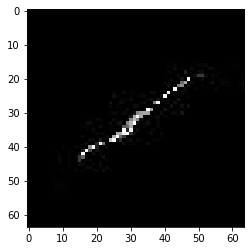

confidence for 15009 is 0.94623613


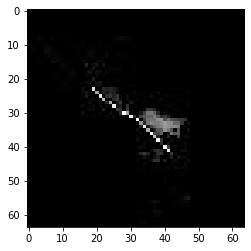

confidence for 15018 is 0.99804366


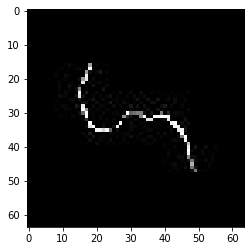

confidence for 15041 is 0.9909383


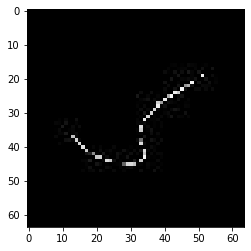

confidence for 15042 is 0.9999763


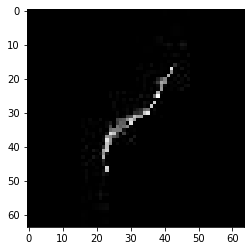

confidence for 15053 is 0.99717426


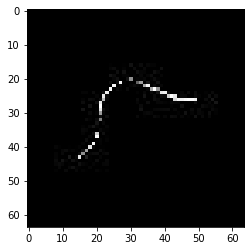

confidence for 15070 is 0.9892056


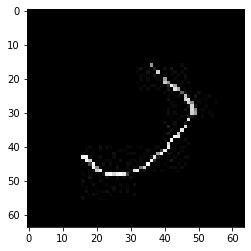

confidence for 15073 is 0.9998818


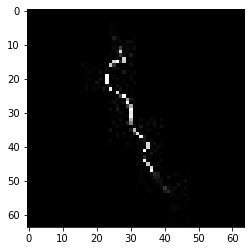

confidence for 15081 is 0.995729


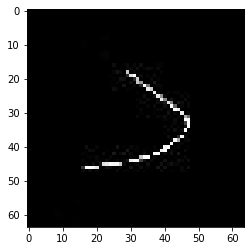

confidence for 15086 is 0.98030764


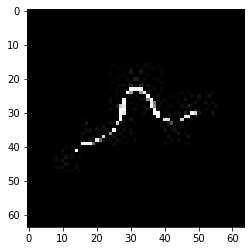

confidence for 15087 is 0.9999999


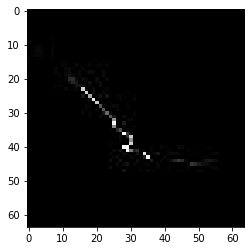

confidence for 15090 is 0.9842415


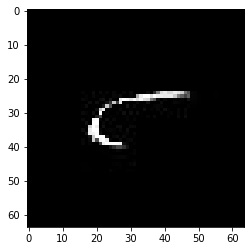

confidence for 15092 is 0.99987173


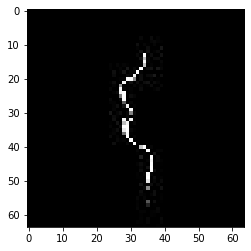

confidence for 15096 is 0.9997418


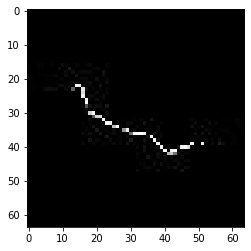

confidence for 15104 is 0.9999623


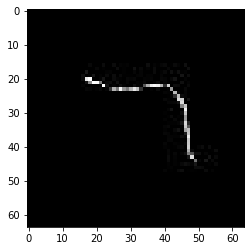

confidence for 15106 is 0.9156639


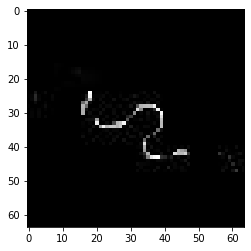

confidence for 15108 is 0.99976724


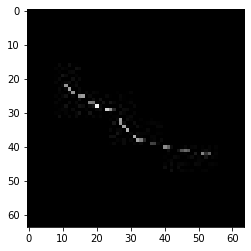

confidence for 15112 is 0.9999446


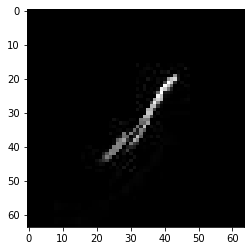

confidence for 15124 is 0.999988


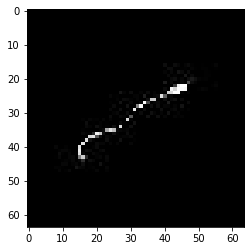

confidence for 15125 is 0.9907456


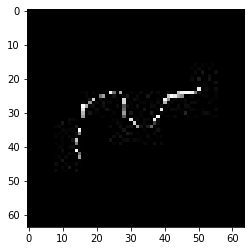

confidence for 15126 is 0.90316314


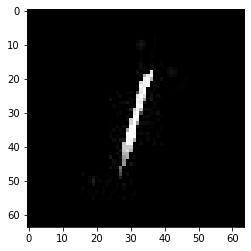

confidence for 15128 is 0.9981481


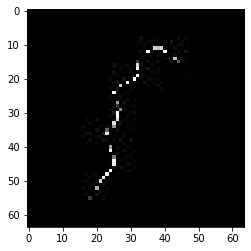

confidence for 15130 is 0.99993813


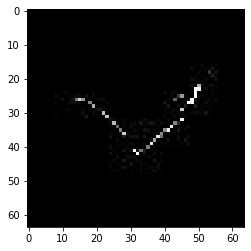

confidence for 15131 is 0.9986099


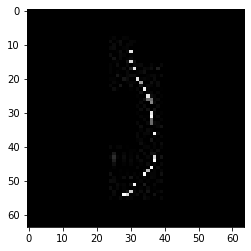

confidence for 15134 is 0.999871


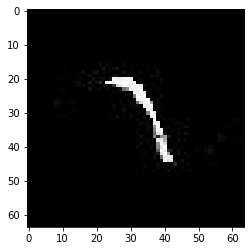

confidence for 15135 is 0.99819267


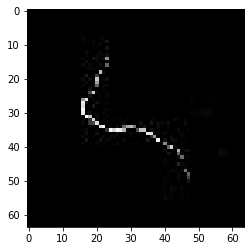

confidence for 15137 is 0.91899437


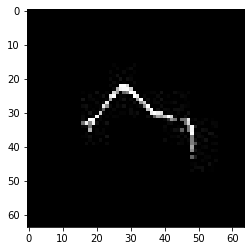

confidence for 15143 is 0.99124223


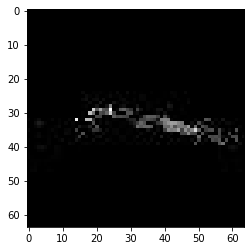

confidence for 15158 is 0.9649121


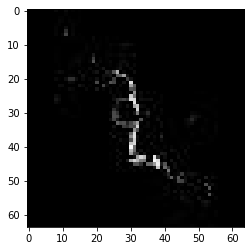

confidence for 15159 is 0.92594683


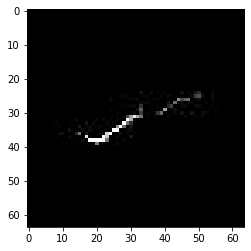

confidence for 15164 is 0.999967


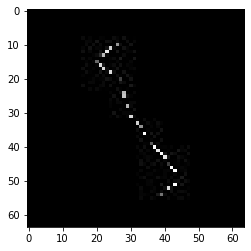

confidence for 15173 is 0.9729743


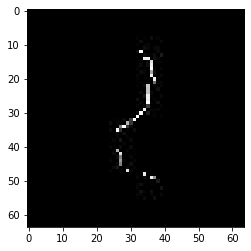

confidence for 15174 is 0.9940905


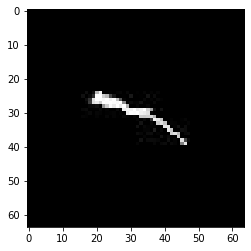

confidence for 15176 is 0.9999983


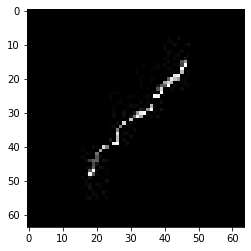

confidence for 15179 is 0.9039429


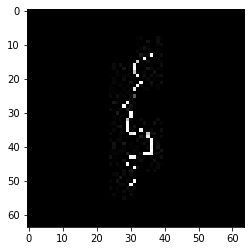

confidence for 15185 is 0.99997616


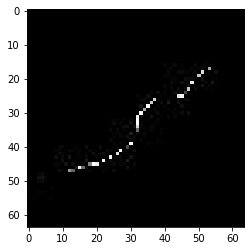

confidence for 15193 is 0.998317


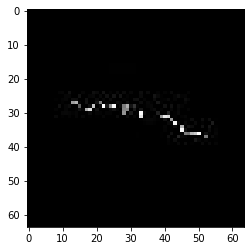

confidence for 15200 is 0.9284397


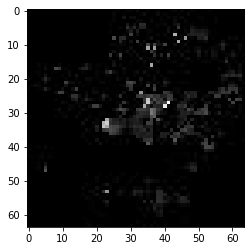

confidence for 15204 is 0.9830199


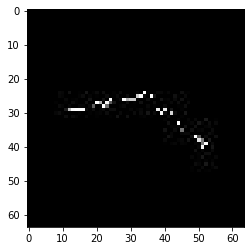

confidence for 15209 is 0.9350884


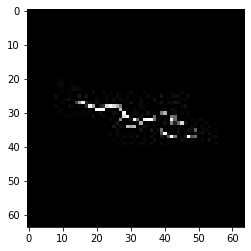

confidence for 15221 is 1.0


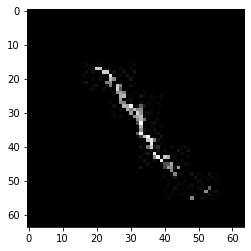

confidence for 15222 is 0.99841106


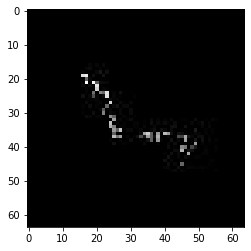

confidence for 15232 is 0.9977101


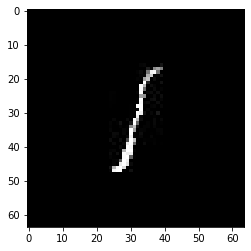

confidence for 15247 is 0.9011095


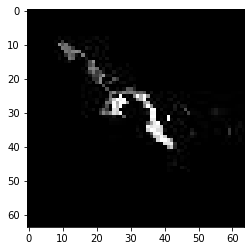

confidence for 15252 is 0.99850184


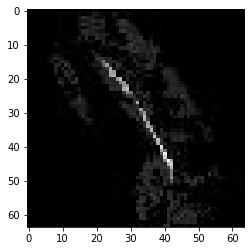

confidence for 15276 is 0.92871475


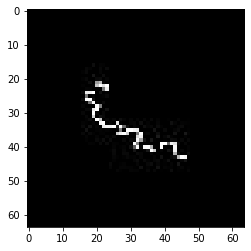

confidence for 15278 is 0.9858533


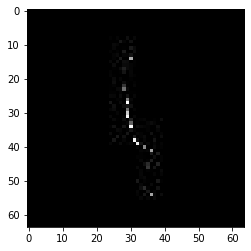

confidence for 15284 is 1.0


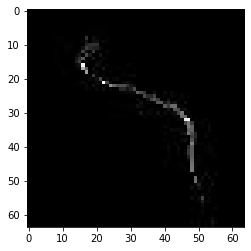

confidence for 15291 is 0.99999994


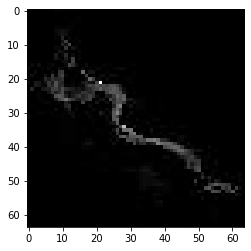

confidence for 15301 is 0.9500025


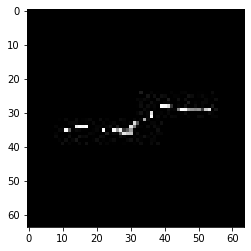

confidence for 15304 is 0.9997068


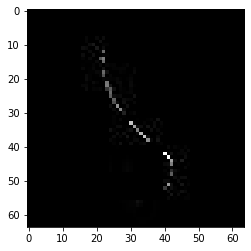

confidence for 15355 is 0.98349106


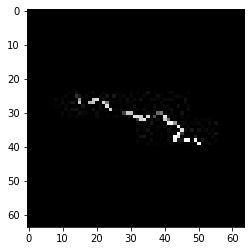

confidence for 15360 is 0.99284554


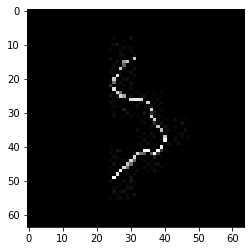

confidence for 15384 is 0.99992704


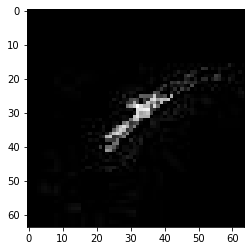

confidence for 15389 is 0.9912711


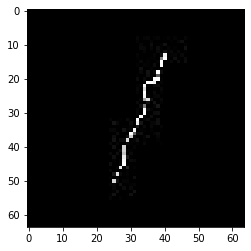

confidence for 15394 is 0.9999998


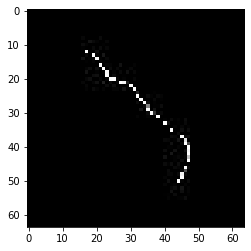

confidence for 15396 is 0.98589486


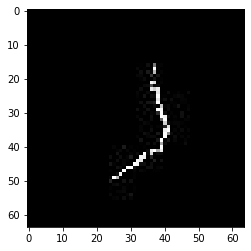

confidence for 15404 is 0.980111


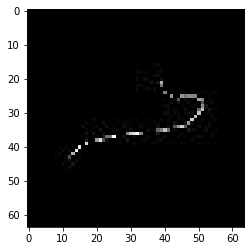

confidence for 15410 is 0.9364122


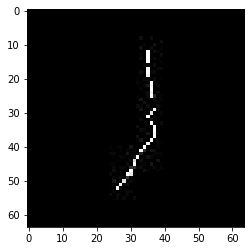

confidence for 15418 is 0.999997


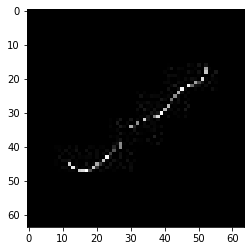

confidence for 15419 is 0.9759827


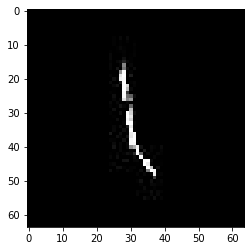

confidence for 15435 is 0.9508601


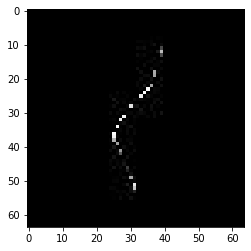

confidence for 15445 is 0.99485856


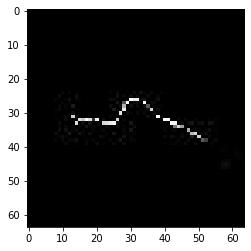

confidence for 15446 is 0.9968665


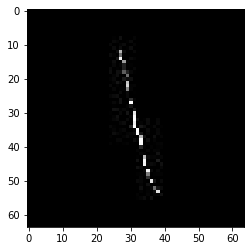

confidence for 15457 is 1.0


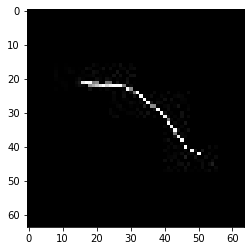

confidence for 15463 is 0.99995387


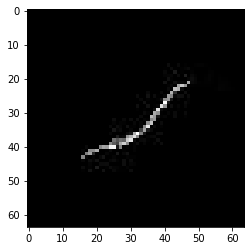

confidence for 15464 is 0.9999972


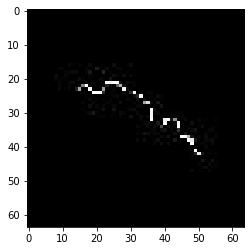

confidence for 15483 is 0.9999991


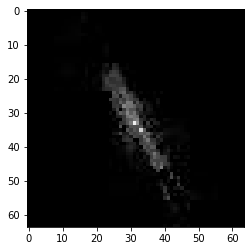

confidence for 15509 is 0.99791014


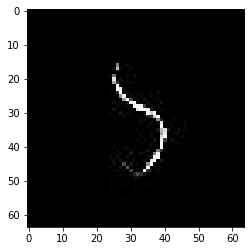

confidence for 15536 is 0.9673939


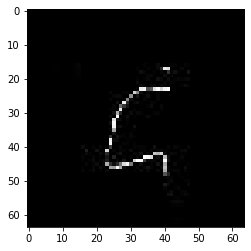

confidence for 15550 is 0.9982178


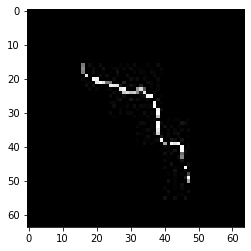

confidence for 15551 is 0.99967307


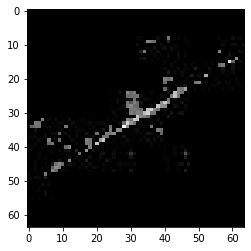

confidence for 15571 is 0.9999674


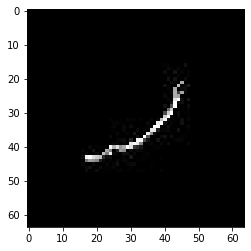

confidence for 15579 is 0.9994893


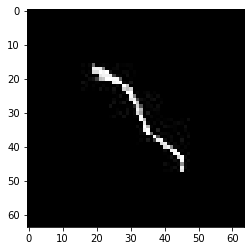

confidence for 15591 is 0.9872708


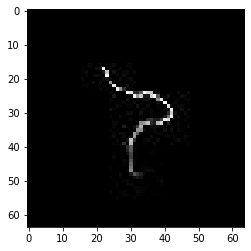

confidence for 15608 is 0.99999803


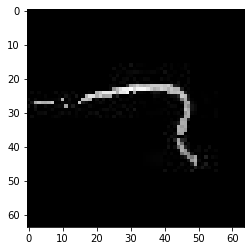

confidence for 15610 is 0.99994147


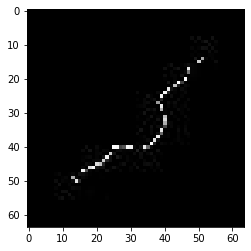

confidence for 15619 is 0.99999934


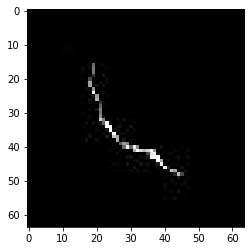

confidence for 15623 is 0.9217369


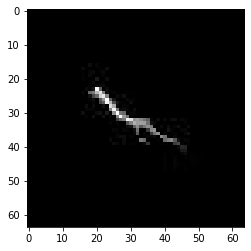

confidence for 15627 is 0.99991566


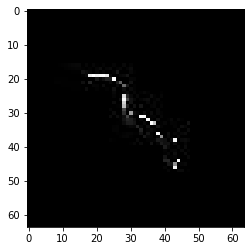

confidence for 15629 is 0.99527323


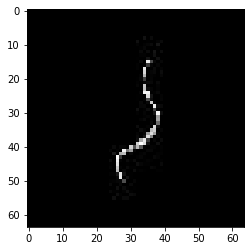

confidence for 15636 is 0.99584323


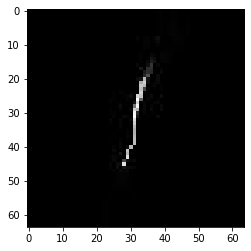

confidence for 15637 is 0.9586943


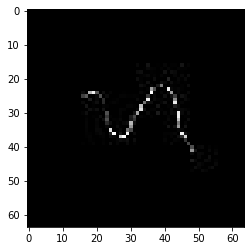

confidence for 15646 is 0.9999866


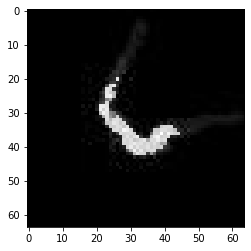

confidence for 15648 is 0.9959054


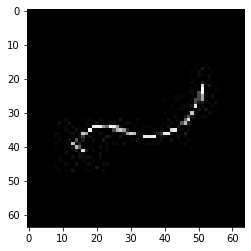

confidence for 15657 is 0.999214


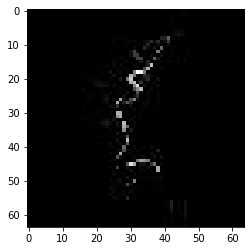

confidence for 15659 is 0.9997931


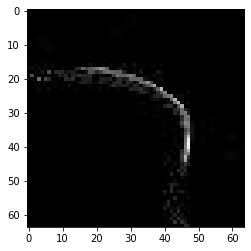

confidence for 15660 is 0.9750319


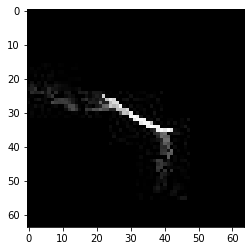

confidence for 15672 is 0.9999483


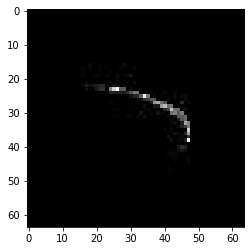

confidence for 15676 is 0.94292086


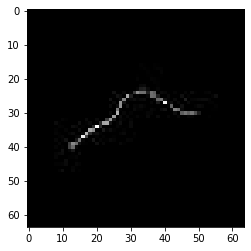

confidence for 15692 is 0.9152707


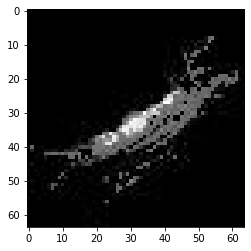

confidence for 15696 is 0.9462864


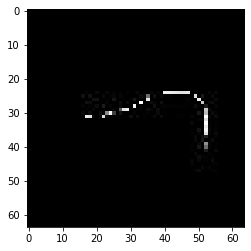

confidence for 15701 is 0.99995244


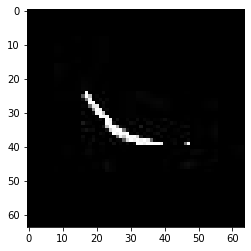

confidence for 15709 is 0.9956512


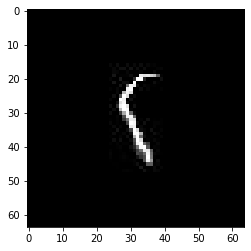

confidence for 15720 is 0.9534181


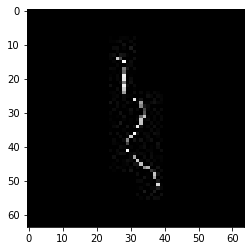

confidence for 15723 is 0.9999885


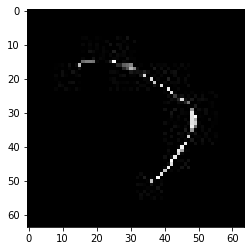

confidence for 15726 is 0.9752842


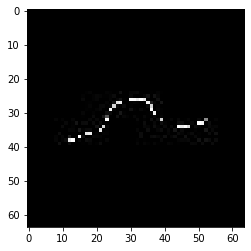

confidence for 15727 is 0.9856803


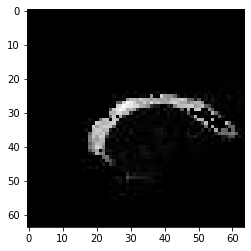

confidence for 15735 is 0.9956445


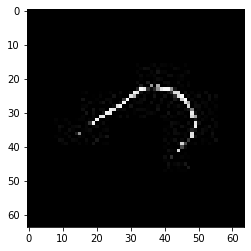

confidence for 15740 is 0.9999728


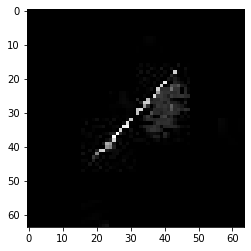

confidence for 15742 is 0.9955894


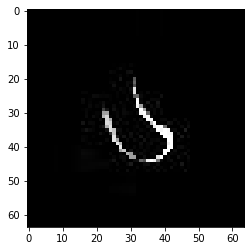

confidence for 15745 is 0.9935615


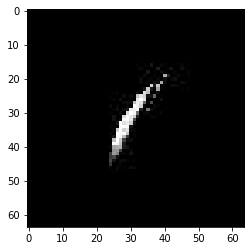

confidence for 15748 is 0.9743813


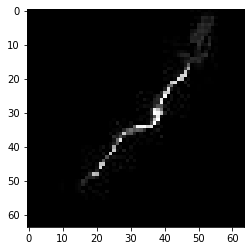

confidence for 15750 is 0.99601966


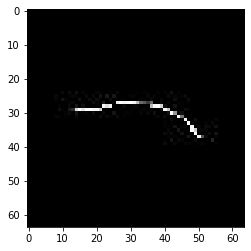

confidence for 15752 is 0.9764178


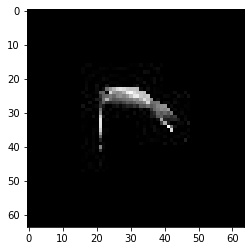

confidence for 15759 is 0.9479441


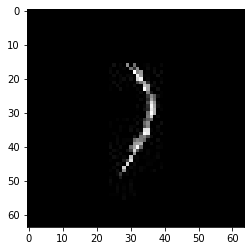

confidence for 15760 is 0.9999993


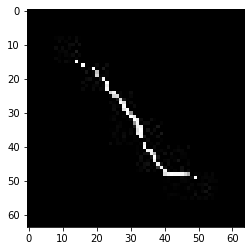

confidence for 15772 is 1.0


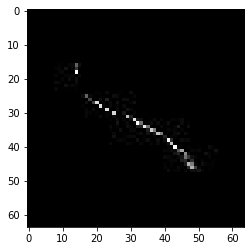

confidence for 15776 is 0.988457


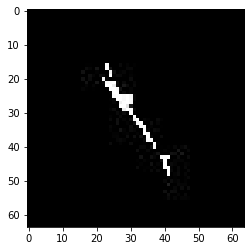

confidence for 15789 is 0.9999999


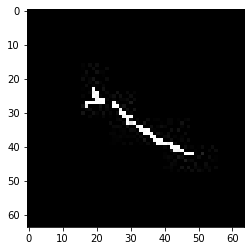

confidence for 15792 is 0.9826575


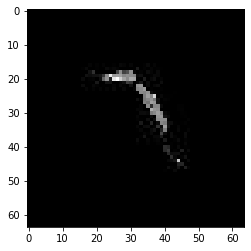

confidence for 15796 is 0.9939453


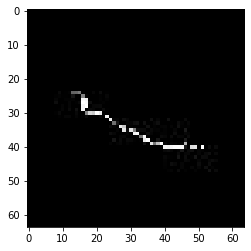

confidence for 15802 is 0.9999998


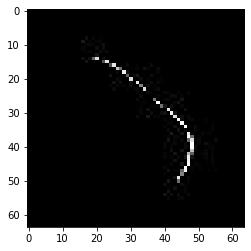

confidence for 15803 is 0.9943216


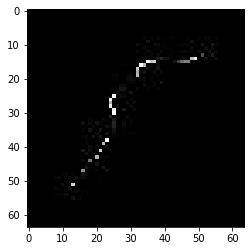

confidence for 15808 is 0.9996434


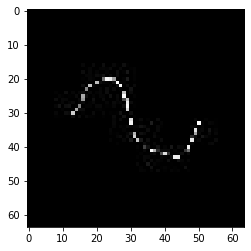

confidence for 15829 is 0.99865663


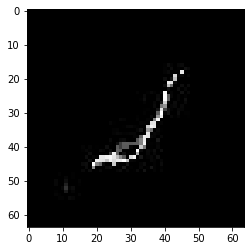

confidence for 15833 is 1.0


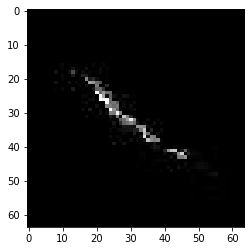

confidence for 15846 is 0.9427398


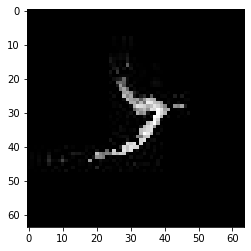

confidence for 15856 is 0.9956967


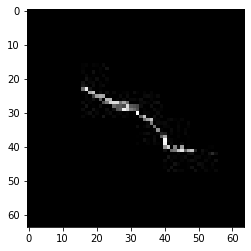

confidence for 15868 is 0.9999996


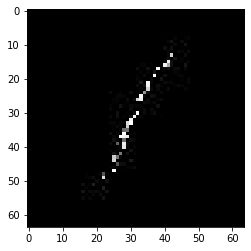

confidence for 15872 is 0.9902659


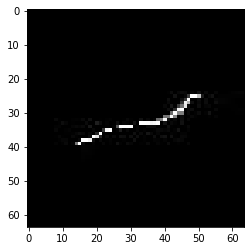

confidence for 15873 is 0.94812435


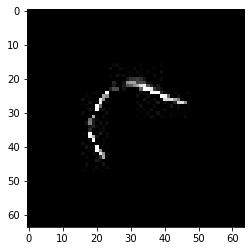

confidence for 15880 is 0.99000484


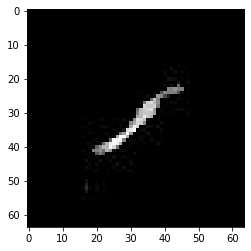

confidence for 15885 is 0.99998266


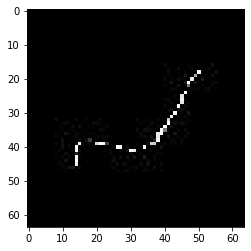

confidence for 15896 is 0.99854666


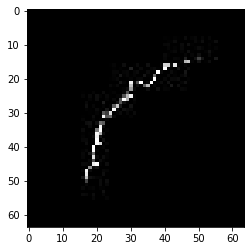

confidence for 15898 is 0.9685534


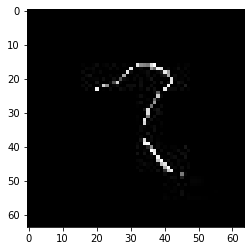

confidence for 15901 is 1.0


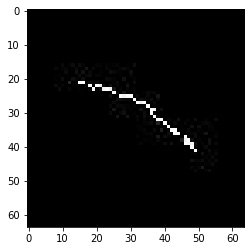

confidence for 15909 is 0.9996653


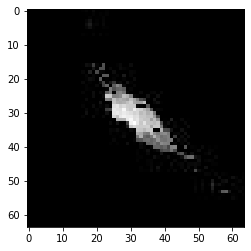

confidence for 15931 is 0.9717123


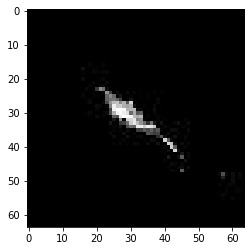

confidence for 15934 is 0.9993922


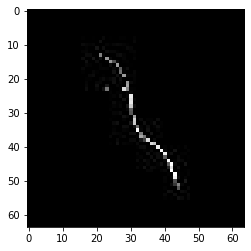

confidence for 15952 is 0.9977615


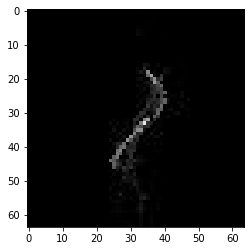

confidence for 15954 is 0.9999559


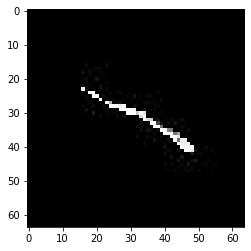

confidence for 15967 is 0.9887056


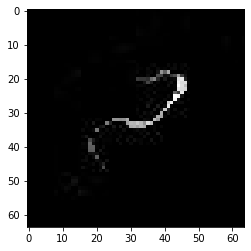

confidence for 15970 is 0.99971735


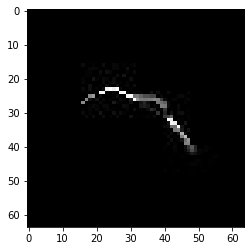

confidence for 15980 is 0.9854475


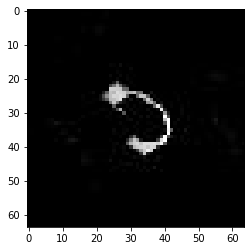

confidence for 15984 is 0.9999976


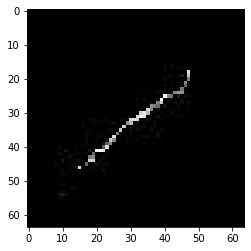

confidence for 15986 is 0.9855385


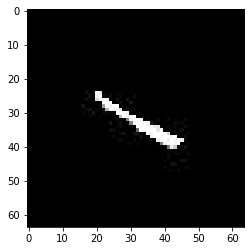

confidence for 16017 is 0.9557718


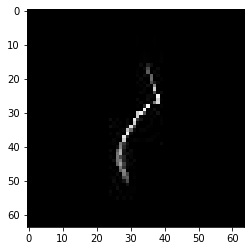

confidence for 16034 is 0.9241295


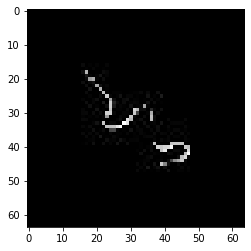

confidence for 16038 is 0.9715044


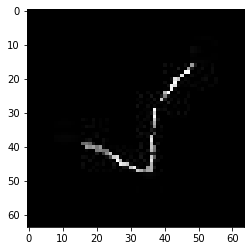

confidence for 16042 is 0.99996907


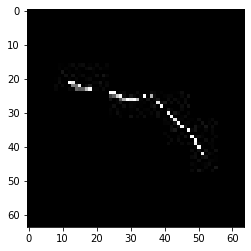

confidence for 16052 is 0.9996788


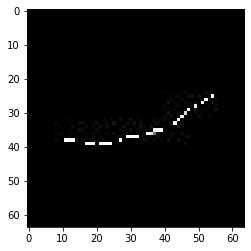

confidence for 16054 is 0.99999994


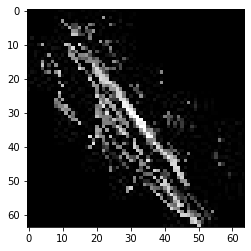

confidence for 16059 is 0.9906457


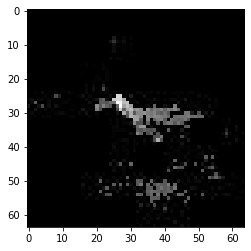

confidence for 16060 is 1.0


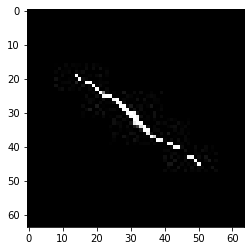

confidence for 16061 is 0.9999992


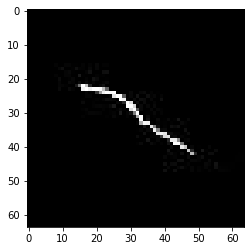

confidence for 16065 is 0.9963515


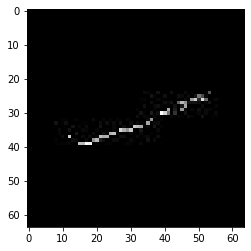

confidence for 16072 is 0.9705419


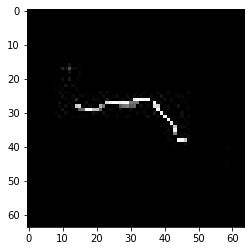

confidence for 16073 is 0.9879777


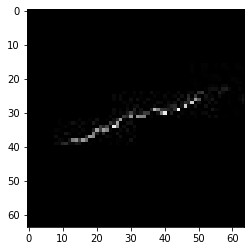

confidence for 16084 is 0.999804


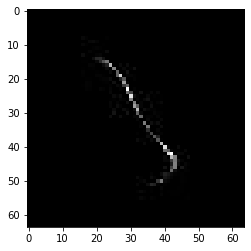

confidence for 16104 is 0.9971059


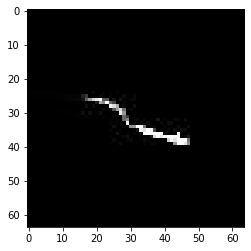

confidence for 16105 is 0.91144145


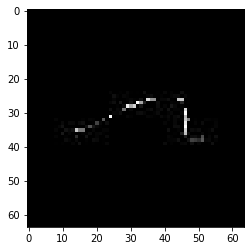

confidence for 16120 is 0.9999985


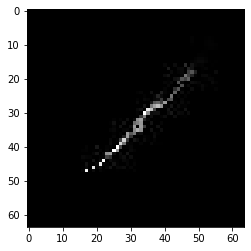

confidence for 16122 is 0.9501835


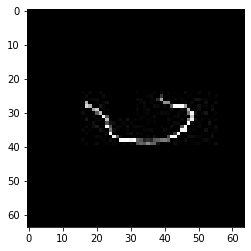

confidence for 16125 is 0.96644753


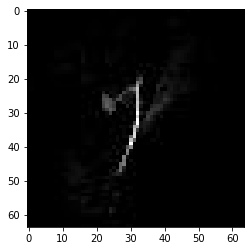

confidence for 16128 is 0.9847277


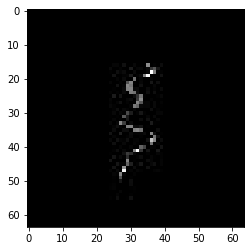

confidence for 16141 is 0.9751071


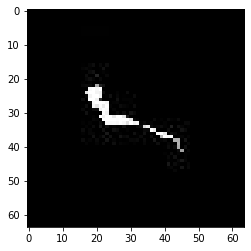

confidence for 16150 is 0.9409131


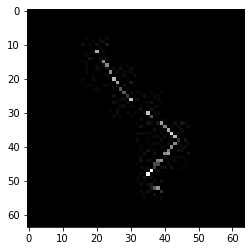

confidence for 16171 is 0.9564659


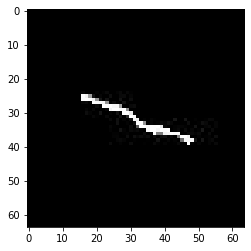

confidence for 16172 is 0.99603695


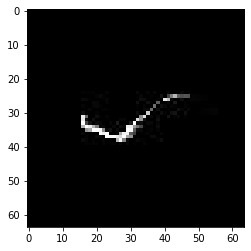

confidence for 16174 is 0.99999446


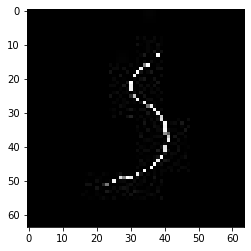

confidence for 16182 is 0.97168076


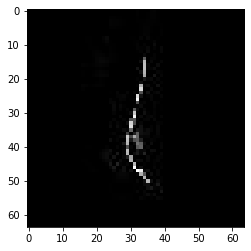

confidence for 16205 is 0.9987145


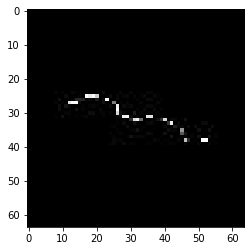

confidence for 16211 is 0.9999776


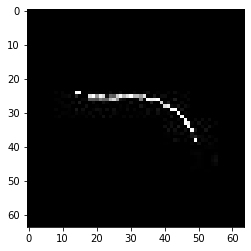

confidence for 16212 is 0.9893689


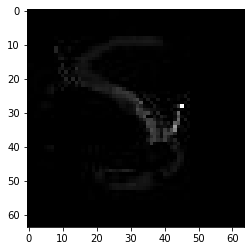

confidence for 16235 is 0.9947387


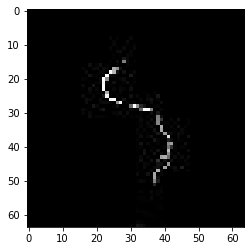

confidence for 16243 is 0.9478863


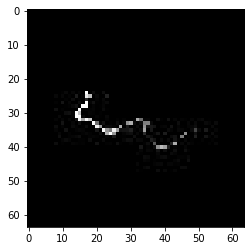

confidence for 16249 is 0.9894981


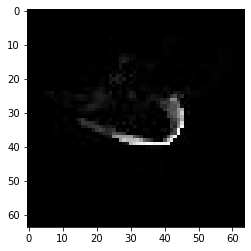

confidence for 16259 is 0.99823374


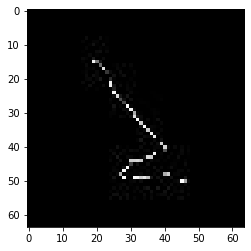

confidence for 16278 is 0.94888455


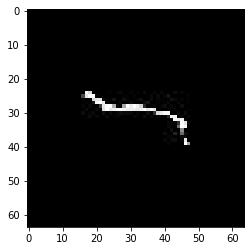

confidence for 16289 is 0.9319481


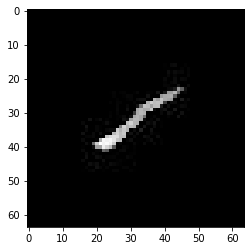

confidence for 16302 is 0.9996409


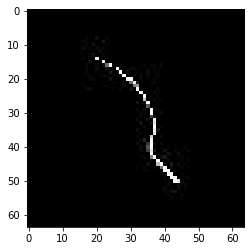

confidence for 16303 is 0.9999924


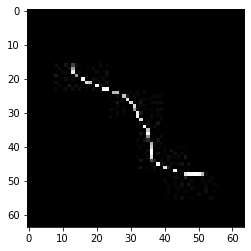

confidence for 16337 is 0.9760255


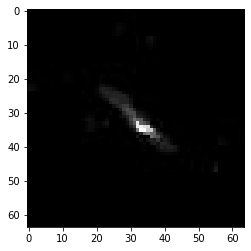

confidence for 16346 is 0.9318456


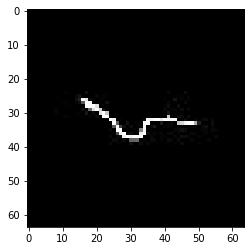

confidence for 16362 is 0.998193


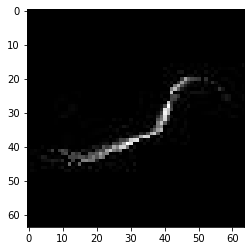

confidence for 16377 is 0.95253044


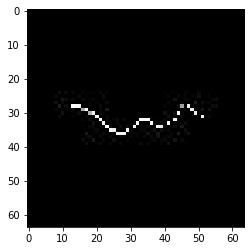

confidence for 16383 is 0.99575347


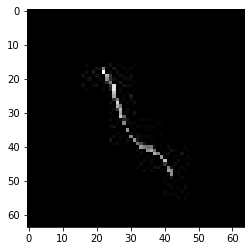

confidence for 16392 is 0.99605256


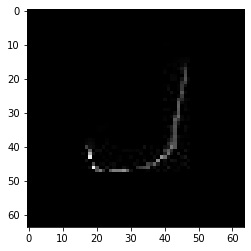

confidence for 16405 is 0.96807194


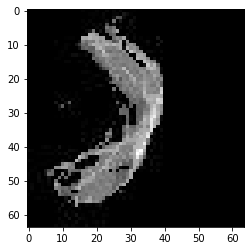

confidence for 16409 is 0.9999895


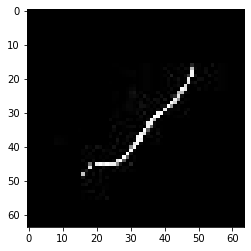

confidence for 16412 is 0.99956834


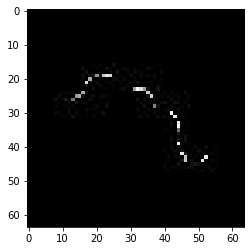

confidence for 16424 is 0.980966


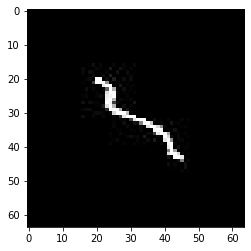

confidence for 16492 is 0.9891404


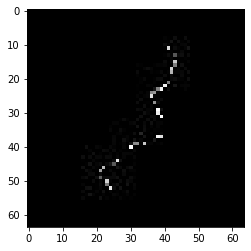

confidence for 16499 is 0.99424785


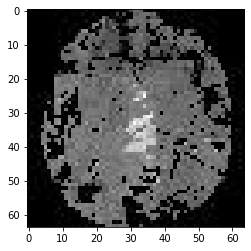

confidence for 16574 is 0.9143236


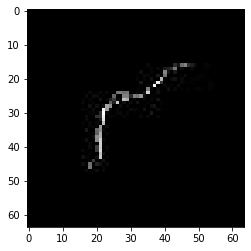

confidence for 16590 is 0.9993991


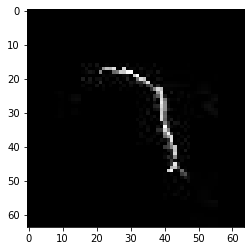

confidence for 16593 is 0.99966085


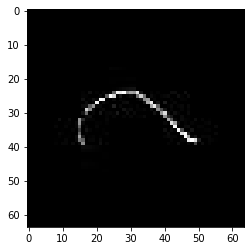

confidence for 16613 is 0.99999475


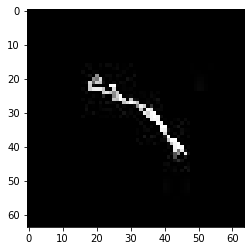

confidence for 16636 is 0.984685


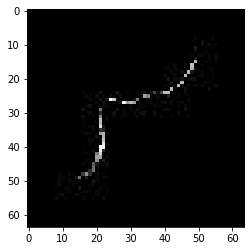

confidence for 16637 is 0.998684


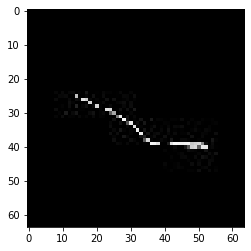

confidence for 16641 is 0.9838949


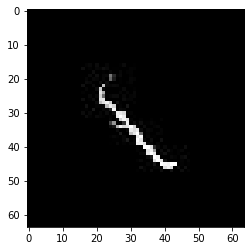

confidence for 16642 is 0.9895825


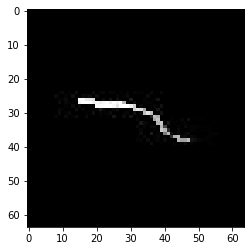

confidence for 16659 is 0.95370877


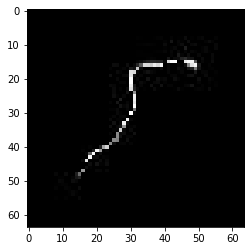

confidence for 16668 is 0.9905404


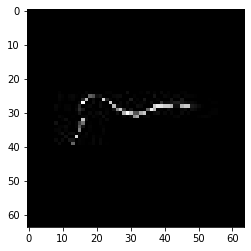

confidence for 16678 is 0.9995714


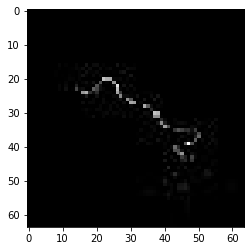

confidence for 16704 is 0.99986535


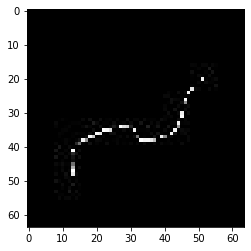

confidence for 16705 is 0.9999999


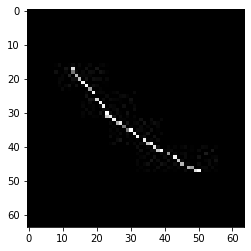

confidence for 16715 is 0.999986


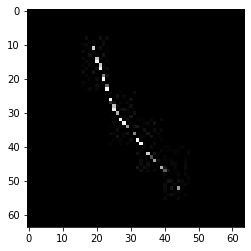

confidence for 16729 is 0.99989


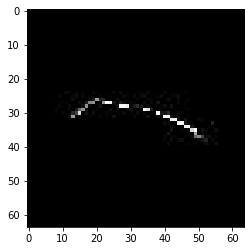

confidence for 16745 is 0.95327765


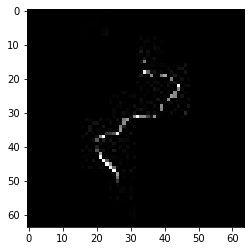

confidence for 16746 is 1.0


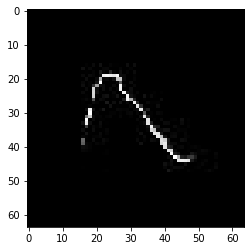

confidence for 16775 is 0.94357294


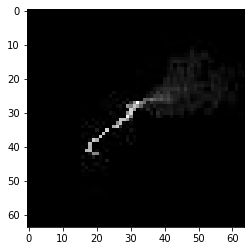

confidence for 16779 is 0.9786428


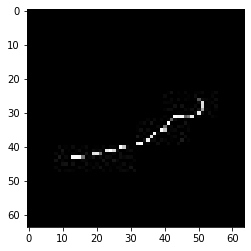

confidence for 16794 is 1.0


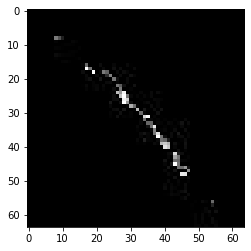

confidence for 16798 is 0.9151783


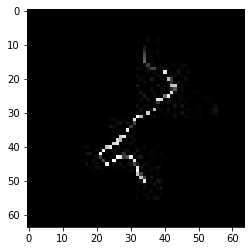

confidence for 16824 is 0.94511485


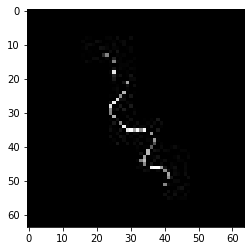

confidence for 16832 is 0.9914936


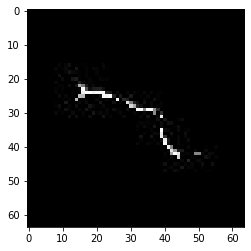

confidence for 16867 is 0.9958784


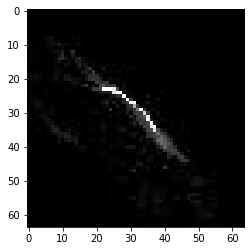

confidence for 16877 is 0.9966165


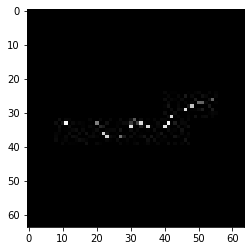

confidence for 16884 is 0.94149476


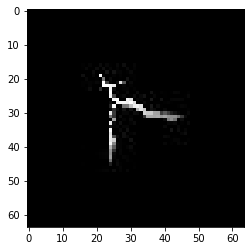

confidence for 16924 is 0.99614805


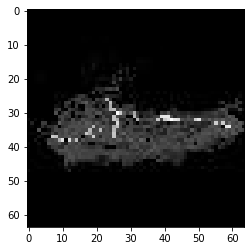

confidence for 16931 is 0.9515136


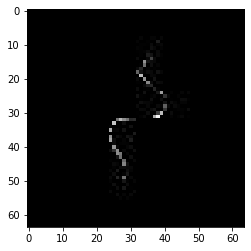

confidence for 16943 is 0.9999726


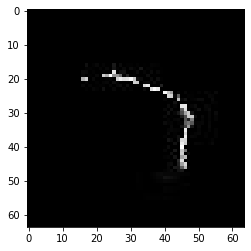

confidence for 16948 is 0.9999407


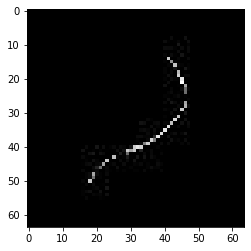

confidence for 16954 is 0.997173


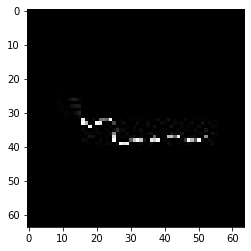

confidence for 16975 is 0.9751038


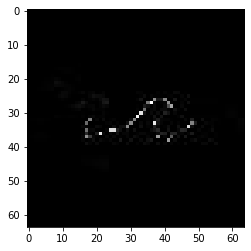

confidence for 16977 is 0.989851


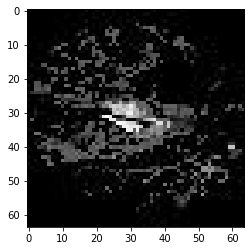

confidence for 16988 is 0.98088837


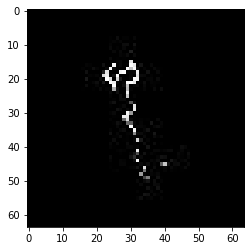

confidence for 16996 is 0.9756266


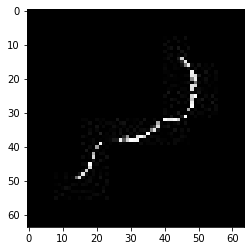

confidence for 17003 is 0.99882764


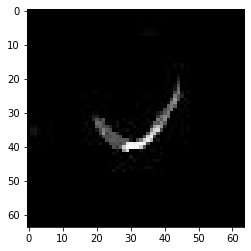

confidence for 17008 is 0.93801636


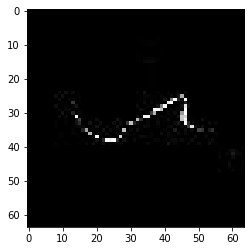

confidence for 17010 is 0.99876285


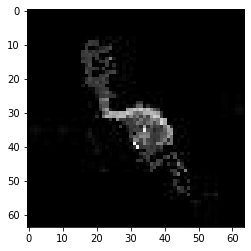

confidence for 17012 is 0.9911436


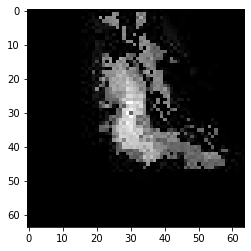

confidence for 17016 is 0.92066973


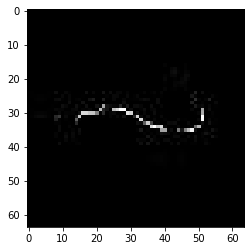

confidence for 17033 is 0.9804196


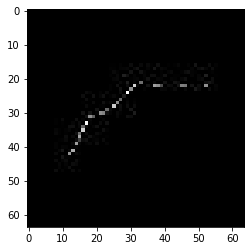

confidence for 17051 is 0.9999959


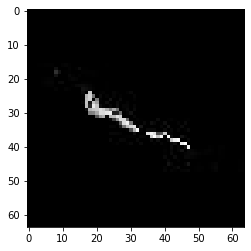

confidence for 17056 is 0.99984485


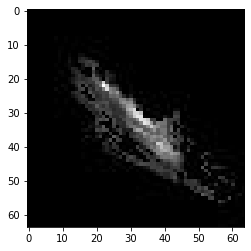

confidence for 17061 is 0.99098456


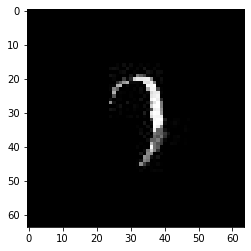

confidence for 17063 is 0.9999999


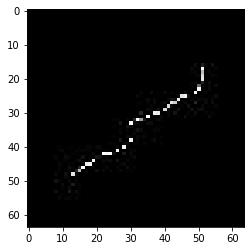

confidence for 17065 is 0.96611345


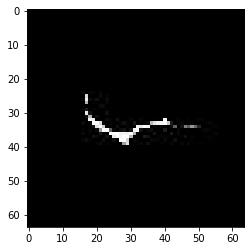

confidence for 17076 is 0.9992236


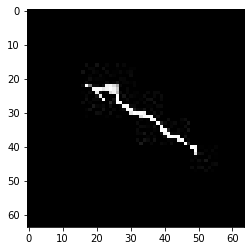

confidence for 17087 is 0.96525365


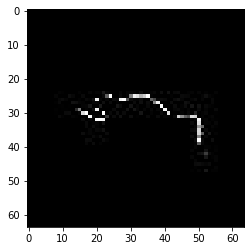

confidence for 17093 is 0.99680424


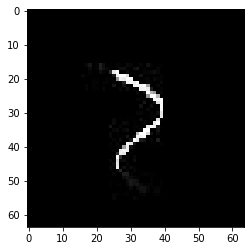

confidence for 17097 is 1.0


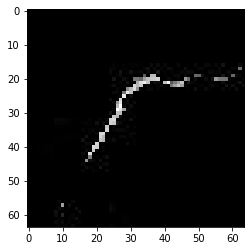

confidence for 17104 is 0.9973365


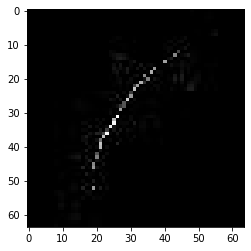

confidence for 17110 is 0.9646067


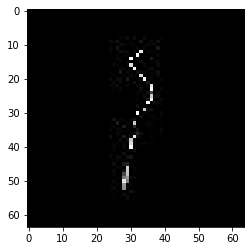

confidence for 17118 is 0.95650876


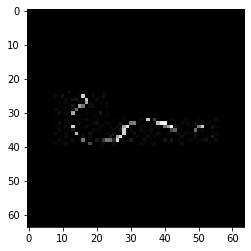

confidence for 17119 is 0.99999994


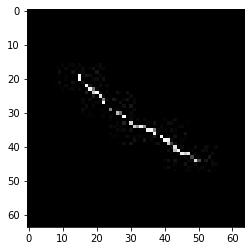

confidence for 17125 is 0.9996452


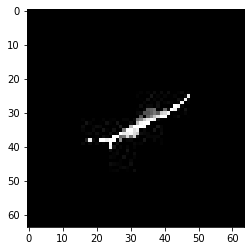

confidence for 17127 is 0.99999994


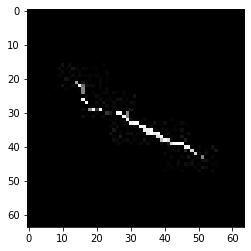

confidence for 17159 is 0.99956846


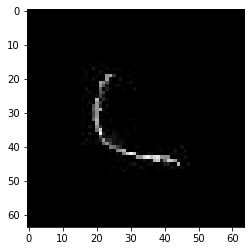

confidence for 17177 is 0.9996503


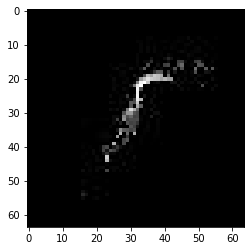

confidence for 17179 is 0.96182334


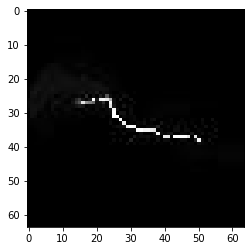

confidence for 17202 is 0.98395944


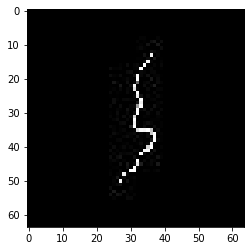

confidence for 17203 is 0.9317941


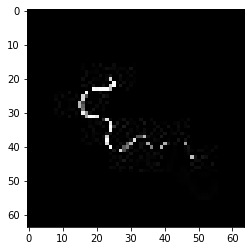

confidence for 17219 is 0.9344307


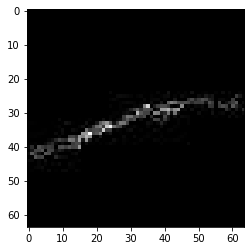

confidence for 17237 is 0.9910688


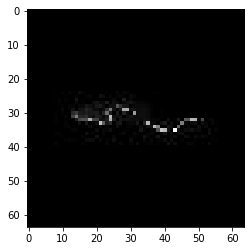

confidence for 17238 is 0.9885083


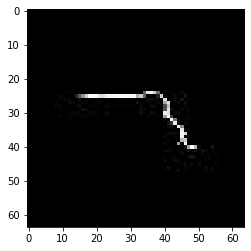

confidence for 17240 is 0.94617397


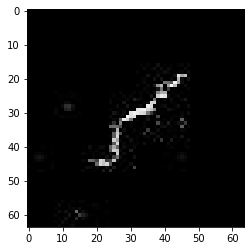

confidence for 17245 is 0.99896896


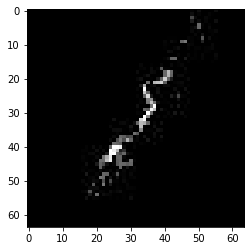

confidence for 17256 is 0.9969458


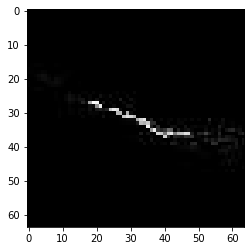

confidence for 17270 is 0.99293387


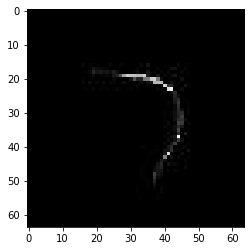

confidence for 17279 is 0.9702943


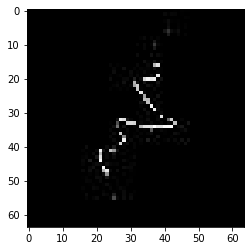

confidence for 17285 is 0.9929293


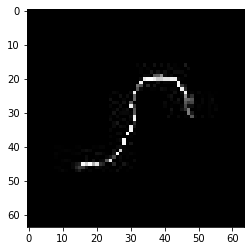

confidence for 17290 is 1.0


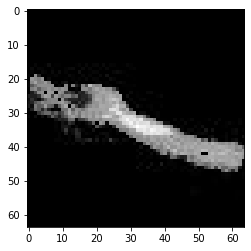

confidence for 17293 is 0.9940916


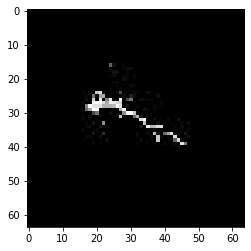

confidence for 17298 is 0.9995692


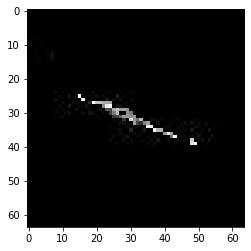

confidence for 17303 is 0.999999


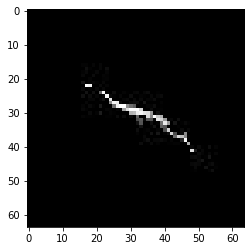

confidence for 17304 is 0.9999522


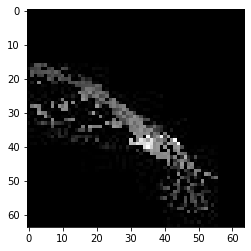

confidence for 17307 is 0.92113954


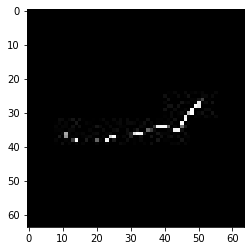

confidence for 17311 is 0.99998873


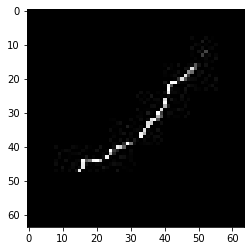

confidence for 17312 is 0.9957758


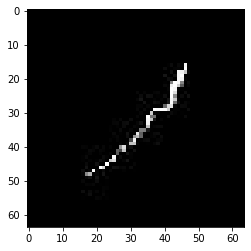

confidence for 17326 is 0.9167186


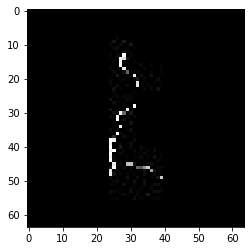

confidence for 17332 is 0.99327105


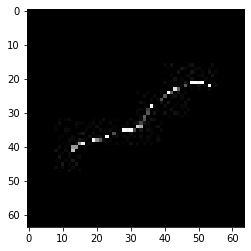

confidence for 17342 is 0.9924864


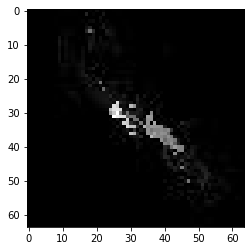

confidence for 17343 is 0.9987361


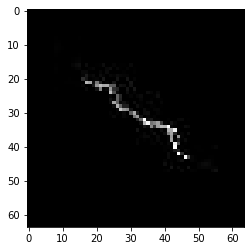

confidence for 17345 is 0.9948432


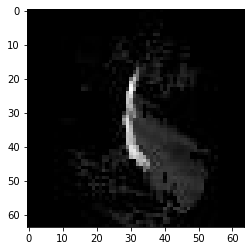

confidence for 17377 is 0.9999949


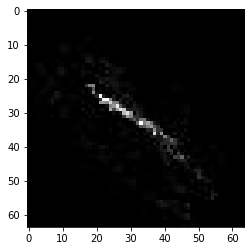

confidence for 17380 is 0.9939767


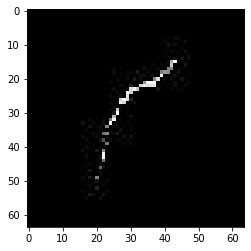

confidence for 17382 is 0.99424785


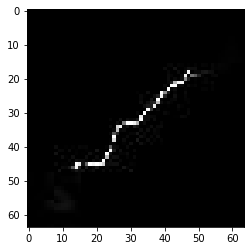

confidence for 17389 is 0.99038947


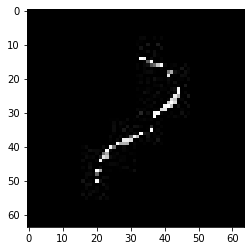

confidence for 17392 is 0.9996213


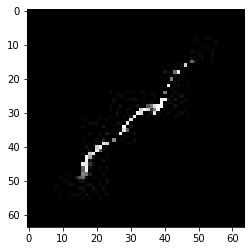

confidence for 17404 is 0.99601275


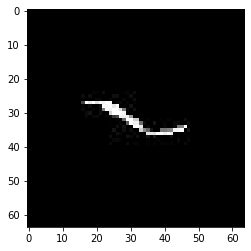

confidence for 17406 is 1.0


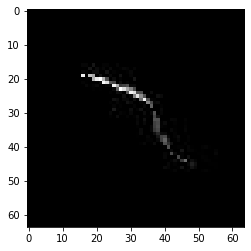

confidence for 17412 is 0.9987308


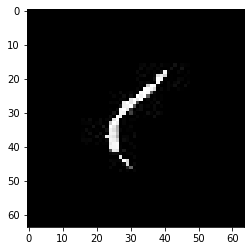

confidence for 17414 is 1.0


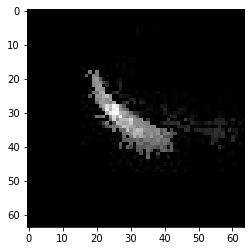

confidence for 17419 is 0.9181032


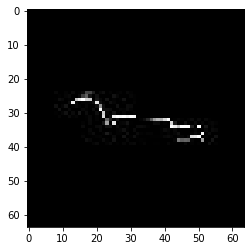

confidence for 17422 is 1.0


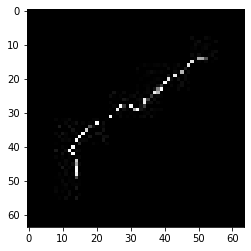

confidence for 17427 is 0.90313864


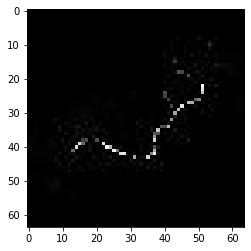

confidence for 17429 is 0.99218804


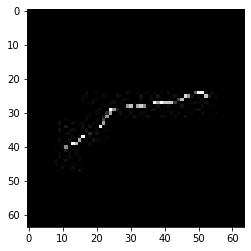

confidence for 17441 is 0.9652324


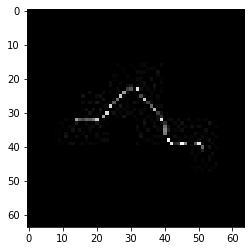

confidence for 17442 is 0.99998033


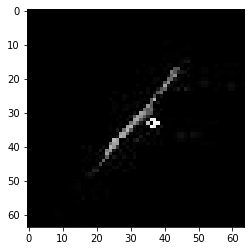

confidence for 17457 is 0.9999738


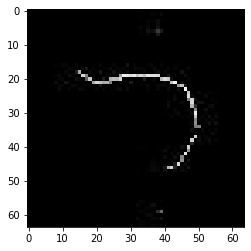

confidence for 17462 is 0.9441649


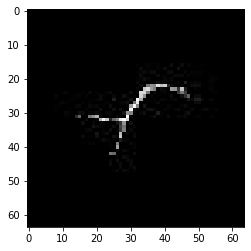

confidence for 17470 is 0.9979756


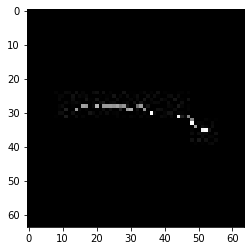

confidence for 17471 is 0.99968517


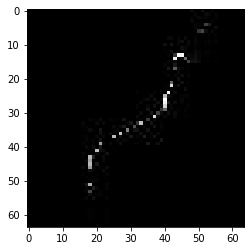

confidence for 17483 is 0.9997302


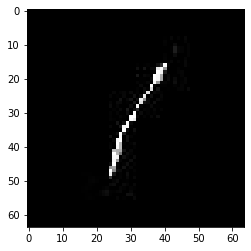

confidence for 17484 is 0.9999986


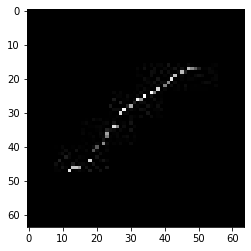

confidence for 17486 is 0.99908966


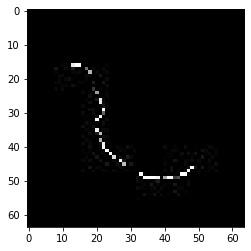

confidence for 17496 is 0.9991202


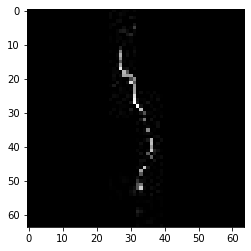

confidence for 17497 is 0.9991137


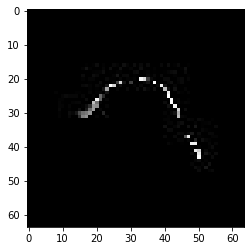

confidence for 17508 is 0.99088347


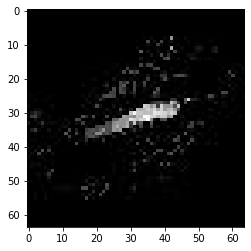

confidence for 17520 is 0.9153167


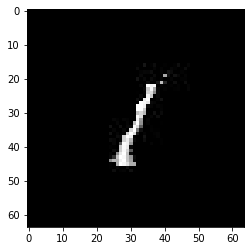

confidence for 17525 is 0.9999201


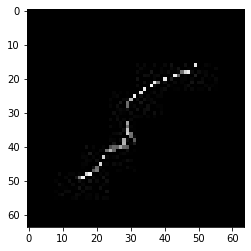

confidence for 17536 is 0.9998378


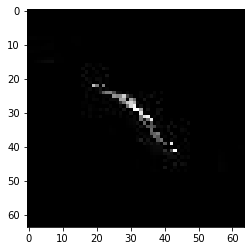

confidence for 17537 is 0.9999766


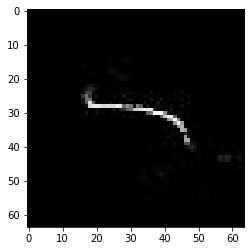

confidence for 17538 is 0.9999985


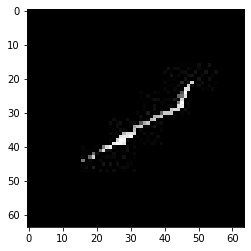

confidence for 17545 is 0.98433125


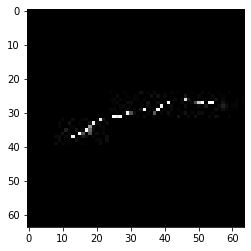

confidence for 17558 is 0.999567


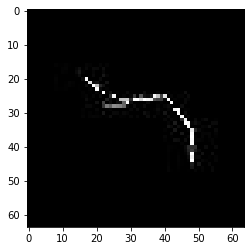

confidence for 17564 is 0.9838534


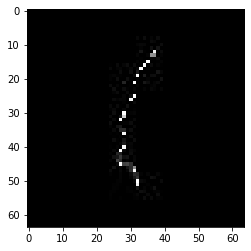

confidence for 17565 is 0.99874145


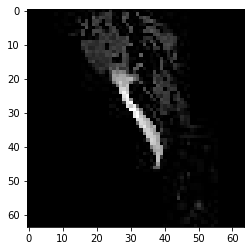

confidence for 17574 is 0.9091043


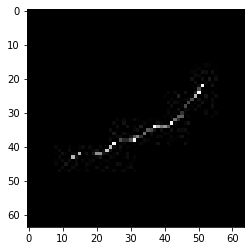

confidence for 17580 is 0.9973244


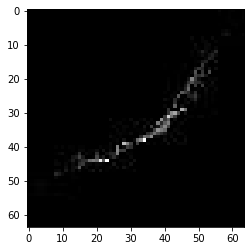

confidence for 17595 is 0.940405


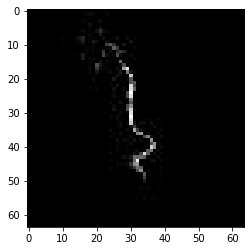

confidence for 17596 is 0.9709963


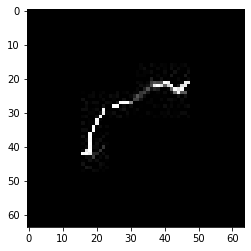

confidence for 17598 is 0.9999439


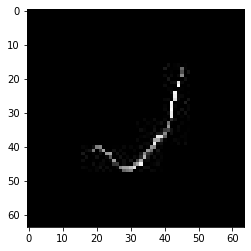

confidence for 17617 is 0.99980396


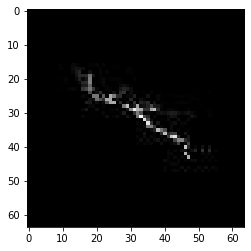

confidence for 17618 is 0.9619975


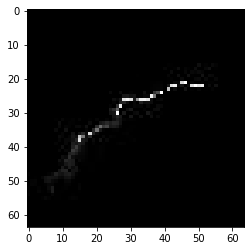

confidence for 17623 is 0.98614645


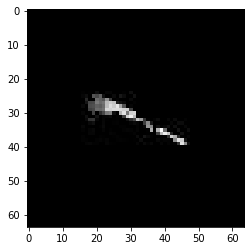

confidence for 17642 is 0.9888718


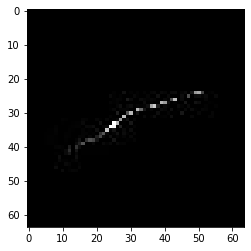

confidence for 17647 is 0.9892759


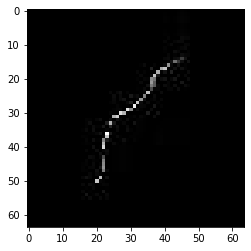

confidence for 17651 is 0.98868984


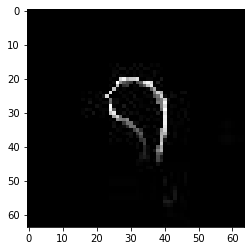

confidence for 17653 is 0.9563667


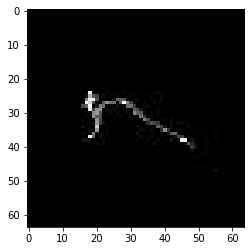

confidence for 17656 is 0.99505305


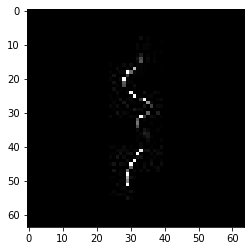

confidence for 17667 is 0.99973315


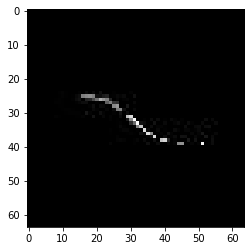

confidence for 17676 is 0.95632005


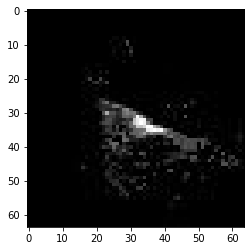

confidence for 17682 is 0.99999994


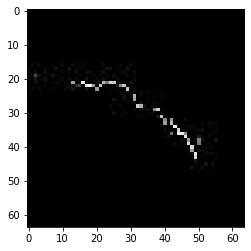

confidence for 17691 is 0.998707


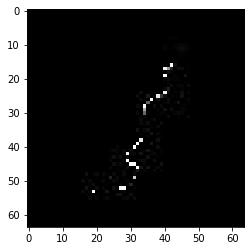

confidence for 17698 is 0.9041099


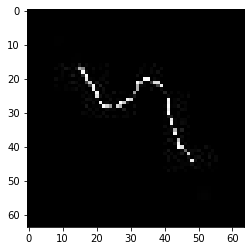

confidence for 17699 is 0.9897807


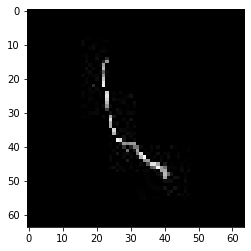

confidence for 17704 is 0.99570775


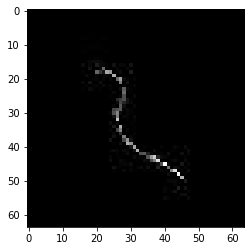

confidence for 17714 is 0.9826499


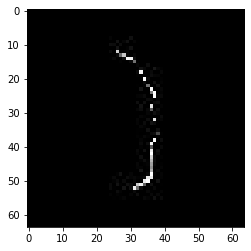

confidence for 17721 is 1.0


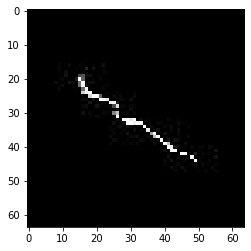

confidence for 17733 is 0.93583804


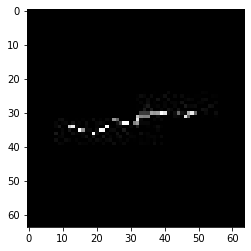

confidence for 17743 is 0.94646865


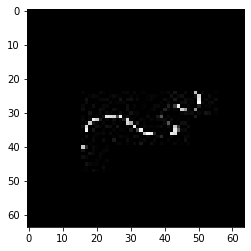

confidence for 17764 is 0.93132347


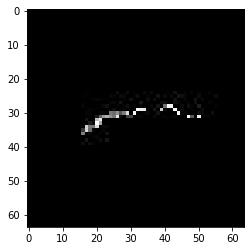

confidence for 17765 is 0.9999999


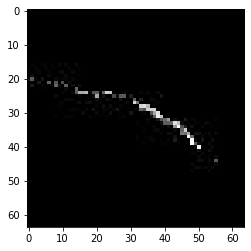

confidence for 17770 is 0.9999806


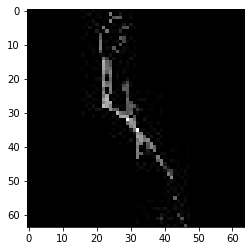

confidence for 17773 is 0.9953756


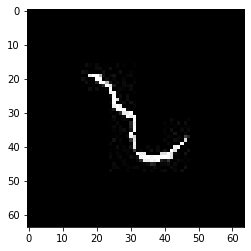

confidence for 17802 is 0.93972594


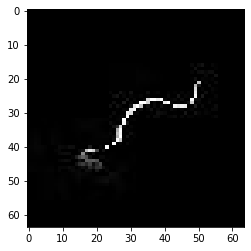

confidence for 17828 is 0.99712706


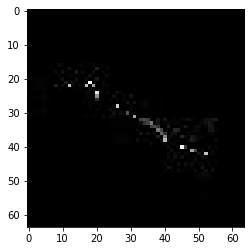

confidence for 17847 is 0.99999994


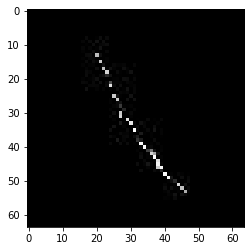

confidence for 17857 is 0.99777496


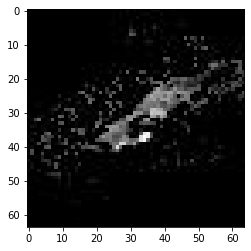

confidence for 17869 is 0.99999505


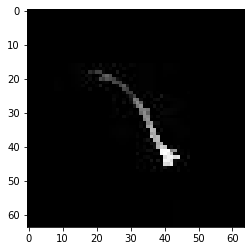

confidence for 17873 is 0.99690634


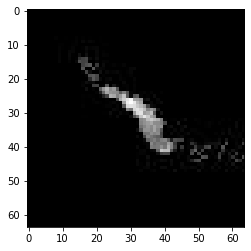

confidence for 17887 is 0.99605227


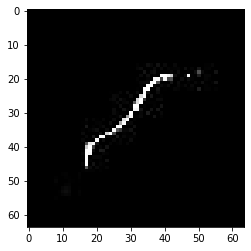

confidence for 17889 is 0.9987045


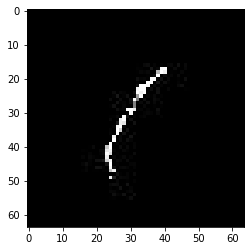

confidence for 17890 is 1.0


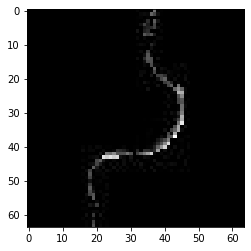

confidence for 17904 is 0.9914319


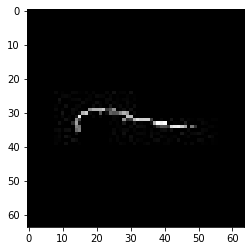

confidence for 17905 is 0.9999998


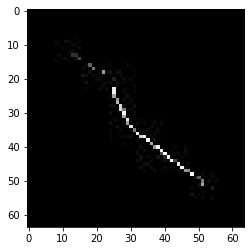

confidence for 17926 is 0.99993294


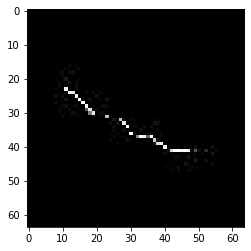

confidence for 17932 is 0.9465478


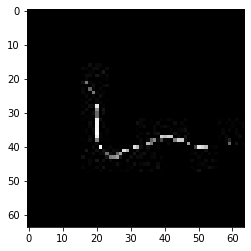

confidence for 17959 is 0.9855123


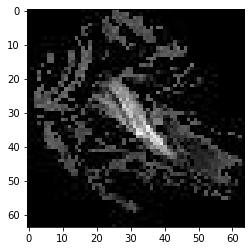

confidence for 17980 is 0.9798087


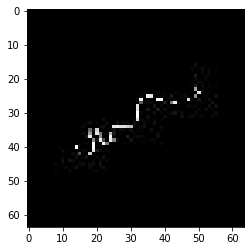

confidence for 17986 is 0.95245844


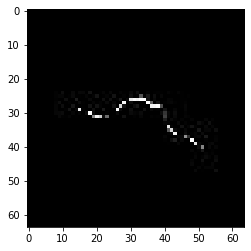

confidence for 17991 is 0.9978948


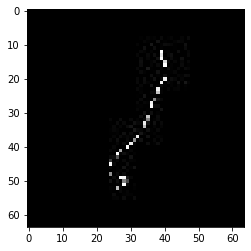

confidence for 17997 is 0.9694945


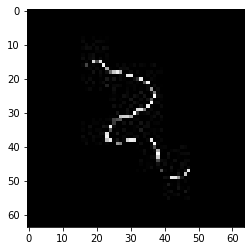

confidence for 18006 is 0.9610264


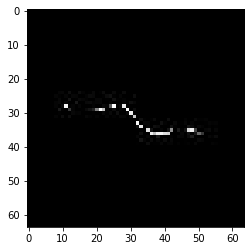

confidence for 18009 is 0.9700171


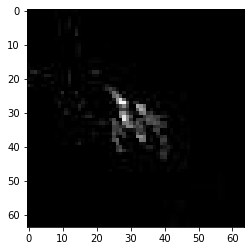

confidence for 18015 is 0.9599033


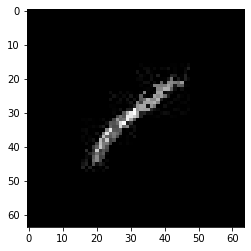

confidence for 18029 is 0.967593


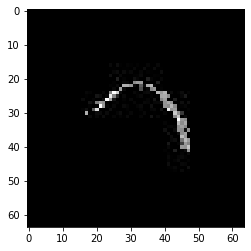

confidence for 18035 is 0.999726


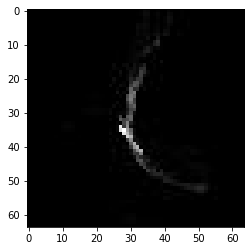

confidence for 18051 is 0.99909794


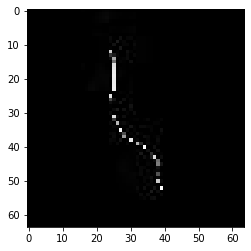

confidence for 18089 is 1.0


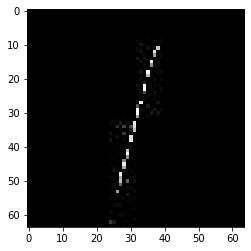

confidence for 18096 is 0.99999964


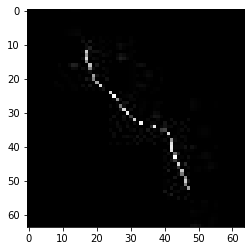

confidence for 18106 is 0.9938411


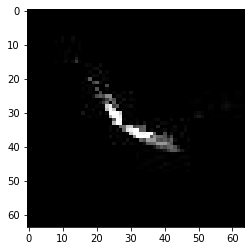

confidence for 18144 is 0.9991691


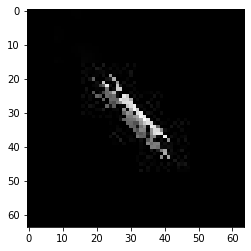

confidence for 18150 is 0.9957054


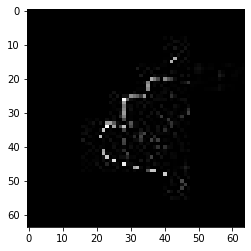

confidence for 18151 is 0.96619475


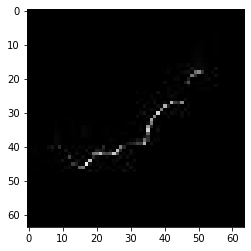

confidence for 18152 is 0.97173786


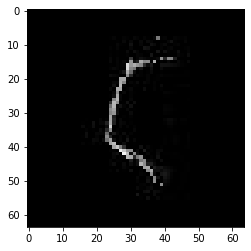

confidence for 18168 is 0.995276


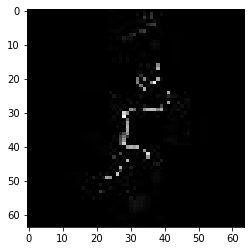

confidence for 18172 is 0.99600375


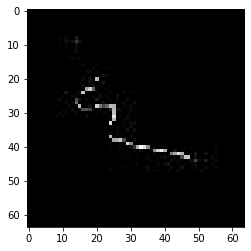

confidence for 18181 is 0.9599794


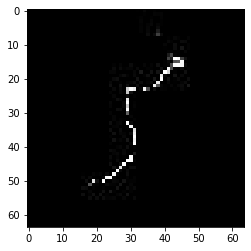

confidence for 18191 is 0.92046773


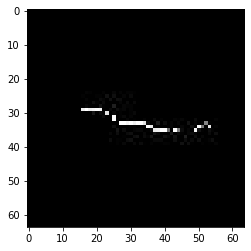

confidence for 18200 is 0.9999908


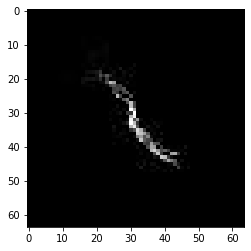

confidence for 18223 is 0.99999994


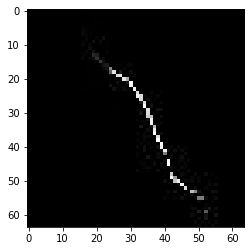

confidence for 18242 is 0.9980488


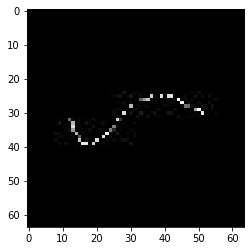

confidence for 18247 is 0.9999984


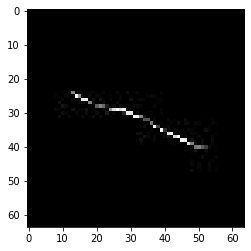

confidence for 18261 is 0.9747563


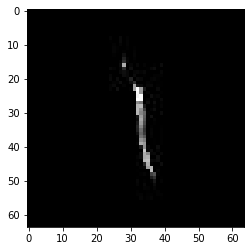

confidence for 18265 is 0.97548574


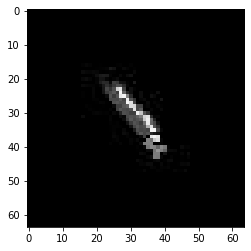

confidence for 18272 is 0.9999361


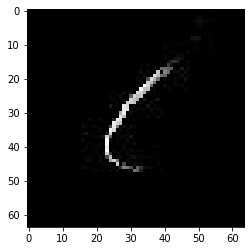

confidence for 18282 is 0.98790735


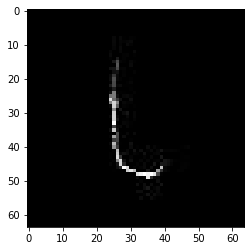

confidence for 18284 is 0.9815735


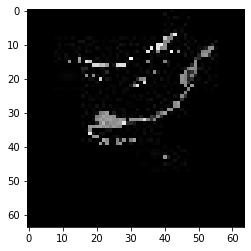

confidence for 18325 is 0.9352283


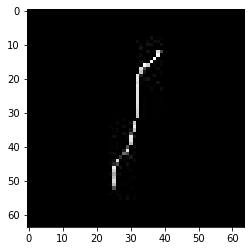

confidence for 18341 is 0.9917571


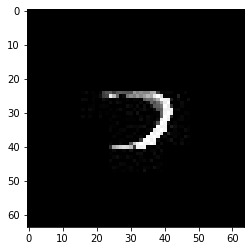

confidence for 18357 is 0.99486667


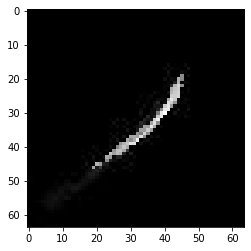

confidence for 18358 is 0.9990243


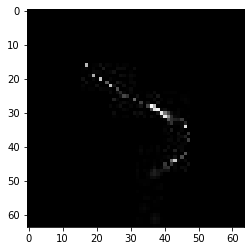

confidence for 18361 is 0.99999577


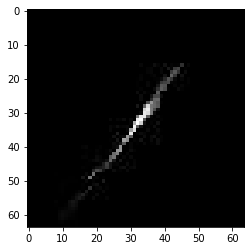

confidence for 18368 is 0.98207897


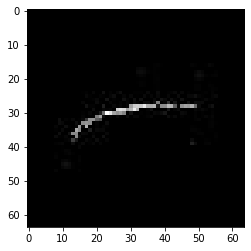

confidence for 18373 is 0.9999773


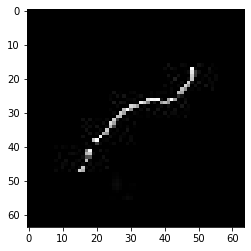

confidence for 18377 is 0.9902561


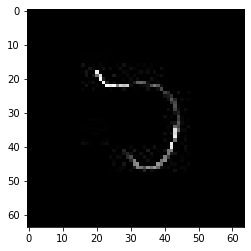

confidence for 18384 is 0.9601248


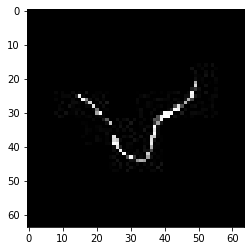

confidence for 18406 is 0.92877173


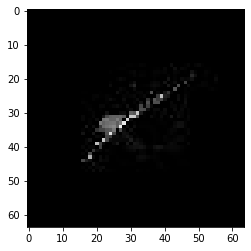

confidence for 18411 is 0.99984175


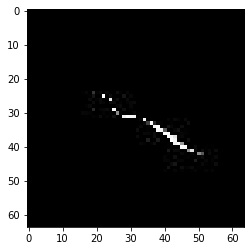

confidence for 18413 is 0.99958956


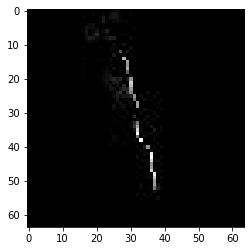

confidence for 18416 is 0.9999541


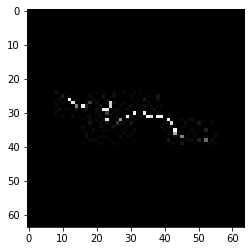

confidence for 18417 is 0.9886764


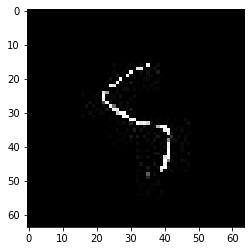

confidence for 18425 is 0.9654457


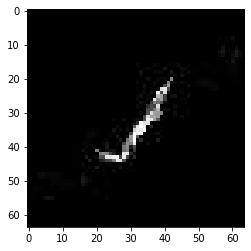

confidence for 18429 is 0.9915833


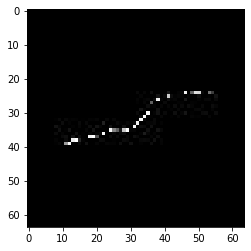

confidence for 18446 is 0.91386


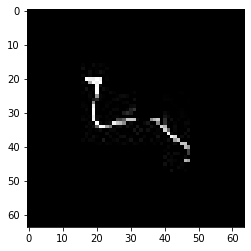

confidence for 18466 is 0.98878765


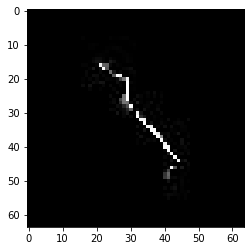

confidence for 18471 is 0.910597


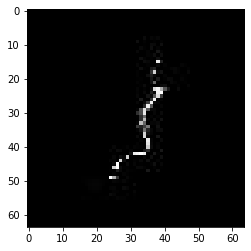

confidence for 18474 is 0.9999982


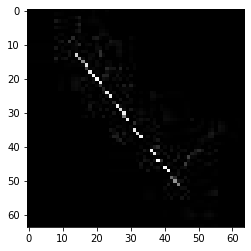

confidence for 18554 is 0.99960995


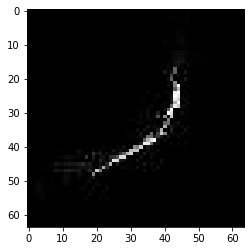

confidence for 18583 is 0.98716843


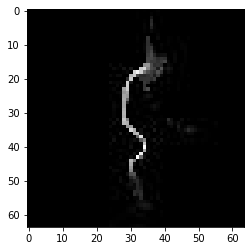

confidence for 18586 is 0.9998306


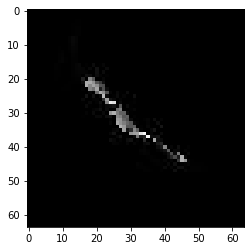

confidence for 18598 is 0.9723403


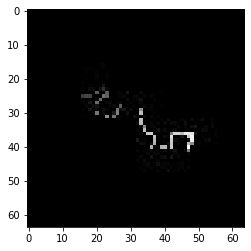

confidence for 18605 is 0.9980222


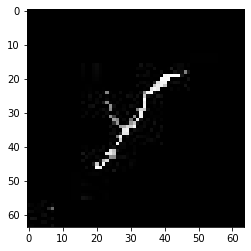

confidence for 18617 is 0.9386539


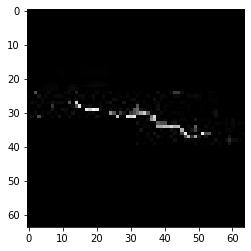

confidence for 18626 is 0.99987537


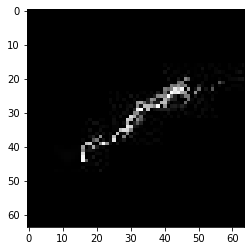

confidence for 18635 is 1.0


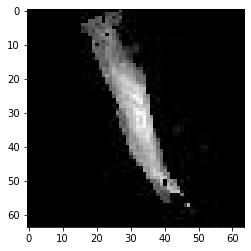

confidence for 18641 is 0.99999934


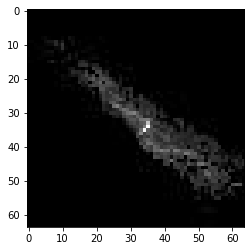

confidence for 18691 is 0.91147476


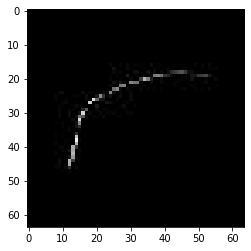

confidence for 18694 is 0.98528767


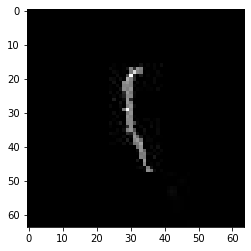

confidence for 18697 is 0.99801


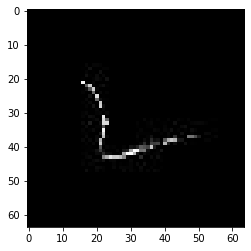

confidence for 18700 is 0.9091045


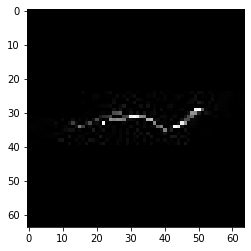

confidence for 18706 is 0.9979308


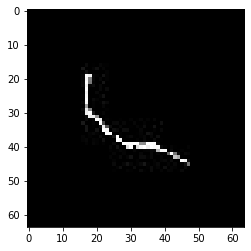

confidence for 18712 is 0.99983746


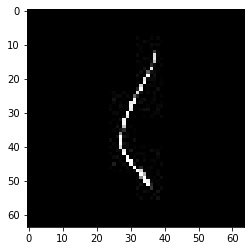

confidence for 18715 is 0.9482361


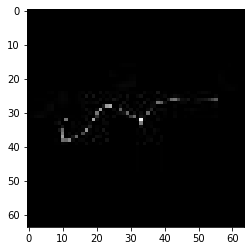

confidence for 18719 is 0.929977


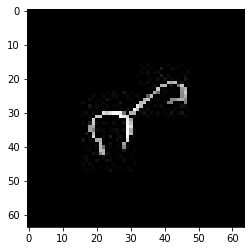

confidence for 18733 is 0.99977994


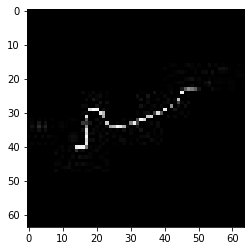

confidence for 18735 is 0.9999751


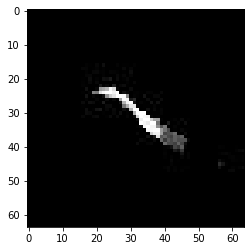

confidence for 18740 is 0.95844036


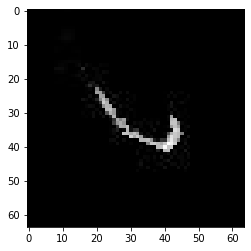

confidence for 18746 is 0.97934467


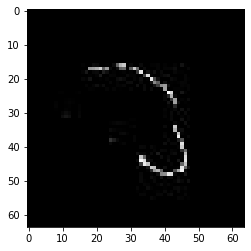

confidence for 18761 is 0.9979628


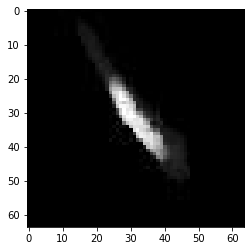

confidence for 18792 is 0.99999994


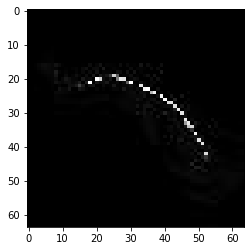

confidence for 18795 is 0.9995412


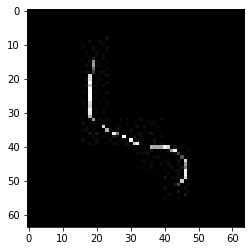

confidence for 18825 is 0.9617339


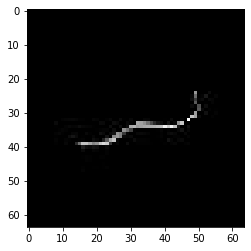

confidence for 18828 is 0.98272955


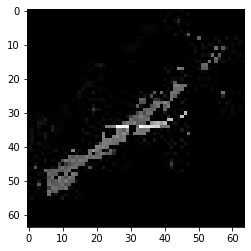

confidence for 18832 is 0.94075024


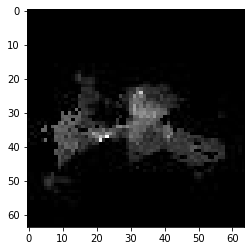

confidence for 18840 is 0.99999386


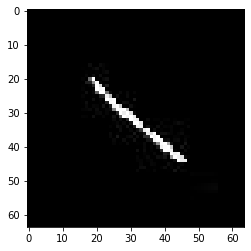

confidence for 18856 is 0.9991655


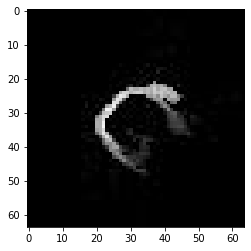

confidence for 18857 is 0.98673046


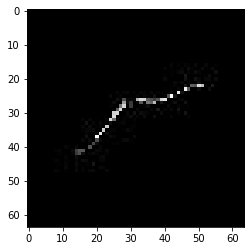

confidence for 18860 is 0.9999997


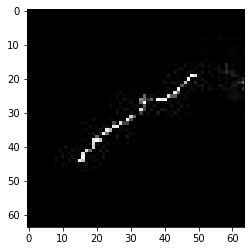

confidence for 18873 is 0.9925555


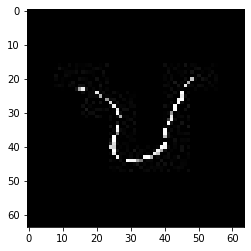

confidence for 18874 is 0.99351907


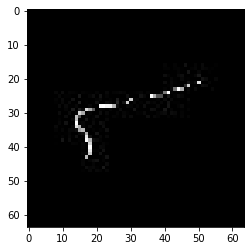

confidence for 18882 is 0.9997905


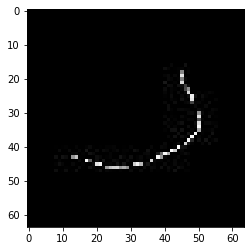

confidence for 18885 is 0.95959526


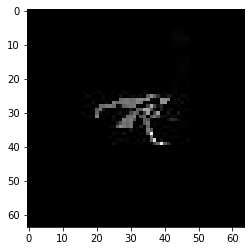

confidence for 18892 is 0.999998


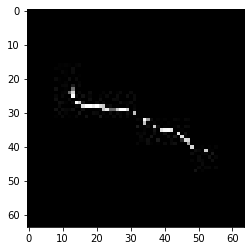

confidence for 18896 is 0.9928217


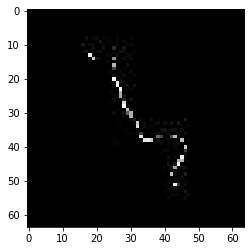

confidence for 18898 is 0.9501851


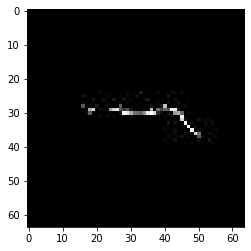

confidence for 18901 is 1.0


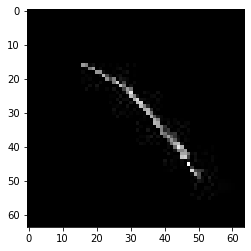

confidence for 18903 is 0.99712604


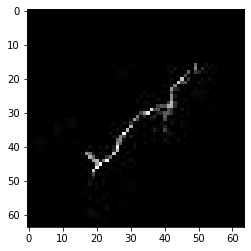

confidence for 18916 is 0.9892168


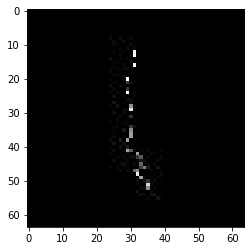

confidence for 18923 is 1.0


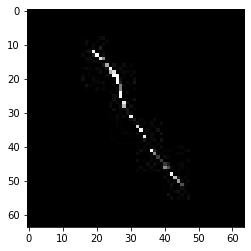

confidence for 18933 is 0.9519711


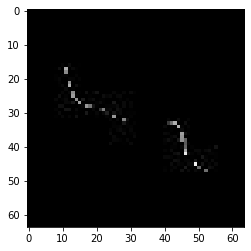

confidence for 18934 is 0.9018436


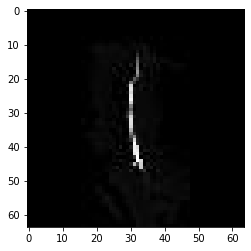

confidence for 18956 is 0.9814988


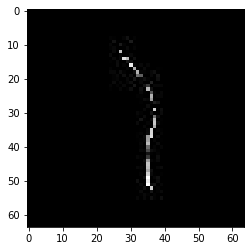

confidence for 18968 is 0.98108906


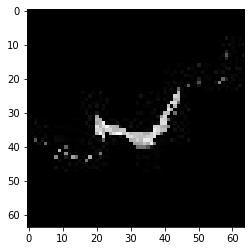

confidence for 18988 is 0.95195895


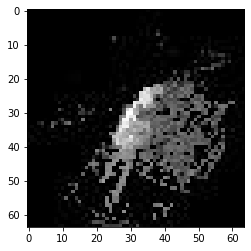

confidence for 19010 is 0.9929529


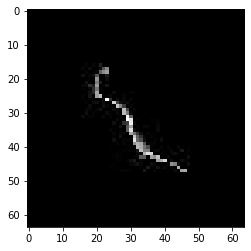

confidence for 19012 is 0.94350904


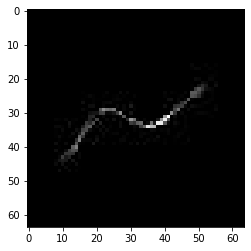

confidence for 19014 is 0.98602575


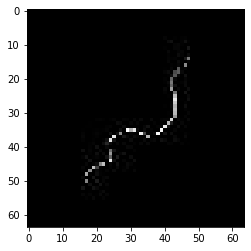

confidence for 19015 is 0.9218051


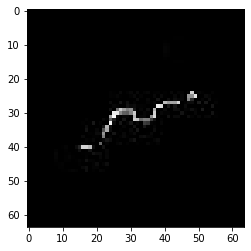

confidence for 19017 is 0.9253859


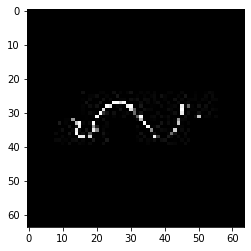

confidence for 19023 is 0.9791531


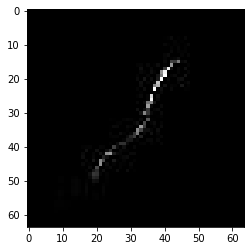

confidence for 19025 is 0.9918733


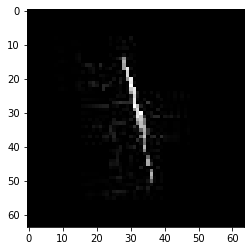

confidence for 19030 is 0.97320867


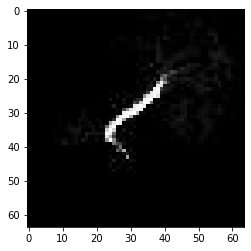

confidence for 19054 is 0.999209


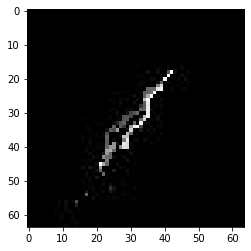

confidence for 19065 is 0.9807286


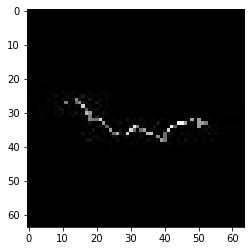

confidence for 19066 is 0.99862164


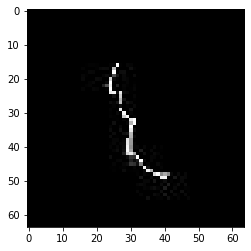

confidence for 19068 is 0.93992746


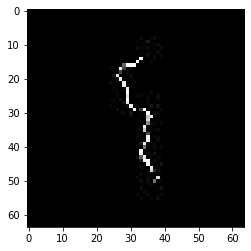

confidence for 19071 is 0.99687606


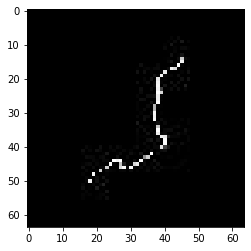

confidence for 19093 is 0.9817658


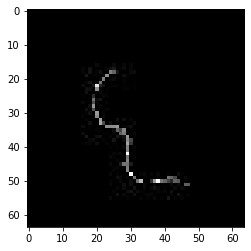

confidence for 19099 is 0.97699016


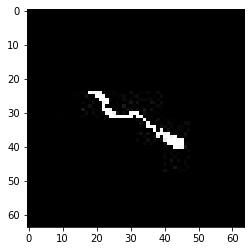

confidence for 19108 is 0.9643353


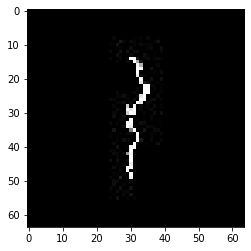

confidence for 19111 is 0.9999998


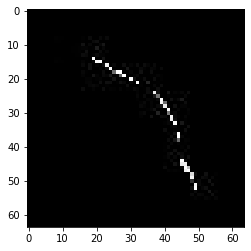

confidence for 19140 is 0.9979309


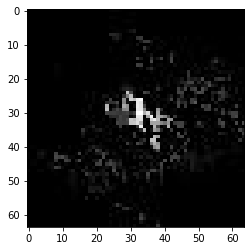

confidence for 19159 is 0.9358383


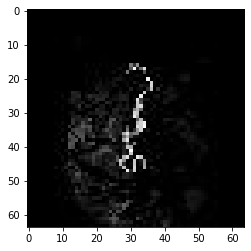

confidence for 19183 is 0.9999946


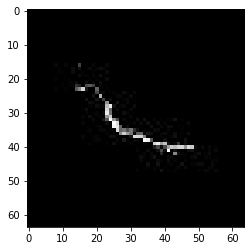

confidence for 19191 is 0.99986416


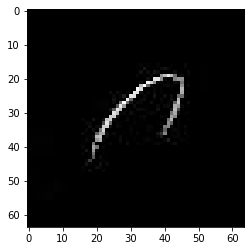

confidence for 19201 is 0.99526286


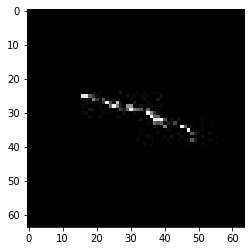

confidence for 19208 is 0.99345374


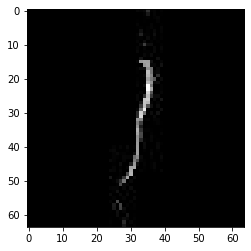

confidence for 19230 is 0.90733004


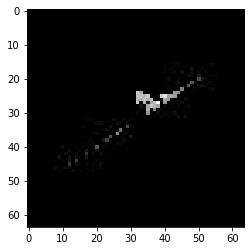

confidence for 19243 is 0.97027713


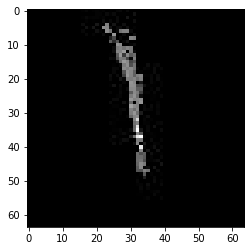

confidence for 19252 is 0.9463327


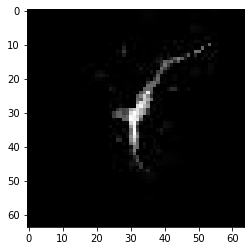

confidence for 19264 is 0.9839901


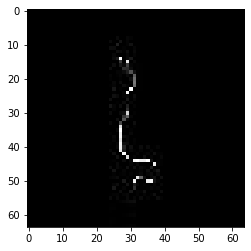

confidence for 19283 is 0.9996943


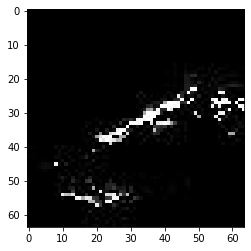

confidence for 19297 is 0.9997521


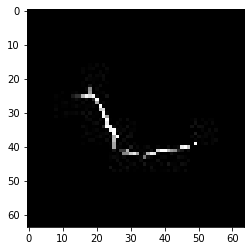

confidence for 19301 is 0.9987342


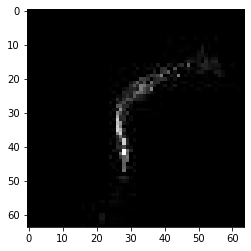

confidence for 19307 is 0.9944617


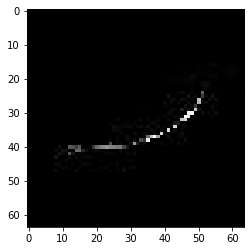

confidence for 19315 is 0.9998308


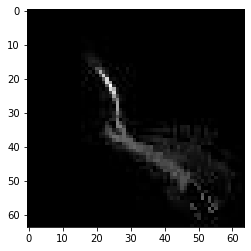

confidence for 19329 is 0.9832445


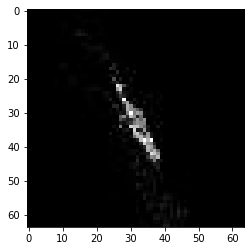

confidence for 19361 is 0.98168087


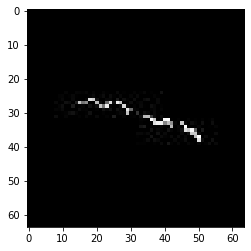

confidence for 19414 is 0.9998287


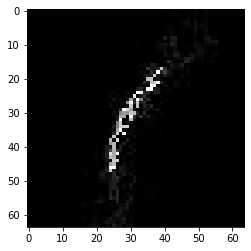

confidence for 19428 is 0.9996343


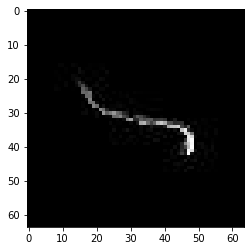

confidence for 19431 is 1.0


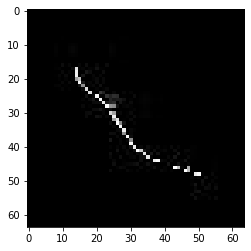

confidence for 19458 is 0.95081395


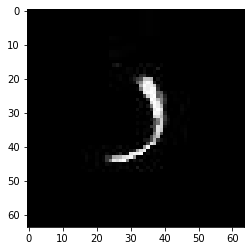

confidence for 19463 is 0.96251315


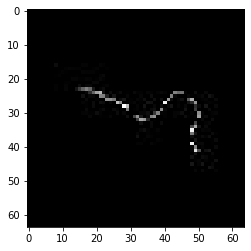

confidence for 19507 is 1.0


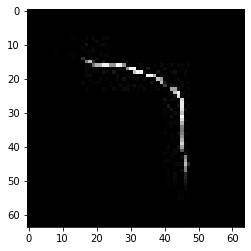

confidence for 19546 is 0.99994266


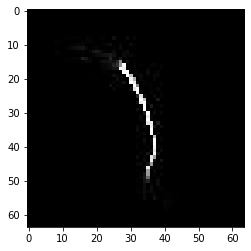

confidence for 19548 is 0.97043085


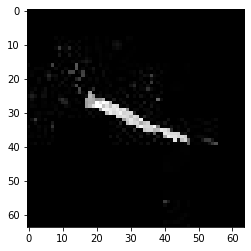

confidence for 19549 is 0.998732


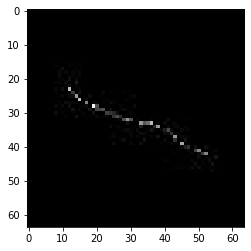

confidence for 19556 is 0.9912448


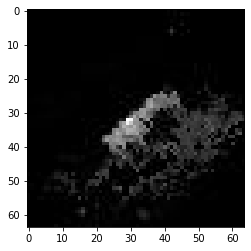

confidence for 19612 is 0.99985135


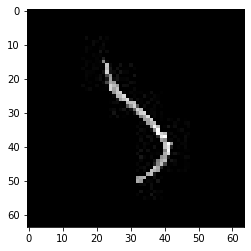

confidence for 19619 is 0.9627364


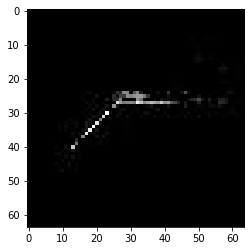

confidence for 19624 is 0.999992


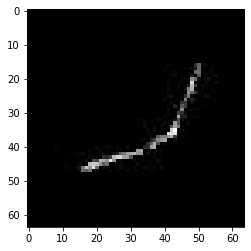

confidence for 19643 is 0.964138


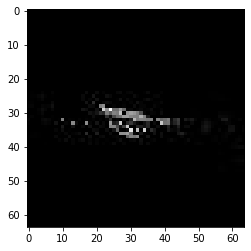

confidence for 19647 is 0.9674403


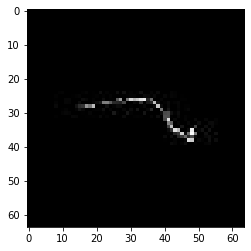

confidence for 19682 is 1.0


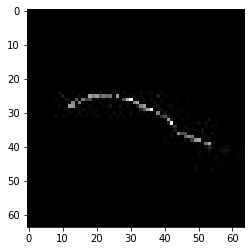

confidence for 19684 is 0.9676209


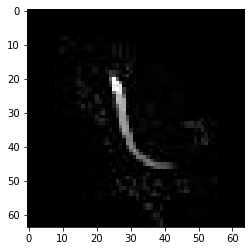

confidence for 19689 is 0.92195225


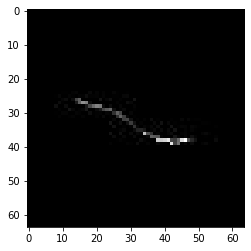

confidence for 19698 is 0.99289


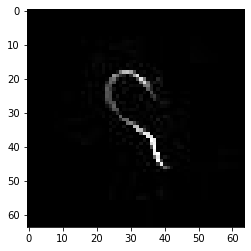

confidence for 19708 is 0.99997747


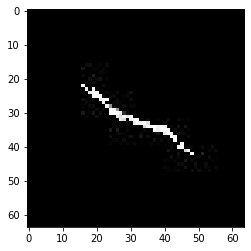

confidence for 19719 is 0.9984079


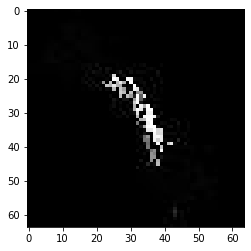

confidence for 19723 is 0.9984663


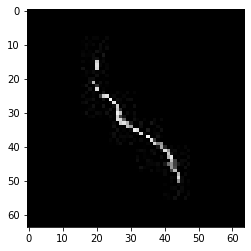

confidence for 19726 is 0.97647524


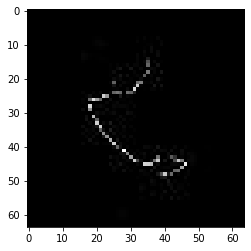

confidence for 19756 is 0.96381164


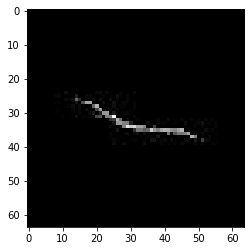

confidence for 19758 is 1.0


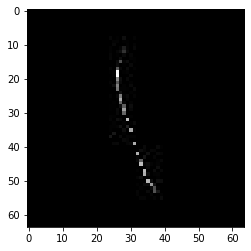

confidence for 19766 is 0.9914274


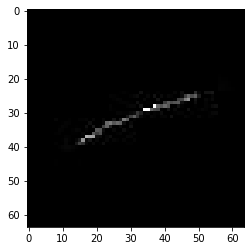

confidence for 19775 is 0.99999434


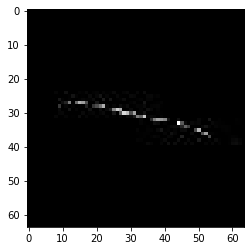

confidence for 19777 is 0.99999994


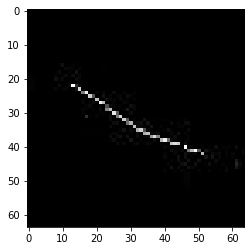

confidence for 19798 is 0.9536685


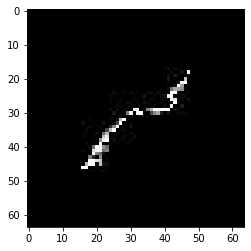

confidence for 19823 is 0.9917065


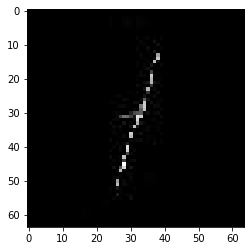

confidence for 19834 is 1.0


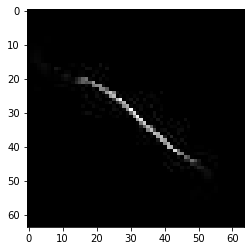

confidence for 19867 is 1.0


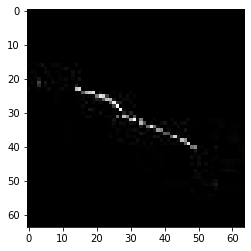

confidence for 19870 is 0.9562185


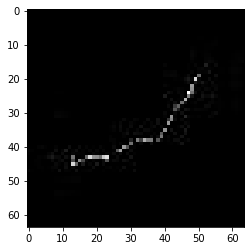

confidence for 19872 is 0.9129529


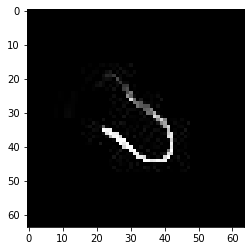

confidence for 19896 is 0.943856


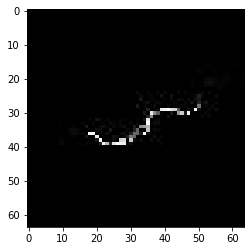

confidence for 19903 is 0.9178202


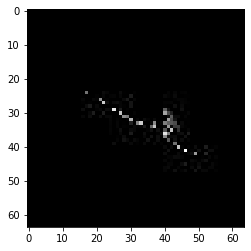

confidence for 19908 is 0.9999945


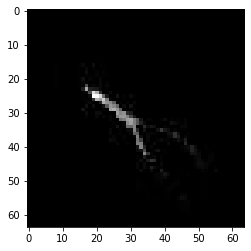

confidence for 19951 is 0.9968128


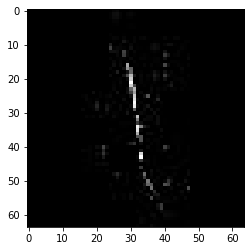

confidence for 19955 is 0.98662686


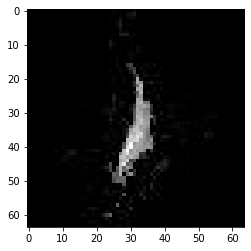

confidence for 19956 is 1.0


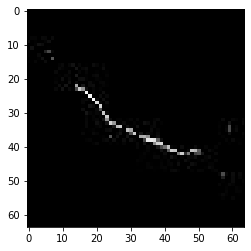

confidence for 19964 is 0.98325473


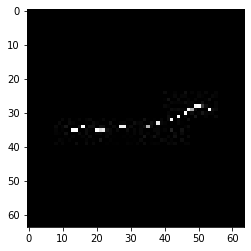

confidence for 19965 is 1.0


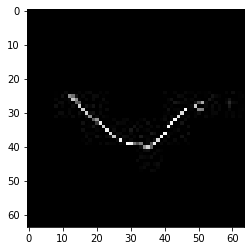

confidence for 19978 is 0.9999739


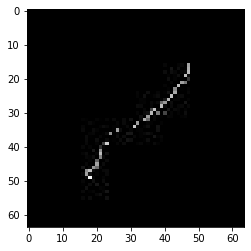

confidence for 19994 is 0.9999996


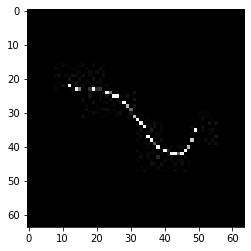

confidence for 20004 is 0.9999997


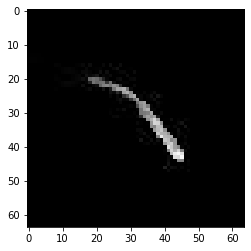

confidence for 20025 is 0.9966222


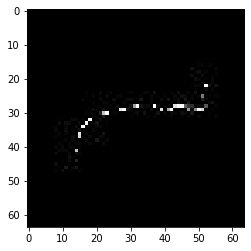

confidence for 20030 is 0.9079495


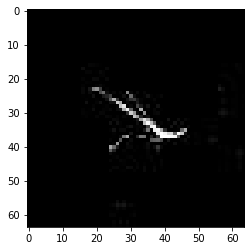

confidence for 20041 is 0.92076176


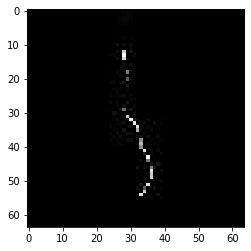

confidence for 20062 is 0.99491024


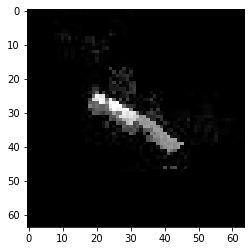

confidence for 20071 is 0.96292204


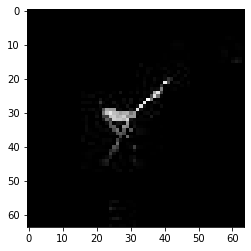

confidence for 20078 is 1.0


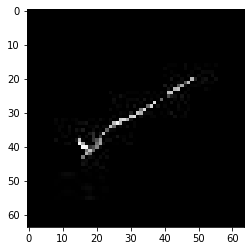

confidence for 20089 is 0.95456475


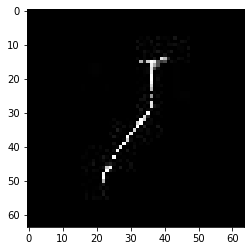

confidence for 20092 is 1.0


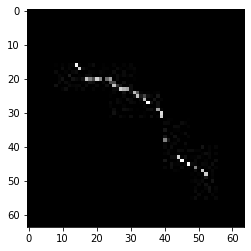

confidence for 20101 is 0.9126357


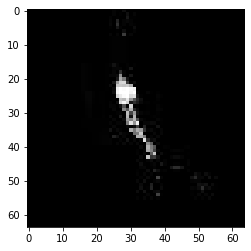

confidence for 20105 is 0.9692091


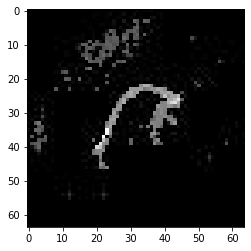

confidence for 20111 is 0.99997985


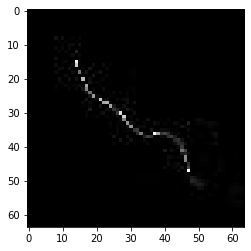

confidence for 20126 is 0.99999857


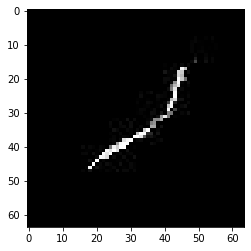

confidence for 20150 is 0.9999732


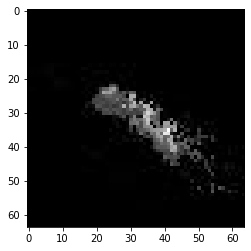

confidence for 20165 is 0.99999076


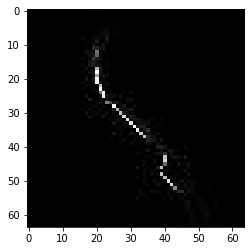

confidence for 20176 is 0.9762956


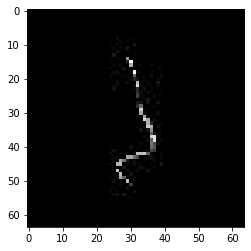

confidence for 20196 is 0.99996895


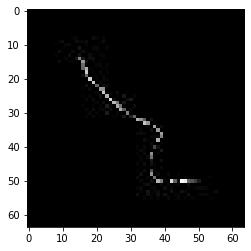

confidence for 20265 is 0.9945721


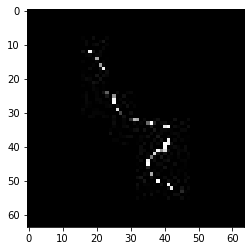

confidence for 20272 is 0.99527776


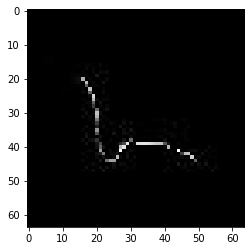

confidence for 20281 is 0.9641754


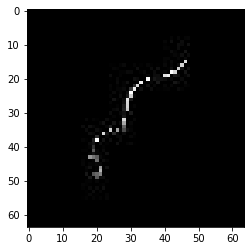

confidence for 20302 is 0.9997939


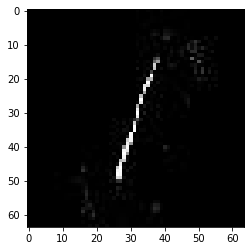

confidence for 20322 is 0.99955773


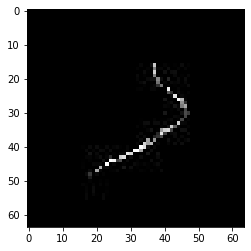

confidence for 20337 is 0.9999983


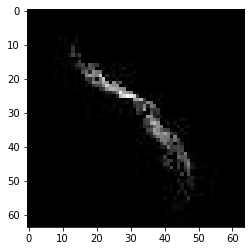

confidence for 20352 is 0.9946633


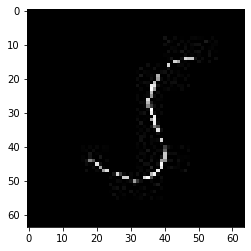

confidence for 20354 is 0.9728999


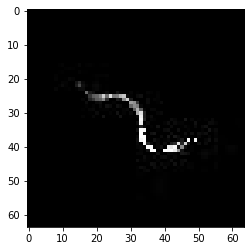

confidence for 20361 is 0.9367506


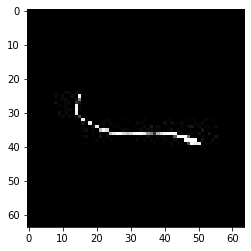

confidence for 20363 is 0.97056264


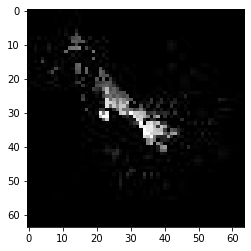

confidence for 20367 is 0.95917


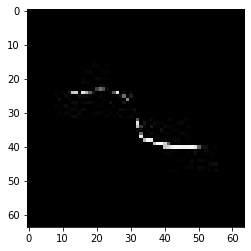

confidence for 20368 is 0.9526881


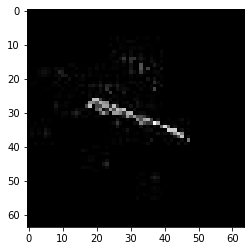

confidence for 20384 is 0.9264582


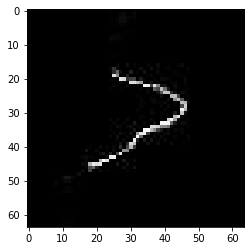

confidence for 20391 is 0.9214651


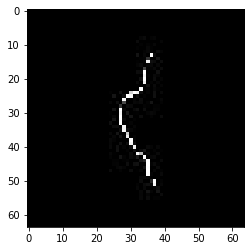

confidence for 20399 is 0.99999595


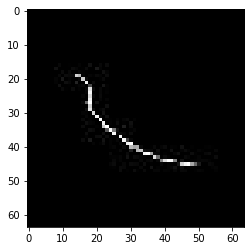

confidence for 20415 is 0.9999084


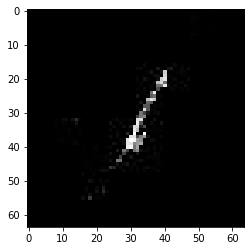

confidence for 20428 is 0.99996024


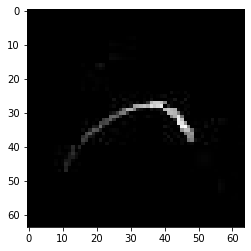

confidence for 20446 is 0.9993376


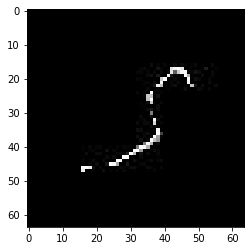

confidence for 20452 is 0.93286395


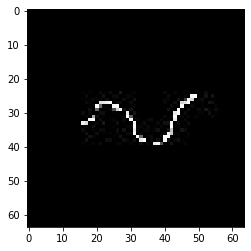

confidence for 20466 is 0.99761647


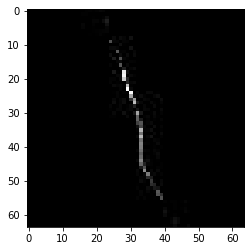

confidence for 20476 is 0.95371497


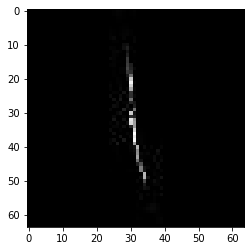

confidence for 20482 is 0.9346826


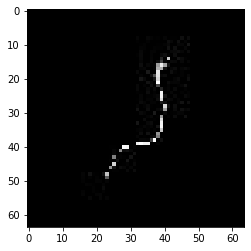

confidence for 20524 is 0.99999


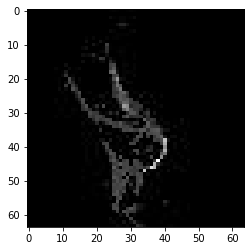

confidence for 20531 is 0.999993


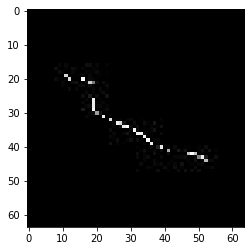

confidence for 20535 is 0.9192482


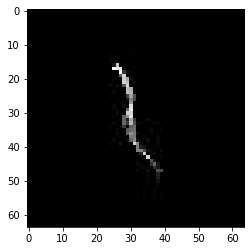

confidence for 20610 is 1.0


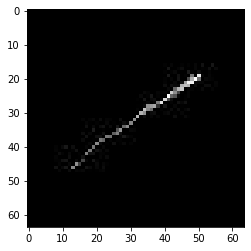

confidence for 20624 is 0.95730513


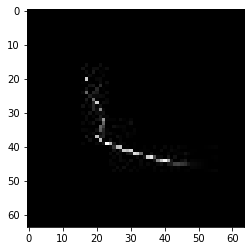

confidence for 20628 is 0.97861814


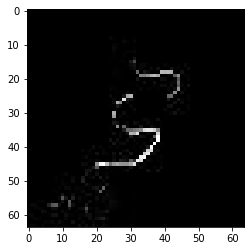

confidence for 20630 is 0.9279364


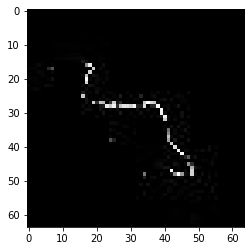

confidence for 20645 is 0.9659529


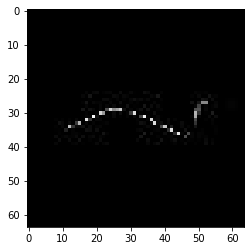

confidence for 20651 is 0.9287512


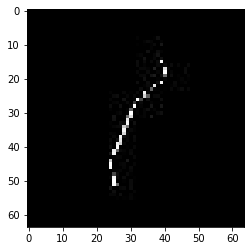

confidence for 20658 is 0.999999


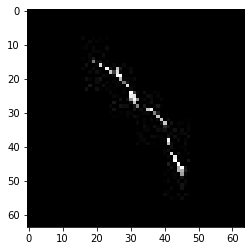

confidence for 20664 is 0.9746696


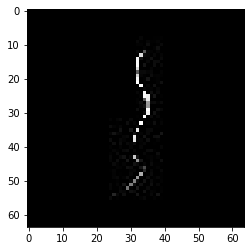

confidence for 20671 is 0.99998116


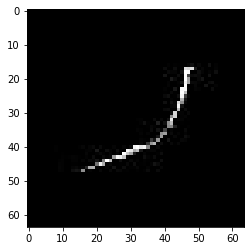

confidence for 20674 is 0.9999874


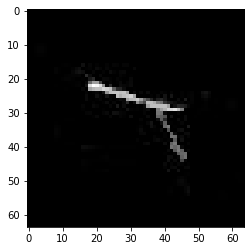

confidence for 20675 is 0.9461847


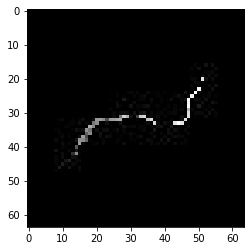

confidence for 20678 is 0.993737


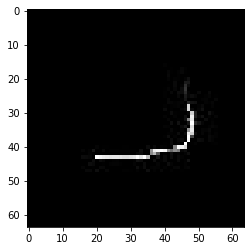

confidence for 20681 is 0.98842955


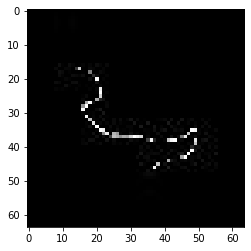

confidence for 20701 is 0.99990124


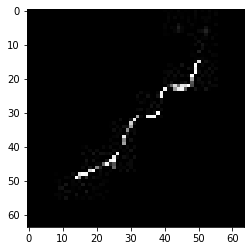

confidence for 20702 is 0.99903166


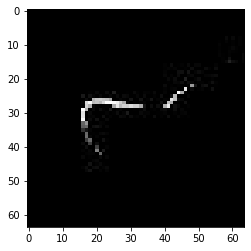

confidence for 20704 is 0.99496293


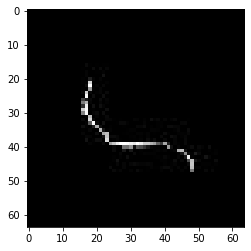

confidence for 20705 is 0.93959326


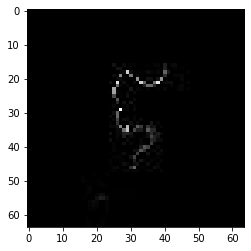

confidence for 20707 is 0.9999999


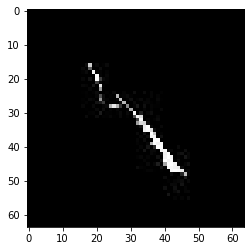

confidence for 20710 is 0.99999684


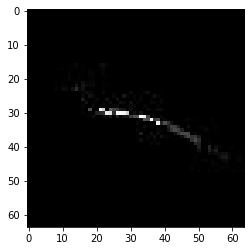

confidence for 20713 is 0.9963226


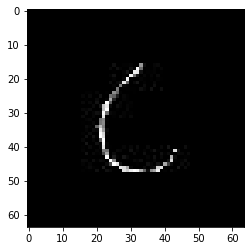

confidence for 20718 is 0.9997708


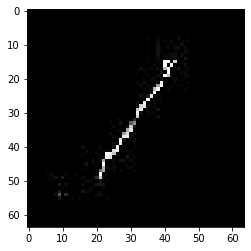

confidence for 20725 is 0.9557672


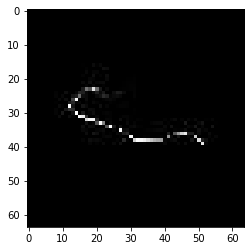

confidence for 20728 is 0.99951804


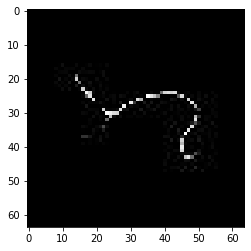

confidence for 20730 is 0.98309714


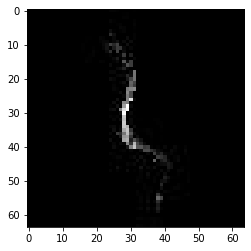

confidence for 20731 is 0.9989321


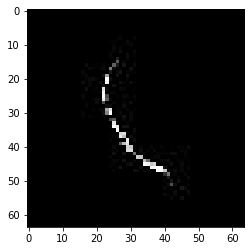

confidence for 20736 is 0.94936144


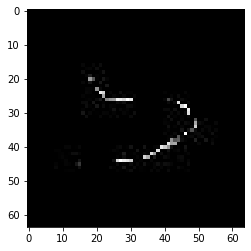

confidence for 20741 is 0.98947287


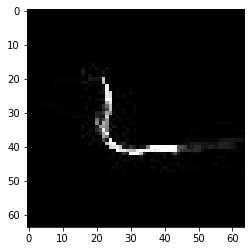

confidence for 20748 is 0.99992985


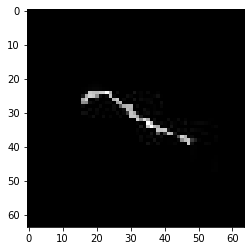

confidence for 20752 is 0.9999999


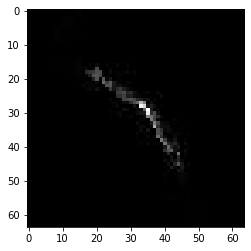

confidence for 20754 is 0.98994076


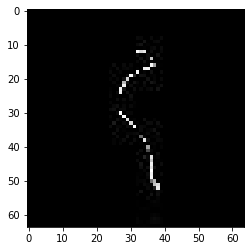

confidence for 20755 is 0.96214926


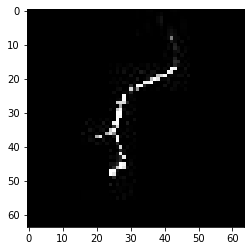

confidence for 20756 is 0.9914928


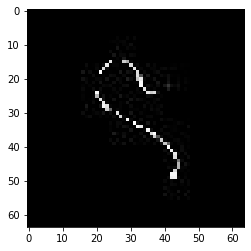

confidence for 20761 is 0.9955431


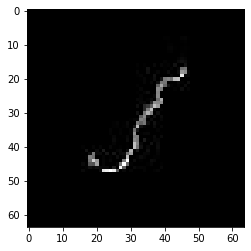

confidence for 20767 is 0.99895966


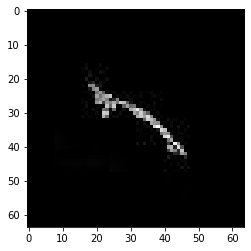

confidence for 20775 is 0.9999926


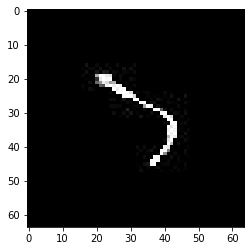

confidence for 20777 is 0.99999917


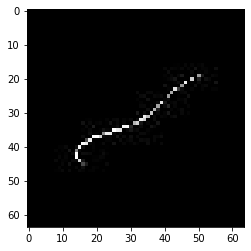

confidence for 20785 is 0.973546


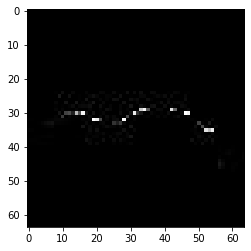

confidence for 20796 is 0.9966842


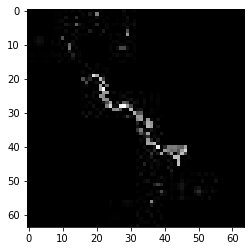

confidence for 20812 is 0.9997836


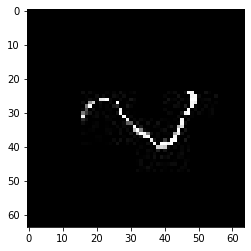

confidence for 20820 is 0.98703647


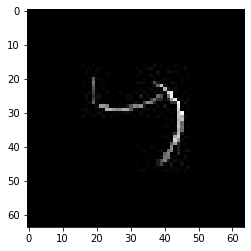

confidence for 20828 is 0.99818623


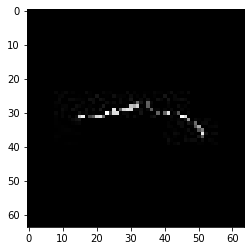

confidence for 20863 is 0.98113793


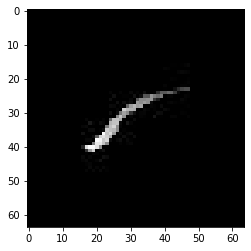

confidence for 20875 is 0.99885154


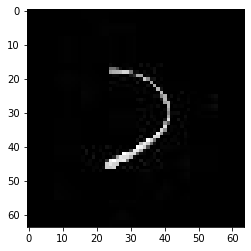

confidence for 20878 is 1.0


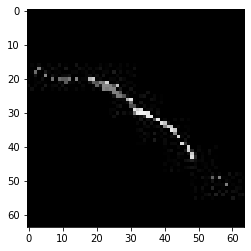

confidence for 20891 is 0.9911619


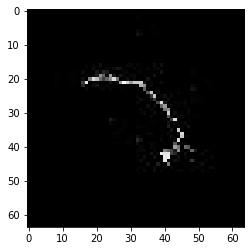

confidence for 20892 is 0.9957442


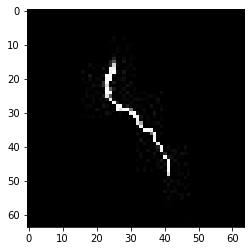

confidence for 20898 is 0.9933827


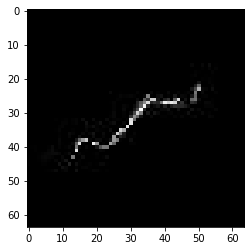

confidence for 20901 is 1.0


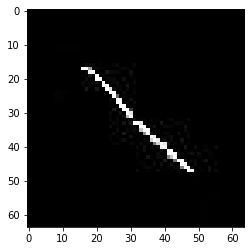

confidence for 20904 is 0.99843216


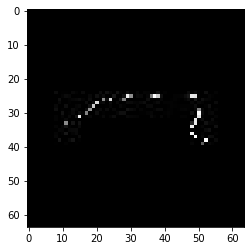

confidence for 20914 is 0.9368604


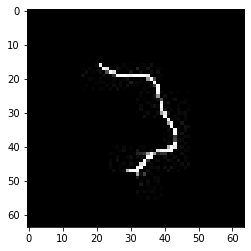

confidence for 20916 is 0.99227226


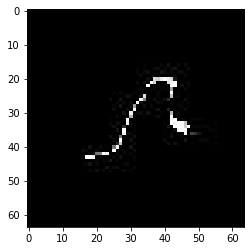

confidence for 20950 is 0.9998279


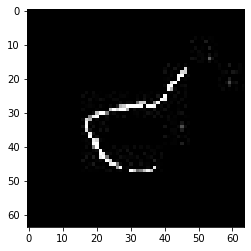

confidence for 20955 is 0.999975


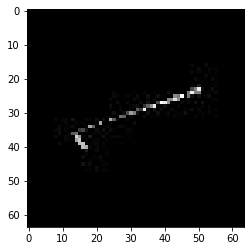

confidence for 20958 is 0.99165374


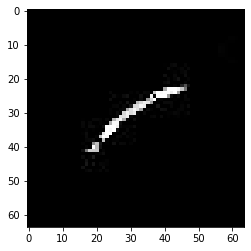

confidence for 20971 is 0.9251031


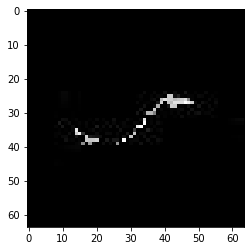

confidence for 20984 is 0.99999857


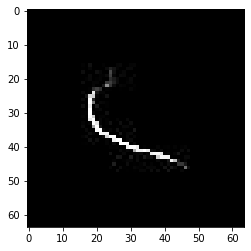

confidence for 20986 is 0.96425796


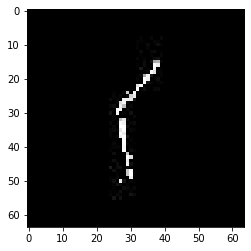

confidence for 20991 is 0.99308443


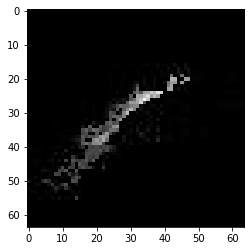

confidence for 20999 is 0.9999982


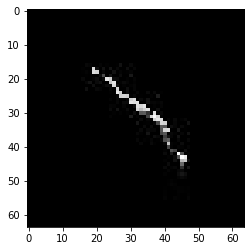

confidence for 21004 is 0.9865999


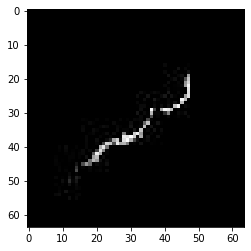

confidence for 21013 is 0.9988696


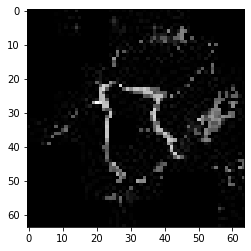

confidence for 21032 is 0.9584799


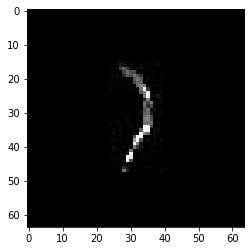

confidence for 21040 is 0.9999991


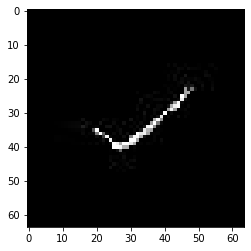

confidence for 21053 is 0.9868362


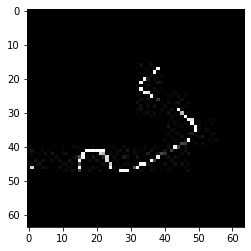

confidence for 21064 is 0.99951255


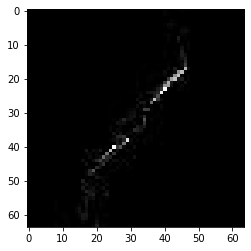

confidence for 21068 is 0.9125529


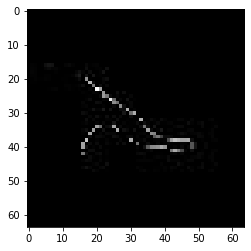

confidence for 21092 is 0.9383306


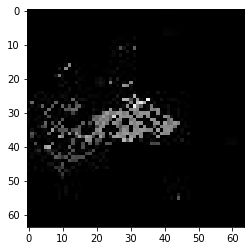

confidence for 21098 is 0.99974656


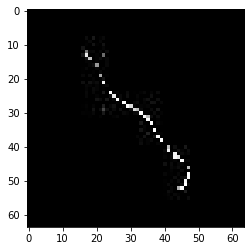

confidence for 21104 is 0.999925


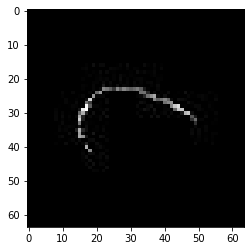

confidence for 21136 is 0.9947854


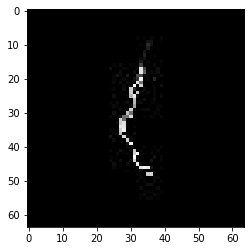

confidence for 21145 is 0.99990183


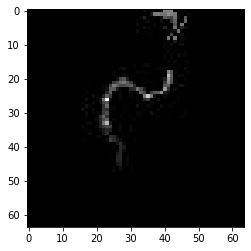

confidence for 21150 is 0.99996686


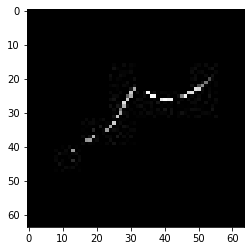

confidence for 21154 is 0.9821848


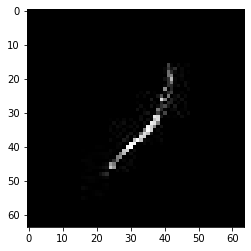

confidence for 21161 is 0.9856256


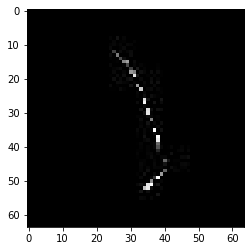

confidence for 21166 is 0.99959326


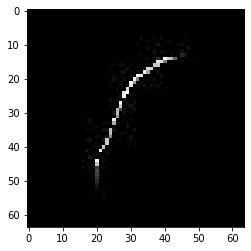

confidence for 21176 is 0.9827958


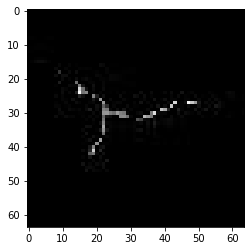

confidence for 21193 is 0.9999999


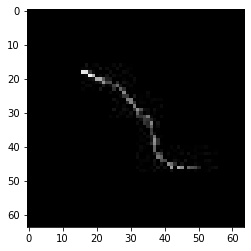

confidence for 21197 is 0.99998957


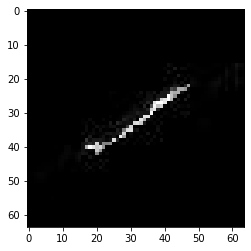

confidence for 21198 is 0.98400897


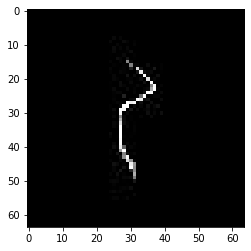

confidence for 21201 is 0.9999998


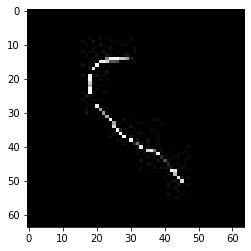

confidence for 21202 is 0.99995166


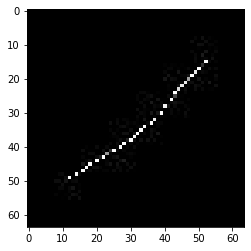

confidence for 21209 is 0.9996985


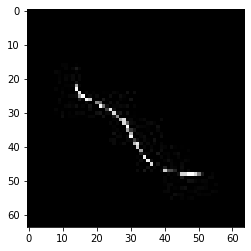

confidence for 21212 is 0.9921811


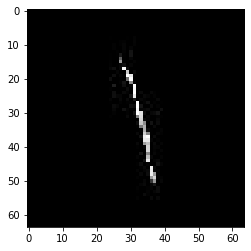

confidence for 21221 is 0.9989501


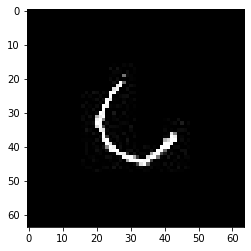

confidence for 21225 is 0.9997394


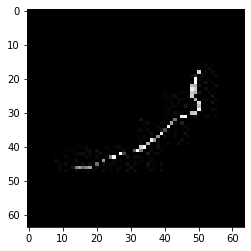

confidence for 21233 is 0.9932979


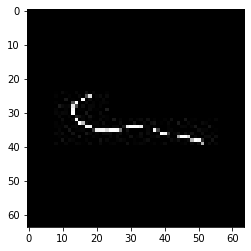

confidence for 21246 is 0.9978261


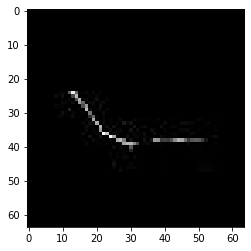

confidence for 21255 is 0.9973825


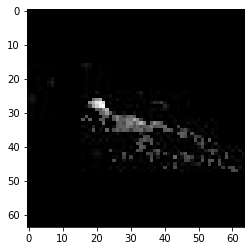

confidence for 21256 is 0.9403438


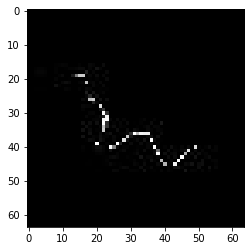

confidence for 21257 is 0.90676403


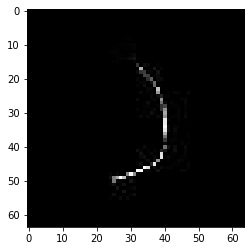

confidence for 21258 is 0.9722463


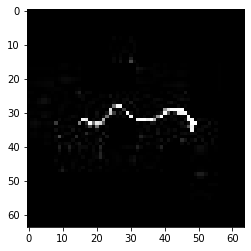

confidence for 21267 is 0.9999998


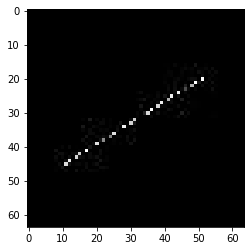

confidence for 21278 is 0.99778104


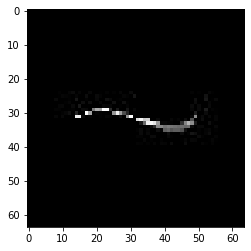

confidence for 21304 is 0.9837558


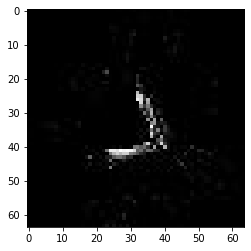

confidence for 21317 is 0.9932601


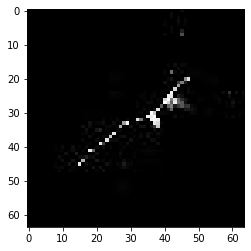

confidence for 21321 is 0.9984238


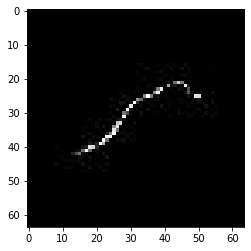

confidence for 21332 is 0.9873709


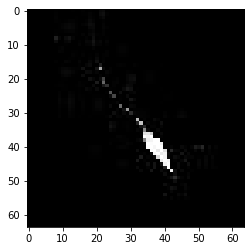

confidence for 21333 is 0.99989194


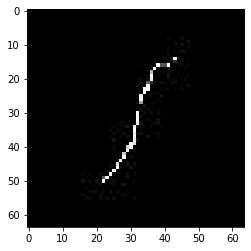

confidence for 21359 is 0.9214116


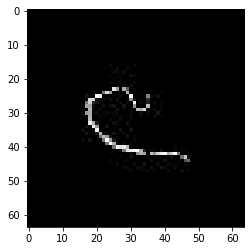

confidence for 21377 is 0.99058527


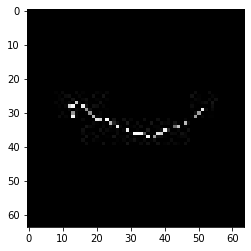

confidence for 21411 is 0.9064539


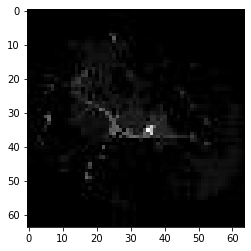

confidence for 21416 is 0.92936695


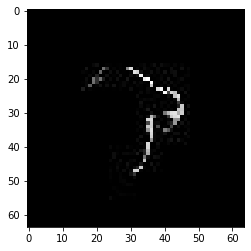

confidence for 21423 is 0.9312299


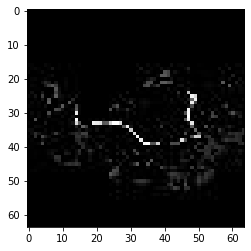

confidence for 21424 is 0.92581147


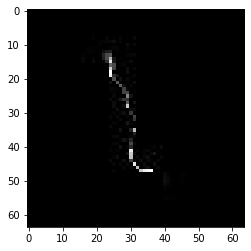

confidence for 21453 is 0.9343443


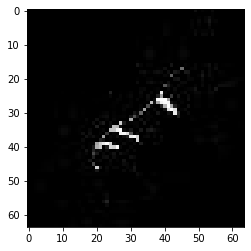

confidence for 21475 is 1.0


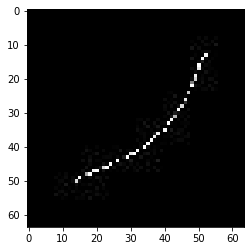

confidence for 21495 is 0.9916907


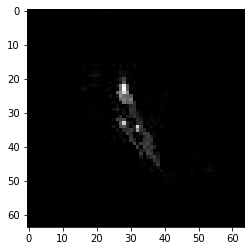

confidence for 21498 is 0.9038143


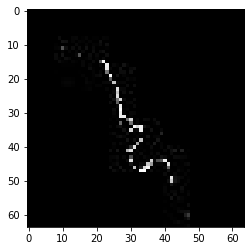

confidence for 21500 is 0.99977595


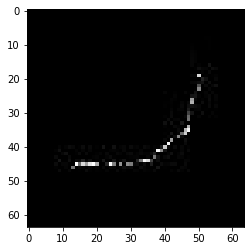

confidence for 21540 is 0.99017185


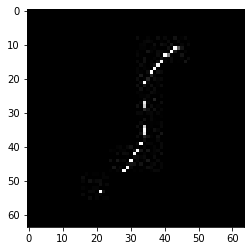

confidence for 21542 is 0.9871678


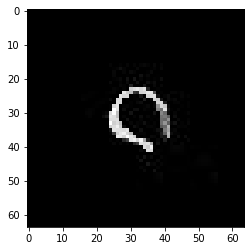

confidence for 21555 is 0.9999706


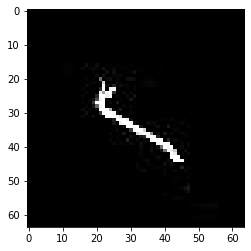

confidence for 21581 is 0.99663997


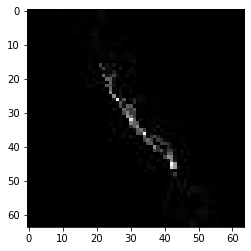

confidence for 21587 is 0.99999887


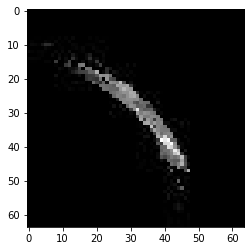

confidence for 21603 is 0.99854237


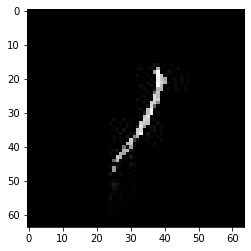

confidence for 21610 is 0.9999153


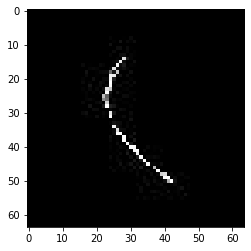

confidence for 21629 is 0.9999993


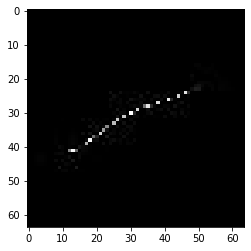

confidence for 21630 is 0.99988866


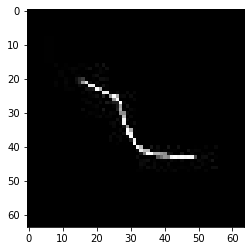

confidence for 21638 is 0.9995993


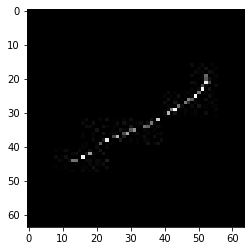

confidence for 21640 is 0.9999923


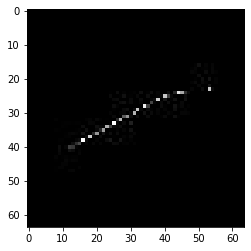

confidence for 21653 is 0.98957753


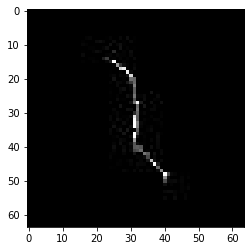

confidence for 21665 is 1.0


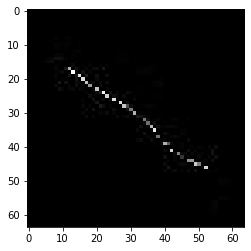

confidence for 21668 is 0.99333376


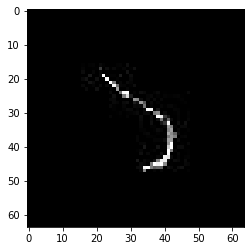

confidence for 21684 is 0.97061765


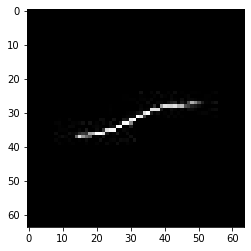

confidence for 21685 is 0.9670382


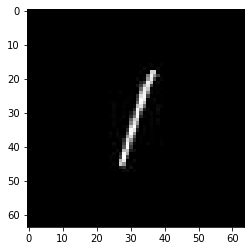

confidence for 21694 is 0.9980679


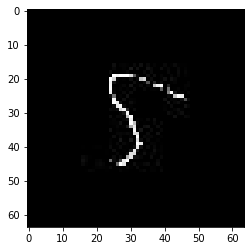

confidence for 21709 is 0.99986017


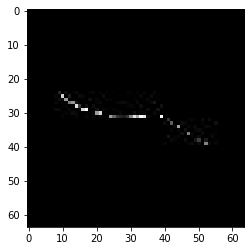

confidence for 21716 is 0.95910686


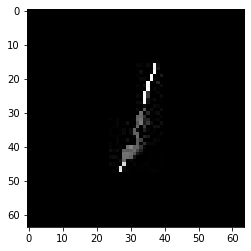

confidence for 21718 is 0.9869794


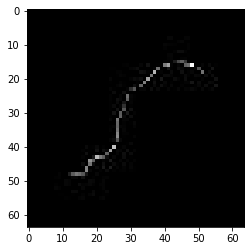

confidence for 21720 is 0.99634707


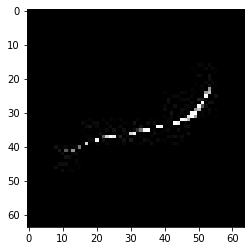

confidence for 21747 is 0.9985324


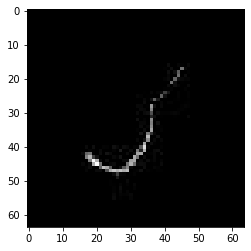

confidence for 21779 is 0.9999975


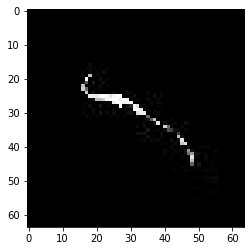

confidence for 21801 is 0.99750525


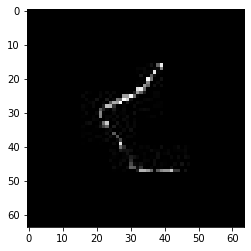

confidence for 21810 is 0.9994399


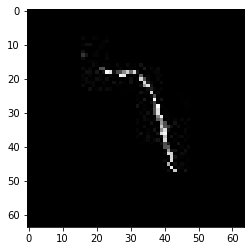

confidence for 21825 is 0.99999946


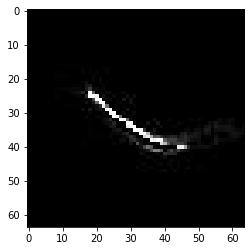

confidence for 21827 is 1.0


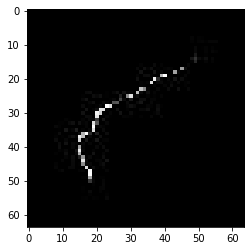

confidence for 21830 is 0.9750677


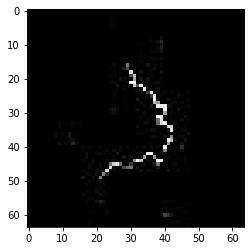

confidence for 21846 is 0.9999976


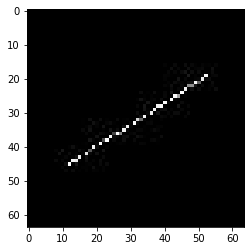

confidence for 21857 is 0.9892056


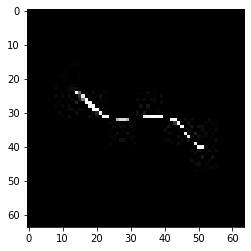

confidence for 21860 is 0.9964167


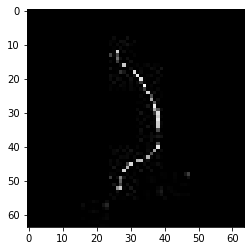

confidence for 21881 is 0.99693763


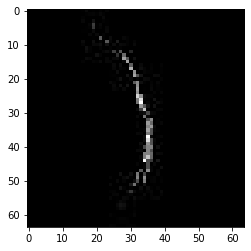

confidence for 21885 is 0.93708175


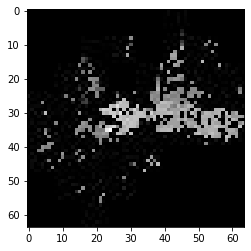

confidence for 21896 is 0.9999311


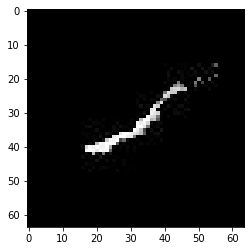

confidence for 21897 is 0.9999875


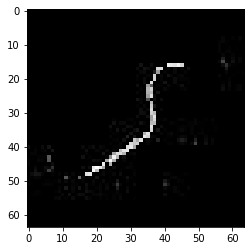

confidence for 21915 is 0.9999708


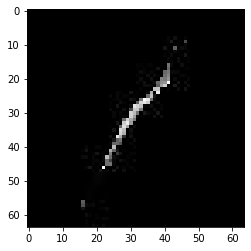

confidence for 21926 is 0.9985315


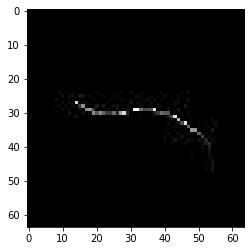

confidence for 21927 is 0.9942432


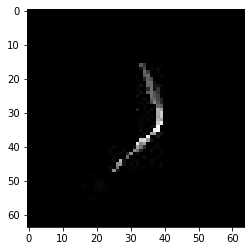

confidence for 21930 is 0.9279888


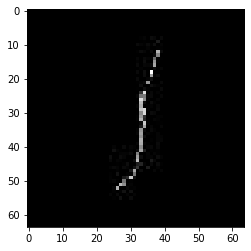

confidence for 21932 is 0.9978679


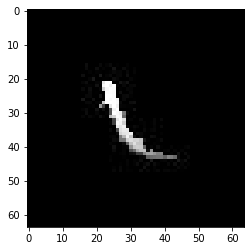

confidence for 21940 is 0.9535402


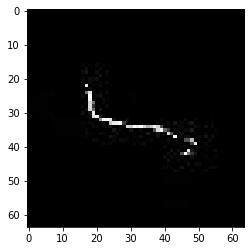

confidence for 21941 is 0.9969824


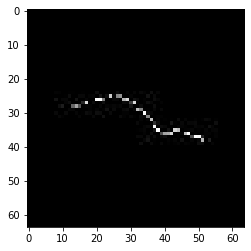

confidence for 21949 is 0.9902233


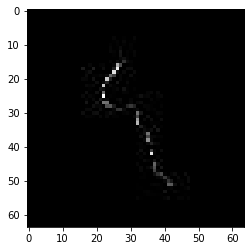

confidence for 21971 is 0.99999934


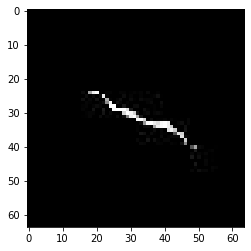

confidence for 21978 is 0.976018


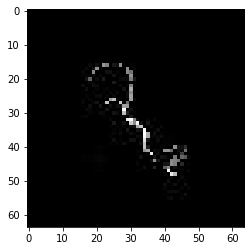

confidence for 21984 is 0.9983773


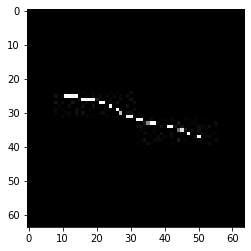

confidence for 21987 is 0.94441813


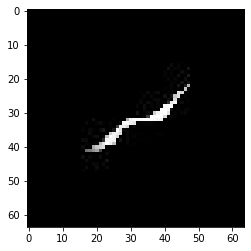

confidence for 21995 is 1.0


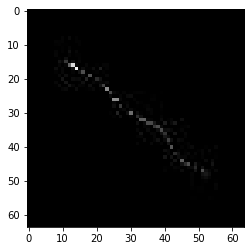

confidence for 21997 is 0.9936264


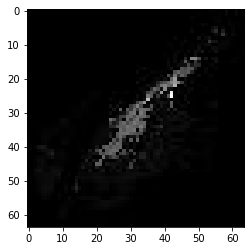

confidence for 22004 is 0.9812795


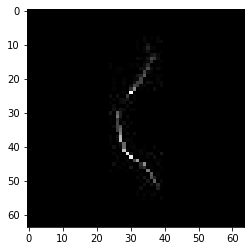

confidence for 22006 is 0.99976844


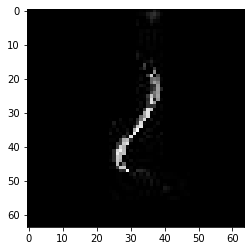

confidence for 22015 is 0.94337845


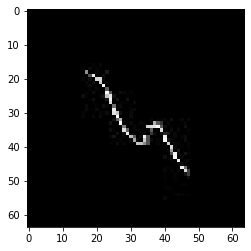

confidence for 22017 is 0.992162


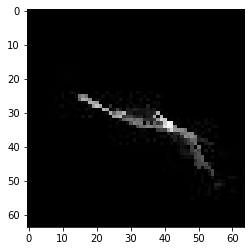

confidence for 22021 is 0.99993694


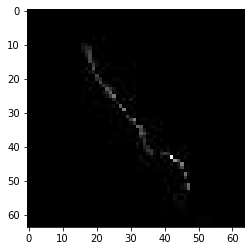

confidence for 22042 is 0.993787


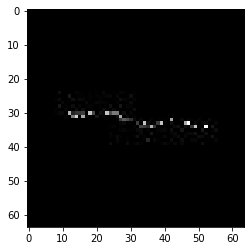

confidence for 22062 is 0.97504574


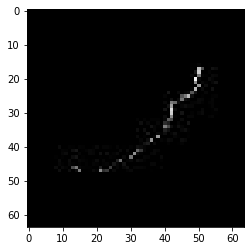

confidence for 22072 is 0.9992607


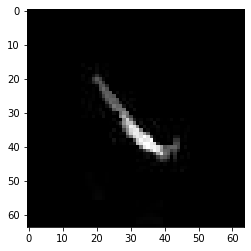

confidence for 22086 is 0.9022553


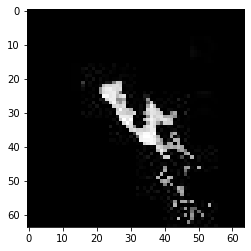

confidence for 22089 is 0.9661997


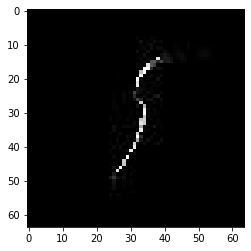

confidence for 22108 is 0.99954915


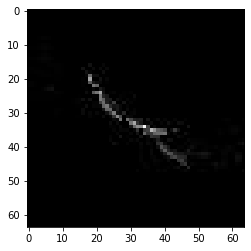

confidence for 22119 is 0.90164495


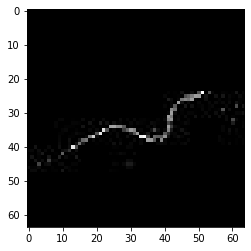

confidence for 22122 is 0.9852498


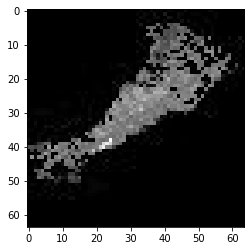

confidence for 22128 is 1.0


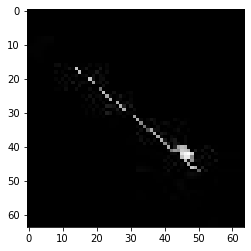

confidence for 22149 is 0.99999964


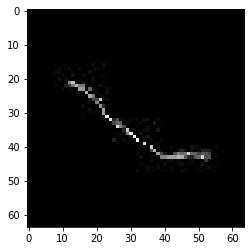

confidence for 22156 is 0.93287414


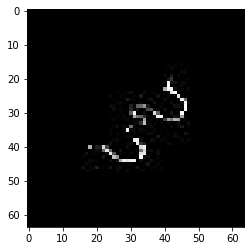

confidence for 22157 is 1.0


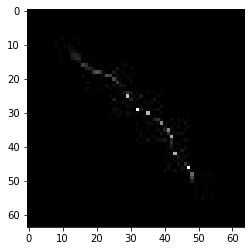

confidence for 22158 is 0.9999865


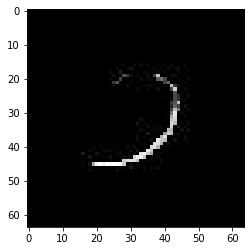

confidence for 22160 is 0.9818907


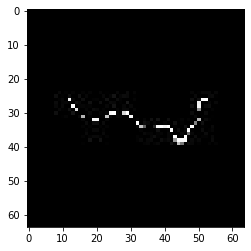

confidence for 22164 is 0.9981393


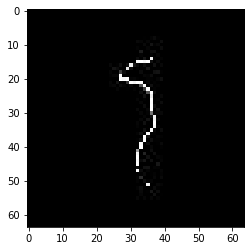

confidence for 22176 is 0.99978995


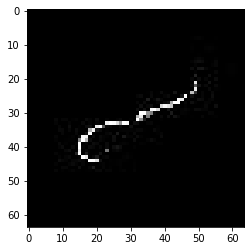

confidence for 22191 is 0.9812037


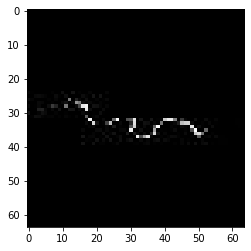

confidence for 22196 is 0.90414447


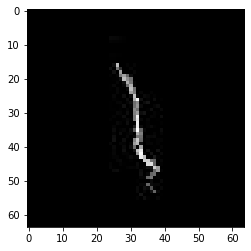

confidence for 22216 is 0.9835199


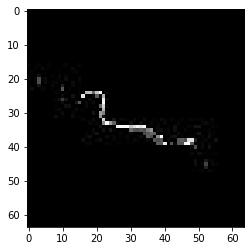

confidence for 22223 is 0.95147717


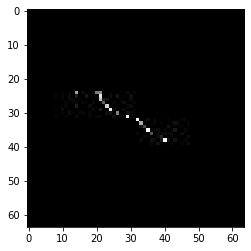

confidence for 22225 is 0.9641523


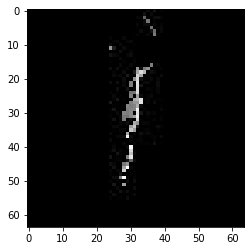

confidence for 22228 is 0.99999833


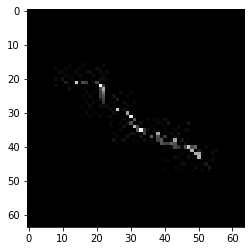

confidence for 22261 is 0.9892843


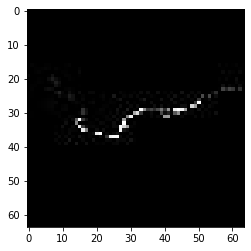

confidence for 22262 is 0.9873237


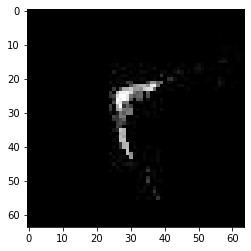

confidence for 22273 is 0.9754463


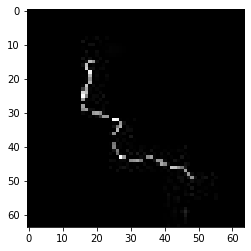

confidence for 22276 is 0.99759406


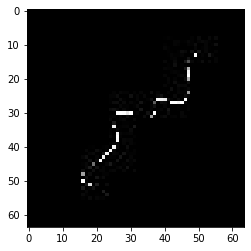

confidence for 22280 is 0.96005213


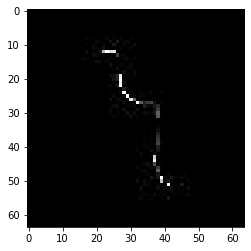

confidence for 22282 is 0.9946651


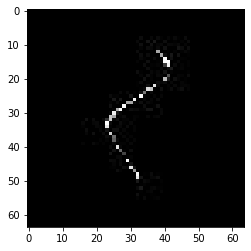

confidence for 22284 is 0.99990875


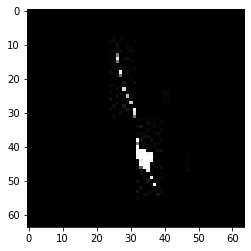

confidence for 22285 is 0.9999983


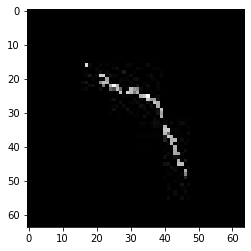

confidence for 22295 is 0.9669689


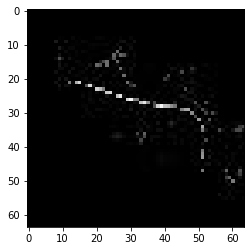

confidence for 22308 is 0.9866334


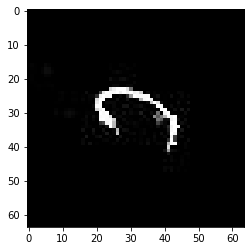

confidence for 22322 is 0.99999976


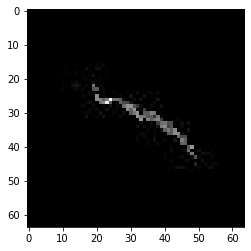

confidence for 22365 is 0.97982496


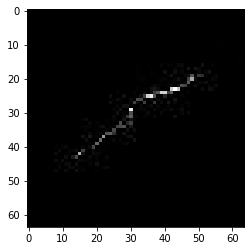

confidence for 22375 is 0.9975102


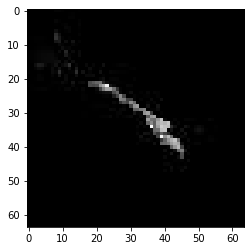

confidence for 22392 is 0.9669625


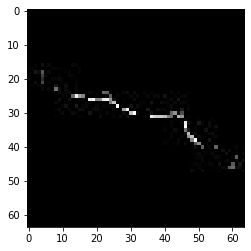

confidence for 22402 is 0.9517057


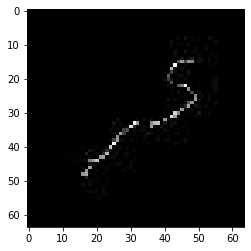

confidence for 22424 is 0.99999994


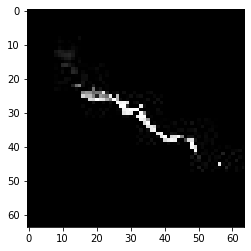

confidence for 22427 is 0.9741149


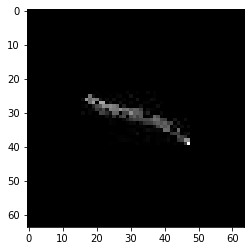

confidence for 22446 is 0.99981976


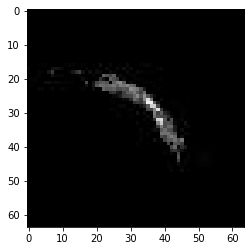

confidence for 22476 is 0.93333685


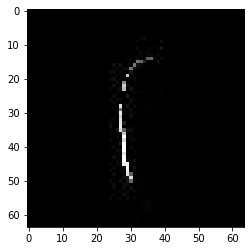

confidence for 22517 is 0.9990263


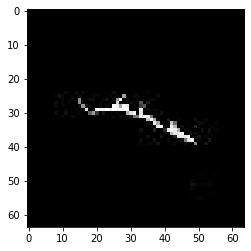

confidence for 22529 is 0.9764402


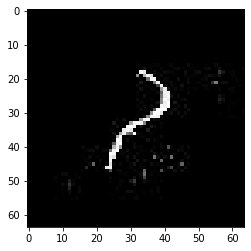

confidence for 22531 is 0.92064416


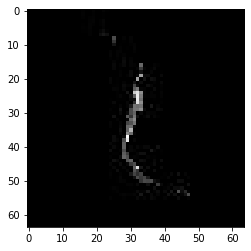

confidence for 22538 is 0.999986


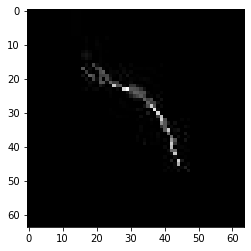

confidence for 22553 is 0.9999986


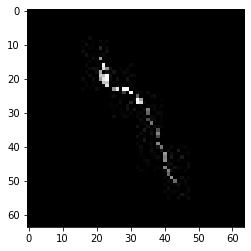

confidence for 22563 is 0.9942729


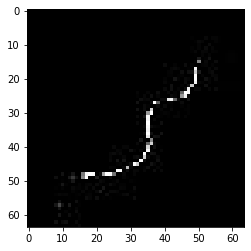

confidence for 22589 is 1.0


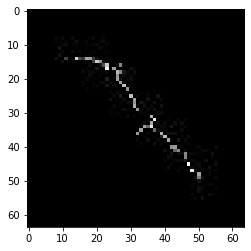

confidence for 22601 is 0.9995089


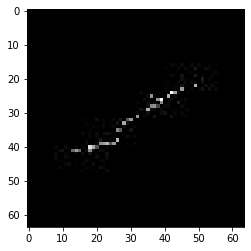

confidence for 22603 is 0.999979


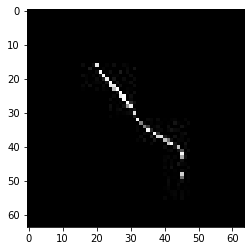

confidence for 22613 is 0.9624788


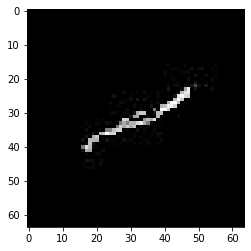

confidence for 22634 is 0.99168295


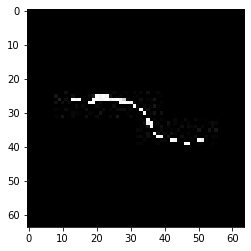

confidence for 22635 is 0.9126815


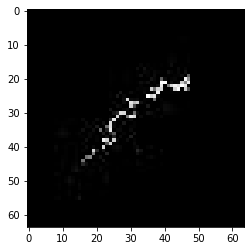

confidence for 22640 is 0.9996691


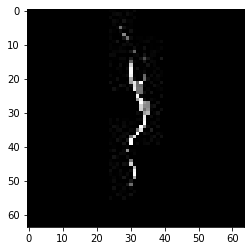

confidence for 22644 is 0.93091726


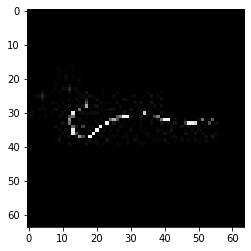

confidence for 22648 is 0.9579258


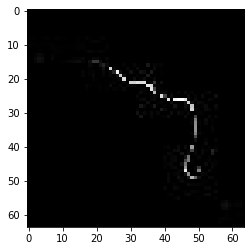

confidence for 22659 is 1.0


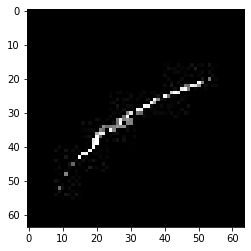

confidence for 22666 is 0.9848195


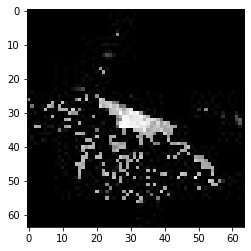

confidence for 22680 is 0.99972045


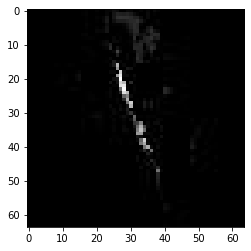

confidence for 22690 is 0.9999707


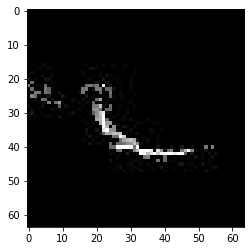

confidence for 22696 is 0.90783393


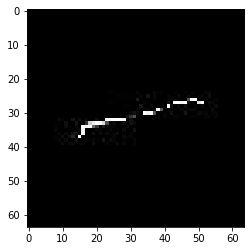

confidence for 22713 is 0.9999676


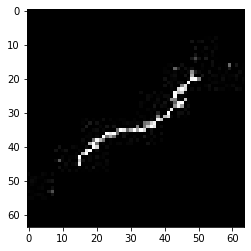

confidence for 22762 is 0.9998864


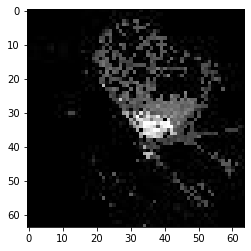

confidence for 22768 is 0.93749434


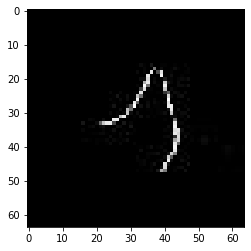

confidence for 22772 is 0.99479634


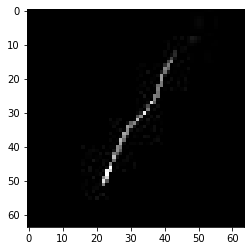

confidence for 22794 is 0.99280363


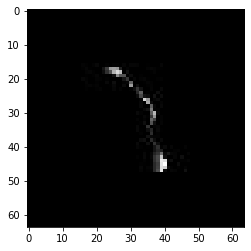

confidence for 22795 is 0.9876554


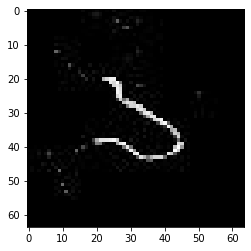

confidence for 22801 is 0.9946545


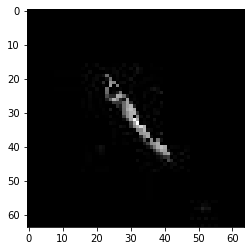

confidence for 22803 is 0.99980325


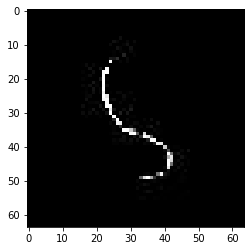

confidence for 22805 is 0.97278875


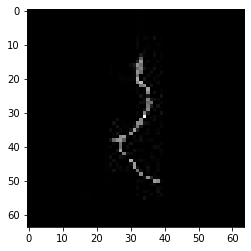

confidence for 22809 is 0.91289157


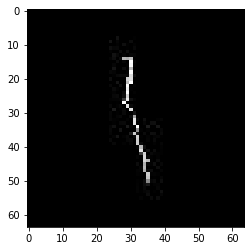

confidence for 22820 is 0.9969934


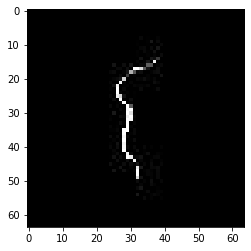

confidence for 22824 is 0.9999961


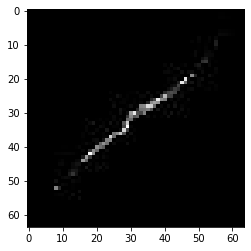

confidence for 22835 is 0.9997296


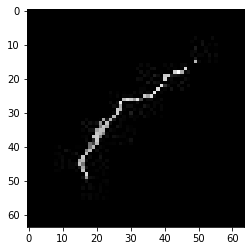

confidence for 22897 is 0.99681


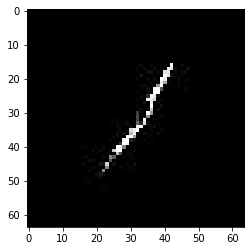

confidence for 22899 is 0.9758243


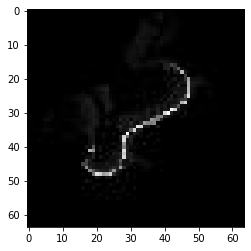

confidence for 22902 is 0.9824156


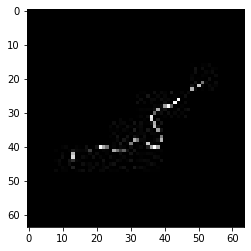

confidence for 22910 is 0.99906474


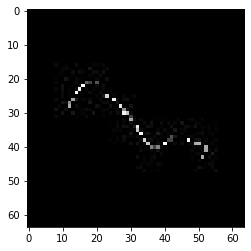

confidence for 22912 is 0.98792124


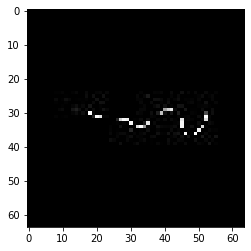

confidence for 22917 is 0.9518834


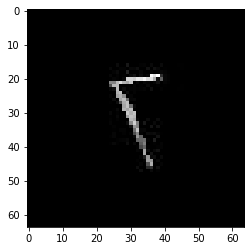

confidence for 22926 is 0.90017664


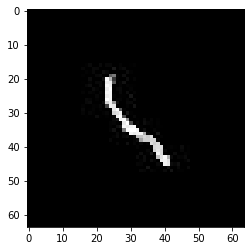

confidence for 22937 is 0.9615722


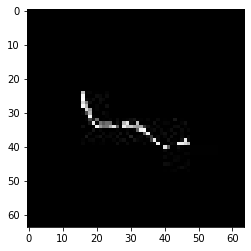

confidence for 22949 is 0.9920546


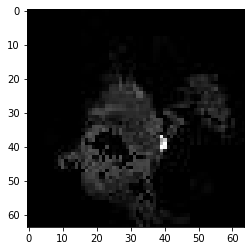

confidence for 22957 is 0.9983227


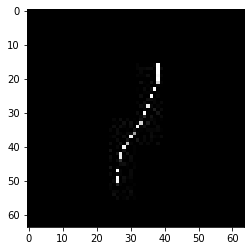

confidence for 22978 is 0.9218897


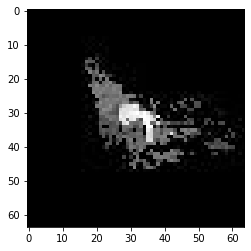

confidence for 22986 is 0.9996611


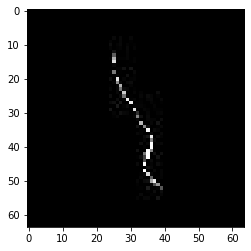

confidence for 22990 is 0.9990877


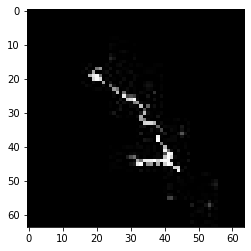

confidence for 22991 is 0.95405424


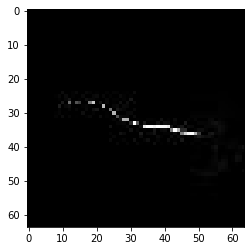

confidence for 22996 is 1.0


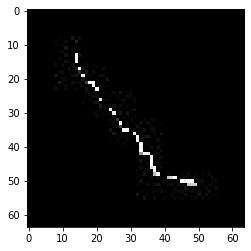

confidence for 22997 is 0.99602157


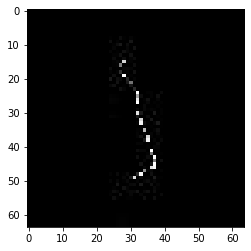

confidence for 23006 is 0.9999832


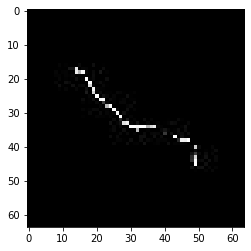

confidence for 23007 is 0.9673682


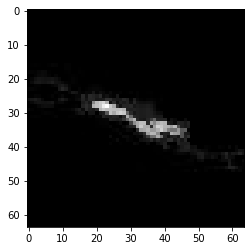

confidence for 23031 is 0.9791029


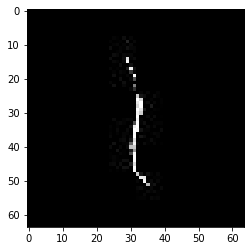

confidence for 23044 is 0.99364716


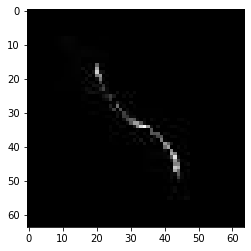

confidence for 23045 is 0.9999311


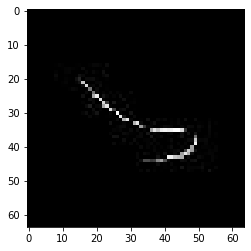

confidence for 23049 is 0.95588493


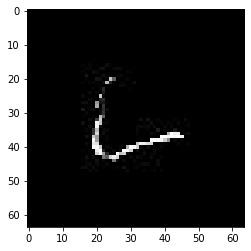

confidence for 23064 is 0.9850306


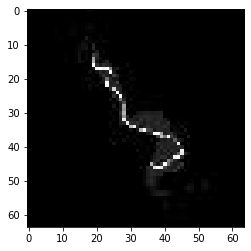

confidence for 23086 is 0.99813515


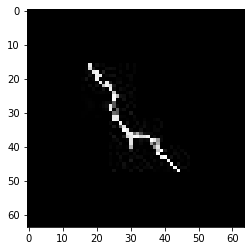

confidence for 23102 is 0.99999994


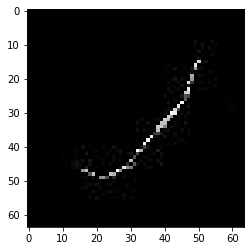

confidence for 23113 is 0.90036905


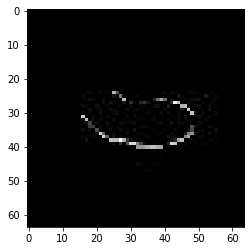

confidence for 23114 is 0.99983454


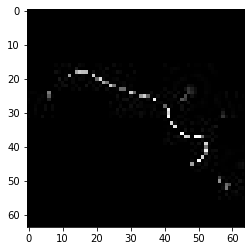

confidence for 23131 is 0.9857986


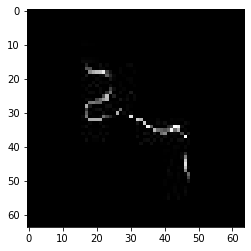

confidence for 23135 is 0.99899626


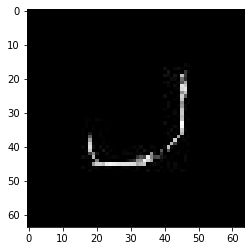

confidence for 23150 is 1.0


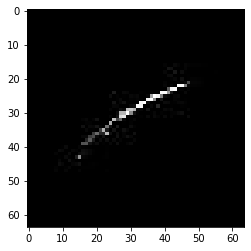

confidence for 23155 is 0.9971584


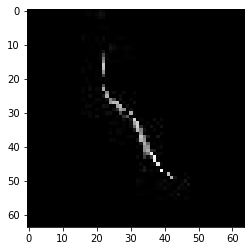

confidence for 23160 is 0.9701341


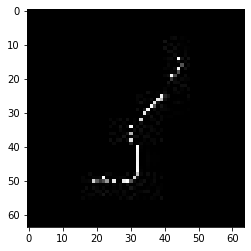

confidence for 23166 is 0.99999565


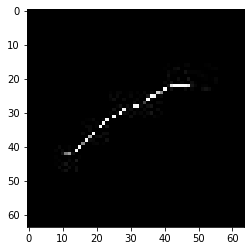

confidence for 23171 is 0.9996788


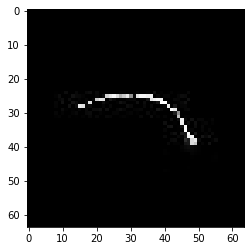

confidence for 23183 is 0.998344


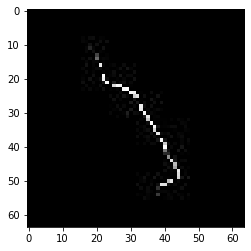

confidence for 23191 is 0.92533356


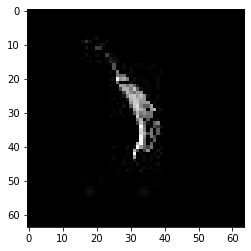

confidence for 23193 is 0.9999991


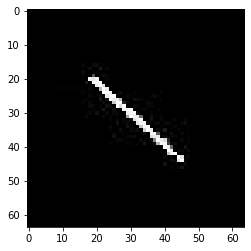

confidence for 23199 is 0.996177


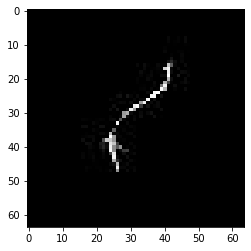

confidence for 23206 is 0.98115385


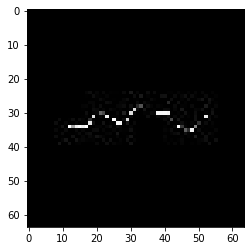

confidence for 23210 is 0.9639722


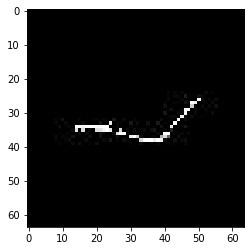

confidence for 23222 is 0.99998575


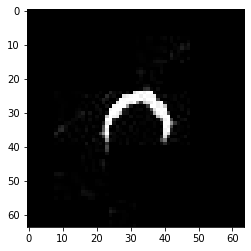

confidence for 23234 is 0.9966243


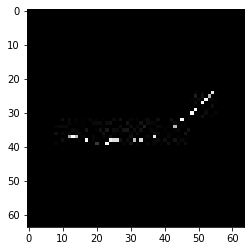

confidence for 23271 is 0.94573027


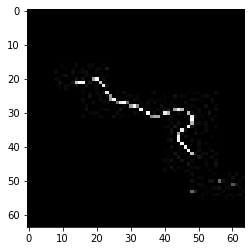

confidence for 23279 is 0.9999992


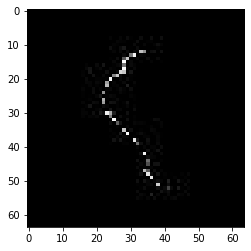

confidence for 23282 is 0.9731158


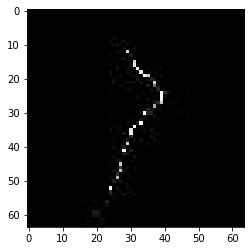

confidence for 23292 is 0.9282


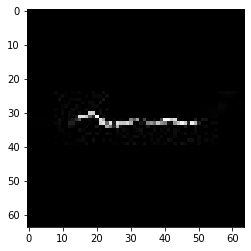

confidence for 23305 is 0.99999934


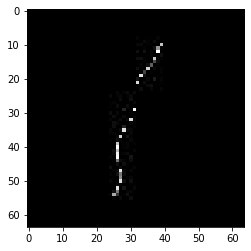

confidence for 23320 is 0.98402333


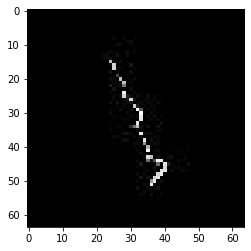

confidence for 23326 is 0.9999979


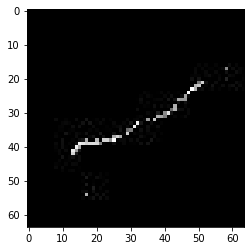

confidence for 23334 is 0.97606486


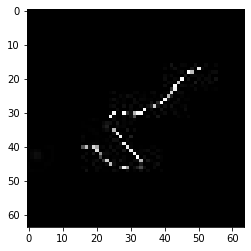

confidence for 23338 is 0.9998893


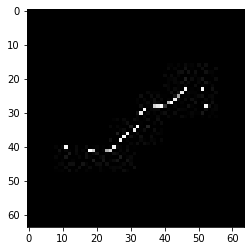

confidence for 23342 is 1.0


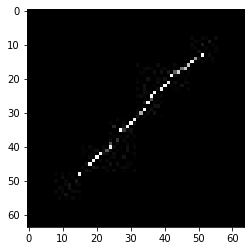

confidence for 23349 is 0.9942104


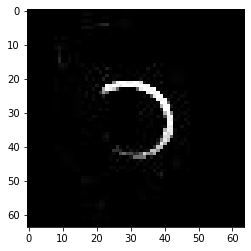

confidence for 23351 is 0.99971724


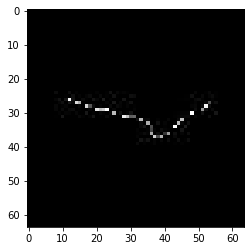

confidence for 23353 is 0.9996718


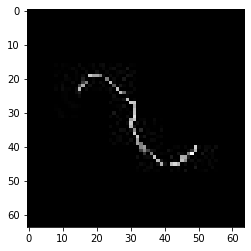

confidence for 23363 is 0.97263294


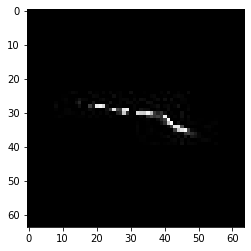

confidence for 23365 is 0.9294843


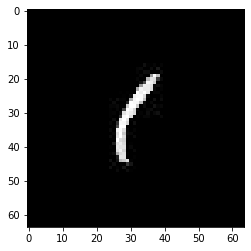

confidence for 23372 is 0.99995464


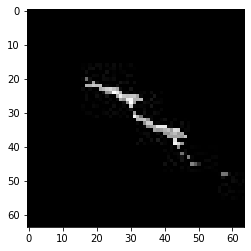

confidence for 23382 is 0.956088


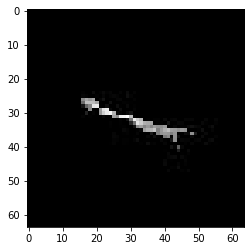

confidence for 23392 is 0.99993646


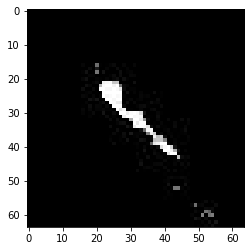

confidence for 23413 is 0.90787023


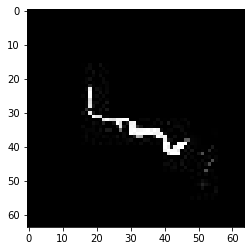

confidence for 23428 is 0.9999583


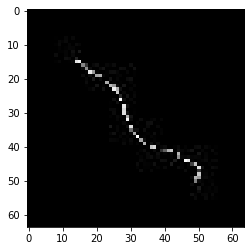

confidence for 23429 is 0.99439317


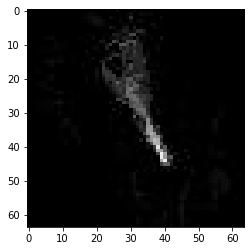

confidence for 23431 is 0.97998804


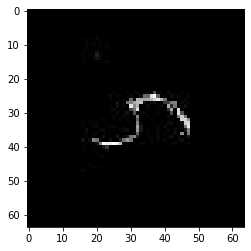

confidence for 23435 is 0.9335519


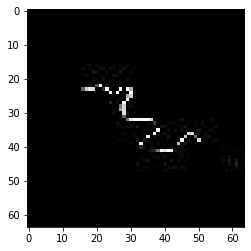

confidence for 23447 is 1.0


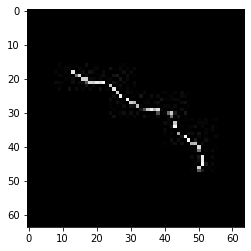

confidence for 23448 is 0.9999999


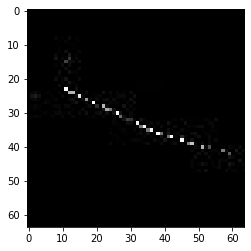

confidence for 23449 is 0.9989839


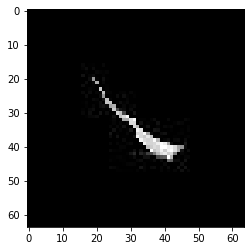

confidence for 23450 is 0.9942554


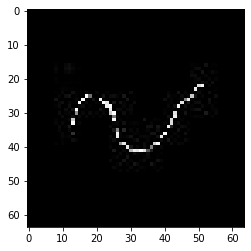

confidence for 23462 is 0.99957967


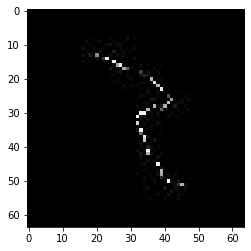

confidence for 23470 is 0.98637307


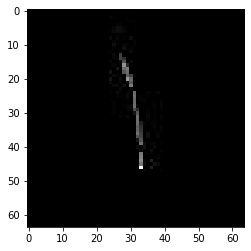

confidence for 23471 is 0.9500241


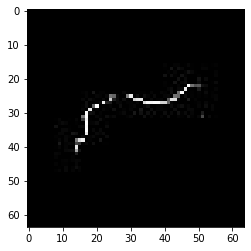

confidence for 23482 is 0.9999978


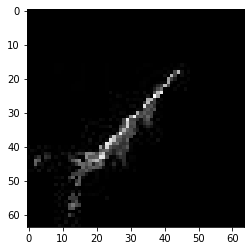

confidence for 23496 is 0.99659765


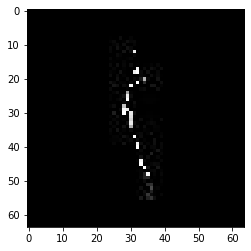

confidence for 23497 is 0.9598468


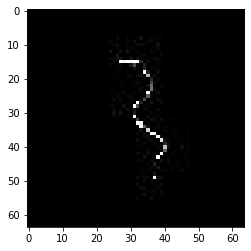

confidence for 23513 is 0.99954504


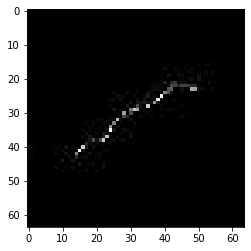

confidence for 23517 is 0.9993512


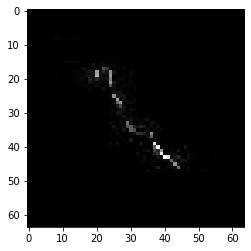

confidence for 23525 is 0.99659646


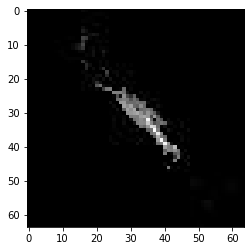

confidence for 23531 is 0.9081969


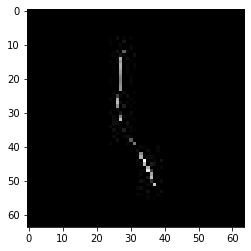

confidence for 23556 is 0.9052307


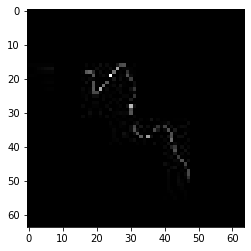

confidence for 23559 is 0.9892593


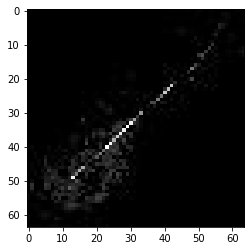

confidence for 23565 is 0.98010314


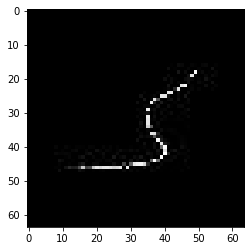

confidence for 23568 is 0.9886711


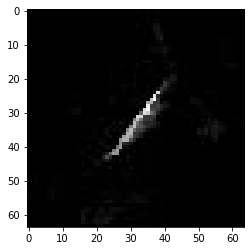

confidence for 23580 is 0.9988635


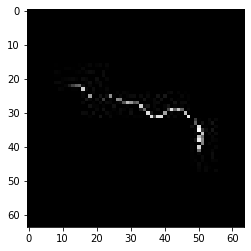

confidence for 23594 is 0.99870783


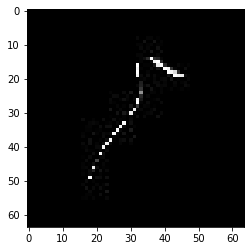

confidence for 23625 is 1.0


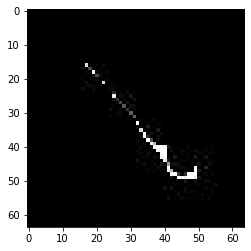

confidence for 23634 is 0.9999998


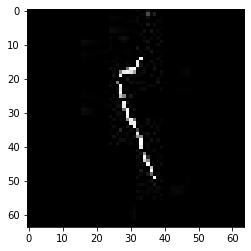

confidence for 23635 is 0.9999999


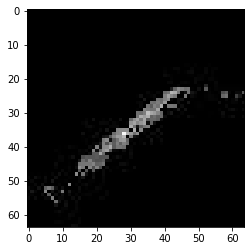

confidence for 23638 is 0.979404


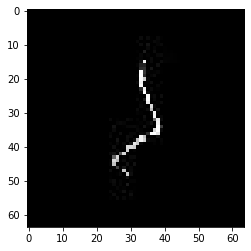

confidence for 23642 is 0.932912


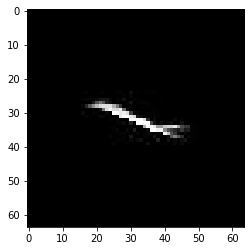

confidence for 23652 is 0.9999406


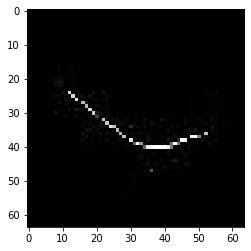

confidence for 23687 is 0.9963931


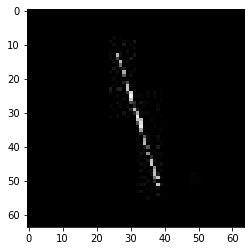

confidence for 23689 is 0.9289003


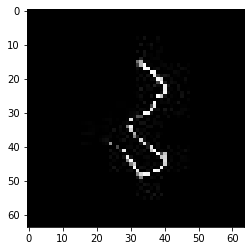

confidence for 23695 is 1.0


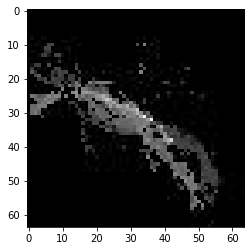

confidence for 23697 is 0.9783465


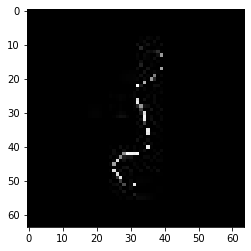

confidence for 23700 is 0.99999034


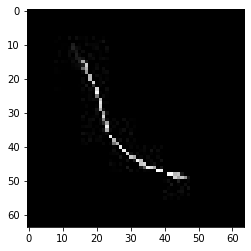

confidence for 23706 is 0.9500671


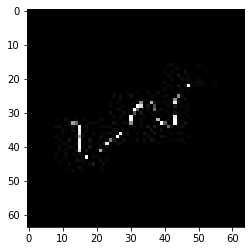

confidence for 23707 is 0.9474957


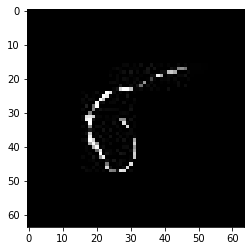

confidence for 23715 is 0.9998168


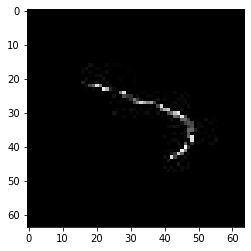

confidence for 23716 is 0.993522


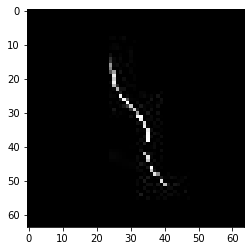

confidence for 23725 is 0.99800456


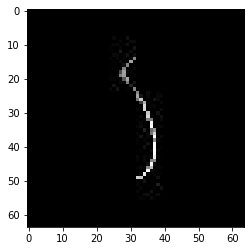

confidence for 23748 is 0.9816915


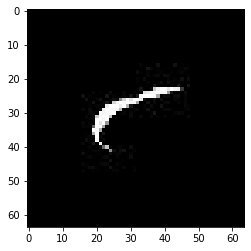

confidence for 23749 is 0.9833186


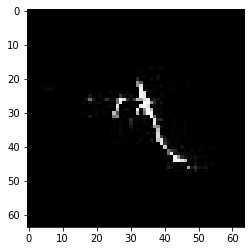

confidence for 23767 is 0.9998913


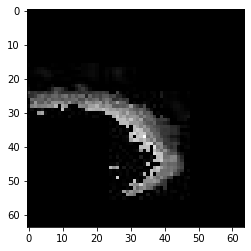

confidence for 23770 is 0.99356896


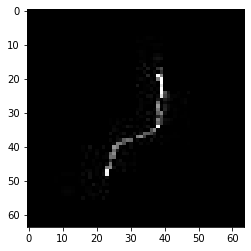

confidence for 23773 is 0.98419446


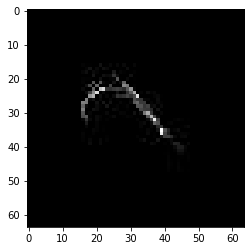

confidence for 23775 is 0.9986665


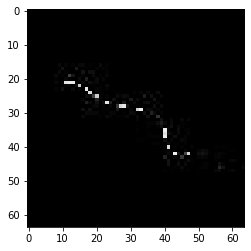

confidence for 23803 is 0.9999912


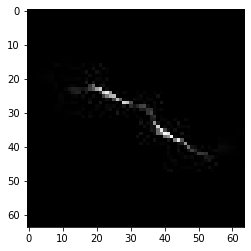

confidence for 23813 is 0.9958688


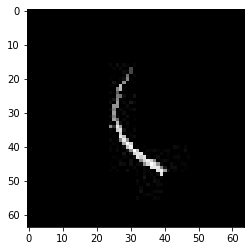

confidence for 23869 is 0.9963357


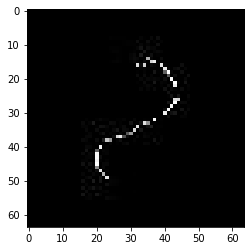

confidence for 23874 is 0.999862


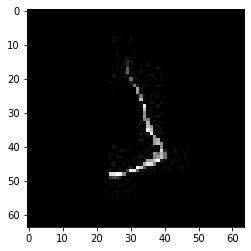

confidence for 23882 is 0.99999446


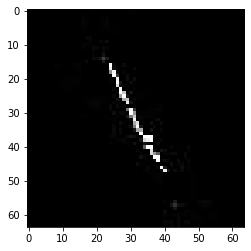

confidence for 23884 is 0.95191205


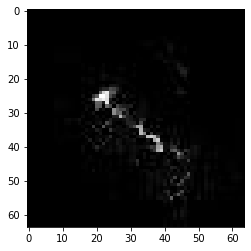

confidence for 23898 is 0.99779344


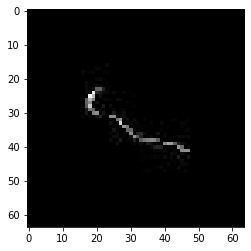

confidence for 23902 is 0.9551008


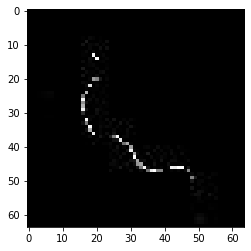

confidence for 23903 is 0.9999996


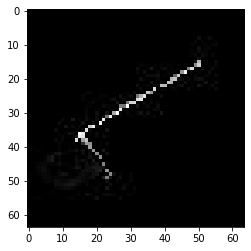

confidence for 23906 is 0.9998175


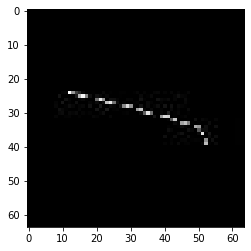

confidence for 23915 is 1.0


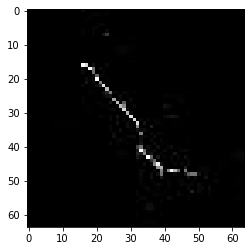

confidence for 23926 is 0.9793529


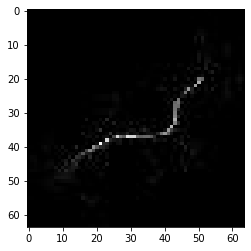

confidence for 23932 is 0.99965924


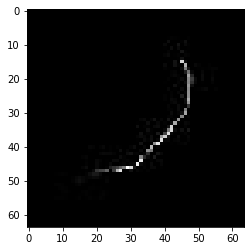

confidence for 23944 is 0.99841094


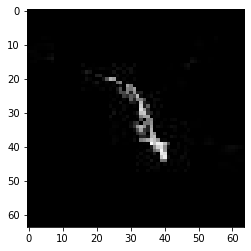

confidence for 23945 is 0.9998775


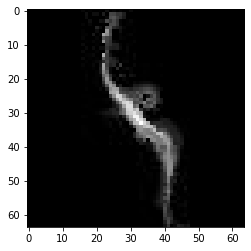

confidence for 23947 is 0.9988256


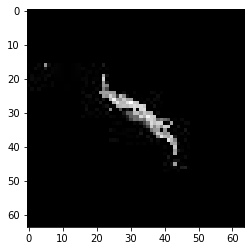

confidence for 23950 is 0.9999992


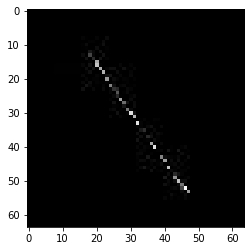

confidence for 23961 is 0.9929086


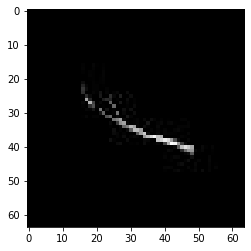

confidence for 23966 is 0.99999714


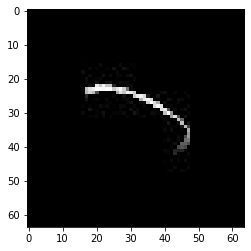

confidence for 23967 is 0.9952153


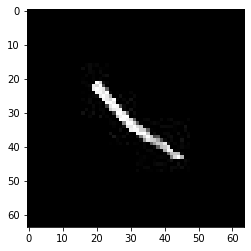

confidence for 23971 is 0.9988683


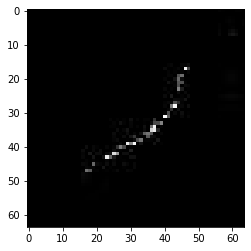

confidence for 23987 is 0.95936334


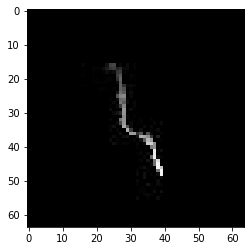

confidence for 23997 is 0.9585962


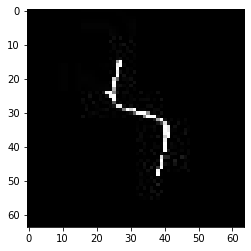

confidence for 24004 is 0.9764736


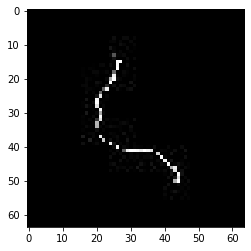

confidence for 24009 is 0.9999998


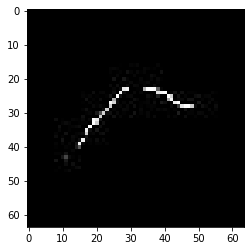

confidence for 24017 is 0.99998426


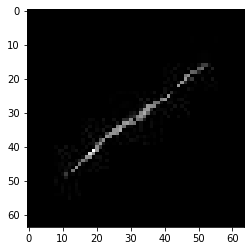

confidence for 24022 is 1.0


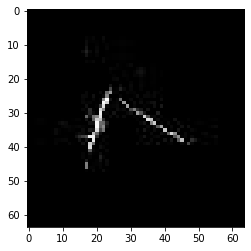

confidence for 24033 is 0.98163295


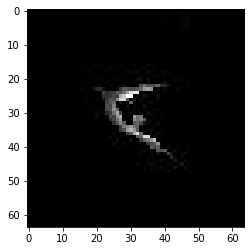

confidence for 24036 is 0.99995613


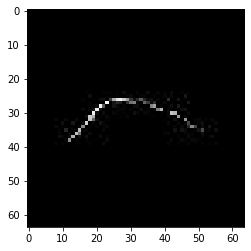

confidence for 24038 is 0.962791


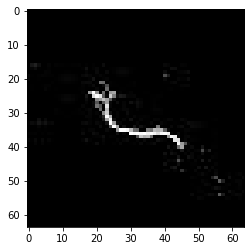

confidence for 24041 is 0.923977


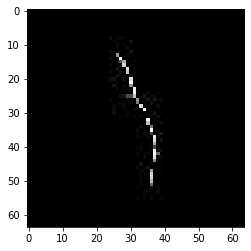

confidence for 24051 is 1.0


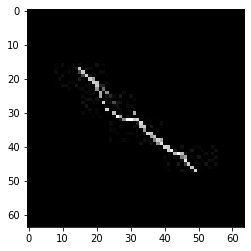

confidence for 24057 is 0.9666174


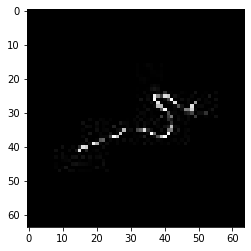

confidence for 24064 is 0.98261374


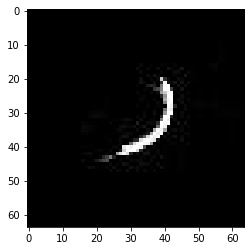

confidence for 24067 is 0.97950125


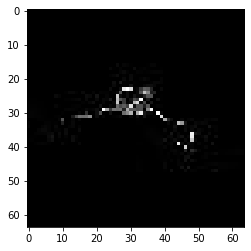

confidence for 24095 is 0.99872553


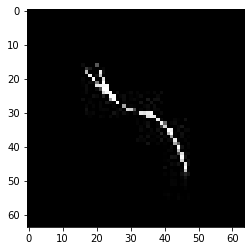

confidence for 24099 is 0.9976689


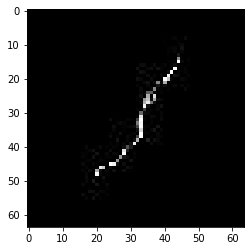

confidence for 24102 is 0.99999994


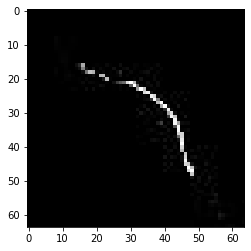

confidence for 24103 is 0.94326496


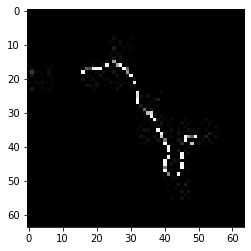

confidence for 24106 is 0.9200973


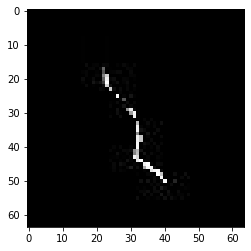

confidence for 24112 is 0.9753388


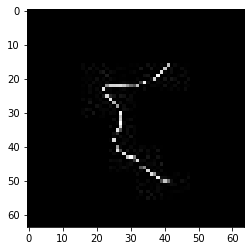

confidence for 24114 is 0.99998325


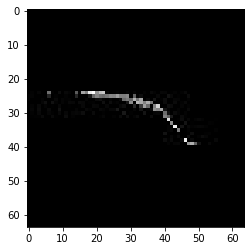

confidence for 24122 is 0.99998724


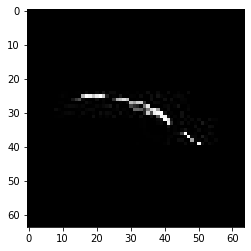

confidence for 24131 is 0.97567195


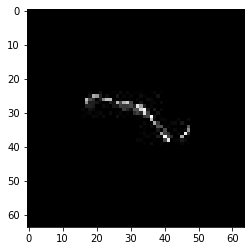

confidence for 24170 is 0.9871579


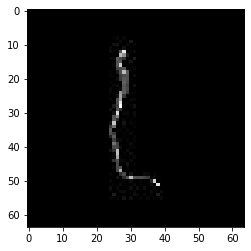

confidence for 24174 is 0.9520378


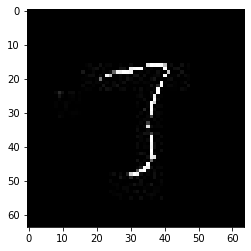

confidence for 24181 is 0.9999999


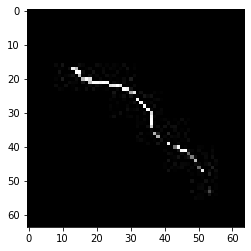

confidence for 24182 is 0.93825823


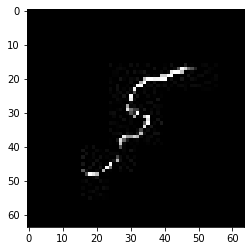

confidence for 24199 is 0.9980566


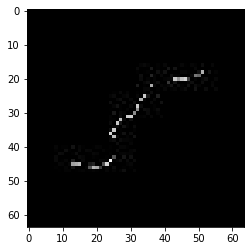

confidence for 24202 is 0.94336975


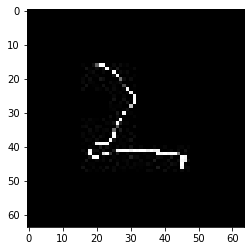

confidence for 24204 is 0.9967531


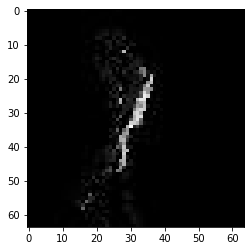

confidence for 24217 is 0.9944088


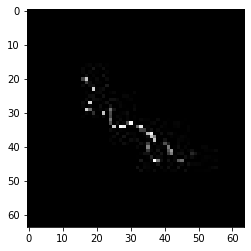

confidence for 24218 is 0.99999017


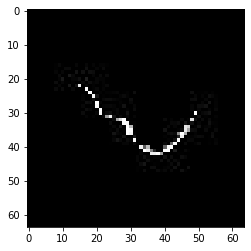

confidence for 24240 is 0.96788937


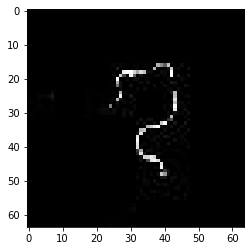

confidence for 24241 is 0.9757847


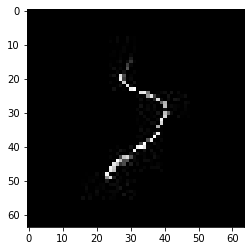

confidence for 24257 is 0.9934656


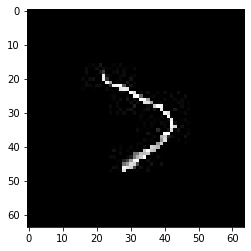

confidence for 24287 is 0.9743822


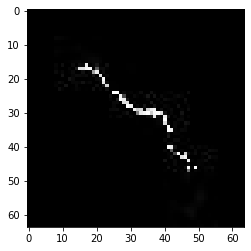

confidence for 24291 is 1.0


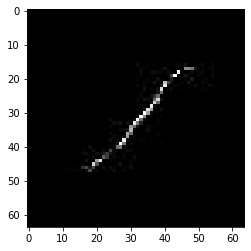

confidence for 24301 is 0.9827028


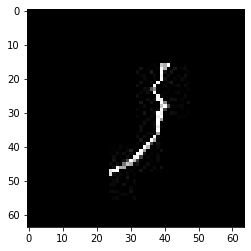

confidence for 24314 is 0.9862939


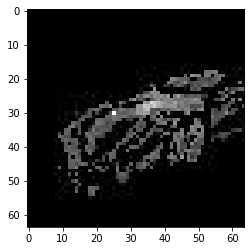

confidence for 24319 is 1.0


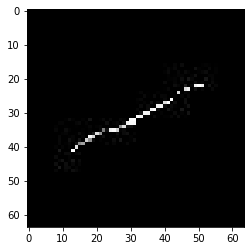

confidence for 24322 is 0.99431944


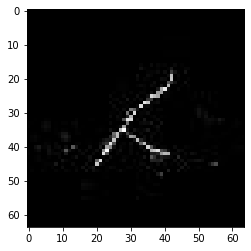

confidence for 24326 is 1.0


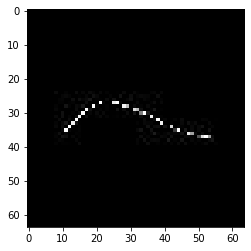

confidence for 24330 is 0.96474016


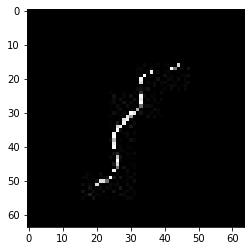

confidence for 24332 is 0.99362135


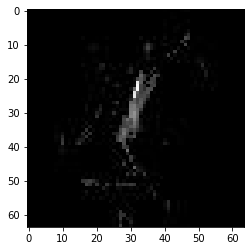

confidence for 24340 is 0.9946531


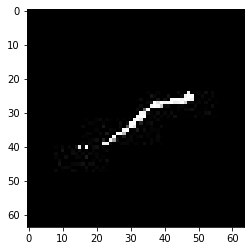

confidence for 24357 is 0.99999946


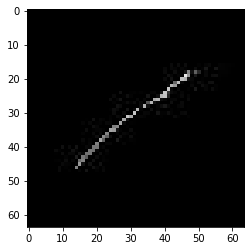

confidence for 24361 is 0.9995163


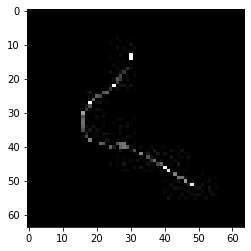

confidence for 24390 is 0.99387693


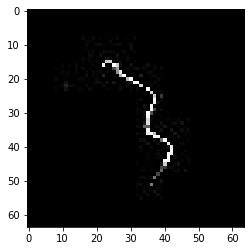

confidence for 24406 is 0.9999999


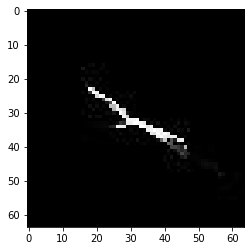

confidence for 24417 is 0.9950599


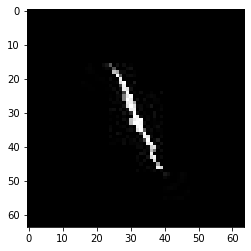

confidence for 24418 is 0.99828863


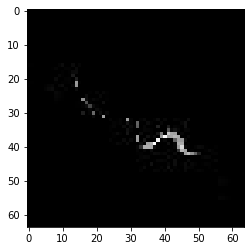

confidence for 24424 is 0.9278618


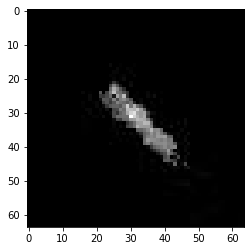

confidence for 24439 is 0.9951322


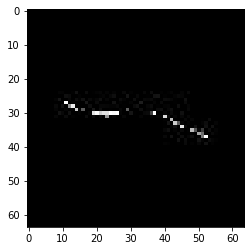

confidence for 24442 is 0.9992024


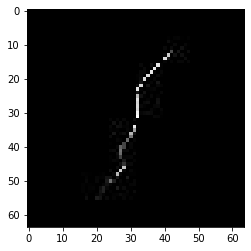

confidence for 24443 is 0.96927345


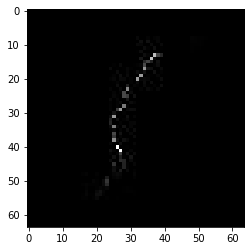

confidence for 24446 is 0.98031855


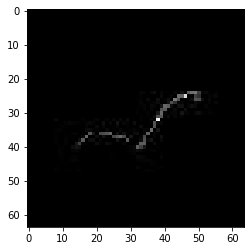

confidence for 24467 is 0.99999344


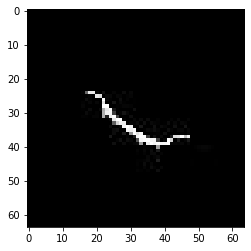

confidence for 24483 is 0.9999986


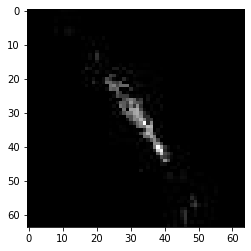

confidence for 24492 is 0.9297159


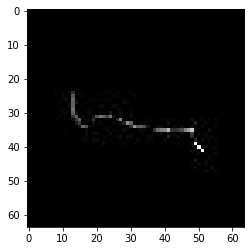

confidence for 24493 is 0.9987747


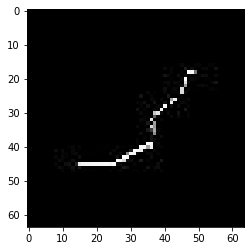

confidence for 24494 is 0.99995077


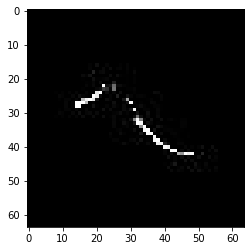

confidence for 24497 is 0.99826485


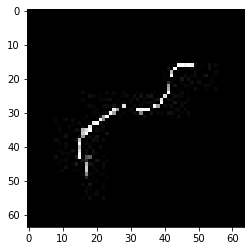

confidence for 24530 is 0.99999654


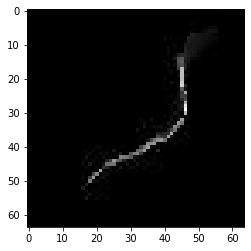

confidence for 24565 is 0.9467958


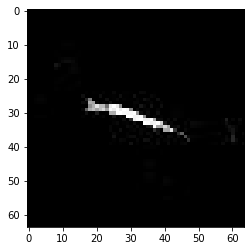

confidence for 24566 is 0.90871626


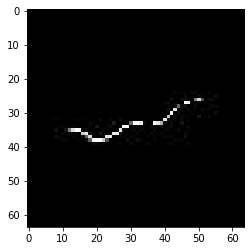

confidence for 24579 is 0.99999946


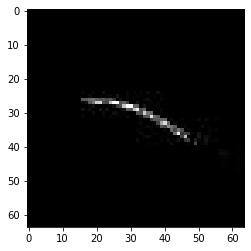

confidence for 24580 is 0.99999917


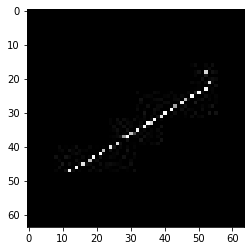

confidence for 24593 is 0.9903252


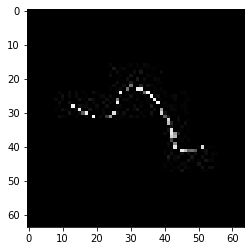

confidence for 24596 is 0.93839526


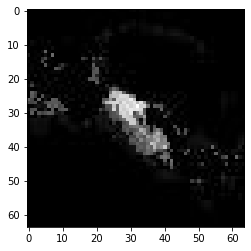

confidence for 24601 is 0.9268674


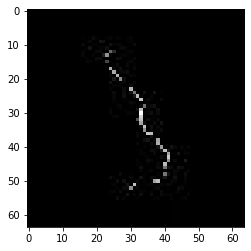

confidence for 24614 is 0.9216005


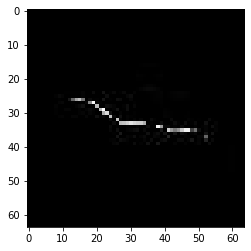

confidence for 24622 is 0.9981276


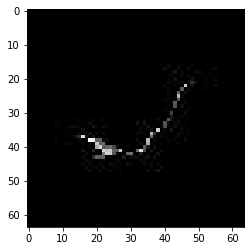

confidence for 24624 is 0.9962404


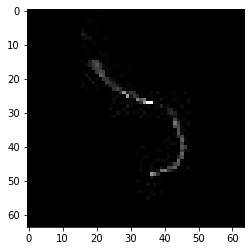

confidence for 24632 is 0.9355927


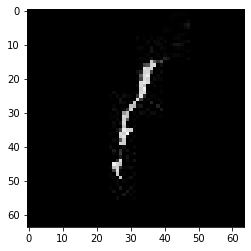

confidence for 24652 is 0.90401393


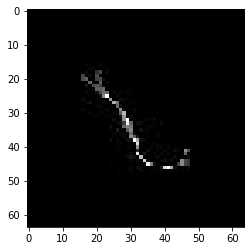

confidence for 24658 is 0.997941


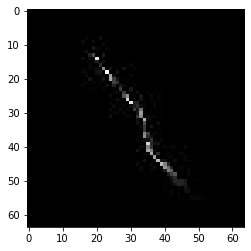

confidence for 24669 is 0.9990859


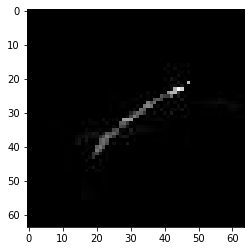

confidence for 24679 is 0.99663603


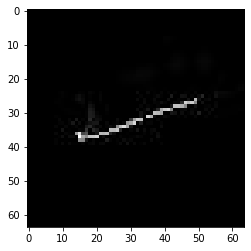

confidence for 24682 is 0.9957669


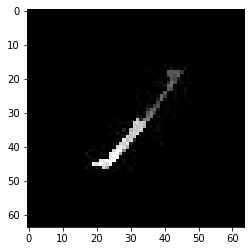

confidence for 24689 is 0.9185837


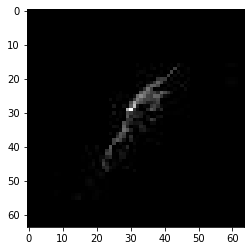

confidence for 24690 is 0.99277765


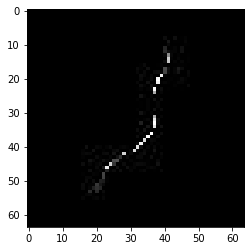

confidence for 24699 is 0.9325791


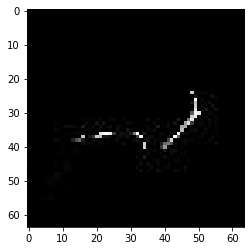

confidence for 24706 is 0.96937007


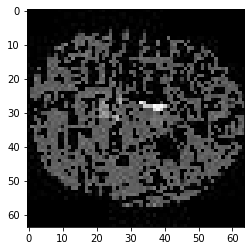

confidence for 24725 is 0.99898547


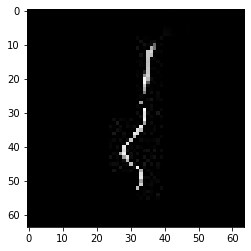

confidence for 24731 is 0.9859103


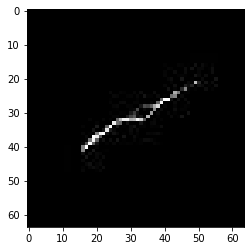

confidence for 24753 is 0.9852962


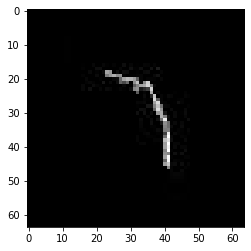

confidence for 24773 is 0.95612663


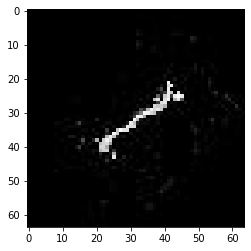

confidence for 24775 is 0.93078065


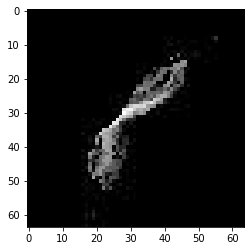

confidence for 24780 is 1.0


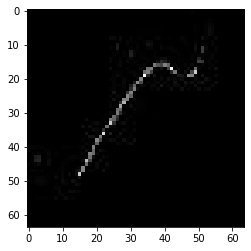

confidence for 24782 is 1.0


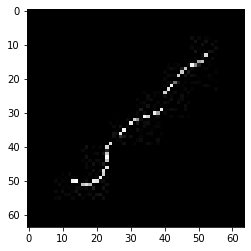

confidence for 24783 is 0.95015377


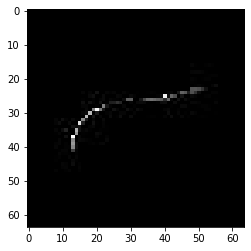

confidence for 24786 is 0.99353427


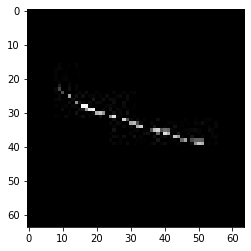

confidence for 24807 is 0.99604386


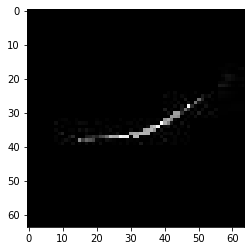

confidence for 24818 is 0.9979178


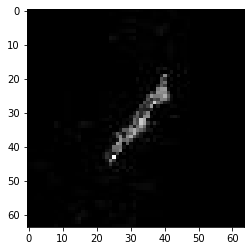

confidence for 24821 is 0.90443224


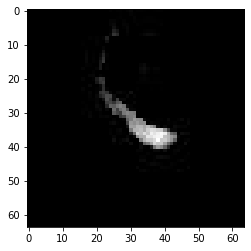

confidence for 24822 is 0.9868722


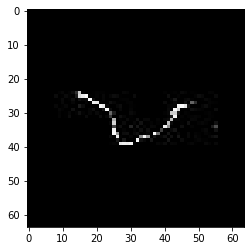

confidence for 24827 is 0.9999557


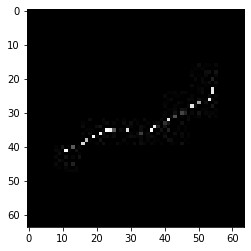

confidence for 24828 is 0.99997646


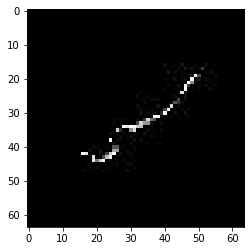

confidence for 24840 is 0.91055906


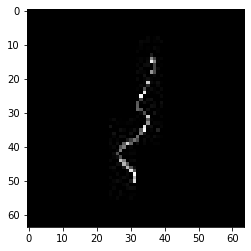

confidence for 24847 is 0.9974028


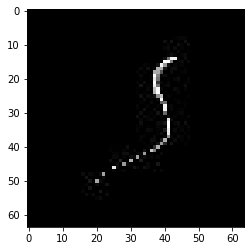

confidence for 24850 is 0.9993855


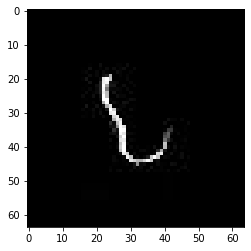

confidence for 24865 is 0.9964745


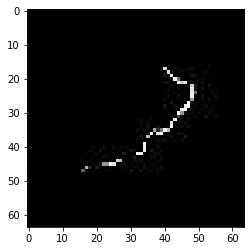

confidence for 24870 is 0.99919003


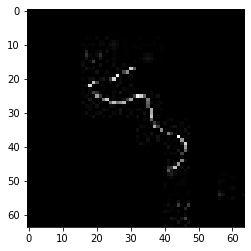

confidence for 24875 is 0.99997705


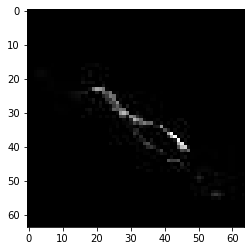

confidence for 24880 is 0.99996734


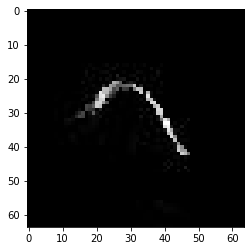

confidence for 24885 is 0.9032506


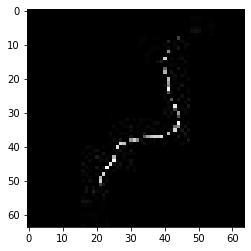

confidence for 24900 is 0.9902375


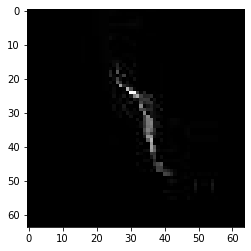

confidence for 24905 is 0.9995703


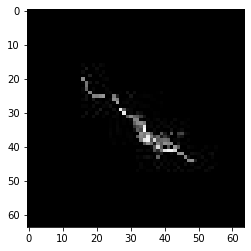

confidence for 24909 is 0.9076223


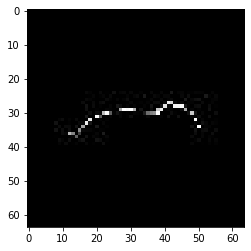

confidence for 24918 is 0.91157675


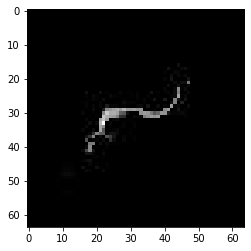

confidence for 24933 is 0.99796975


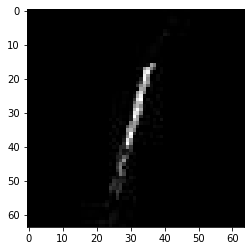

confidence for 24938 is 0.96946186


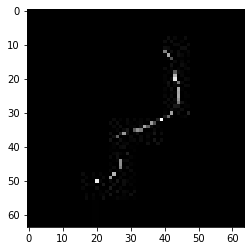

confidence for 24945 is 0.9387928


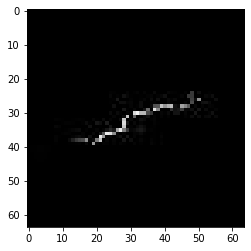

confidence for 24949 is 0.99314666


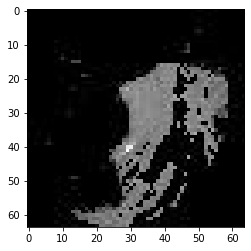

confidence for 24951 is 1.0


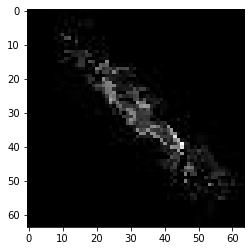

confidence for 24960 is 0.9813888


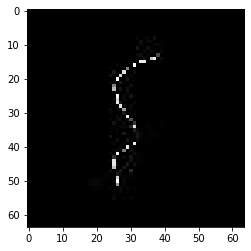

confidence for 24972 is 0.9947224


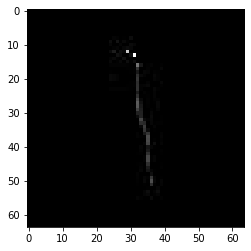

confidence for 24989 is 0.9928601


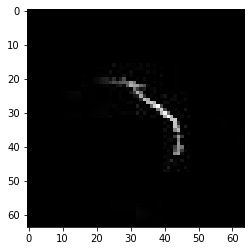

COMPLETE


In [7]:
for i in rivers:
    img_path = '../data/shonal_unlabeled/unlabeled/'+str(i[0])+'.jpeg'
    img = image.load_img(img_path, target_size=(64,64))
    plt.imshow(img)
    print("confidence for " +str(i[0])+ " is "+ str(i[1][0]))
    plt.show()
    img.save("../data/resnet50v2_predicted_threshold"+str(int(threshold*100))+"/river/"+str(i[0])+"-"+str(int(100*i[1][0]))+".jpeg", "JPEG")
    
for i in other:
    img_path = '../data/shonal_unlabeled/unlabeled/'+str(i[0])+'.jpeg'
    img = image.load_img(img_path, target_size=(64,64))
    img.save("../data/resnet50v2_predicted_threshold"+str(int(threshold*100))+"/other/"+str(i[0])+"-"+str(int(100*i[1][0]))+".jpeg", "JPEG")

print("COMPLETE")